# PFAS Toolbox - Comparison of Eurofins vs In-House

### 1) Libraries Import (REQUIRED)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import itertools
import scipy.stats
import statsmodels.api as sm
from statsmodels.graphics.agreement import mean_diff_plot
from scipy.stats import ks_2samp
from matplotlib.font_manager import FontProperties
from matplotlib.ticker import FixedLocator, FixedFormatter
from matplotlib.ticker import AutoMinorLocator
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D


### Default Font Settings

In [3]:
# Set default tick label size
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Set default font size for title, labels, and legend
plt.rcParams['axes.titlesize'] = 30  # Set the font size for plot titles
plt.rcParams['axes.labelsize'] = 24  # Set the font size for axis labels
plt.rcParams['legend.fontsize'] = 20  # Set the font size for legend
plt.rcParams['legend.title_fontsize'] = 22  # Set the font size for legend

# Set default font family to Arial
plt.rcParams['font.family'] = 'Arial'

# Set default font type for plot titles to bold
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'normal' # for bland-altman plots  
plt.rcParams['axes.labelweight'] = 'bold'  #for stack bars

### 2) Data Import (REQUIRED)

In [46]:
def read_excel_sheet(excel_file, sheet_name):
    """
    Read a specific sheet from an Excel file into a DataFrame.

    Args:
        excel_file (str): The path to the Excel file.
        sheet_name (str): The name of the sheet to read.

    Returns:
        pd.DataFrame or None: A DataFrame containing the sheet data or None if the sheet is not found.
    """
    try:
        # Load the specified sheet from the Excel file into a DataFrame
        df = pd.read_excel(excel_file, sheet_name=sheet_name, skiprows=1)
        return df
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None


#### 2.1) Read Macro

In [47]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/Database as of 07-29-2024.xlsm'
#Specify sheet name
sheet_name = 'PFAS Database'

#Call data import function
data_df = read_excel_sheet(excel_file_path, sheet_name)

data_df.head()


,Sampling point Date Component,Sample Number,Sampling Point,Sample Name,Sampled Date,Analysis,Component,Qualifiers,Result,Units,...,ChainLength,Pseudonym,Dominant Contributor,Sector,Depth,Edit Notes,Field,Notes,Region,Crop
0,ANODIZE SOLUTIONS (FPT)-43692.3333333333-10:2F...,259452.0,ANODIZE SOLUTIONS (FPT),NaN,2019-08-15 08:00:00,PFAS-CL,10:2Fluorotelomersulfonic Acid (Report),NaN,<9.40,ppt_wt_v,...,12.0,Metal Finisher B,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN
1,ANODIZE SOLUTIONS (FPT)-43692.3333333333-11Cl-...,259452.0,ANODIZE SOLUTIONS (FPT),NaN,2019-08-15 08:00:00,PFAS-CL,11Cl-PF3OUdS (Report),NaN,<4.70,ppt_wt_v,...,10.0,Metal Finisher B,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN
2,ANODIZE SOLUTIONS (FPT)-43692.3333333333-4:2Fl...,259452.0,ANODIZE SOLUTIONS (FPT),NaN,2019-08-15 08:00:00,PFAS-CL,4:2Fluorotelomersulfonic Acid (Report),NaN,<4.70,ppt_wt_v,...,6.0,Metal Finisher B,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN
3,ANODIZE SOLUTIONS (FPT)-43692.3333333333-6:2Fl...,259452.0,ANODIZE SOLUTIONS (FPT),NaN,2019-08-15 08:00:00,PFAS-CL,6:2Fluorotelomersulfonic Acid (Report),NaN,<19.0,ppt_wt_v,...,8.0,Metal Finisher B,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN
4,ANODIZE SOLUTIONS (FPT)-43692.3333333333-8:2Fl...,259452.0,ANODIZE SOLUTIONS (FPT),NaN,2019-08-15 08:00:00,PFAS-CL,8:2Fluorotelomersulfonic Acid (Report),NaN,<9.40,ppt_wt_v,...,10.0,Metal Finisher B,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/Database as of 07-29-2024.xlsm'
#Specify sheet name
sheet_name = 'Unreportable PFAS Database'

#Call data import function
data_df_unreported = read_excel_sheet(excel_file_path, sheet_name)

data_df_unreported.head()


,Sampling point Date Component,Sample Number,Sampling Point,Sample Name,Sampled Date,Analysis,Component,Qualifiers,Result,Units,...,Pseudonym,Dominant Contributor,Sector,Depth,Edit Notes,Field,Notes,Region,Crop,Batch
0,BEAV@CNLUS-4/17/2024 9:10 AM-11Cl-PF3OUdS (Rep...,493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,11Cl-PF3OUdS (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
1,BEAV@CNLUS-4/17/2024 9:10 AM-3:3 FTCA (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,3:3 FTCA (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
2,BEAV@CNLUS-4/17/2024 9:10 AM-4:2 FTS (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,4:2 FTS (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
3,BEAV@CNLUS-4/17/2024 9:10 AM-5:3 FTCA (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,5:3 FTCA (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
4,BEAV@CNLUS-4/17/2024 9:10 AM-6:2 FTS (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,6:2 FTS (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005


### 3) Import PFAS Compounds Attributes (REQUIRED)

In [7]:
# Import PFAS Attributes

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/Database as of 07-29-2024.xlsm'
#Specify sheet name
sheet_name = 'PFAS Attributes'

df_PFAS_Attributes = pd.read_excel(excel_file_path, sheet_name=sheet_name)


In [8]:
# Create a dictionary mapping PFAS Compounds to their corresponding Abbreviation (No need to change)
pfas_mapping = dict(zip(df_PFAS_Attributes['Database'], df_PFAS_Attributes['Abbrev']))

In [9]:
# Load the Excel file into a DataFrame
df = pd.read_excel("U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/PFAS Toolbox_ColorsPalette.xlsx",sheet_name='ColorPalette_NonTOP')

def parse_rgb(rgb_string):
    # Check if rgb_string is a string and not empty
    if isinstance(rgb_string, str) and rgb_string:
        # Remove parentheses and split the string by commas
        rgb_values = rgb_string.strip('()').split(',')
        # Convert each value to float and return as a tuple
        return tuple(int(value)/255 for value in rgb_values)
    else:
        # Handle the case where rgb_string is not a string or is empty
        return None  # or return (0, 0, 0, 0) for a default transparent color, for example



# Create a dictionary with PFAS compounds as keys and corresponding colors as values
compound_colors_dict = {compound: parse_rgb(rgb) for compound, rgb in zip(df['Database'], df['New_RGB'])}
compound_colors_dict_abbrev = {abbrev: parse_rgb(rgb) for abbrev, rgb in zip(df['Abbrev'], df['New_RGB'])}

#### 3.1) Define PFAS Compounds

In [10]:
pfas_compounds = data_df['PFAS Compound'].unique()

In [11]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Carboxylic Acid') & (df_PFAS_Attributes['Chain Class'] == 'Long')]
pfas_compounds_CarboxylicAcid_Long= subset['Database'].unique()
pfas_compounds_CarboxylicAcid_Long


array(['Perfluorodecanoic acid', 'Perfluorododecanoic acid',
       'Perfluorohexadecanoic acid', 'Perfluorononanoic acid',
       'Perfluorooctadecanoic acid', 'Perfluorooctanoic acid (PFOA)',
       'Perfluorotetradecanoic acid', 'Perfluorotridecanoic acid',
       'Perfluoroundecanoic acid', 'TOP-Perfluorodecanoic acid',
       'TOP-Perfluorododecanoic acid', 'TOP-Perfluorohexadecanoic acid',
       'TOP-Perfluorononanoic acid', 'TOP-Perfluorooctadecanoic acid',
       'TOP-Perfluorooctanoic acid (PFOA)',
       'TOP-Perfluorotetradecanoic acid', 'TOP-Perfluorotridecanoic acid',
       'TOP-Perfluoroundecanoic acid'], dtype=object)

In [12]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Carboxylic Acid') & (df_PFAS_Attributes['Chain Class'] == 'Short')]
pfas_compounds_CarboxylicAcid_Short= subset['Database'].unique()
pfas_compounds_CarboxylicAcid_Short


array(['Perfluorobutanoic acid', 'Perfluoroheptanoic acid',
       'Perfluorohexanoic acid', 'Perfluoropentanoic acid',
       'TOP-Perfluorobutanoic acid', 'TOP-Perfluoroheptanoic acid',
       'TOP-Perfluorohexanoic acid', 'TOP-Perfluoropentanoic acid'],
      dtype=object)

In [13]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Fluorotelomer Sulfonic Acid')]
pfas_compounds_FluorotelomerSulfonicAcid= subset['Database'].unique()
pfas_compounds_FluorotelomerSulfonicAcid

array(['10:2Fluorotelomersulfonic acid', '4:2 Fluorotelomersulfonic acid',
       '6:2 Fluorotelomersulfonic acid', '8:2 Fluorotelomersulfonic acid',
       'TOP-10:2Fluorotelomersulfonic acid',
       'TOP-4:2 Fluorotelomersulfonic acid',
       'TOP-6:2 Fluorotelomersulfonic acid',
       'TOP-8:2 Fluorotelomersulfonic acid'], dtype=object)

In [14]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Per- and Polyfluorother Carboxylic Acid')]
pfas_compounds_PerPolyfluorotherCarboxylicAcid= subset['Database'].unique()
pfas_compounds_PerPolyfluorotherCarboxylicAcid

array(['ADONA', 'HFPO-DA', 'Nonafluorodioxaheptanoic acid',
       'Perfluoromethoxybutanoic acid', 'Perfluoromethoxypropoanoic acid',
       'TOP-ADONA', 'TOP-HFPO-DA'], dtype=object)

In [15]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Perfluorooctane Sulfonamidoacetic Acid')]
pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid= subset['Database'].unique()
pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid

array(['NEtFOSAA', 'NMeFOSAA', 'TOP-NEtFOSAA', 'TOP-NMeFOSAA'],
      dtype=object)

In [16]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Perfluorooctane Sulfonamide Ethanol')]
pfas_compounds_PerfluorooctaneSulfonamideEthanol= subset['Database'].unique()
pfas_compounds_PerfluorooctaneSulfonamideEthanol

array(['NEtFOSE', 'NMeFOSE'], dtype=object)

In [17]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Sulfonic Acid') & (df_PFAS_Attributes['Chain Class'] == 'Long')]
pfas_compounds_SulfonicAcid_Long= subset['Database'].unique()
pfas_compounds_SulfonicAcid_Long

array(['Perfluorodecanesulfonic acid', 'Perfluorododecanesulfonic acid',
       'Perfluoroheptanesulfonic acid', 'Perfluorohexanesulfonic acid',
       'Perfluorononanesulfonic acid',
       'Perfluorooctanesulfonic acid (PFOS)',
       'TOP-Perfluorododecanesulfonic acid',
       'TOP-Perfluorodecanesulfonic acid',
       'TOP-Perfluoroheptanesulfonic acid',
       'TOP-Perfluorohexanesulfonic acid',
       'TOP-Perfluorononanesulfonic acid',
       'TOP-Perfluorooctanesulfonic acid (PFOS)'], dtype=object)

In [18]:
subset=df_PFAS_Attributes[(df_PFAS_Attributes['Class (1633)'] == 'Sulfonic Acid') & (df_PFAS_Attributes['Chain Class'] == 'Short')]
pfas_compounds_SulfonicAcid_Short= subset['Database'].unique()
pfas_compounds_SulfonicAcid_Short

array(['Perfluorobutanesulfonic acid', 'Perfluoropentanesulfonic acid',
       'TOP-Perfluoropentanesulfonic acid',
       'TOP-Perfluorobutanesulfonic acid'], dtype=object)

### 4) Prepare Subset of Data (Required)

#### 4.3) Prepare Subset of Data

In [49]:
## First, concatenate the two database

#Drop 'Batch' column since it's not in the original database
#data_df_unreported.drop('Batch',axis=1,inplace=True)
#Concatenate dataframes
data_df = pd.concat([data_df, data_df_unreported], axis=0)

In [54]:
len(data_df)

35795

In [55]:
# Condition for Prudential Cleanroom excluding specific compounds
condition1 = ~((data_df['Sample Location'] == 'Prudential Cleanroom') & (data_df['PFAS Compound'].isin(['NEtFOSE', 'NMeFOSE'])))

# Condition to exclude specific sample locations
condition2 = ~(data_df['Sample Location'].isin(['JAE Oregon Inc', 'Jireh Semiconductor Inc', 'Leupold & Stevens Inc','Blank']))

# Apply both conditions
data_df = data_df[condition1 & condition2]

In [56]:
# Create a mask where both conditions are met
mask = (data_df['Analysis'] == 'PFAS-CL') & (data_df['Qual Summary (Grade for filtering)'] == "Don't Use")

# Use the mask to select rows that do not meet these conditions
data_df = data_df[~mask]

# Create a mask where both conditions are met
mask = (data_df['Analysis'] == 'PFAS') & (data_df['Batch'] == "PFAS00001")
data_df = data_df[~mask]


In [57]:
# Create a mask where conditions are met
mask = (
    (data_df['Analysis'] == 'PFAS') &
    (data_df['Qual Summary (Grade for filtering)'] == "Don't Use") &
    (data_df['Qual Summary Grade Notes'].isin(['Method Development; Exceeds Cal Curve', 'Method Development; Dilution']))
)
data_df = data_df[~mask]


In [58]:
subset_df_InHouse=data_df[data_df['Analysis']== 'PFAS']

subset_df_Eurofins=data_df[data_df['Analysis']== 'PFAS-CL']


In [59]:
# Total number of rows in the DataFrame
total_rows = len(subset_df_InHouse)
print(total_rows)
# Grouping by 'Detection Class' and counting rows in each group
grouped_counts_InHouse = subset_df_InHouse.groupby('Detection Class').size()
# Calculate the percentage
grouped_percentage_InHouse = (grouped_counts_InHouse / total_rows) * 100

print('In-house records by Detection class')
# Display the count of rows for each 'Detection Class'
print(grouped_counts_InHouse)
print('In-house records percentage by Detection class')
print(grouped_percentage_InHouse)

2043
In-house records by Detection class
Detection Class
BDL      1433
Quant     610
dtype: int64
In-house records percentage by Detection class
Detection Class
BDL      70.141948
Quant    29.858052
dtype: float64


In [60]:
# Total number of rows in the DataFrame
total_rows = len(subset_df_Eurofins)
# Grouping by 'Detection Class' and counting rows in each group
grouped_counts_Eurofins = subset_df_Eurofins.groupby('Detection Class').size()
# Calculate the percentage
grouped_percentage_Eurofins = (grouped_counts_Eurofins / total_rows) * 100

print('Method records by Detection class')
# Display the count of rows for each 'Detection Class'
print(grouped_counts_Eurofins)
print('Method records percentage by Detection class')
print(grouped_percentage_Eurofins)

Method records by Detection class
Detection Class
BDL      11647
BQL       1687
Quant     1504
dtype: int64
Method records percentage by Detection class
Detection Class
BDL      78.494406
BQL      11.369457
Quant    10.136137
dtype: float64


In [61]:
#Create a unique key to be used to march records from one dataset to another
subset_df_InHouse['unique_key'] = subset_df_InHouse['Sample Location'].astype(str) + '_' + subset_df_InHouse['Type'].astype(str) + '_' + subset_df_InHouse['Sample Date'].astype(str) + '_' + subset_df_InHouse['PFAS Compound'].astype(str)
subset_df_Eurofins['unique_key'] = subset_df_Eurofins['Sample Location'].astype(str) + '_' + subset_df_Eurofins['Type'].astype(str) + '_' + subset_df_Eurofins['Sample Date'].astype(str) + '_' + subset_df_Eurofins['PFAS Compound'].astype(str)

<ipython-input-61-a9ff970f16f2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df_InHouse['unique_key'] = subset_df_InHouse['Sample Location'].astype(str) + '_' + subset_df_InHouse['Type'].astype(str) + '_' + subset_df_InHouse['Sample Date'].astype(str) + '_' + subset_df_InHouse['PFAS Compound'].astype(str)
<ipython-input-61-a9ff970f16f2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df_Eurofins['unique_key'] = subset_df_Eurofins['Sample Location'].astype(str) + '_' + subset_df_Eurofins['

In [62]:
#Merge datasets on unique_key
merged_df = pd.merge(subset_df_InHouse, subset_df_Eurofins, on='unique_key', how='inner', suffixes=('_InHouse', '_Eurofins'))


In [63]:
len(merged_df)

1850

In [64]:
sample_locations = merged_df['Sample Location_InHouse'].unique()

In [65]:
# Total number of rows in the DataFrame
total_rows = len(merged_df)
# Grouping by 'Detection Class' and counting rows in each group
grouped_counts_merged = merged_df.groupby('Detection Class_InHouse').size()
# Calculate the percentage
grouped_percentage_merged = (grouped_counts_merged / total_rows) * 100

print('In-house method records by Detection class on the merged dataset')
# Display the count of rows for each 'Detection Class'
print(grouped_counts_merged)
print('In-house method records percentage by Detection class on the merged dataset')
print(grouped_percentage_merged)

In-house method records by Detection class on the merged dataset
Detection Class_InHouse
BDL      1291
Quant     559
dtype: int64
In-house method records percentage by Detection class on the merged dataset
Detection Class_InHouse
BDL      69.783784
Quant    30.216216
dtype: float64


In [66]:
# Total number of rows in the DataFrame
total_rows = len(merged_df)
# Grouping by 'Detection Class' and counting rows in each group
grouped_counts_merged = merged_df.groupby('Detection Class_Eurofins').size()
# Calculate the percentage
grouped_percentage_merged = (grouped_counts_merged / total_rows) * 100

print('Eurofins method records by Detection class on the merged dataset')
# Display the count of rows for each 'Detection Class'
print(grouped_counts_merged)
print('Eurofins method records percentage by Detection class on the merged dataset')
print(grouped_percentage_merged)

Eurofins method records by Detection class on the merged dataset
Detection Class_Eurofins
BDL      1436
BQL       194
Quant     220
dtype: int64
Eurofins method records percentage by Detection class on the merged dataset
Detection Class_Eurofins
BDL      77.621622
BQL      10.486486
Quant    11.891892
dtype: float64


In [67]:
# Looking at the Detection Class combintation composition
grouped_data = merged_df.groupby(['Detection Class_InHouse', 'Detection Class_Eurofins']).size().reset_index(name='Count')
total_records = len(merged_df)
grouped_data['Percentage'] = (grouped_data['Count'] / total_records) * 100
print(grouped_data)


  Detection Class_InHouse Detection Class_Eurofins  Count  Percentage
0                     BDL                      BDL   1282   69.297297
1                     BDL                      BQL      9    0.486486
2                   Quant                      BDL    154    8.324324
3                   Quant                      BQL    185   10.000000
4                   Quant                    Quant    220   11.891892


In [68]:
quant_df = merged_df[(merged_df['Detection Class_InHouse'] == 'Quant') & (merged_df['Detection Class_Eurofins'] == 'Quant')]
quant_df['RPD']=(quant_df['Quant Only Incl Qual Flags_InHouse']-quant_df['Quant Only Incl Qual Flags_Eurofins'])/((quant_df['Quant Only Incl Qual Flags_InHouse']+quant_df['Quant Only Incl Qual Flags_Eurofins'])/2)
quant_df['PR']=(quant_df['Quant Only Incl Qual Flags_InHouse']/quant_df['Quant Only Incl Qual Flags_Eurofins'])*100

<ipython-input-68-b395ddbe371d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quant_df['RPD']=(quant_df['Quant Only Incl Qual Flags_InHouse']-quant_df['Quant Only Incl Qual Flags_Eurofins'])/((quant_df['Quant Only Incl Qual Flags_InHouse']+quant_df['Quant Only Incl Qual Flags_Eurofins'])/2)
<ipython-input-68-b395ddbe371d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quant_df['PR']=(quant_df['Quant Only Incl Qual Flags_InHouse']/quant_df['Quant Only Incl Qual Flags_Eurofins'])*100


In [34]:
#dfs: A dictionary where keys are the tab names and values are the DataFrames to write.
dfs = {'Pairs': merged_df,
       'Quants': quant_df
       }

#filename: The name of the Excel file to write to.
filename= 'ComparisonDataChecks.xlsx'
dfs_to_excel(dfs, filename)

NameError: name 'dfs_to_excel' is not defined

In [70]:
merged_df['Sample Location_Eurofins'].unique()

array(['Beaverton @ Cornelius', 'Chicken @ Sholls-Sherwood',
       'Gales @ Stringtown', 'McKay @ Padgett', 'TR @ Jurgens',
       'TR @ Golf Course', 'Rock @ East Main St',
       'Rock @ NE Cornelius Pass Rd', 'Fanno @ SW Bonita Rd',
       'Fanno @ SW North Dakota St', 'Fanno @ Bohmann',
       'Dawson @ Brookwood', 'Thomas Dairy Control Site Well',
       'Thomas Dairy Site 1 Well', 'Thomas Dairy Site 2 Well',
       'Thomas Dairy Site 3 Well', 'Fanno at Durham Rd',
       'Rock @ Brookwood', 'Scoggins Below Hagg', 'Dairy @ Hwy 8',
       'TR @ Boones Ferry', 'TR @ Fernhill', 'TR @ Cherry Grove',
       'Rock @ River Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Fanno @ Durham Park', 'Fanno @ SW Grant Ave',
       'Fanno @ SW 56th Ave', 'Durham Effluent', 'Rock Creek Effluent',
       'Forest Grove Effluent', 'Hillsboro Effluent', 'Intel Aloha F15',
       'Seals Unlimited Inc', 'Durham Influent', 'Rock Creek Influent',
       'Forest Grove Influent', 'Hillsboro Influent', 'Inte

## Descriptive Statistics

In [71]:
def dfs_to_excel(dfs, filename):
    """
    Write an array of dataframes to separate tabs in an Excel file.
    
    Parameters:
    - dfs: A dictionary where keys are the tab names and values are the DataFrames to write.
    - filename: The name of the Excel file to write to.
    """
    # Create a Pandas Excel writer using XlsxWriter as the engine.
    with pd.ExcelWriter(filename, engine='openpyxl') as writer:
        for tab_name, df in dfs.items():
            # Write each dataframe to a separate sheet
            df.to_excel(writer, sheet_name=tab_name)
    
    print(f"File '{filename}' has been written with {len(dfs)} tabs.")


In [72]:
quant_df_grouped = quant_df.groupby('PFAS Compound_InHouse')
stats_PercentRecovery = quant_df_grouped['PR'].describe()

# Define the recovery ranges
recovery_ranges = {
    '<40%': (quant_df['PR'] < 40),
    '>=40% to <70%': (quant_df['PR'] >= 40) & (quant_df['PR'] < 70),
    '>=70% to <130%': (quant_df['PR'] >= 70) & (quant_df['PR'] < 130),
    '>=130% to <150%': (quant_df['PR'] >= 130) & (quant_df['PR'] < 150),
    '>=150% to <200%': (quant_df['PR'] >= 150) & (quant_df['PR'] < 200),
    '>=200%': (quant_df['PR'] >= 200)
}

# Calculate the percentage of samples in each range
for label, mask in recovery_ranges.items():
    # Group by 'PFAS Compound_InHouse' and apply the mask, then get the count
    count_in_range = quant_df[mask].groupby('PFAS Compound_InHouse')['PR'].count()
    # Calculate percentage
    stats_PercentRecovery[label] = (count_in_range / quant_df_grouped['PR'].count()) * 100

# Convert dict_keys to a list before indexing & replace NaN with 0
stats_PercentRecovery[list(recovery_ranges.keys())] = stats_PercentRecovery[list(recovery_ranges.keys())].fillna(0)

# Convert 'count' column to integers
stats_PercentRecovery['count'] = stats_PercentRecovery['count'].fillna(0).astype(int)

# Define the float columns (you can automate or manually specify based on your data)
float_columns = [col for col in stats_PercentRecovery.columns if col not in ['count']]

# Round float columns to one decimal place
stats_PercentRecovery[float_columns] = stats_PercentRecovery[float_columns].round(1)

# Replace the index using the mapping dictionary
stats_PercentRecovery.index = stats_PercentRecovery.index.map(pfas_mapping)

# Assuming 'stats_PercentRecovery' is your DataFrame
stats_PercentRecovery.index.name = 'PFAS Compound'

stats_PercentRecovery


,count,mean,std,min,25%,50%,75%,max,<40%,>=40% to <70%,>=70% to <130%,>=130% to <150%,>=150% to <200%,>=200%
PFAS Compound,,,,,,,,,,,,,,
3:3FTCA,1,36.0,NaN,36.0,36.0,36.0,36.0,36.0,100.0,0.0,0.0,0.0,0.0,0.0
5:3FTCA,2,137.0,34.3,112.8,124.9,137.0,149.2,161.3,0.0,0.0,50.0,0.0,50.0,0.0
8:2FTS,1,92.7,NaN,92.7,92.7,92.7,92.7,92.7,0.0,0.0,100.0,0.0,0.0,0.0
NEtFOSAA,1,94.7,NaN,94.7,94.7,94.7,94.7,94.7,0.0,0.0,100.0,0.0,0.0,0.0
NMeFOSAA,1,152.6,NaN,152.6,152.6,152.6,152.6,152.6,0.0,0.0,0.0,0.0,100.0,0.0
PFBS,29,129.1,18.8,95.3,118.8,128.6,139.8,174.2,0.0,0.0,51.7,34.5,13.8,0.0
PFBA,7,96.7,42.3,27.6,74.3,102.9,126.7,144.6,14.3,14.3,57.1,14.3,0.0,0.0
PFDA,4,128.8,29.1,112.8,113.3,115.1,130.6,172.4,0.0,0.0,75.0,0.0,25.0,0.0
PFDoA,2,146.6,89.7,83.1,114.8,146.6,178.3,210.0,0.0,0.0,50.0,0.0,0.0,50.0


### By Type:

In [80]:
# Assuming 'quant_df' is your DataFrame and 'Type_InHouse' is the correct column name

# Group by 'Type_InHouse' instead of 'PFAS Compound_InHouse'
quant_df_grouped = quant_df.groupby('Type_InHouse')

# Calculate descriptive statistics for Percent Recovery
stats_PercentRecovery = quant_df_grouped['PR'].describe()

# Define the ranges for recovery percentage
recovery_ranges = {
    '<40%': [0, 40],
    '>=40% to <70%': [40, 70],
    '>=70% to <130%': [70, 130],
    '>=130% to <150%': [130, 150],
    '>=150% to <200%': [150, 200],
    '>=200%': [200, float('inf')]
}

# Calculate the percentage of samples within each range for each sample type
for label, (low, high) in recovery_ranges.items():
    # Using `pd.cut` to categorize the data into bins
    condition = (quant_df['PR'] >= low) & (quant_df['PR'] < high)
    count_in_range = quant_df_grouped.apply(lambda x: x['PR'][condition].count())
    stats_PercentRecovery[label] = (count_in_range / quant_df_grouped['PR'].count()) * 100

# Convert dict_keys to a list before indexing & replace NaN with 0
stats_PercentRecovery[list(recovery_ranges.keys())] = stats_PercentRecovery[list(recovery_ranges.keys())].fillna(0)

# Formatting columns: 'count' as int and floats with one decimal place
stats_PercentRecovery['count'] = stats_PercentRecovery['count'].astype(int)
float_cols = stats_PercentRecovery.columns.drop('count')  # Assuming all other columns are float
stats_PercentRecovery[float_cols] = stats_PercentRecovery[float_cols].applymap(lambda x: f"{x:.1f}")

# Optional: Rename index to 'Sample Type'
stats_PercentRecovery.index.name = 'Sample Type'

# Print or return the updated DataFrame
stats_PercentRecovery


,count,mean,std,min,25%,50%,75%,max,<40%,>=40% to <70%,>=70% to <130%,>=130% to <150%,>=150% to <200%,>=200%
Sample Type,,,,,,,,,,,,,,
Ambient,38,115.3,18.8,82.4,99.6,118.4,130.0,158.9,0.0,0.0,73.7,23.7,2.6,0.0
Effluent,27,117.0,15.4,82.5,104.7,119.0,130.3,143.2,0.0,0.0,74.1,25.9,0.0,0.0
Groundwater,30,116.5,25.5,65.4,101.7,110.0,136.5,167.6,0.0,3.3,63.3,16.7,16.7,0.0
Influent,15,116.4,27.3,28.5,111.9,121.2,127.6,145.7,6.7,0.0,73.3,20.0,0.0,0.0
Outfall of Industry,55,123.4,36.2,27.6,101.4,123.3,144.0,210.0,3.6,3.6,56.4,14.5,20.0,1.8
Urban Creek,55,123.1,14.4,96.8,114.5,121.3,130.1,183.6,0.0,0.0,74.5,20.0,5.5,0.0


In [92]:
# Group by both 'Type_InHouse' and 'PFAS Compound_InHouse'
quant_df_grouped = quant_df.groupby(['Type_InHouse', 'PFAS Compound_InHouse'])

# Calculate descriptive statistics for Percent Recovery for each group
stats_PercentRecovery = quant_df_grouped['PR'].describe()

# Define the ranges for recovery percentage
recovery_ranges = {
    '<40%': [0, 40],
    '>=40% to <70%': [40, 70],
    '>=70% to <130%': [70, 130],
    '>=130% to <150%': [130, 150],
    '>=150% to <200%': [150, 200],
    '>=200%': [200, float('inf')]
}

# Calculate the percentage of samples within each range for each group
for label, (low, high) in recovery_ranges.items():
    # Use `pd.cut` to categorize data within ranges
    condition = (quant_df['PR'] >= low) & (quant_df['PR'] < high)
    # Apply condition to grouped data
    count_in_range = quant_df_grouped.apply(lambda x: x['PR'][condition].count())
    stats_PercentRecovery[label] = (count_in_range / quant_df_grouped['PR'].count()) * 100

# Fill NaN values in recovery ranges columns with 0
stats_PercentRecovery[list(recovery_ranges.keys())] = stats_PercentRecovery[list(recovery_ranges.keys())].fillna(0)

# Formatting columns: 'count' as int and floats with one decimal place
stats_PercentRecovery['count'] = stats_PercentRecovery['count'].astype(int)
float_cols = stats_PercentRecovery.columns.drop('count')  # Assuming all other columns are float
stats_PercentRecovery[float_cols] = stats_PercentRecovery[float_cols].applymap(lambda x: f"{x:.1f}")

# Get the current levels and codes of the index
levels = stats_PercentRecovery.index.levels
codes = stats_PercentRecovery.index.codes

# Replace the second level of the index using the pfas_mapping dictionary
new_second_level = [pfas_mapping.get(item, item) for item in levels[1]]

# Construct the new MultiIndex with the updated second level
new_index = pd.MultiIndex(levels=[levels[0], new_second_level],
                          codes=codes,
                          names=stats_PercentRecovery.index.names)

# Set the new index to the dataframe
stats_PercentRecovery.index = new_index

# Print or return the updated DataFrame
stats_PercentRecovery.loc['Groundwater']


,count,mean,std,min,25%,50%,75%,max,<40%,>=40% to <70%,>=70% to <130%,>=130% to <150%,>=150% to <200%,>=200%
PFAS Compound_InHouse,,,,,,,,,,,,,,
PFBS,7,119.8,22.2,96.2,102.5,110.5,137.8,151.4,0.0,0.0,57.1,28.6,14.3,0.0
PFHpA,1,101.6,nan,101.6,101.6,101.6,101.6,101.6,0.0,0.0,100.0,0.0,0.0,0.0
PFHxS,7,127.3,28.2,100.3,104.3,115.1,149.8,167.6,0.0,0.0,57.1,14.3,28.6,0.0
PFHxA,5,90.2,20.7,65.4,78.9,85.7,102.3,118.7,0.0,20.0,80.0,0.0,0.0,0.0
PFOS,1,109.4,nan,109.4,109.4,109.4,109.4,109.4,0.0,0.0,100.0,0.0,0.0,0.0
PFOA,7,123.6,25.2,81.8,110.4,123.0,143.7,151.9,0.0,0.0,57.1,14.3,28.6,0.0
PFPeA,2,119.1,23.9,102.3,110.7,119.1,127.6,136.0,0.0,0.0,50.0,50.0,0.0,0.0


In [87]:
# Assuming 'quant_df' is your DataFrame
# Create a new column that combines 'Ambient' and 'Urban Creek' into one group
quant_df['Combined_Type'] = quant_df['Type_InHouse'].replace({
    'Ambient': 'Ambient/Urban Creek',
    'Urban Creek': 'Ambient/Urban Creek'
})

# Group by this new column and 'PFAS Compound_InHouse'
grouped = quant_df.groupby(['Combined_Type', 'PFAS Compound_InHouse'])

# Calculate statistics for Percent Recovery
stats_PercentRecovery = grouped['PR'].describe()

# Example for calculating percent recovery ranges (assuming 'recovery_ranges' is defined)
for label, (low, high) in recovery_ranges.items():
    recovery_condition = grouped['PR'].apply(lambda x: ((x >= low) & (x < high)).sum())
    total_count = grouped['PR'].count()
    stats_PercentRecovery[label] = (recovery_condition / total_count * 100).fillna(0)

# Format the DataFrame if necessary (e.g., setting count as integer, formatting decimals)
stats_PercentRecovery['count'] = stats_PercentRecovery['count'].astype(int)
stats_PercentRecovery = stats_PercentRecovery.round(1)

# Get the current levels and codes of the index
levels = stats_PercentRecovery.index.levels
codes = stats_PercentRecovery.index.codes

# Replace the second level of the index using the pfas_mapping dictionary
new_second_level = [pfas_mapping.get(item, item) for item in levels[1]]

# Construct the new MultiIndex with the updated second level
new_index = pd.MultiIndex(levels=[levels[0], new_second_level],
                          codes=codes,
                          names=stats_PercentRecovery.index.names)

# Set the new index to the dataframe
stats_PercentRecovery.index = new_index


# Filter for 'Ambient/Urban Creek' if needed to display only that group
ambient_urban_creek_recovery_stats = stats_PercentRecovery.loc['Ambient/Urban Creek']

# Print or further process the stats for 'Ambient/Urban Creek'
ambient_urban_creek_recovery_stats


<ipython-input-87-a7015fc3716e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quant_df['Combined_Type'] = quant_df['Type_InHouse'].replace({


,count,mean,std,min,25%,50%,75%,max,<40%,>=40% to <70%,>=70% to <130%,>=130% to <150%,>=150% to <200%,>=200%
PFAS Compound_InHouse,,,,,,,,,,,,,,
PFBS,13,126.9,14.6,95.3,123.0,125.3,133.4,157.2,0.0,0.0,61.5,30.8,7.7,0.0
PFBA,1,123.6,NaN,123.6,123.6,123.6,123.6,123.6,0.0,0.0,100.0,0.0,0.0,0.0
PFHpA,11,113.4,14.1,92.1,101.3,109.5,126.4,130.5,0.0,0.0,81.8,18.2,0.0,0.0
PFHxS,12,119.8,16.2,93.7,112.0,116.3,122.9,158.9,0.0,0.0,83.3,8.3,8.3,0.0
PFHxA,16,113.6,21.6,92.2,99.6,113.2,117.7,183.6,0.0,0.0,87.5,6.2,6.2,0.0
PFOS,16,118.6,14.7,82.4,111.9,120.0,126.4,145.5,0.0,0.0,81.2,18.8,0.0,0.0
PFOA,14,127.4,16.5,95.9,120.7,130.3,137.6,151.5,0.0,0.0,50.0,42.9,7.1,0.0
PFPeA,10,119.5,14.8,93.9,111.1,122.8,130.6,137.5,0.0,0.0,70.0,30.0,0.0,0.0


### By Sample Location

In [93]:
# Define recovery ranges
recovery_ranges = {
    '<40%': (0, 40),
    '>=40 to <70%': (40, 70),
    '>=70 to <130%': (70, 130),
    '>=130 to <150%': (130, 150),
    '>=150 to <200%': (150, 200),
    '>200%': (200, np.inf)
}

# Group the data by 'Sample Location_InHouse' and 'PFAS Compound_InHouse'
grouped = quant_df.groupby(['Sample Location_InHouse', 'PFAS Compound_InHouse'])

# Calculate descriptive statistics for Percent Recovery
stats_PercentRecovery = grouped['PR'].describe()

# Calculate percent recovery ranges
for label, (low, high) in recovery_ranges.items():
    count_in_range = grouped['PR'].apply(lambda x: ((x >= low) & (x < high)).sum())
    total_count = grouped['PR'].count()
    stats_PercentRecovery[label] = (count_in_range / total_count * 100).fillna(0)

# Format the DataFrame for display
stats_PercentRecovery['count'] = stats_PercentRecovery['count'].astype(int)
stats_PercentRecovery = stats_PercentRecovery.round(1)


# Get the current levels and codes of the index
levels = stats_PercentRecovery.index.levels
codes = stats_PercentRecovery.index.codes

# Replace the second level of the index using the pfas_mapping dictionary
new_second_level = [pfas_mapping.get(item, item) for item in levels[1]]

# Construct the new MultiIndex with the updated second level
new_index = pd.MultiIndex(levels=[levels[0], new_second_level],
                          codes=codes,
                          names=stats_PercentRecovery.index.names)

# Set the new index to the dataframe
stats_PercentRecovery.index = new_index

stats_PercentRecovery



count   mean   std    min  \
Sample Location_InHouse  PFAS Compound_InHouse                              
Beaverton @ Cornelius    PFBS                       1  133.4   NaN  133.4   
                         PFHpA                      1   99.6   NaN   99.6   
                         PFHxS                      1  111.7   NaN  111.7   
                         PFHxA                      1  103.2   NaN  103.2   
                         PFOS                       1  145.5   NaN  145.5   
...                                               ...    ...   ...    ...   
Thomas Dairy Site 3 Well PFHxS                      2  120.3  28.3  100.3   
                         PFHxA                      2  110.5  11.6  102.3   
                         PFOS                       1  109.4   NaN  109.4   
                         PFOA                       2  137.4  20.4  123.0   
                         PFPeA                      2  119.1  23.9  102.3   

                                                  25%    50%    75%    max  \
Sample Location_InHouse  PFAS Compound_InHouse                               
Beaverton @ Cornelius    PFBS                   133.4  133.4  133.4  133.4   
                         PFHpA                   99.6   99.6   99.6   99.6   
                         PFHxS                  111.7  111.7  111.7  111.7   
                         PFHxA                  103.2  103.2  103.2  103.2   
                         PFOS                   145.5  145.5  145.5  145.5   
...                                               ...    ...    ...    ...   
Thomas Dairy Site 3 Well PFHxS                  110.3  120.3  130.3  140.3   
                         PFHxA                  106.4  110.5  114.6  118.7   
                         PFOS                   109.4  109.4  109.4  109.4   
                         PFOA                   130.2  137.4  144.7  151.9   
                         PFPeA                  110.7  119.1  127.6  136.0   

                                                <40%  >=40 to <70%  \
Sample Location_InHouse  PFAS Compound_InHouse                       
Beaverton @ Cornelius    PFBS                    0.0           0.0   
                         PFHpA                   0.0           0.0   
                         PFHxS                   0.0           0.0   
                         PFHxA                   0.0           0.0   
                         PFOS                    0.0           0.0   
...                                              ...           ...   
Thomas Dairy Site 3 Well PFHxS                   0.0           0.0   
                         PFHxA                   0.0           0.0   
                         PFOS                    0.0           0.0   
                         PFOA                    0.0           0.0   
                         PFPeA                   0.0           0.0   

                                                >=70 to <130%  >=130 to <150%  \
Sample Location_InHouse  PFAS Compound_InHouse                                  
Beaverton @ Cornelius    PFBS                             0.0           100.0   
                         PFHpA                          100.0             0.0   
                         PFHxS                          100.0             0.0   
                         PFHxA                          100.0             0.0   
                         PFOS                             0.0           100.0   
...                                                       ...             ...   
Thomas Dairy Site 3 Well PFHxS                           50.0            50.0   
                         PFHxA                          100.0             0.0   
                         PFOS                           100.0             0.0   
                         PFOA                            50.0             0.0   
                         PFPeA                           50.0            50.0   

                                                >=150 to <200%  >2

In [94]:
quant_df['Sample Location_InHouse'].unique()

array(['Beaverton @ Cornelius', 'McKay @ Padgett', 'TR @ Jurgens',
       'Rock @ East Main St', 'Rock @ NE Cornelius Pass Rd',
       'Fanno @ SW Bonita Rd', 'Fanno @ SW North Dakota St',
       'Fanno @ Bohmann', 'Dawson @ Brookwood',
       'Thomas Dairy Control Site Well', 'Thomas Dairy Site 1 Well',
       'Thomas Dairy Site 2 Well', 'Thomas Dairy Site 3 Well',
       'Fanno at Durham Rd', 'Rock @ Brookwood', 'TR @ Boones Ferry',
       'Rock @ River Rd', 'Fanno @ Durham Park', 'Fanno @ SW Grant Ave',
       'Fanno @ SW 56th Ave', 'Durham Effluent', 'Rock Creek Effluent',
       'Forest Grove Effluent', 'Hillsboro Effluent',
       'Seals Unlimited Inc', 'Durham Influent', 'Rock Creek Influent',
       'Hillsboro Influent', 'Intel Ronler WATR', 'Prudential Cleanroom',
       'Maxim (Analog)', 'Quantum Global', 'Hillsboro Landfill'],
      dtype=object)

In [95]:
stats_PercentRecovery.loc['Maxim (Analog)']

,count,mean,std,min,25%,50%,75%,max,<40%,>=40 to <70%,>=70 to <130%,>=130 to <150%,>=150 to <200%,>200%
PFAS Compound_InHouse,,,,,,,,,,,,,,
PFBS,1,174.2,NaN,174.2,174.2,174.2,174.2,174.2,0.0,0.0,0.0,0.0,100.0,0.0
PFBA,1,144.6,NaN,144.6,144.6,144.6,144.6,144.6,0.0,0.0,0.0,100.0,0.0,0.0
PFDA,1,172.4,NaN,172.4,172.4,172.4,172.4,172.4,0.0,0.0,0.0,0.0,100.0,0.0
PFHpA,1,123.3,NaN,123.3,123.3,123.3,123.3,123.3,0.0,0.0,100.0,0.0,0.0,0.0
PFHxA,1,139.3,NaN,139.3,139.3,139.3,139.3,139.3,0.0,0.0,0.0,100.0,0.0,0.0
PFMPA,1,118.0,NaN,118.0,118.0,118.0,118.0,118.0,0.0,0.0,100.0,0.0,0.0,0.0
PFNA,1,156.9,NaN,156.9,156.9,156.9,156.9,156.9,0.0,0.0,0.0,0.0,100.0,0.0
PFOA,1,169.2,NaN,169.2,169.2,169.2,169.2,169.2,0.0,0.0,0.0,0.0,100.0,0.0
PFPeA,1,105.9,NaN,105.9,105.9,105.9,105.9,105.9,0.0,0.0,100.0,0.0,0.0,0.0


In [79]:
#dfs: A dictionary where keys are the tab names and values are the DataFrames to write.
dfs = {'Quant_Statistics': comparison_df,
       'Quant_Statistics_Type': comparison_df_Type,
       'Quant_Statistics_SampleLocation': comparison_df_Location
       }

#filename: The name of the Excel file to write to.
filename= 'EurofinsVSInHouse_Quant_Stats.xlsx'
dfs_to_excel(dfs, filename)

NameError: name 'comparison_df' is not defined

## Boxplots

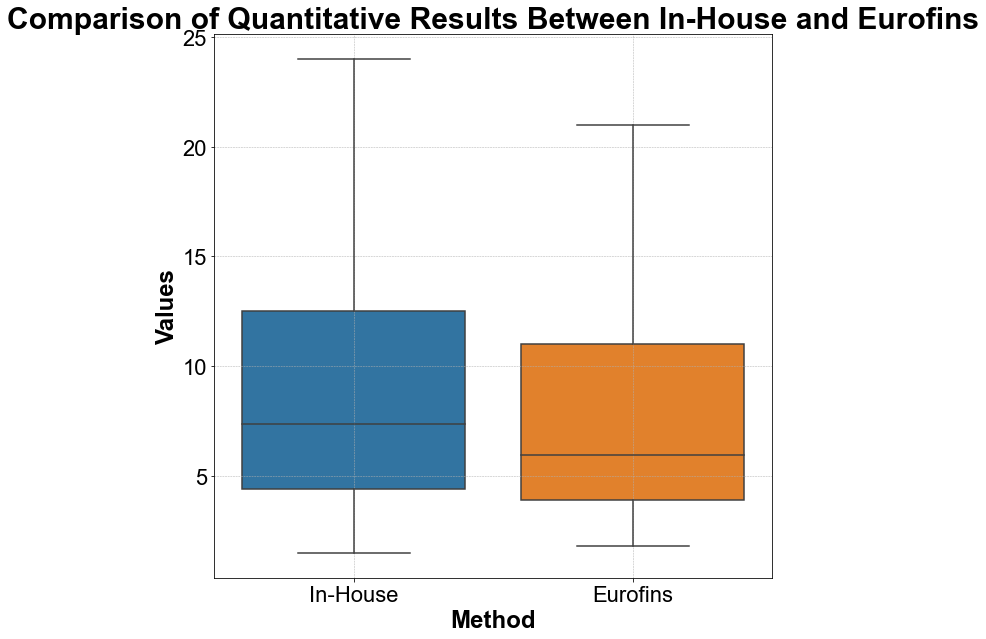

In [96]:
# To use seaborn, it's often easier to have the data in a "long" format
quant_df_long = pd.melt(quant_df, value_vars=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'], var_name='Method', value_name='Values')
quant_df_long.replace({'Quant Only Incl Qual Flags_InHouse':'In-House','Quant Only Incl Qual Flags_Eurofins':'Eurofins'}, inplace=True)
# Create the boxplot
plt.figure(figsize=(10, 10))  # Optional: Adjust the figure size
sns.boxplot(x='Method', y='Values', data=quant_df_long, showfliers=False)
plt.title('Comparison of Quantitative Results Between In-House and Eurofins')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


### PFAS Compounds by By PFAS Class

In [116]:
# Select columns ending with '_InHouse' and '_Eurofins'
inhouse_cols = [col for col in quant_df.columns if col.endswith('_InHouse')]
eurofins_cols = [col for col in quant_df.columns if col.endswith('_Eurofins')]

# Create separate DataFrames for InHouse and Eurofins data
df_inhouse = quant_df[inhouse_cols]
df_eurofins = quant_df[eurofins_cols]

# Rename the columns by removing the suffixes
df_inhouse.columns = [col.replace('_InHouse', '') for col in df_inhouse.columns]
df_eurofins.columns = [col.replace('_Eurofins', '') for col in df_eurofins.columns]

# Add a column to each DataFrame to identify the source
df_inhouse['Source'] = 'In-House'
df_eurofins['Source'] = 'Eurofins'

# Vertically append the DataFrames
combined_quant_df = pd.concat([df_inhouse, df_eurofins], ignore_index=True)

# Now you can proceed with further analysis on combined_df
combined_quant_df.head()


<ipython-input-116-63c91b35742f>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_inhouse['Source'] = 'In-House'
<ipython-input-116-63c91b35742f>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_eurofins['Source'] = 'Eurofins'


,Sampling point Date Component,Sample Number,Sampling Point,Sample Name,Sampled Date,Analysis,Component,Qualifiers,Result,Units,...,Dominant Contributor,Sector,Depth,Edit Notes,Field,Notes,Region,Crop,Batch,Source
0,BEAV@CNLUS-4/17/2024 9:10 AM-PFBS (Report),493581.0,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,PFBS (Report),U,8.14,ppt_wt_v,...,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005,In-House
1,BEAV@CNLUS-4/17/2024 9:10 AM-PFHpA (Report),493581.0,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,PFHpA (Report),U,2.79,ppt_wt_v,...,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005,In-House
2,BEAV@CNLUS-4/17/2024 9:10 AM-PFHxA (Report),493581.0,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,PFHxA (Report),U,6.19,ppt_wt_v,...,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005,In-House
3,BEAV@CNLUS-4/17/2024 9:10 AM-PFHxS (Report),493581.0,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,PFHxS (Report),U,4.69,ppt_wt_v,...,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005,In-House
4,BEAV@CNLUS-4/17/2024 9:10 AM-PFOA (Report),493581.0,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,PFOA (Report),U,9.99,ppt_wt_v,...,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005,In-House


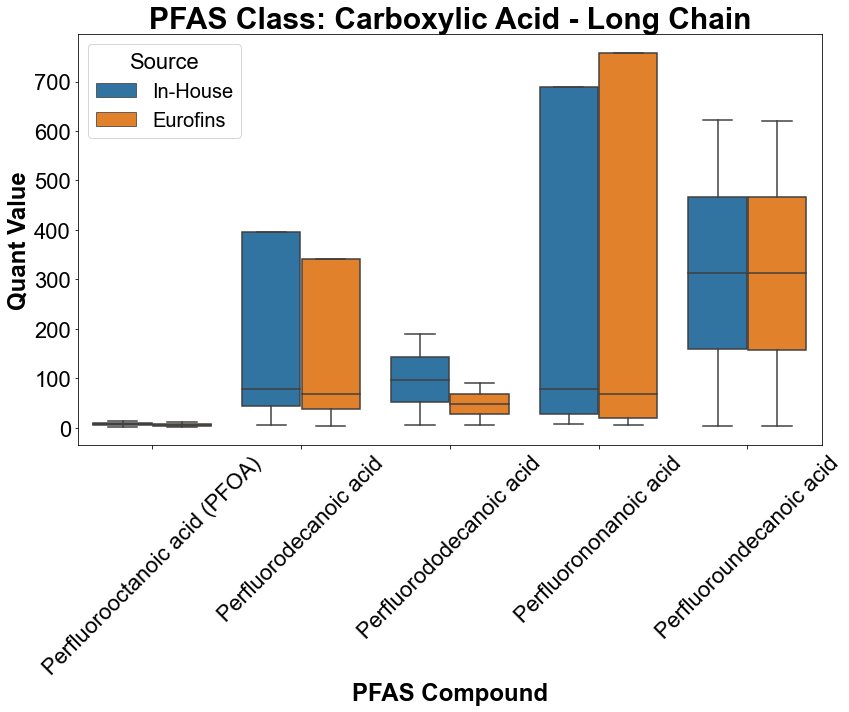

In [136]:
CarboxylicAcid_Long_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Long)]
plt.figure(figsize=(12, 10))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Source', data=CarboxylicAcid_Long_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Carboxylic Acid - Long Chain')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

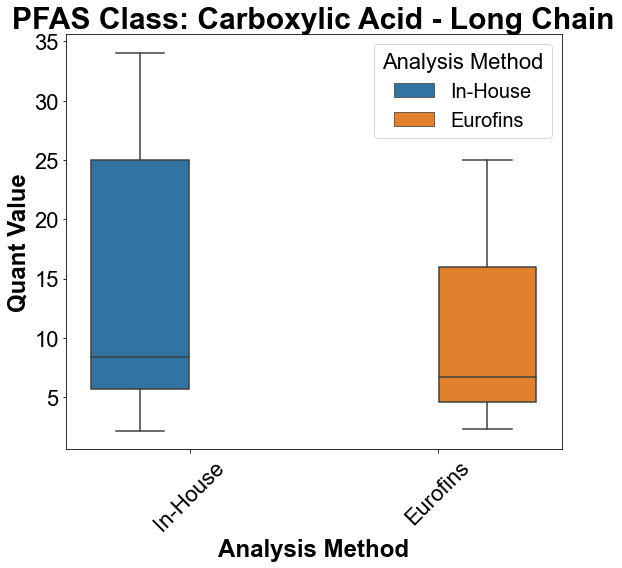

In [138]:
plt.figure(figsize=(8, 8))  # Adjust the figure size as needed
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags', hue='Source', data=CarboxylicAcid_Long_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.title('PFAS Class: Carboxylic Acid - Long Chain')
plt.ylabel('Quant Value')
plt.xlabel('Analysis Method')
plt.tight_layout()  # Adjust the layout to make room for the x-axis labels
plt.legend(title='Analysis Method')
plt.show()

In [139]:
# Assuming your DataFrame is named df
grouped_counts = CarboxylicAcid_Long_df.groupby('PFAS Compound').size()

# Display the counts for each PFAS Compound
print(grouped_counts)

PFAS Compound
Perfluorodecanoic acid            8
Perfluorododecanoic acid          4
Perfluorononanoic acid            8
Perfluorooctanoic acid (PFOA)    64
Perfluoroundecanoic acid          4
dtype: int64


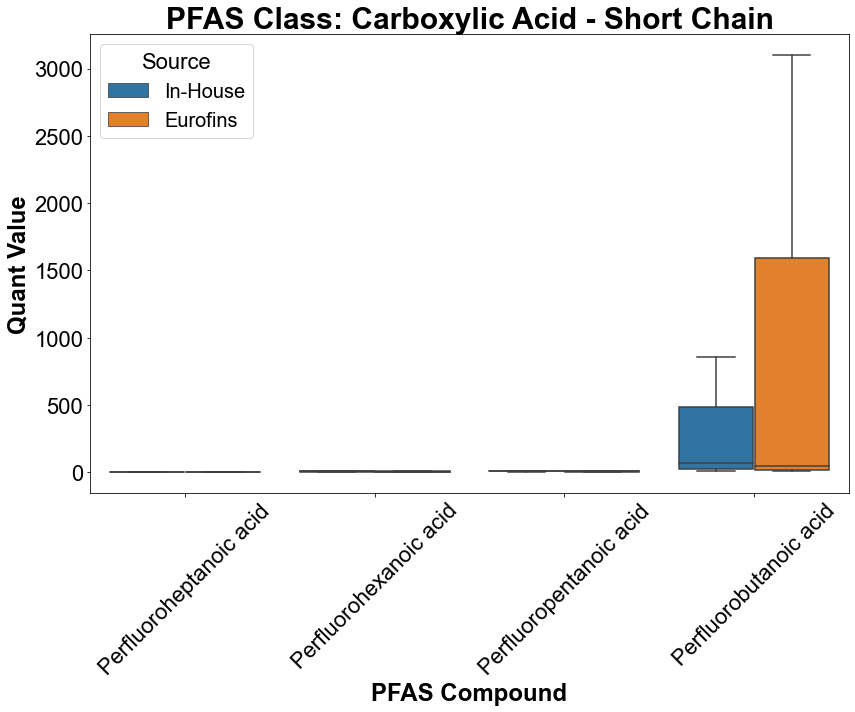

In [140]:
CarboxylicAcid_Short_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Short)]
plt.figure(figsize=(12, 10))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Source', data=CarboxylicAcid_Short_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Carboxylic Acid - Short Chain')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

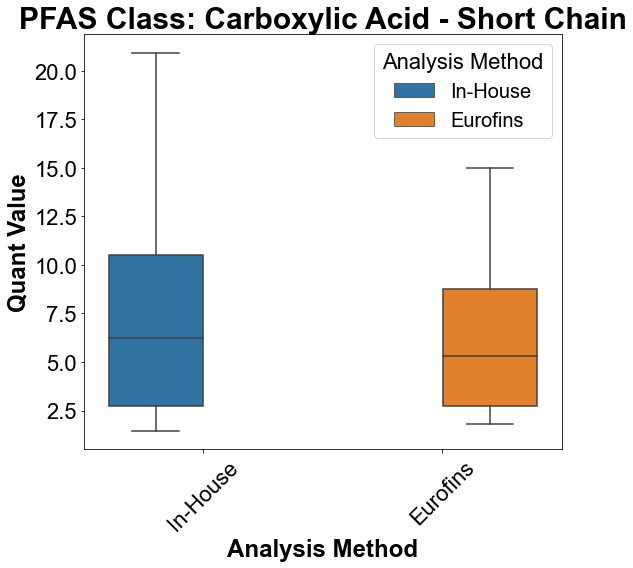

In [142]:
plt.figure(figsize=(8, 8))  # Adjust the figure size as needed
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags', hue='Source', data=CarboxylicAcid_Short_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.title('PFAS Class: Carboxylic Acid - Short Chain')
plt.ylabel('Quant Value')
plt.xlabel('Analysis Method')
plt.tight_layout()  # Adjust the layout to make room for the x-axis labels
plt.legend(title='Analysis Method', loc='upper right')
plt.show()

In [143]:
# Assuming your DataFrame is named df
grouped_counts = CarboxylicAcid_Short_df.groupby('PFAS Compound').size()

# Display the counts for each PFAS Compound
print(grouped_counts)

PFAS Compound
Perfluorobutanoic acid     14
Perfluoroheptanoic acid    44
Perfluorohexanoic acid     62
Perfluoropentanoic acid    44
dtype: int64


In [144]:
FluorotelomerSulfonicAcid_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_FluorotelomerSulfonicAcid)]
FluorotelomerSulfonicAcid_df

#temp=FluorotelomerSulfonicAcid_df.groupby('PFAS Compound')
#temp['Quant Only Incl Qual Flags'].describe()

,Sampling point Date Component,Sample Number,Sampling Point,Sample Name,Sampled Date,Analysis,Component,Qualifiers,Result,Units,...,Dominant Contributor,Sector,Depth,Edit Notes,Field,Notes,Region,Crop,Batch,Source
151,MI CONVEYANCE SOLUTIONS (FPT)-3/12/2024 10:14 ...,492592.0,MI CONVEYANCE SOLUTIONS (FPT),PFAS Monitoring - Q1-2024,3/12/2024 10:14 AM,PFAS,8:2 FTS (Report),U,13.9,ppt_wt_v,...,NaN,Rubber Manufacture,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00002,In-House
371,SEALS HILLSBORO (FPT)-3/12/2024 10:14 AM-8:2Fl...,492592.0,SEALS HILLSBORO (FPT),PFAS Monitoring - Q1-2024,3/12/2024 10:14 AM,PFAS-CL,8:2Fluorotelomersulfonic Acid (Report),NaN,15,ppt_wt_v,...,NaN,Rubber Manufacture,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Eurofins


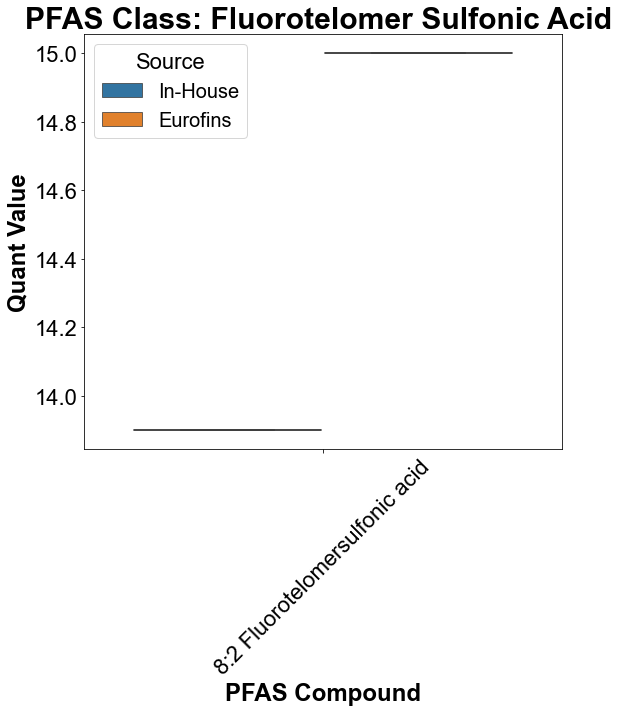

In [147]:
FluorotelomerSulfonicAcid_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_FluorotelomerSulfonicAcid)]
plt.figure(figsize=(8, 10))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Source', data=FluorotelomerSulfonicAcid_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Fluorotelomer Sulfonic Acid ')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [148]:
PerPolyfluorotherCarboxylicAcid_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_PerPolyfluorotherCarboxylicAcid)]
PerPolyfluorotherCarboxylicAcid_df

,Sampling point Date Component,Sample Number,Sampling Point,Sample Name,Sampled Date,Analysis,Component,Qualifiers,Result,Units,...,Dominant Contributor,Sector,Depth,Edit Notes,Field,Notes,Region,Crop,Batch,Source
185,ANALOG DEVICES (FPT)-3/13/2024 1:19 PM-PFMPA (...,492598.0,ANALOG DEVICES (FPT),PFAS Monitoring - Q1-2024,3/13/2024 1:19 PM,PFAS,PFMPA (Report),U,4.72,ppt_wt_v,...,NaN,Electrical and Electronic Components,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00004,In-House
195,QUANTUM (FPT)-3/12/2024 11:42 AM-PFMBA (Report),492600.0,QUANTUM (FPT),PFAS Monitoring - Q1-2024,3/12/2024 11:42 AM,PFAS,PFMBA (Report),U,296.0,ppt_wt_v,...,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00004,In-House
196,QUANTUM (FPT)-3/12/2024 11:42 AM-PFMPA (Report),492600.0,QUANTUM (FPT),PFAS Monitoring - Q1-2024,3/12/2024 11:42 AM,PFAS,PFMPA (Report),U,310.0,ppt_wt_v,...,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00004,In-House
405,MAXIM (FPT)-3/13/2024 1:19 PM-PFMPA (Report),492598.0,MAXIM (FPT),PFAS Monitoring - Q1-2024,3/13/2024 1:19 PM,PFAS-CL,PFMPA (Report),NaN,4,ppt_wt_v,...,NaN,Electrical and Electronic Components,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Eurofins
415,QUANTUM (FPT)-3/12/2024 11:42 AM-PFMBA (Report),492600.0,QUANTUM (FPT),PFAS Monitoring - Q1-2024,3/12/2024 11:42 AM,PFAS-CL,PFMBA (Report),NaN,250,ppt_wt_v,...,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Eurofins
416,QUANTUM (FPT)-3/12/2024 11:42 AM-PFMPA (Report),492600.0,QUANTUM (FPT),PFAS Monitoring - Q1-2024,3/12/2024 11:42 AM,PFAS-CL,PFMPA (Report),NaN,240,ppt_wt_v,...,NaN,Metal Finishing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Eurofins


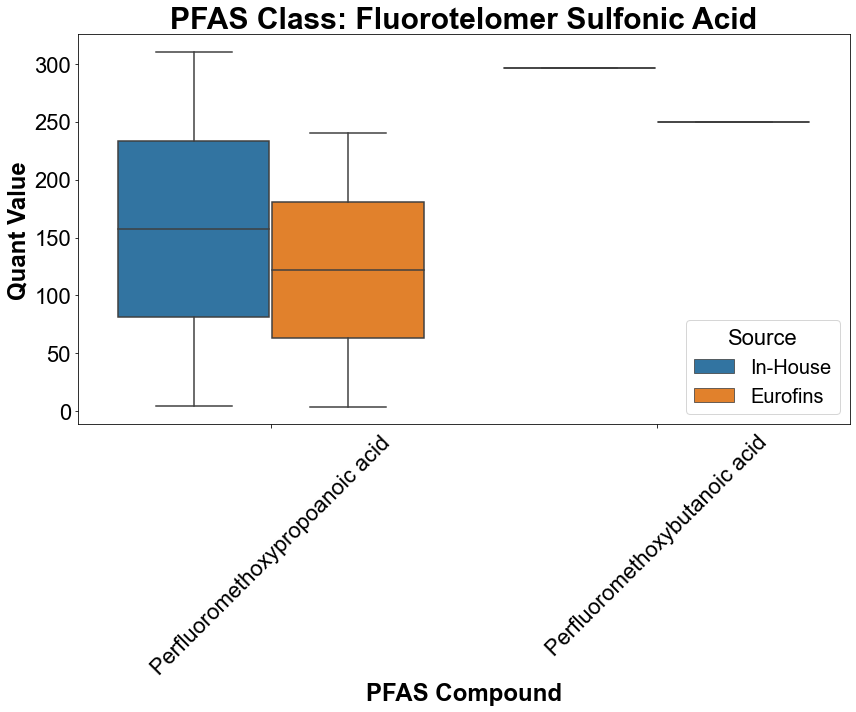

In [149]:
PerPolyfluorotherCarboxylicAcid_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_PerPolyfluorotherCarboxylicAcid)]
plt.figure(figsize=(12, 10))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Source', data=PerPolyfluorotherCarboxylicAcid_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Fluorotelomer Sulfonic Acid')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()


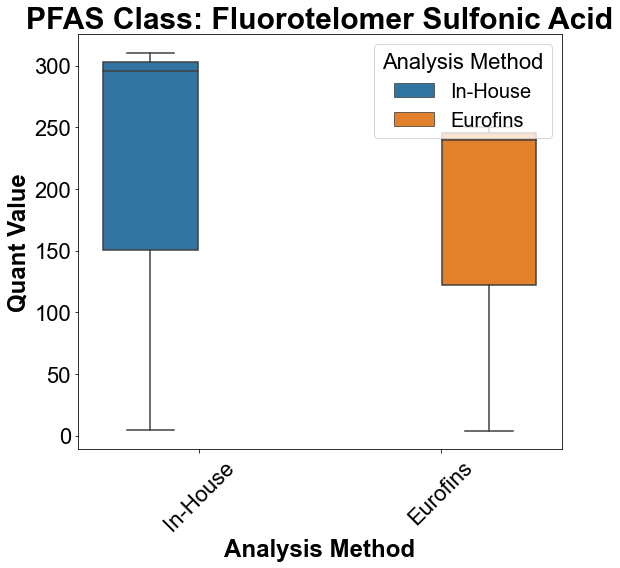

In [151]:
plt.figure(figsize=(8, 8))  # Adjust the figure size as needed
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags', hue='Source', data=PerPolyfluorotherCarboxylicAcid_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.title('PFAS Class: Fluorotelomer Sulfonic Acid')
plt.ylabel('Quant Value')
plt.xlabel('Analysis Method')
plt.tight_layout()  # Adjust the layout to make room for the x-axis labels
plt.legend(title='Analysis Method', loc='upper right')
plt.show()

In [152]:
# Assuming your DataFrame is named df
grouped_counts = PerPolyfluorotherCarboxylicAcid_df.groupby('PFAS Compound').size()

# Display the counts for each PFAS Compound
print(grouped_counts)

PFAS Compound
Perfluoromethoxybutanoic acid      2
Perfluoromethoxypropoanoic acid    4
dtype: int64


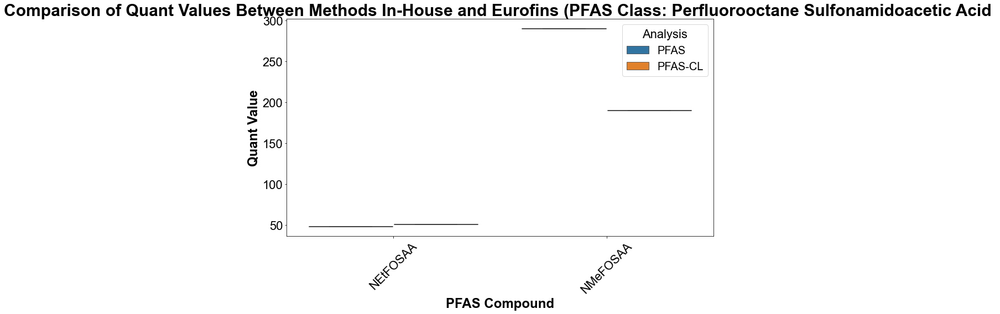

In [128]:
PerfluorooctaneSulfonamidoaceticAcid_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)]
plt.figure(figsize=(12, 8))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Analysis', data=PerfluorooctaneSulfonamidoaceticAcid_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('Comparison of Quant Values Between Methods In-House and Eurofins (PFAS Class: Perfluorooctane Sulfonamidoacetic Acid ')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [129]:
# Assuming your DataFrame is named df
grouped_counts = PerfluorooctaneSulfonamidoaceticAcid_df.groupby('PFAS Compound').size()

# Display the counts for each PFAS Compound
print(grouped_counts)

PFAS Compound
NEtFOSAA    2
NMeFOSAA    2
dtype: int64


In [153]:
combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamideEthanol)]

,Sampling point Date Component,Sample Number,Sampling Point,Sample Name,Sampled Date,Analysis,Component,Qualifiers,Result,Units,...,Dominant Contributor,Sector,Depth,Edit Notes,Field,Notes,Region,Crop,Batch,Source


In [154]:
PerfluorooctaneSulfonamideEthanol=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamideEthanol)]
plt.figure(figsize=(12, 8))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Analysis', data=PerfluorooctaneSulfonamideEthanol, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('Comparison of Quant Values Between Methods In-House and Eurofins (PFAS Class: Perfluorooctane Sulfonamide Ethanol ')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

ValueError: min() arg is an empty sequence

<Figure size 864x576 with 0 Axes>

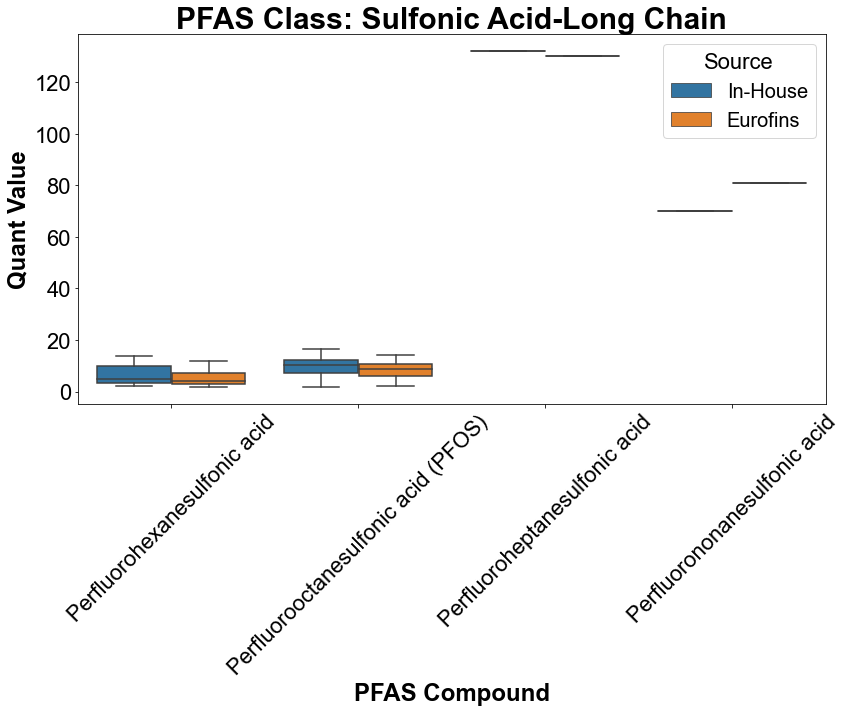

In [156]:
SulfonicAcid_Long=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Long)]
plt.figure(figsize=(12, 10))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Source', data=SulfonicAcid_Long, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Sulfonic Acid-Long Chain')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

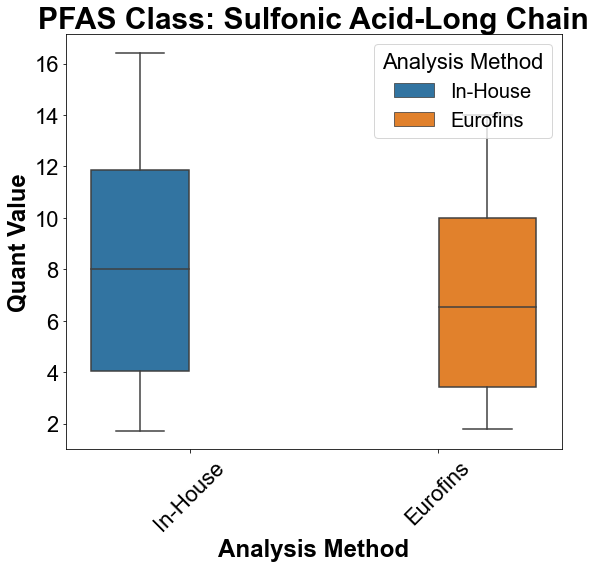

In [157]:
plt.figure(figsize=(8, 8))  # Adjust the figure size as needed
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags', hue='Source', data=SulfonicAcid_Long, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.title('PFAS Class: Sulfonic Acid-Long Chain')
plt.ylabel('Quant Value')
plt.xlabel('Analysis Method')
plt.tight_layout()  # Adjust the layout to make room for the x-axis labels
plt.legend(title='Analysis Method', loc='upper right')
plt.show()

In [158]:
# Assuming your DataFrame is named df
grouped_counts = SulfonicAcid_Long.groupby('PFAS Compound').size()

# Display the counts for each PFAS Compound
print(grouped_counts)

PFAS Compound
Perfluoroheptanesulfonic acid           2
Perfluorohexanesulfonic acid           52
Perfluorononanesulfonic acid            2
Perfluorooctanesulfonic acid (PFOS)    52
dtype: int64


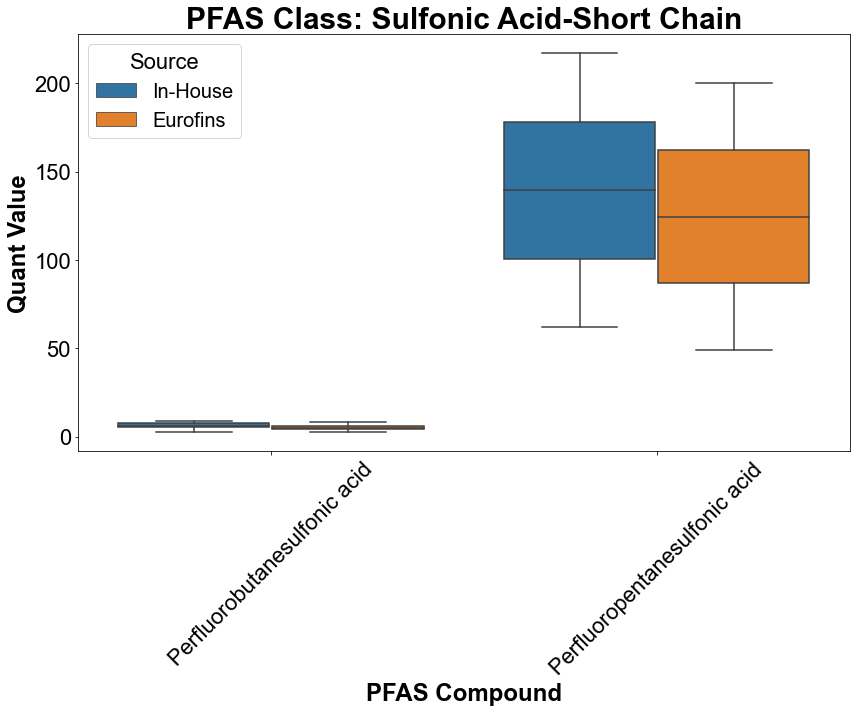

In [160]:
SulfonicAcid_Short=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Short)]
plt.figure(figsize=(12, 10))  # Set the figure size as desired
sns.boxplot(x='PFAS Compound', y='Quant Only Incl Qual Flags', hue='Source', data=SulfonicAcid_Short, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Sulfonic Acid-Short Chain')
plt.ylabel('Quant Value')
plt.xlabel('PFAS Compound')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

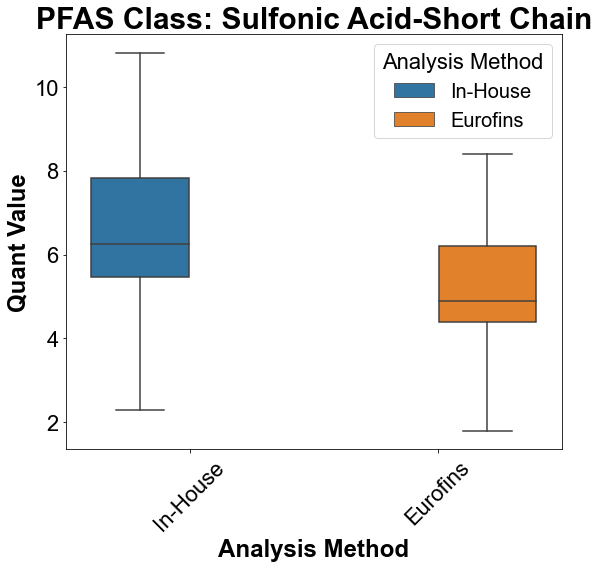

In [161]:
plt.figure(figsize=(8, 8))  # Adjust the figure size as needed
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags', hue='Source', data=SulfonicAcid_Short, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.title('PFAS Class: Sulfonic Acid-Short Chain')
plt.ylabel('Quant Value')
plt.xlabel('Analysis Method')
plt.tight_layout()  # Adjust the layout to make room for the x-axis labels
plt.legend(title='Analysis Method', loc='upper right')
plt.show()

In [162]:
# Assuming your DataFrame is named df
grouped_counts = SulfonicAcid_Short.groupby('PFAS Compound').size()

# Display the counts for each PFAS Compound
print(grouped_counts)

PFAS Compound
Perfluorobutanesulfonic acid     58
Perfluoropentanesulfonic acid     4
dtype: int64


### By Type

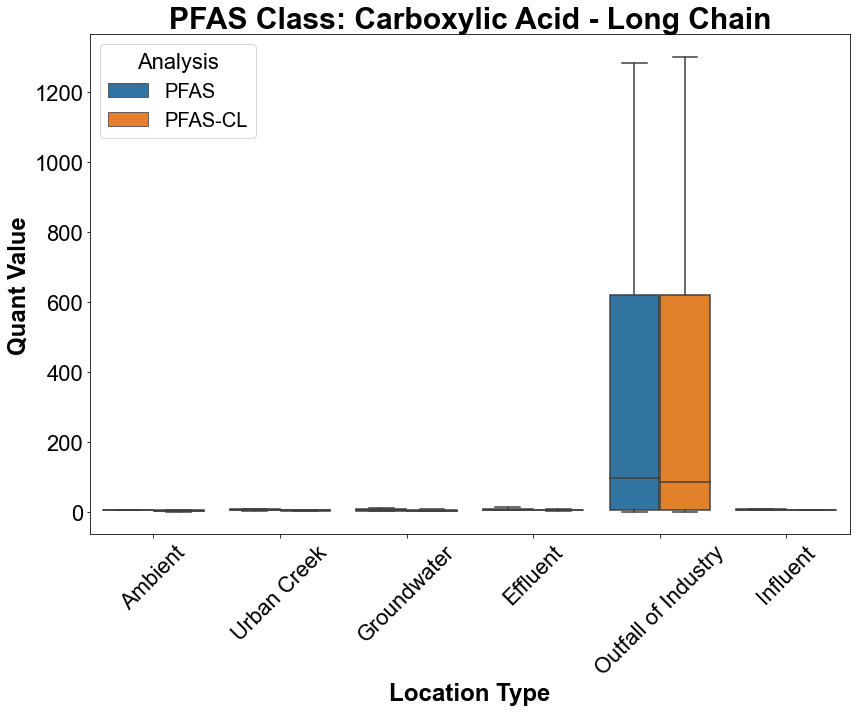

In [163]:
CarboxylicAcid_Long_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Long)]
plt.figure(figsize=(12, 10))  # Set the figure size as desired
sns.boxplot(x='Type', y='Quant Only Incl Qual Flags', hue='Analysis', data=CarboxylicAcid_Long_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Carboxylic Acid - Long Chain')
plt.ylabel('Quant Value')
plt.xlabel('Location Type')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = CarboxylicAcid_Long_df.groupby('Type').size()

# Display the counts for each Type
print(grouped_counts)

Type
Ambient                10
Effluent               14
Groundwater            14
Influent                4
Outfall of Industry    64
Urban Creek            18
dtype: int64


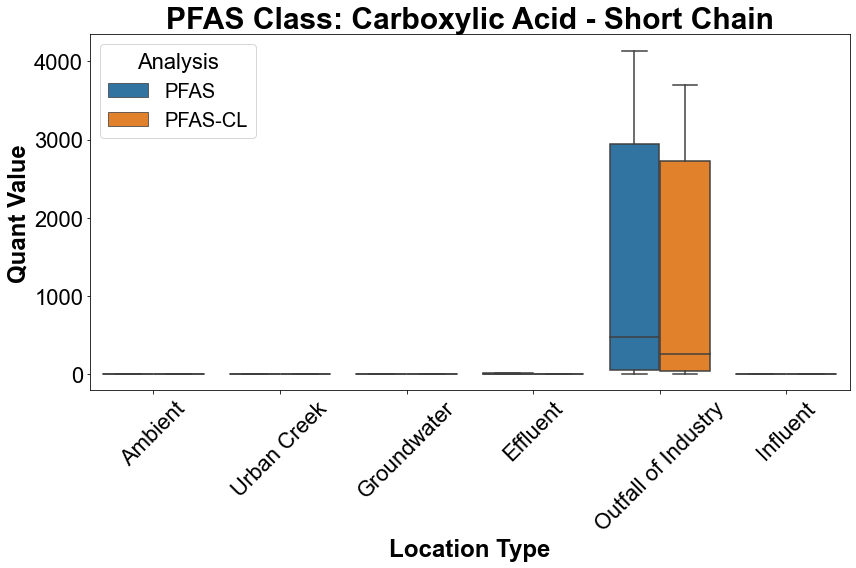

In [164]:
CarboxylicAcid_Short_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Short)]
plt.figure(figsize=(12, 8))  # Set the figure size as desired
sns.boxplot(x='Type', y='Quant Only Incl Qual Flags', hue='Analysis', data=CarboxylicAcid_Short_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Carboxylic Acid - Short Chain')
plt.ylabel('Quant Value')
plt.xlabel('Location Type')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [165]:
# Assuming your DataFrame is named df
grouped_counts = CarboxylicAcid_Short_df.groupby('Type').size()

# Display the counts for each Type
print(grouped_counts)

Type
Ambient                34
Effluent               28
Groundwater            16
Influent               12
Outfall of Industry    32
Urban Creek            42
dtype: int64


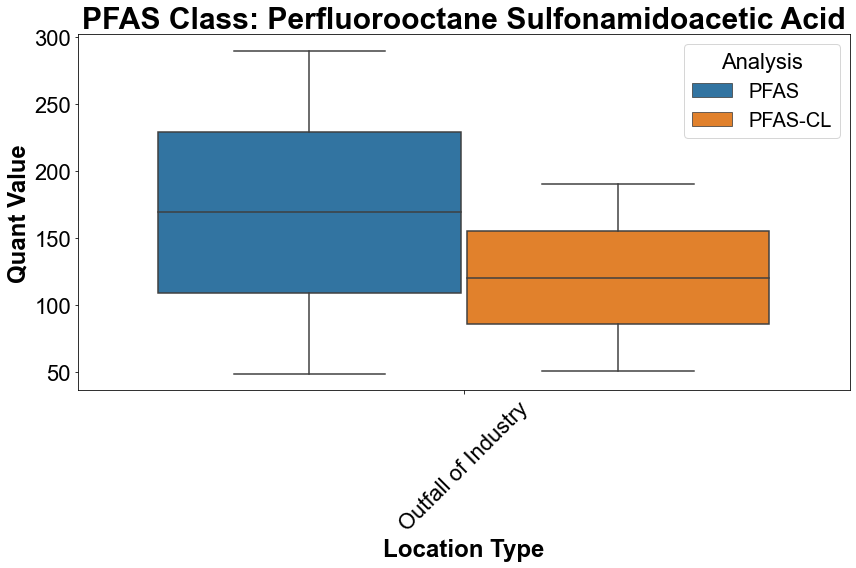

In [166]:
PerfluorooctaneSulfonamidoaceticAcid_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)]
plt.figure(figsize=(12, 8))  # Set the figure size as desired
sns.boxplot(x='Type', y='Quant Only Incl Qual Flags', hue='Analysis', data=PerfluorooctaneSulfonamidoaceticAcid_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Perfluorooctane Sulfonamidoacetic Acid')
plt.ylabel('Quant Value')
plt.xlabel('Location Type')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = PerfluorooctaneSulfonamidoaceticAcid_df.groupby('Type').size()

# Display the counts for each Type
print(grouped_counts)

Type
Outfall of Industry    4
dtype: int64


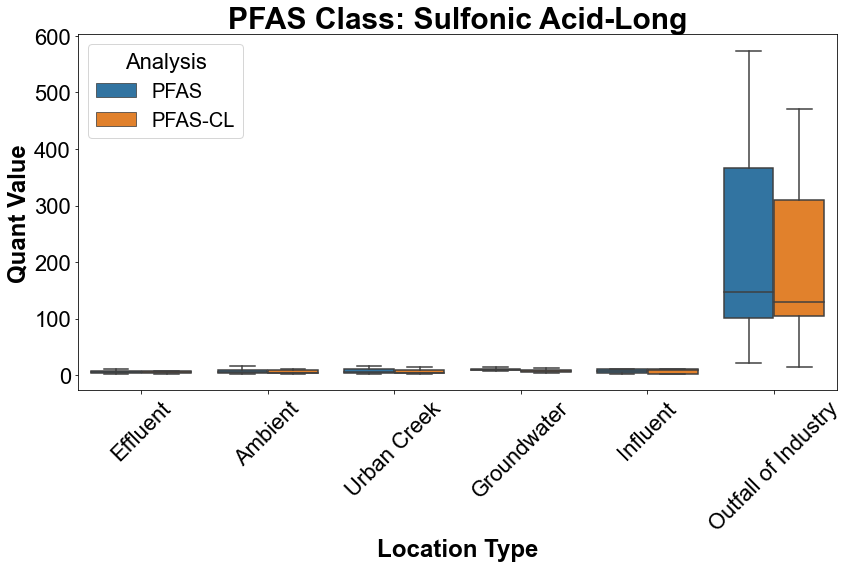

In [ ]:
SulfonicAcid_Long=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Long)]
plt.figure(figsize=(12, 8))  # Set the figure size as desired
sns.boxplot(x='Type', y='Quant Only Incl Qual Flags', hue='Analysis', data=SulfonicAcid_Long, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Sulfonic Acid-Long')
plt.ylabel('Quant Value')
plt.xlabel('Location Type')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = SulfonicAcid_Long.groupby('Type').size()

# Display the counts for each Type
print(grouped_counts)

Type
Ambient                22
Effluent               24
Groundwater            16
Influent               10
Outfall of Industry    14
Urban Creek            34
dtype: int64


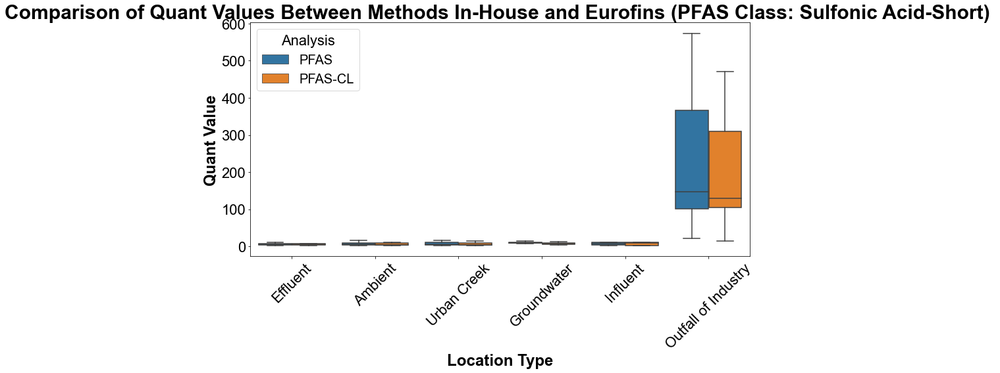

In [ ]:
SulfonicAcid_Short=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Short)]
plt.figure(figsize=(12, 8))  # Set the figure size as desired
sns.boxplot(x='Type', y='Quant Only Incl Qual Flags', hue='Analysis', data=SulfonicAcid_Long, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('Comparison of Quant Values Between Methods In-House and Eurofins (PFAS Class: Sulfonic Acid-Short) ')
plt.ylabel('Quant Value')
plt.xlabel('Location Type')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = SulfonicAcid_Short.groupby('Type').size()

# Display the counts for each Type
print(grouped_counts)

Type
Ambient                10
Effluent                6
Groundwater            14
Influent                4
Outfall of Industry    20
Urban Creek            16
dtype: int64


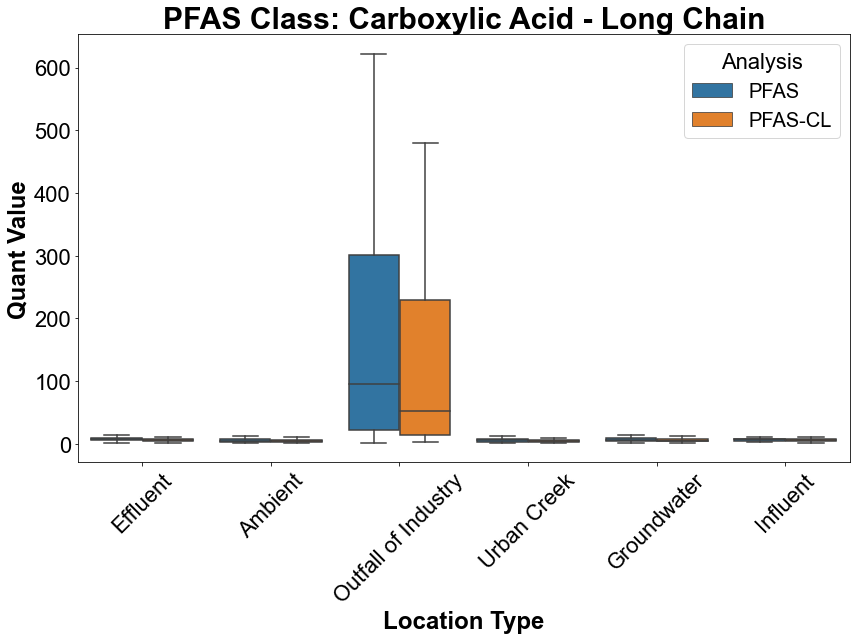

In [ ]:

plt.figure(figsize=(12, 9))  # Set the figure size as desired
sns.boxplot(x='Type', y='Quant Only Incl Qual Flags', hue='Analysis', data=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds)], showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Carboxylic Acid - Long Chain')
plt.ylabel('Quant Value')
plt.xlabel('Location Type')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

### By Location:

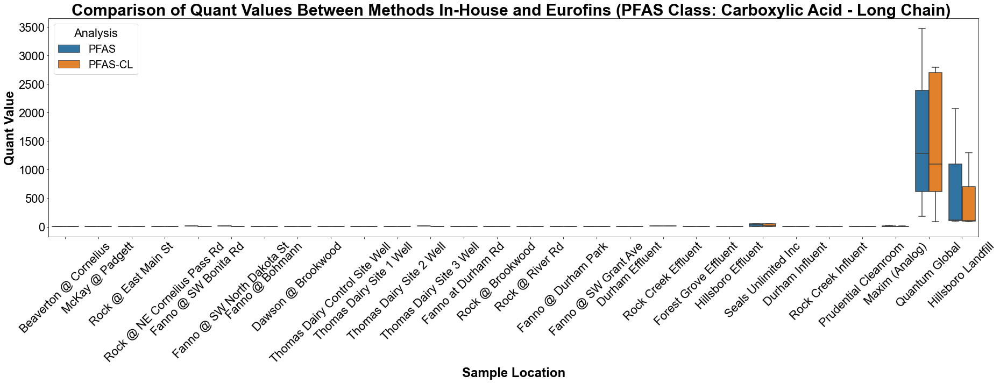

In [167]:
CarboxylicAcid_Long_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Long)]
plt.figure(figsize=(26, 10))  # Set the figure size as desired
sns.boxplot(x='Sample Location', y='Quant Only Incl Qual Flags', hue='Analysis', data=CarboxylicAcid_Long_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('Comparison of Quant Values Between Methods In-House and Eurofins (PFAS Class: Carboxylic Acid - Long Chain) ')
plt.ylabel('Quant Value')
plt.xlabel('Sample Location')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = CarboxylicAcid_Long_df.groupby('Sample Location').size()

# Display the counts for each Type
print(grouped_counts)

Sample Location
Beaverton @ Cornelius              2
Dawson @ Brookwood                 2
Durham Effluent                    2
Durham Influent                    2
Fanno @ Bohmann                    2
Fanno @ Durham Park                2
Fanno @ SW Bonita Rd               2
Fanno @ SW Grant Ave               2
Fanno @ SW North Dakota St         2
Fanno at Durham Rd                 2
Forest Grove Effluent              4
Hillsboro Effluent                 4
Hillsboro Landfill                 6
JAE Oregon Inc                    14
Jireh Semiconductor Inc           10
Maxim (Analog)                    12
McKay @ Padgett                    2
Prudential Cleanroom               2
Quantum Global                    10
Rock @ Brookwood                   2
Rock @ East Main St                2
Rock @ NE Cornelius Pass Rd        4
Rock @ River Rd                    2
Rock Creek Effluent                4
Rock Creek Influent                2
Seals Unlimited Inc               10
Thomas Dairy Control S

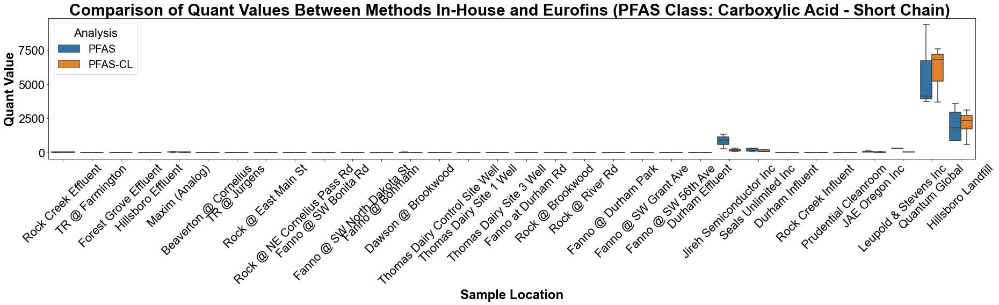

In [ ]:
CarboxylicAcid_Short_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Short)]
plt.figure(figsize=(26, 8))  # Set the figure size as desired
sns.boxplot(x='Sample Location', y='Quant Only Incl Qual Flags', hue='Analysis', data=CarboxylicAcid_Short_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('Comparison of Quant Values Between Methods In-House and Eurofins (PFAS Class: Carboxylic Acid - Short Chain) ')
plt.ylabel('Quant Value')
plt.xlabel('Sample Location')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = CarboxylicAcid_Short_df.groupby('Sample Location').size()

# Display the counts for each Type
print(grouped_counts)

Sample Location
Beaverton @ Cornelius              6
Dawson @ Brookwood                 8
Durham Effluent                    8
Durham Influent                    6
Fanno @ Bohmann                    6
Fanno @ Durham Park                6
Fanno @ SW 56th Ave                2
Fanno @ SW Bonita Rd               6
Fanno @ SW Grant Ave               2
Fanno @ SW North Dakota St         6
Fanno at Durham Rd                12
Forest Grove Effluent             12
Hillsboro Effluent                12
Hillsboro Landfill                 8
JAE Oregon Inc                     6
Jireh Semiconductor Inc            6
Leupold & Stevens Inc              2
Maxim (Analog)                    16
Prudential Cleanroom               2
Quantum Global                     6
Rock @ Brookwood                   6
Rock @ East Main St                2
Rock @ NE Cornelius Pass Rd        6
Rock @ River Rd                    6
Rock Creek Effluent               16
Rock Creek Influent                6
Seals Unlimited Inc   

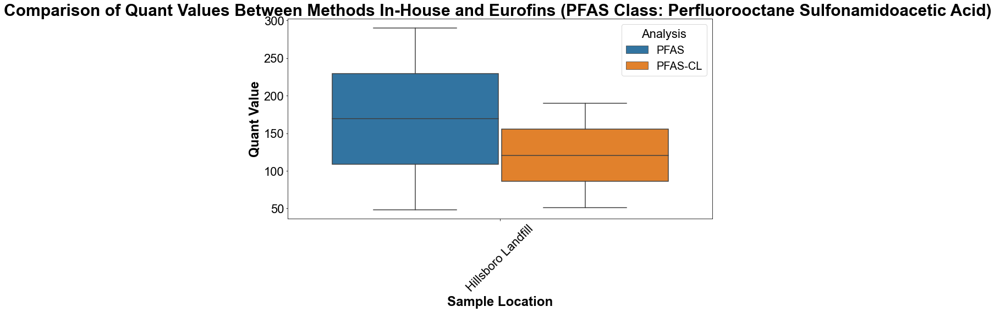

In [ ]:
PerfluorooctaneSulfonamidoaceticAcid_df=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)]
plt.figure(figsize=(12, 8))  # Set the figure size as desired
sns.boxplot(x='Sample Location', y='Quant Only Incl Qual Flags', hue='Analysis', data=PerfluorooctaneSulfonamidoaceticAcid_df, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('Comparison of Quant Values Between Methods In-House and Eurofins (PFAS Class: Perfluorooctane Sulfonamidoacetic Acid) ')
plt.ylabel('Quant Value')
plt.xlabel('Sample Location')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = PerfluorooctaneSulfonamidoaceticAcid_df.groupby('Sample Location').size()

# Display the counts for each Type
print(grouped_counts)

Sample Location
Hillsboro Landfill    4
dtype: int64


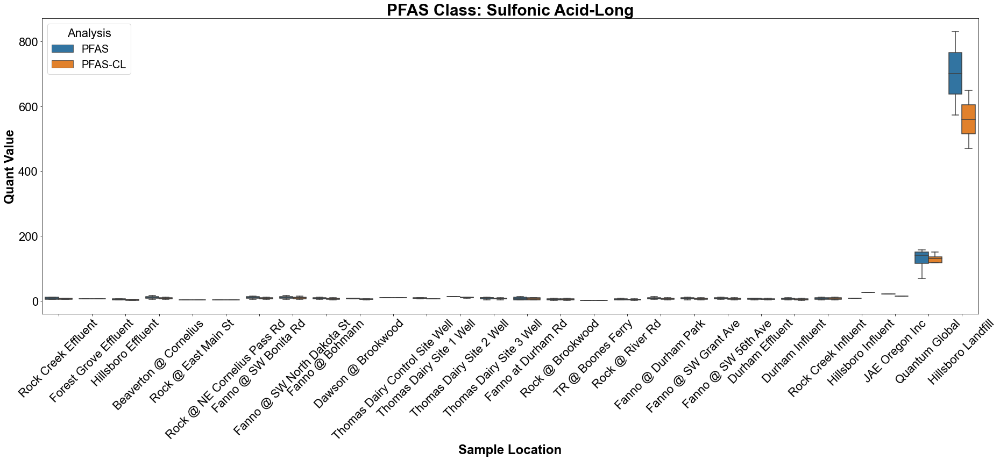

In [ ]:
SulfonicAcid_Long=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Long)]
plt.figure(figsize=(26, 12))  # Set the figure size as desired
sns.boxplot(x='Sample Location', y='Quant Only Incl Qual Flags', hue='Analysis', data=SulfonicAcid_Long, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Sulfonic Acid-Long')
plt.ylabel('Quant Value')
plt.xlabel('Sample Location')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = SulfonicAcid_Long.groupby('Sample Location').size()

# Display the counts for each Type
print(grouped_counts)

Sample Location
Beaverton @ Cornelius             4
Dawson @ Brookwood                4
Durham Effluent                   4
Durham Influent                   4
Fanno @ Bohmann                   4
Fanno @ Durham Park               4
Fanno @ SW 56th Ave               4
Fanno @ SW Bonita Rd              4
Fanno @ SW Grant Ave              4
Fanno @ SW North Dakota St        4
Fanno at Durham Rd                8
Forest Grove Effluent             4
Hillsboro Effluent                8
Hillsboro Influent                2
Hillsboro Landfill                4
JAE Oregon Inc                    2
Quantum Global                    8
Rock @ Brookwood                  4
Rock @ East Main St               2
Rock @ NE Cornelius Pass Rd       4
Rock @ River Rd                   4
Rock Creek Effluent               8
Rock Creek Influent               4
TR @ Boones Ferry                 2
Thomas Dairy Control Site Well    2
Thomas Dairy Site 1 Well          4
Thomas Dairy Site 2 Well          4
Thomas Dairy

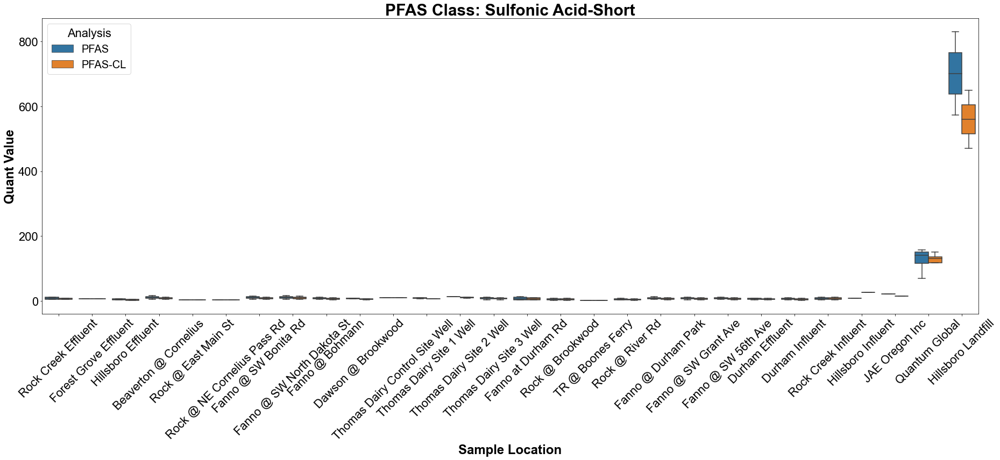

In [ ]:
SulfonicAcid_Short=combined_quant_df[combined_quant_df['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Short)]
plt.figure(figsize=(26, 12))  # Set the figure size as desired
sns.boxplot(x='Sample Location', y='Quant Only Incl Qual Flags', hue='Analysis', data=SulfonicAcid_Long, showfliers=False)
plt.xticks(rotation=45)  # Rotate the x labels if they overlap
plt.title('PFAS Class: Sulfonic Acid-Short')
plt.ylabel('Quant Value')
plt.xlabel('Sample Location')
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

In [ ]:
# Assuming your DataFrame is named df
grouped_counts = SulfonicAcid_Short.groupby('Sample Location').size()

# Display the counts for each Type
print(grouped_counts)

Sample Location
Beaverton @ Cornelius             2
Dawson @ Brookwood                2
Durham Effluent                   2
Durham Influent                   2
Fanno @ Bohmann                   2
Fanno @ Durham Park               2
Fanno @ SW 56th Ave               2
Fanno @ SW Bonita Rd              2
Fanno @ SW Grant Ave              2
Fanno @ SW North Dakota St        2
Fanno at Durham Rd                4
Hillsboro Effluent                4
Hillsboro Landfill                4
Intel Ronler WATR                 4
Jireh Semiconductor Inc           2
Maxim (Analog)                    4
Prudential Cleanroom              2
Quantum Global                    4
Rock @ Brookwood                  2
Rock @ East Main St               2
Rock @ River Rd                   2
Rock Creek Influent               2
Thomas Dairy Control Site Well    2
Thomas Dairy Site 1 Well          4
Thomas Dairy Site 2 Well          4
Thomas Dairy Site 3 Well          4
dtype: int64


## Eurofins vs In-House PFAS Concentration Plots

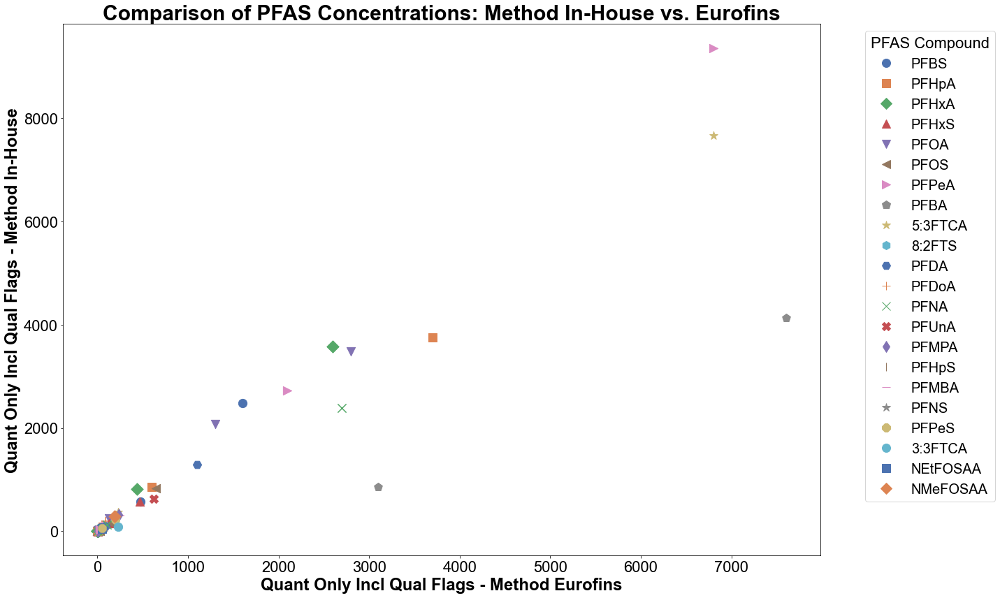

In [168]:
# Example list of markers and colors
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(quant_df['PFAS Compound_InHouse'].unique()))

# Get unique PFAS compounds
unique_compounds = quant_df['PFAS Compound_InHouse'].unique()

# Create a dictionary mapping each compound to a marker and color
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(unique_compounds, itertools.cycle(markers), itertools.cycle(colors))}

# Prepare figure and axes
plt.figure(figsize=(20, 12))

# Create a legend map to handle duplicate labels
legend_map = {}

# Iterate over DataFrame rows
for _, row in quant_df.iterrows():
    # Use pfas_mapping to get the abbreviation
    abbr_compound = pfas_mapping.get(row['PFAS Compound_InHouse'], row['PFAS Compound_InHouse'])  # Fallback to the full name if no abbreviation is found
    marker, color = compound_style_map[row['PFAS Compound_InHouse']]
    plt.scatter( row['Quant Only Incl Qual Flags_Eurofins'], row['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)
    
    # Update legend map with abbreviations
    if abbr_compound not in legend_map:
        legend_map[abbr_compound] = (marker, color)

# Create custom legend using abbreviations
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None',markersize=12) 
                   for abbr, style in legend_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('Comparison of PFAS Concentrations: Method In-House vs. Eurofins')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

plt.tight_layout()
plt.show()


### PFAS Compounds

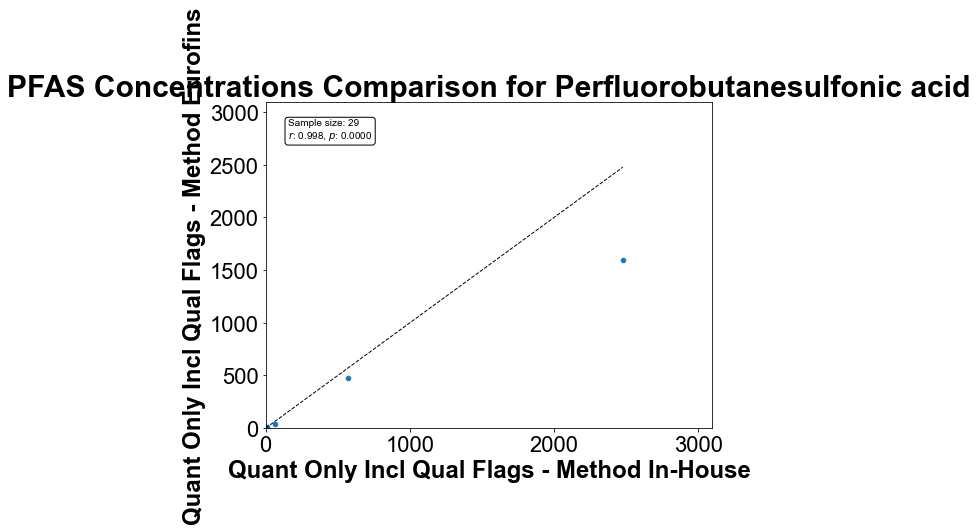

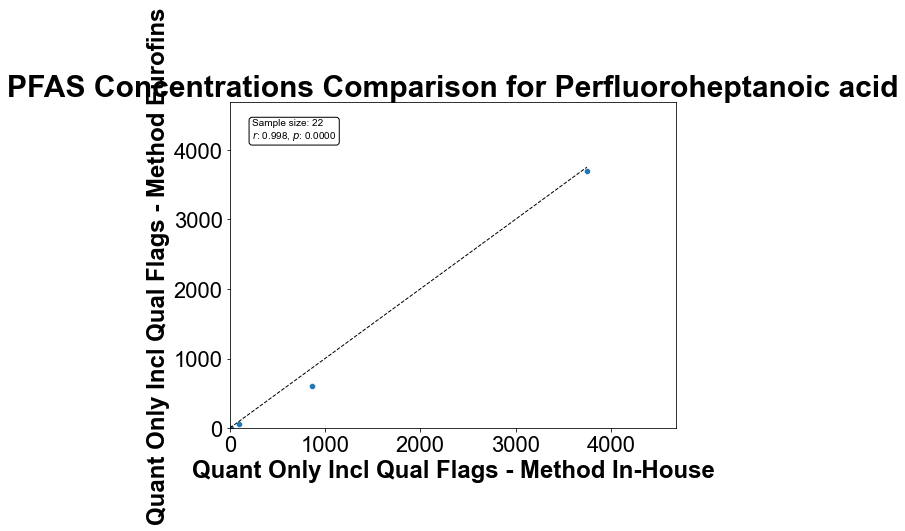

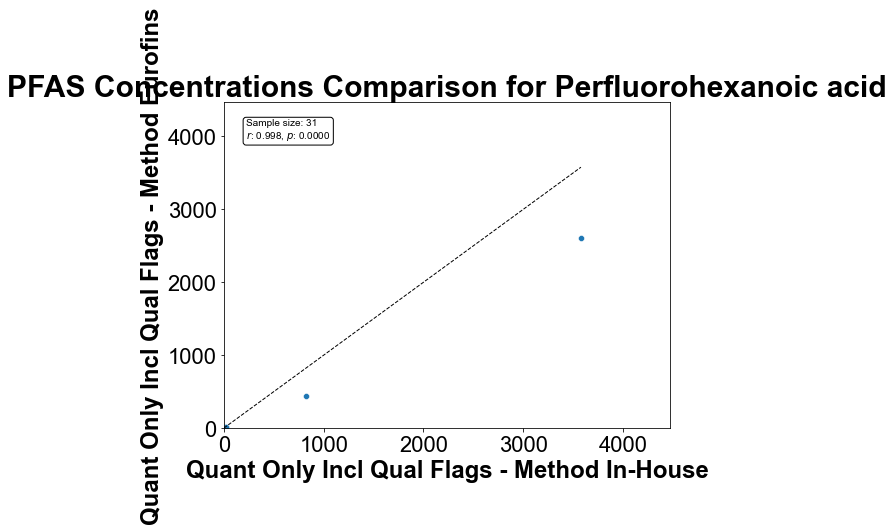

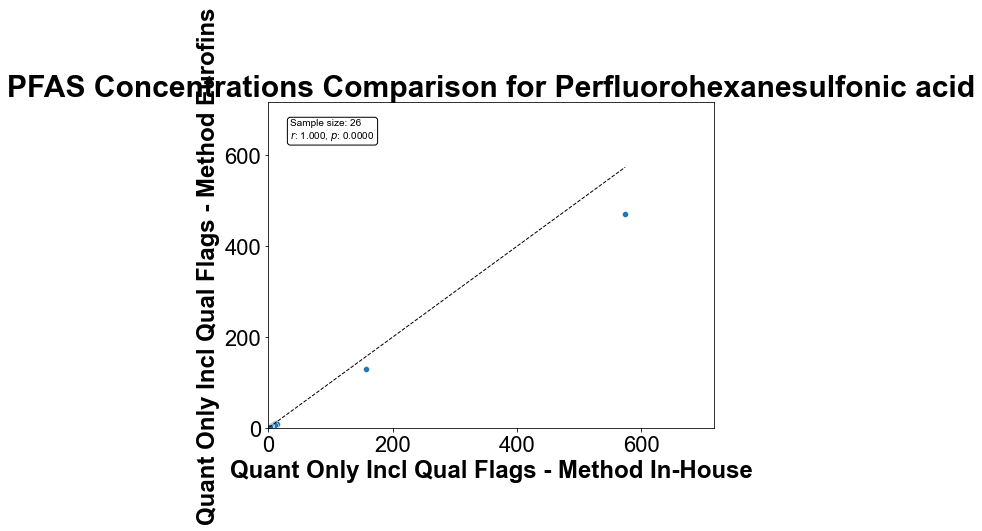

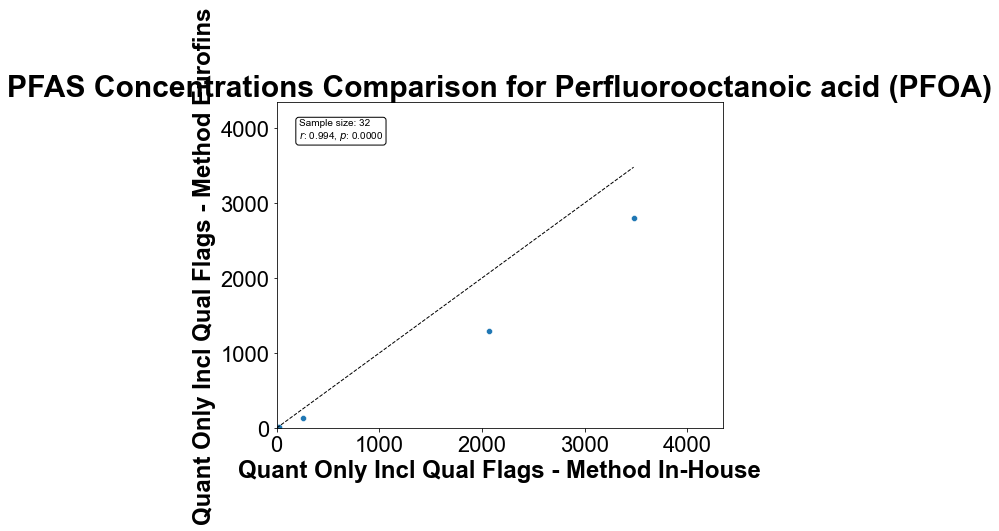

...

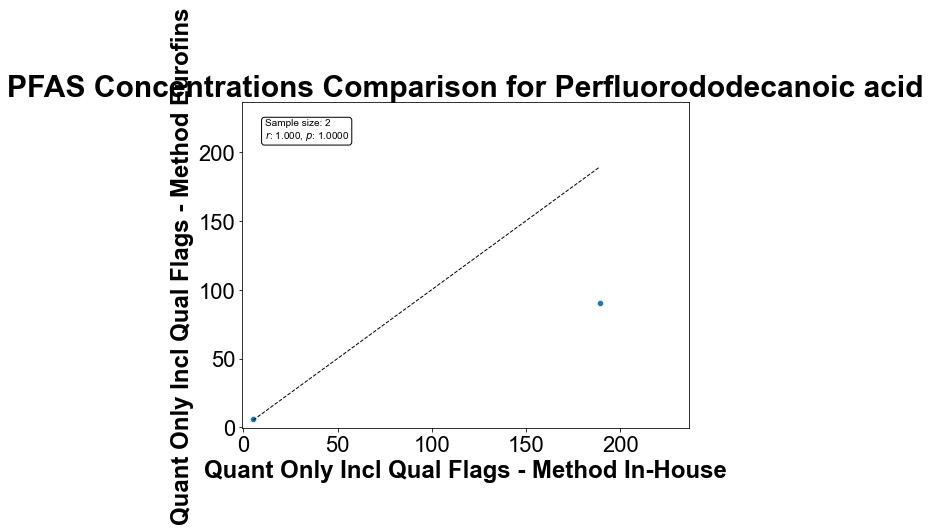

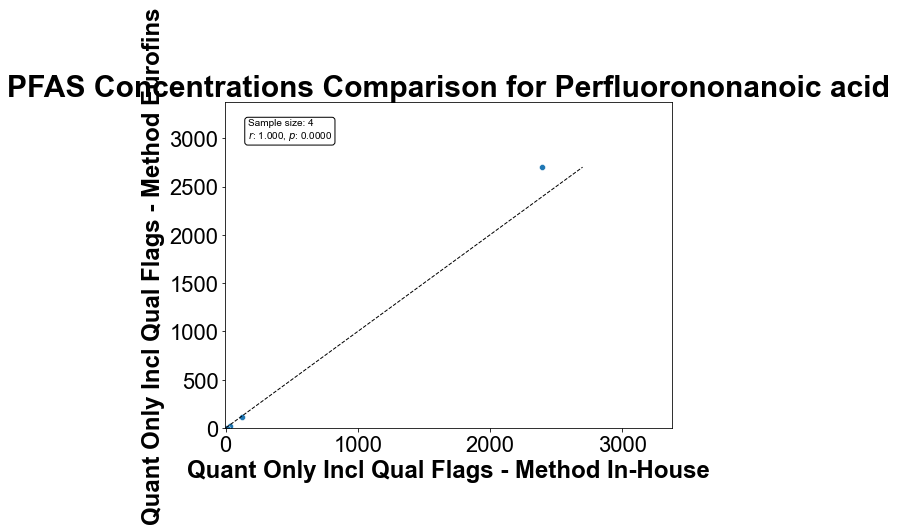

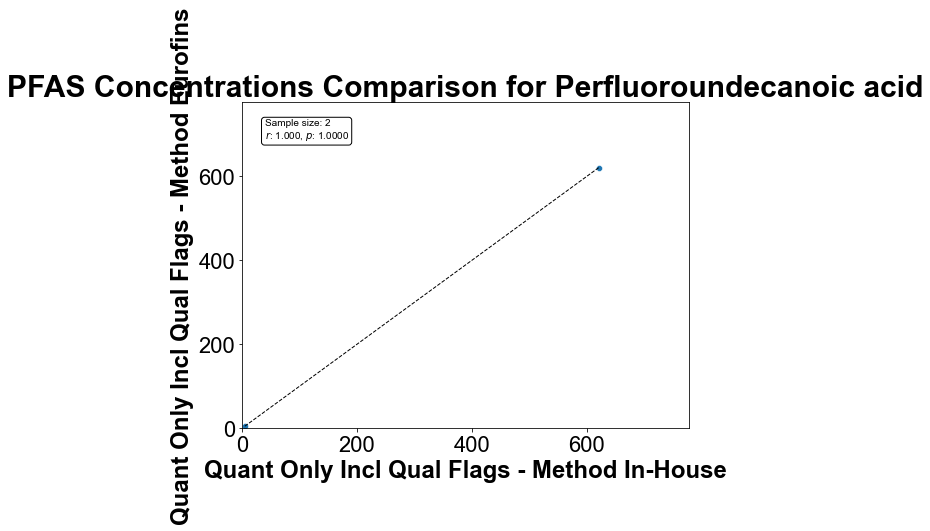

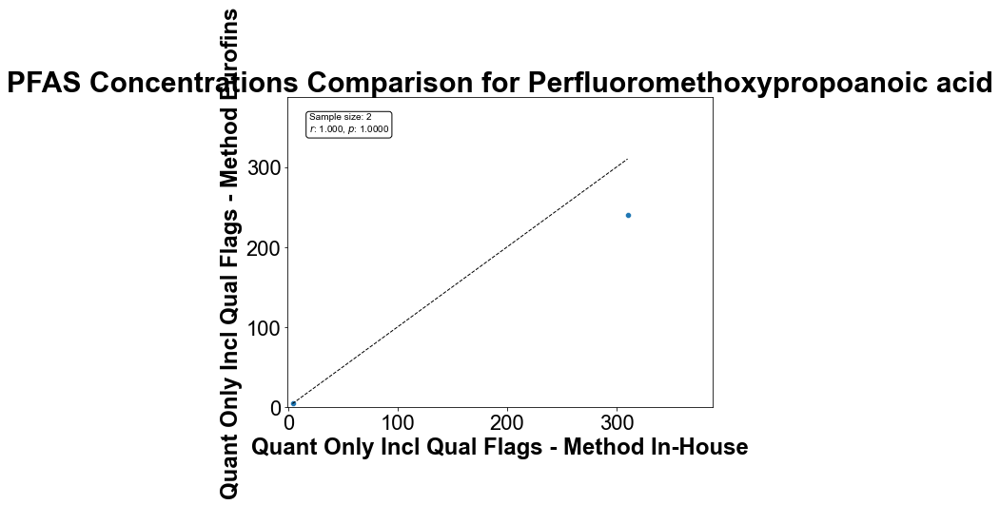

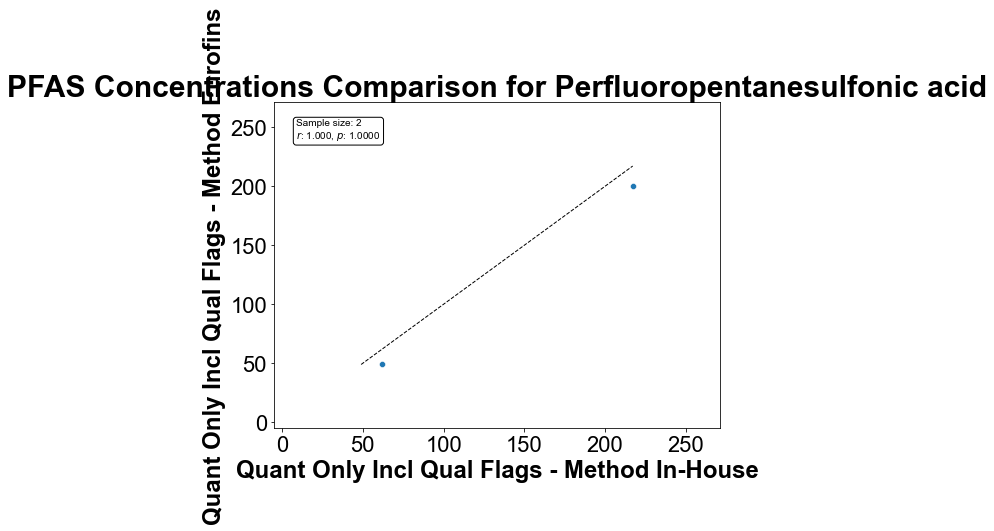

In [169]:
# Get unique PFAS compounds
unique_compounds = quant_df['PFAS Compound_InHouse'].unique()

# Iterate through each unique compound and create a scatter plot
for compound in unique_compounds:
    # Filter the DataFrame for the current compound
    compound_df = quant_df[quant_df['PFAS Compound_InHouse'] == compound].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
    
    # Ensure there are at least two data points
    if len(compound_df) >= 2:
        # Calculate local min and max for the current compound's data
        local_min = min(compound_df['Quant Only Incl Qual Flags_InHouse'].min(), compound_df['Quant Only Incl Qual Flags_Eurofins'].min())
        local_max = max(compound_df['Quant Only Incl Qual Flags_InHouse'].max(), compound_df['Quant Only Incl Qual Flags_Eurofins'].max())
        
        # Calculate Pearson correlation coefficient and p-value
        r_value, p_value = scipy.stats.pearsonr(compound_df['Quant Only Incl Qual Flags_InHouse'], compound_df['Quant Only Incl Qual Flags_Eurofins'])
        sample_size = len(compound_df)
        
        # Create the scatter plot
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=compound_df, x='Quant Only Incl Qual Flags_InHouse', y='Quant Only Incl Qual Flags_Eurofins')
        
        # Set the same limits for both axes based on local min and max
        plt.xlim(local_min*-.1, local_max*1.25)
        plt.ylim(local_min*-.1, local_max*1.25)
        
        # Adding plot titles and labels
        plt.title(f'PFAS Concentrations Comparison for {compound}')
        plt.xlabel('Quant Only Incl Qual Flags - Method In-House')
        plt.ylabel('Quant Only Incl Qual Flags - Method Eurofins')
        
        # Adding a diagonal line to indicate where x = y
        plt.plot([local_min, local_max], [local_min, local_max], 'k--', linewidth=1)
        
        # Annotate plot with statistics
        plt.annotate(f'Sample size: {sample_size}\n$r$: {r_value:.3f}, $p$: {p_value:.4f}', 
                    xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top',
                    bbox=dict(boxstyle='round', fc='w'))
        
        # Show plot
        plt.show()


### Scatter Plots for PFAS Class

In [170]:
def calculate_confidence_interval(r, sample_size, confidence_level=0.95):
    """
    Calculate the confidence interval for a Pearson correlation coefficient using Fisher's z-transformation.
    
    Args:
        r (float): The Pearson correlation coefficient.
        sample_size (int): The number of observations.
        confidence_level (float): The confidence level for the interval.
        
    Returns:
        tuple: The lower and upper bounds of the confidence interval for the correlation coefficient.
    """
    z = np.arctanh(r)
    se = 1 / np.sqrt(sample_size - 3)
    z_critical = scipy.stats.norm.ppf(1 - (1 - confidence_level) / 2)
    z_ci_lower, z_ci_upper = z - z_critical * se, z + z_critical * se
    r_ci_lower, r_ci_upper = np.tanh(z_ci_lower), np.tanh(z_ci_upper)
    
    return r_ci_lower, r_ci_upper


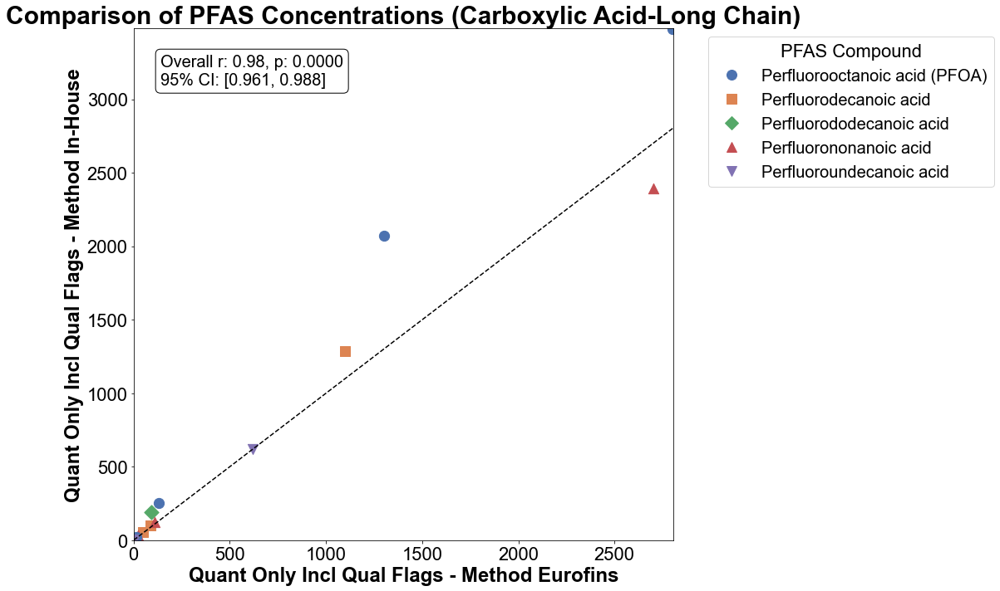

In [176]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].max())

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))
# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Carboxylic Acid-Long Chain)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [172]:
len(filtered_df)

44

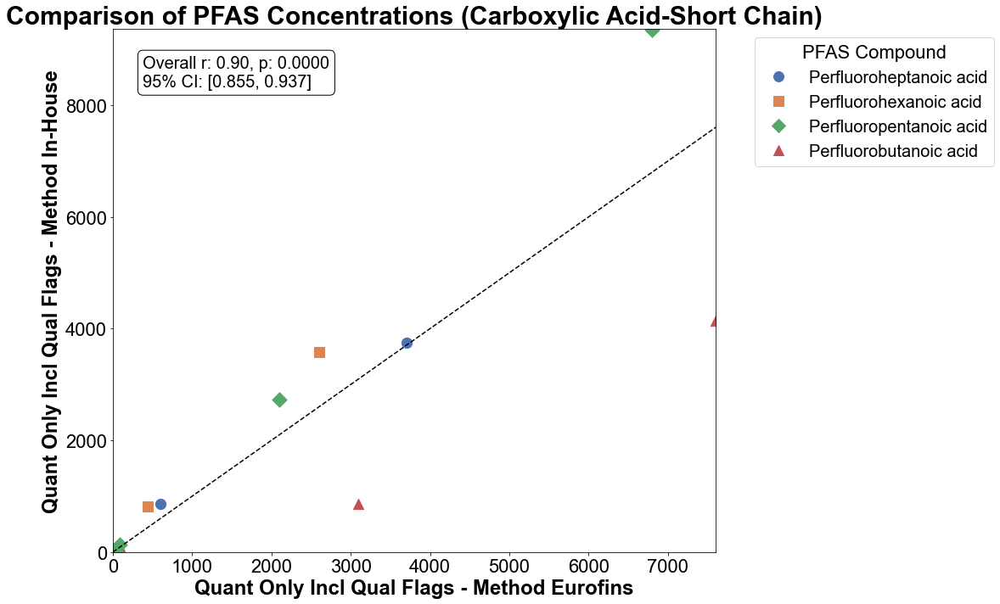

In [173]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max()*1.1, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max()*1.1)

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')

# Calculate the 95% confidence interval for the Pearson correlation coefficient
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))
# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Carboxylic Acid-Short Chain)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [174]:
len(filtered_df)

82

In [178]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_FluorotelomerSulfonicAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max()*1.1, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max()*1.1)

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')

# Calculate the 95% confidence interval for the Pearson correlation coefficient
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))

# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Fluorotelomer Sulfonic Acid)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

ValueError: x and y must have length at least 2.

In [179]:
len(filtered_df)

1

<ipython-input-170-1e6c5671256a>:14: RuntimeWarning: divide by zero encountered in double_scalars
  se = 1 / np.sqrt(sample_size - 3)


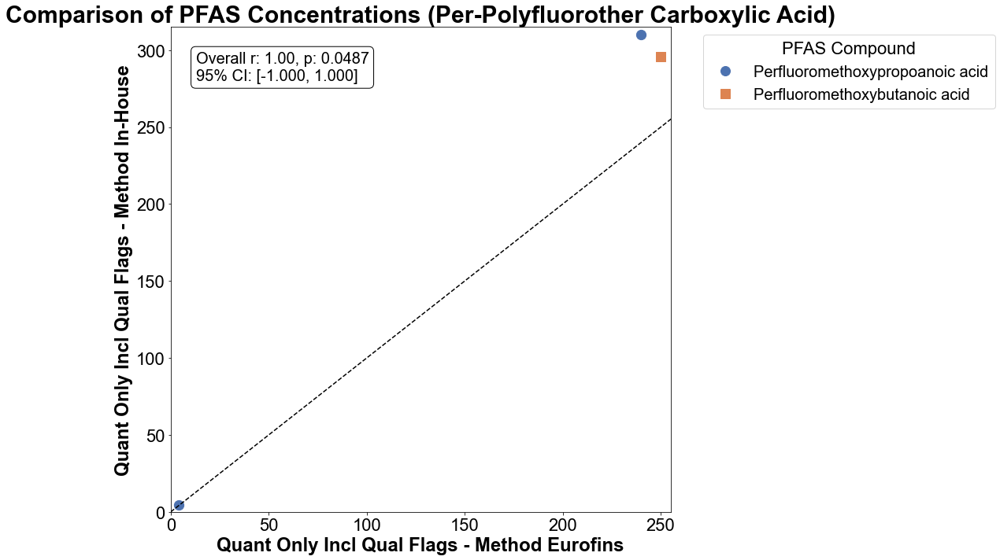

In [180]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_PerPolyfluorotherCarboxylicAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max()*1.1, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max()*1.1)

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')


# Calculate the 95% confidence interval for the Pearson correlation coefficient
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))
# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Per-Polyfluorother Carboxylic Acid)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [181]:
len(filtered_df)

3

<ipython-input-170-1e6c5671256a>:13: RuntimeWarning: divide by zero encountered in arctanh
  z = np.arctanh(r)
<ipython-input-170-1e6c5671256a>:14: RuntimeWarning: invalid value encountered in sqrt
  se = 1 / np.sqrt(sample_size - 3)


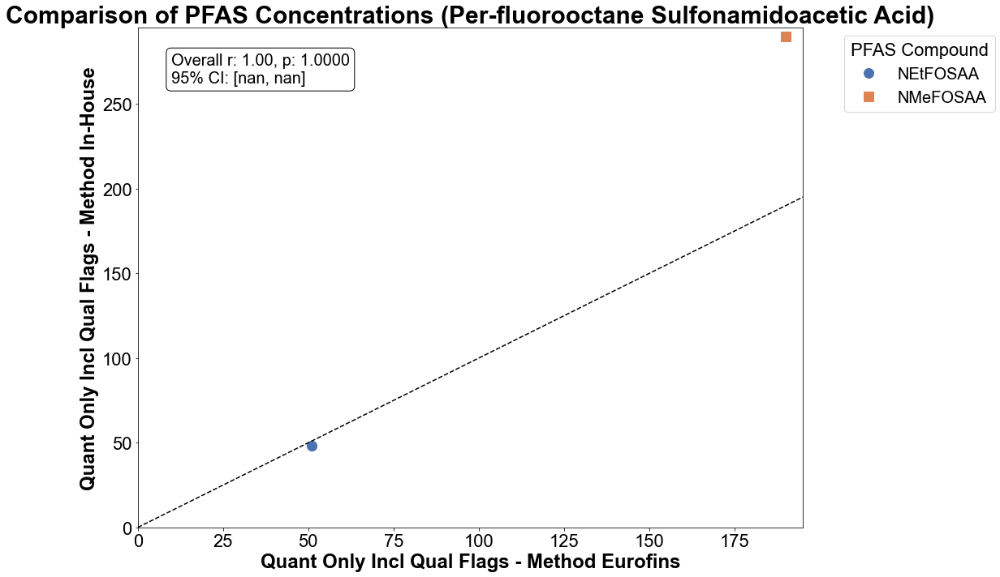

In [182]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max()*1.1, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max()*1.1)

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')


# Calculate the 95% confidence interval for the Pearson correlation coefficient
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))
# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Per-fluorooctane Sulfonamidoacetic Acid)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [183]:
len(filtered_df)

2

In [184]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_PerfluorooctaneSulfonamideEthanol)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max()*1.1, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max()*1.1)

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')


# Calculate the 95% confidence interval for the Pearson correlation coefficient
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))
# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Per-fluorooctane Sulfonamide Ethanol)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

ValueError: x and y must have length at least 2.

In [185]:
len(filtered_df)

0

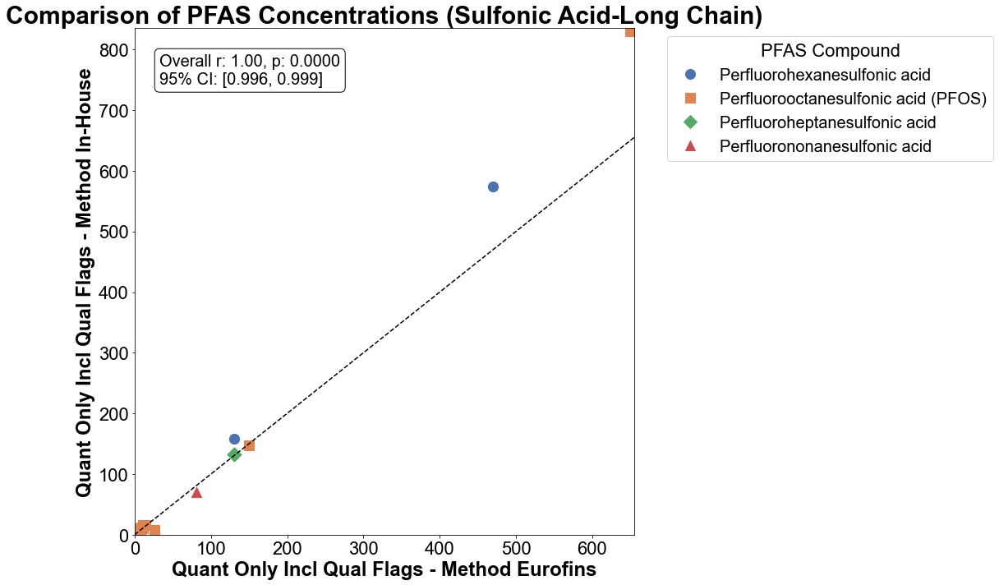

In [186]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max()*1.1, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max()*1.1)

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')


# Calculate the 95% confidence interval for the Pearson correlation coefficient
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))
# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Sulfonic Acid-Long Chain)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [187]:
len(filtered_df)

54

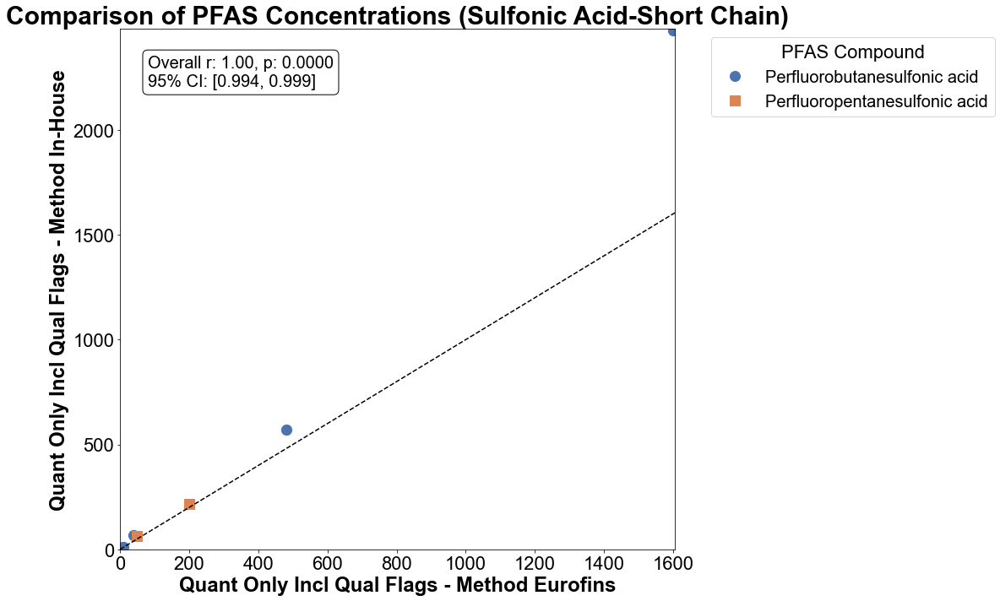

In [188]:
# Define markers and a color palette
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'H', '+', 'x', 'X', 'd', '|', '_','*','8']
colors = sns.color_palette("deep", n_colors=len(pfas_compounds_CarboxylicAcid_Long))

# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate Pearson correlation coefficient and p-value for the filtered dataset
r_value, p_value = scipy.stats.pearsonr(filtered_df['Quant Only Incl Qual Flags_InHouse'], filtered_df['Quant Only Incl Qual Flags_Eurofins'])

# Create a mapping for compounds to markers
compound_style_map = {compound: (marker, color) for compound, marker, color in zip(filtered_df['PFAS Compound_Eurofins'].unique(), itertools.cycle(markers), itertools.cycle(colors))}

plt.figure(figsize=(16, 10))

# Plot each compound with its assigned marker
for compound, group_data in filtered_df.groupby('PFAS Compound_InHouse'):
    abbr_compound = pfas_mapping.get(compound, compound)  # Use abbreviation if available
    marker, color = compound_style_map[compound]
    plt.scatter(group_data['Quant Only Incl Qual Flags_Eurofins'], group_data['Quant Only Incl Qual Flags_InHouse'], 
                marker=marker, color=color, label=abbr_compound, s=150)  # Increased marker size

# Adjust limits to start at 0
plt.xlim(0, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max() + 5)
plt.ylim(0, filtered_df['Quant Only Incl Qual Flags_InHouse'].max() + 5)

# Calculate the overall min and max values for both variables to ensure the line covers the entire data range
overall_min = min(filtered_df['Quant Only Incl Qual Flags_InHouse'].min(), filtered_df['Quant Only Incl Qual Flags_Eurofins'].min())
overall_max = max(filtered_df['Quant Only Incl Qual Flags_InHouse'].max()*1.1, filtered_df['Quant Only Incl Qual Flags_Eurofins'].max()*1.1)

# Add a dashed diagonal line to indicate perfect correlation
plt.plot([0, overall_max], [0, overall_max], 'k--', label='Perfect Correlation')


# Calculate the 95% confidence interval for the Pearson correlation coefficient
ci_lower, ci_upper = calculate_confidence_interval(r_value, len(filtered_df))
# Annotate the plot with the overall r-value, p-value, and confidence interval
plt.annotate(f'Overall r: {r_value:.2f}, p: {p_value:.4f}\n95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]', 
             xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', 
             bbox=dict(boxstyle='round', fc='w'),fontsize=20)

plt.title('Comparison of PFAS Concentrations (Sulfonic Acid-Short Chain)')
plt.xlabel('Quant Only Incl Qual Flags - Method Eurofins')
plt.ylabel('Quant Only Incl Qual Flags - Method In-House')

# Create custom legend with larger markers
legend_elements = [plt.Line2D([0], [0], marker=style[0], color=style[1], label=abbr, linestyle='None', markersize=12) for abbr, style in compound_style_map.items()]
plt.legend(handles=legend_elements, title='PFAS Compound', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [189]:
len(filtered_df)

31

In [190]:
quant_df['PFAS Compound_InHouse'].unique()

array(['Perfluorobutanesulfonic acid', 'Perfluoroheptanoic acid',
       'Perfluorohexanoic acid', 'Perfluorohexanesulfonic acid',
       'Perfluorooctanoic acid (PFOA)',
       'Perfluorooctanesulfonic acid (PFOS)', 'Perfluoropentanoic acid',
       'Perfluorobutanoic acid', '5:3 FTCA',
       '8:2 Fluorotelomersulfonic acid', 'Perfluorodecanoic acid',
       'Perfluorododecanoic acid', 'Perfluorononanoic acid',
       'Perfluoroundecanoic acid', 'Perfluoromethoxypropoanoic acid',
       'Perfluoroheptanesulfonic acid', 'Perfluoromethoxybutanoic acid',
       'Perfluorononanesulfonic acid', 'Perfluoropentanesulfonic acid',
       '3:3 FTCA', 'NEtFOSAA', 'NMeFOSAA'], dtype=object)

### By Type

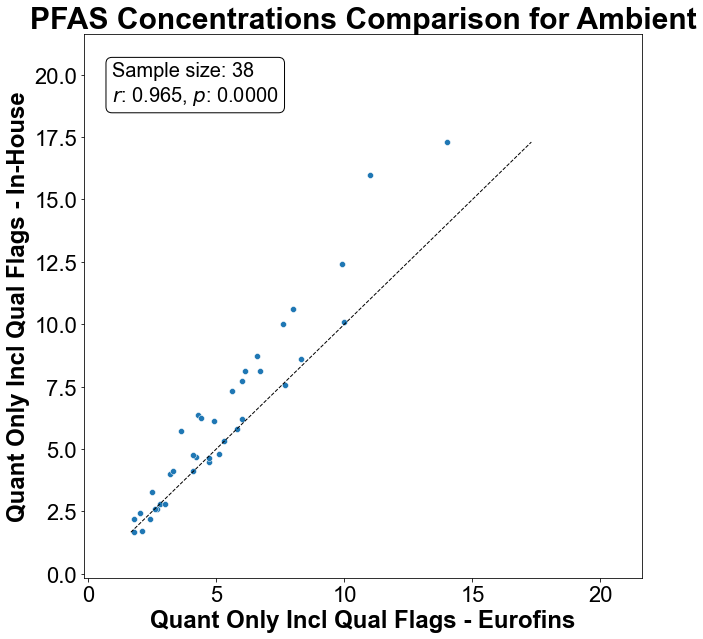

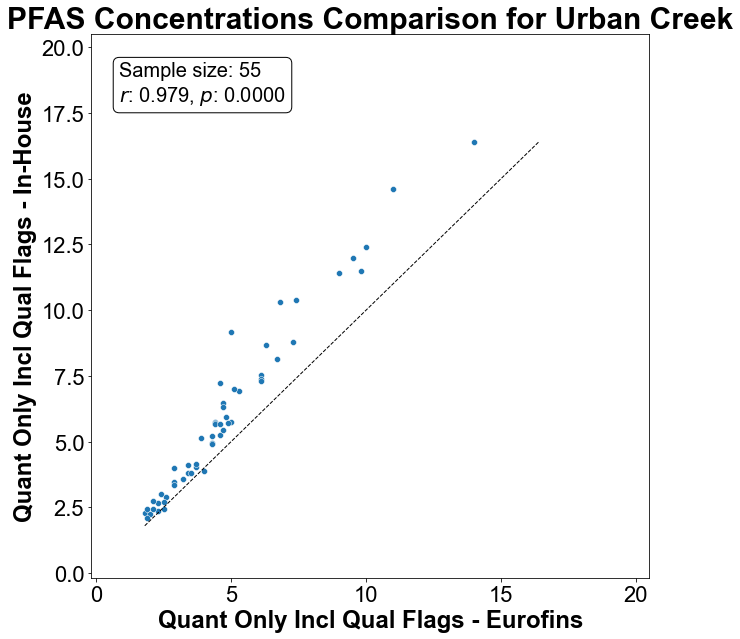

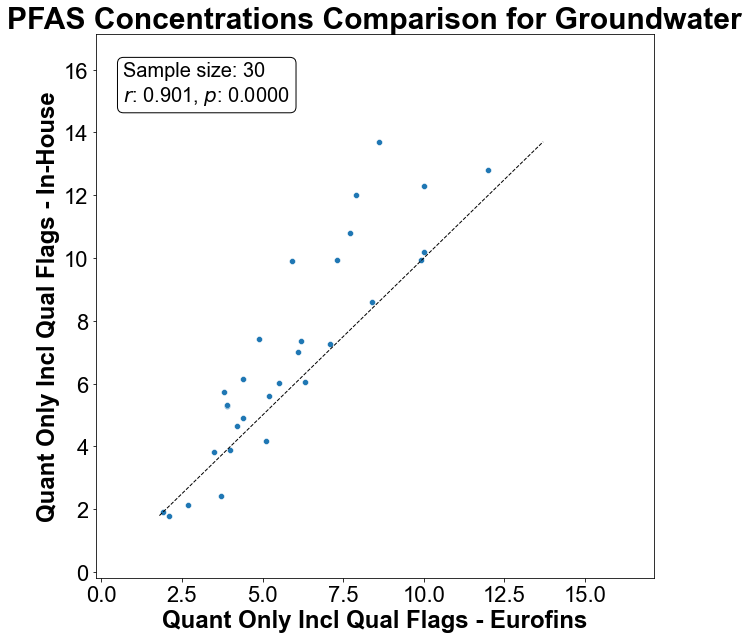

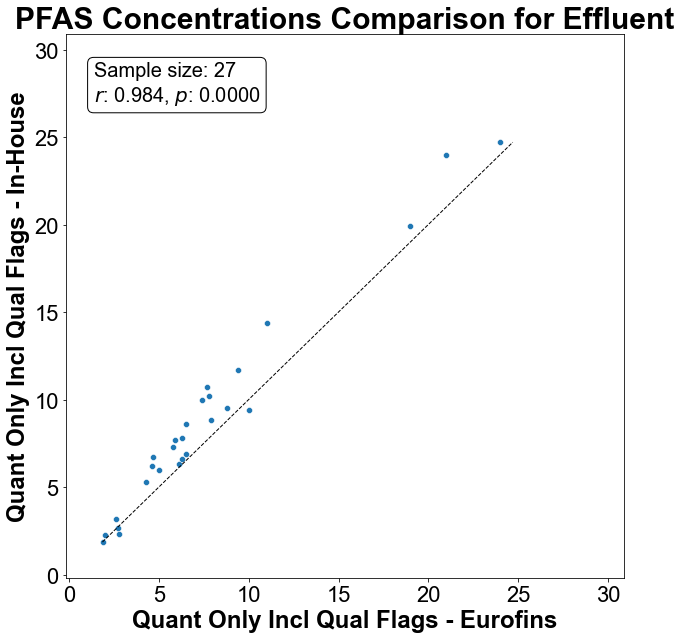

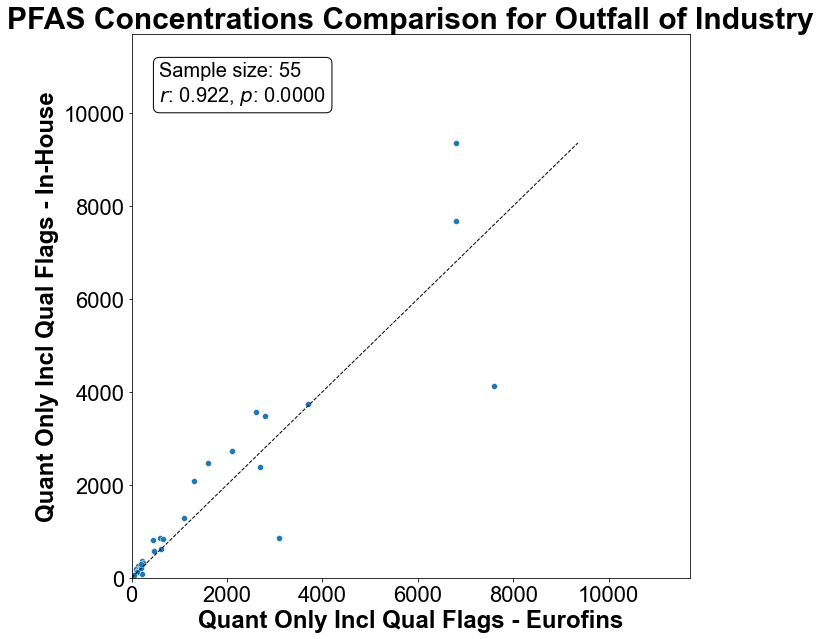

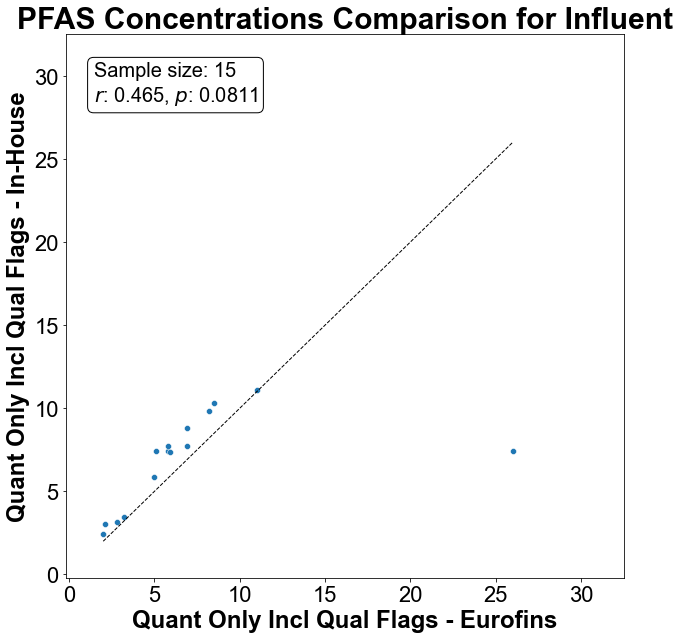

In [191]:
# Get unique PFAS compounds
unique_Types = quant_df['Type_InHouse'].unique()

# Iterate through each unique compound and creaTypete a scatter plot
for Type in unique_Types:
    # Filter the DataFrame for the current compound
    Type_df = quant_df[quant_df['Type_InHouse'] == Type].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
    
    # Ensure there are at least two data points
    if len(Type_df) >= 2:
        # Calculate local min and max for the current compound's data
        local_min = min(Type_df['Quant Only Incl Qual Flags_InHouse'].min(), Type_df['Quant Only Incl Qual Flags_Eurofins'].min())
        local_max = max(Type_df['Quant Only Incl Qual Flags_InHouse'].max(), Type_df['Quant Only Incl Qual Flags_Eurofins'].max())
        
        # Calculate Pearson correlation coefficient and p-value
        r_value, p_value = scipy.stats.pearsonr(Type_df['Quant Only Incl Qual Flags_InHouse'], Type_df['Quant Only Incl Qual Flags_Eurofins'])
        sample_size = len(Type_df)
        
        # Create the scatter plot
        plt.figure(figsize=(10, 10))
        sns.scatterplot(data=Type_df, x='Quant Only Incl Qual Flags_Eurofins', y='Quant Only Incl Qual Flags_InHouse')
        
        # Set the same limits for both axes based on local min and max
        plt.xlim(local_min*-.1, local_max*1.25)
        plt.ylim(local_min*-.1, local_max*1.25)
        
        # Adding plot titles and labels
        plt.title(f'PFAS Concentrations Comparison for {Type}')
        plt.xlabel('Quant Only Incl Qual Flags - Eurofins')
        plt.ylabel('Quant Only Incl Qual Flags - In-House')
        
        # Adding a diagonal line to indicate where x = y
        plt.plot([local_min, local_max], [local_min, local_max], 'k--', linewidth=1)
        
        # Annotate plot with statistics
        plt.annotate(f'Sample size: {sample_size}\n$r$: {r_value:.3f}, $p$: {p_value:.4f}', 
                    xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top',
                    bbox=dict(boxstyle='round', fc='w'),fontsize=20)
        
        # Show plot
        plt.show()


### By Sample Location

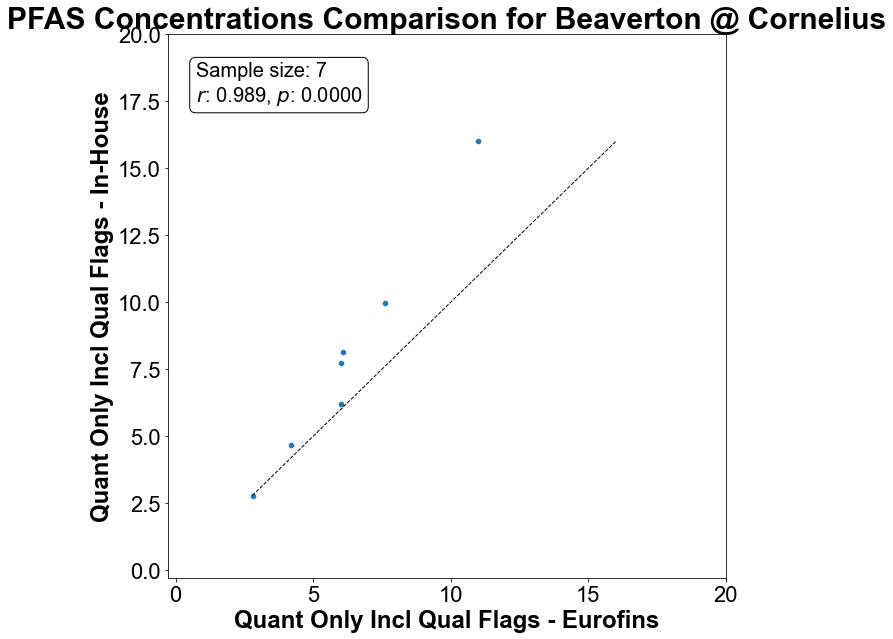

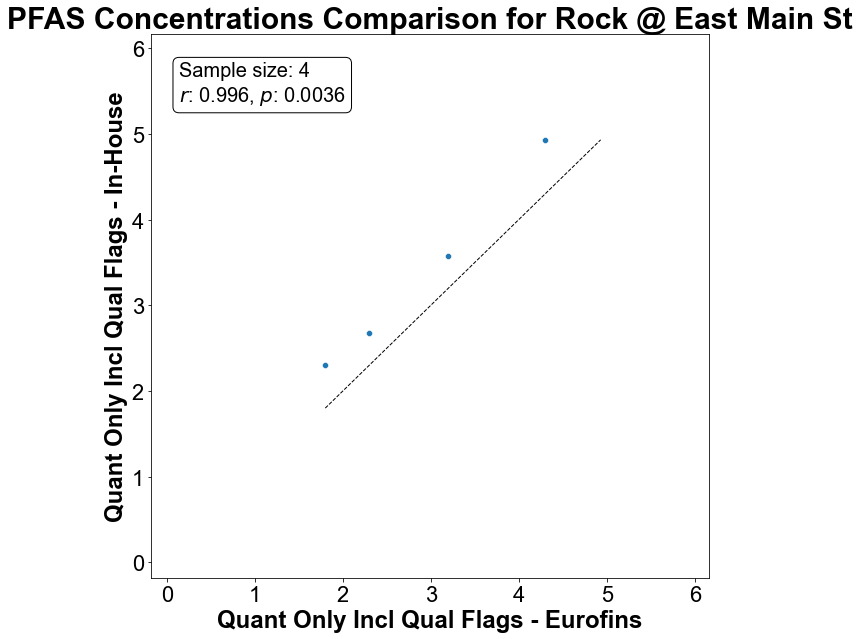

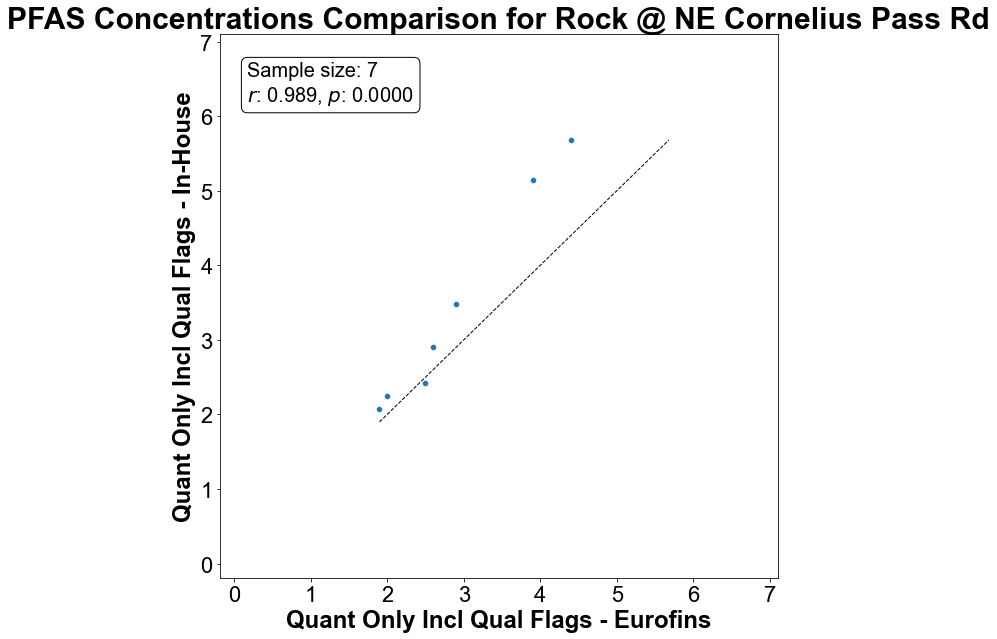

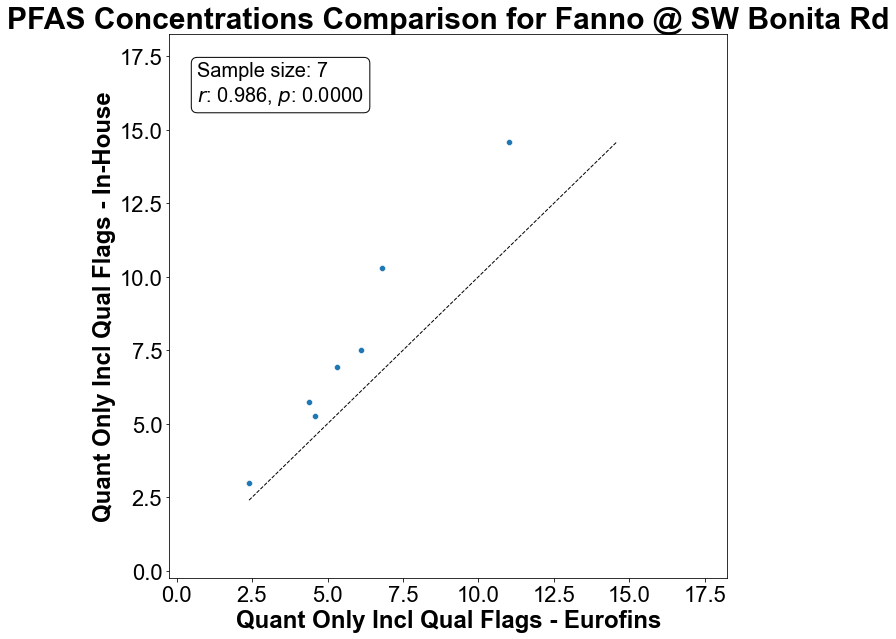

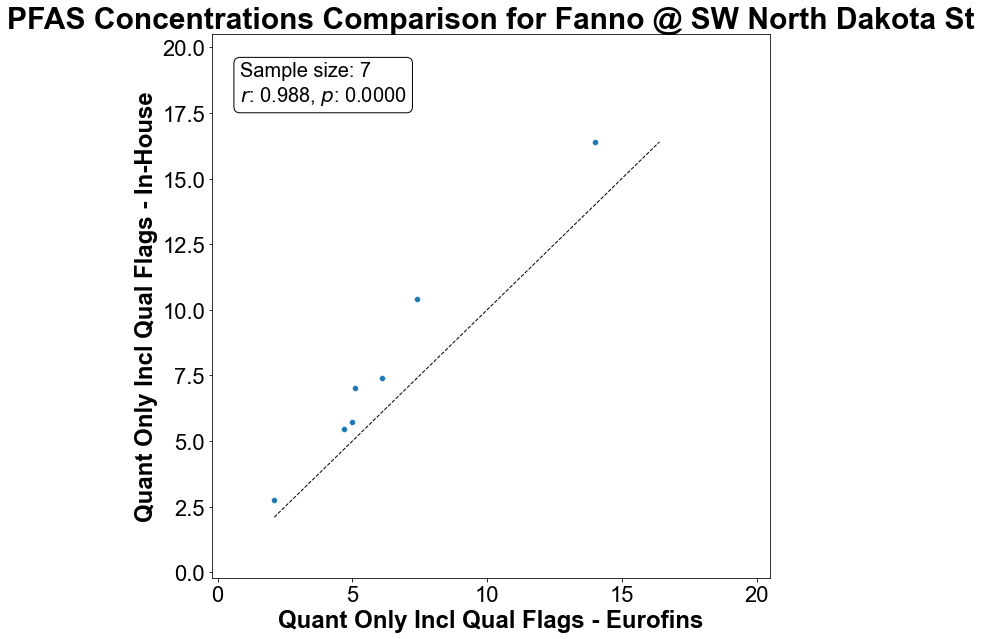

...

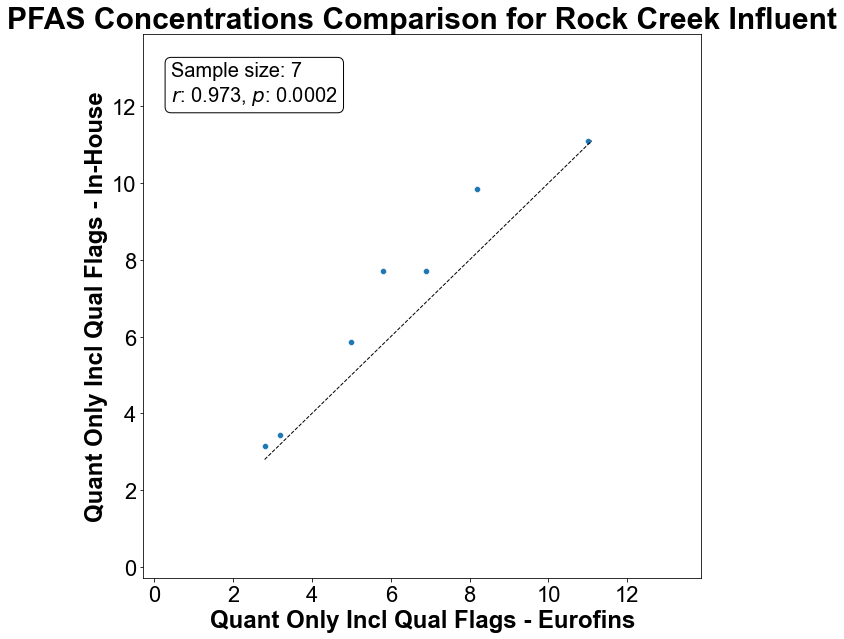

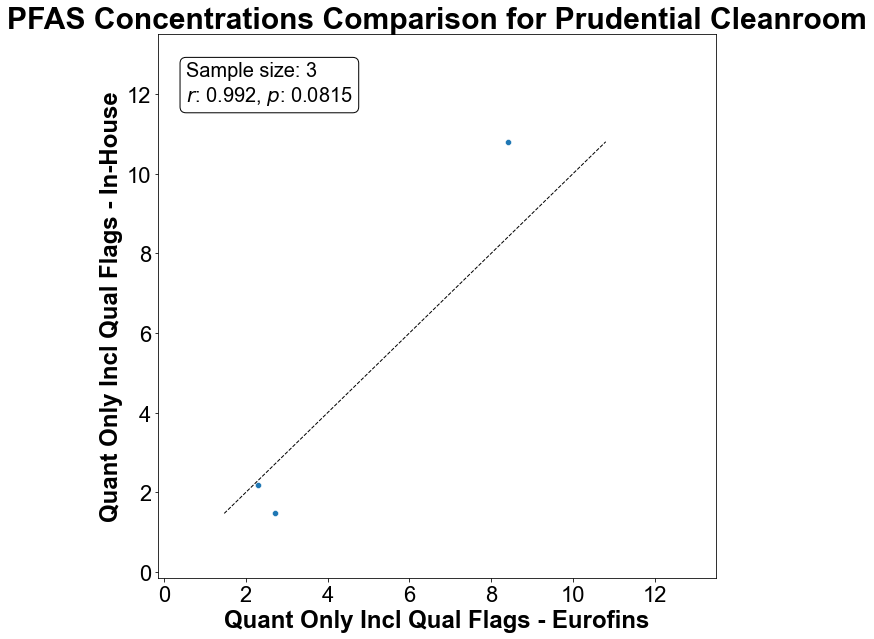

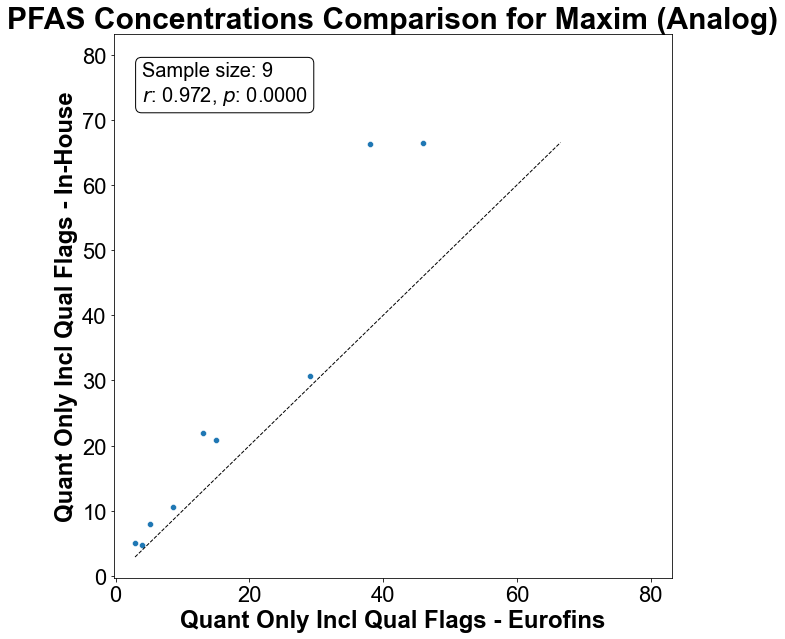

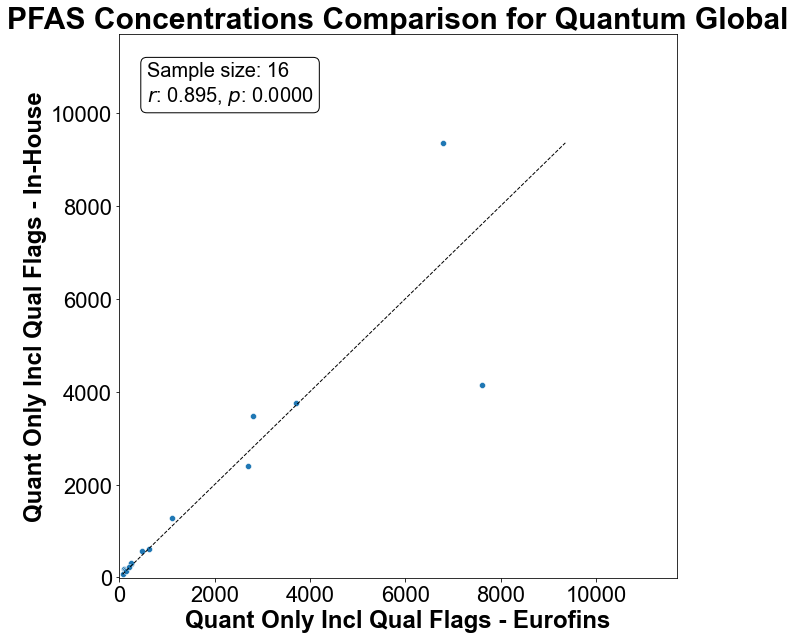

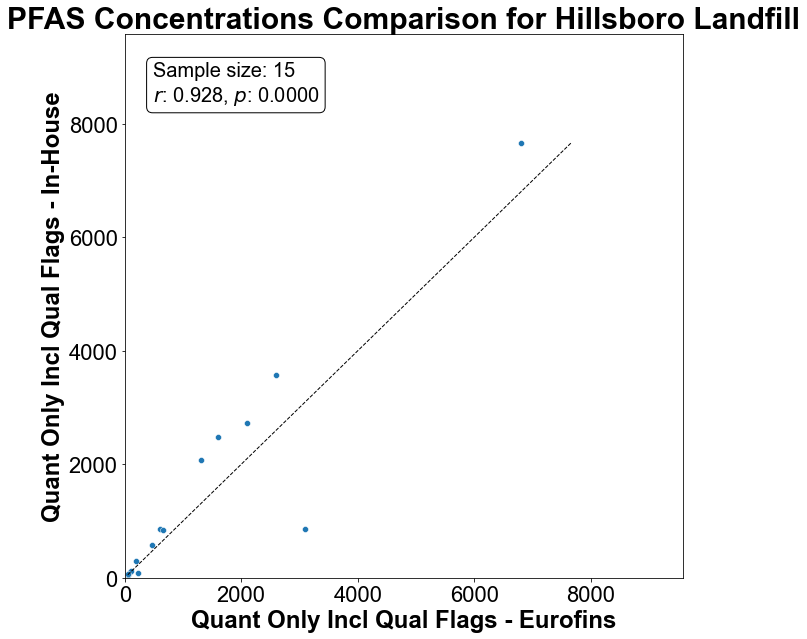

In [192]:
# Get unique PFAS compounds
unique_Locations = quant_df['Sample Location_InHouse'].unique()

# Iterate through each unique compound and creaTypete a scatter plot
for Location in unique_Locations:
    # Filter the DataFrame for the current compound
    Location_df = quant_df[quant_df['Sample Location_InHouse'] == Location].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
    
    # Ensure there are at least two data points
    if len(Location_df) >= 2:
        # Calculate local min and max for the current compound's data
        local_min = min(Location_df['Quant Only Incl Qual Flags_InHouse'].min(), Location_df['Quant Only Incl Qual Flags_Eurofins'].min())
        local_max = max(Location_df['Quant Only Incl Qual Flags_InHouse'].max(), Location_df['Quant Only Incl Qual Flags_Eurofins'].max())
        
        # Calculate Pearson correlation coefficient and p-value
        r_value, p_value = scipy.stats.pearsonr(Location_df['Quant Only Incl Qual Flags_InHouse'], Location_df['Quant Only Incl Qual Flags_Eurofins'])
        sample_size = len(Location_df)
        
        # Create the scatter plot
        plt.figure(figsize=(10, 10))
        sns.scatterplot(data=Location_df, x='Quant Only Incl Qual Flags_Eurofins', y='Quant Only Incl Qual Flags_InHouse')
        
        # Set the same limits for both axes based on local min and max
        plt.xlim(local_min*-.1, local_max*1.25)
        plt.ylim(local_min*-.1, local_max*1.25)
        
        # Adding plot titles and labels
        plt.title(f'PFAS Concentrations Comparison for {Location}')
        plt.xlabel('Quant Only Incl Qual Flags - Eurofins')
        plt.ylabel('Quant Only Incl Qual Flags - In-House')
        
        # Adding a diagonal line to indicate where x = y
        plt.plot([local_min, local_max], [local_min, local_max], 'k--', linewidth=1)
        
        # Annotate plot with statistics
        plt.annotate(f'Sample size: {sample_size}\n$r$: {r_value:.3f}, $p$: {p_value:.4f}', 
                    xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top',
                    bbox=dict(boxstyle='round', fc='w'),fontsize=20)
        
        # Show plot
        plt.show()

#### Custom plot For Durham and Rock Creek Biosolids

In [ ]:
# Define the locations of interest
locations_of_interest = ['Durham Biosolids', 'Rock Creek Biosolids']

# Find common PFAS compounds in both locations
durham_df = quant_df[quant_df['Sample Location_InHouse'] == 'Durham Biosolids']
rock_creek_df = quant_df[quant_df['Sample Location_InHouse'] == 'Rock Creek Biosolids']
common_compounds = set(durham_df['PFAS Compound_InHouse']).intersection(set(rock_creek_df['PFAS Compound_InHouse']))

# Filter dataframes to only include common compounds
durham_common_df = durham_df[durham_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
rock_creek_common_df = rock_creek_df[rock_creek_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Function to create scatter plot for a given location and dataframe
def create_scatter_plot(location, df):
    if len(df) >= 2:
        # Calculate Pearson correlation coefficient and p-value
        r_value, p_value = scipy.stats.pearsonr(df['Quant Only Incl Qual Flags_InHouse'], df['Quant Only Incl Qual Flags_Eurofins'])
        sample_size = len(df)
        
        # Create the scatter plot
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=df, x='Quant Only Incl Qual Flags_InHouse', y='Quant Only Incl Qual Flags_Eurofins')
        plt.plot([df['Quant Only Incl Qual Flags_InHouse'].min(), df['Quant Only Incl Qual Flags_InHouse'].max()], 
                 [df['Quant Only Incl Qual Flags_Eurofins'].min(), df['Quant Only Incl Qual Flags_Eurofins'].max()], 'k--', linewidth=1)
        plt.title(f'PFAS Concentrations Comparison for {location}')
        plt.xlabel('Quant Only Incl Qual Flags - Method In-House')
        plt.ylabel('Quant Only Incl Qual Flags - Method Eurofins')
        plt.annotate(f'Sample size: {sample_size}\n$r$: {r_value:.3f}, $p$: {p_value:.4f}', 
                     xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top',
                     bbox=dict(boxstyle='round', fc='w'))
        plt.tight_layout()
        plt.show()

# Create scatter plots for each location of interest with common PFAS compounds
for location in locations_of_interest:
    if location == 'Durham Biosolids':
        create_scatter_plot(location, durham_common_df)
    elif location == 'Rock Creek Biosolids':
        create_scatter_plot(location, rock_creek_common_df)


## Bland-Altman plot

In [218]:
def bootstrap_mean_ci(data, n_bootstraps=10000, ci=95):
    """
    Bootstraps the mean of a dataset and calculates the confidence interval of the mean.
    
    Parameters:
    - data: array-like, the dataset from which to bootstrap.
    - n_bootstraps: int, the number of bootstrap samples to draw.
    - ci: float, the confidence interval percentage.
    
    Returns:
    - mean_ci_lower: float, the lower bound of the confidence interval.
    - mean_ci_upper: float, the upper bound of the confidence interval.
    - bootstrapped_means: array, the bootstrapped means.
    """
    bootstrapped_means = []
    for _ in range(n_bootstraps):
        # Sample with replacement and calculate the mean
        sample = np.random.choice(data, size=len(data), replace=True)
        sample_mean = np.mean(sample)
        bootstrapped_means.append(sample_mean)
    
    # Calculate the confidence interval
    lower_percentile = (100 - ci) / 2
    upper_percentile = 100 - lower_percentile
    mean_ci_lower = np.percentile(bootstrapped_means, lower_percentile)
    mean_ci_upper = np.percentile(bootstrapped_means, upper_percentile)
    
    return mean_ci_lower, mean_ci_upper, bootstrapped_means


### All Quant

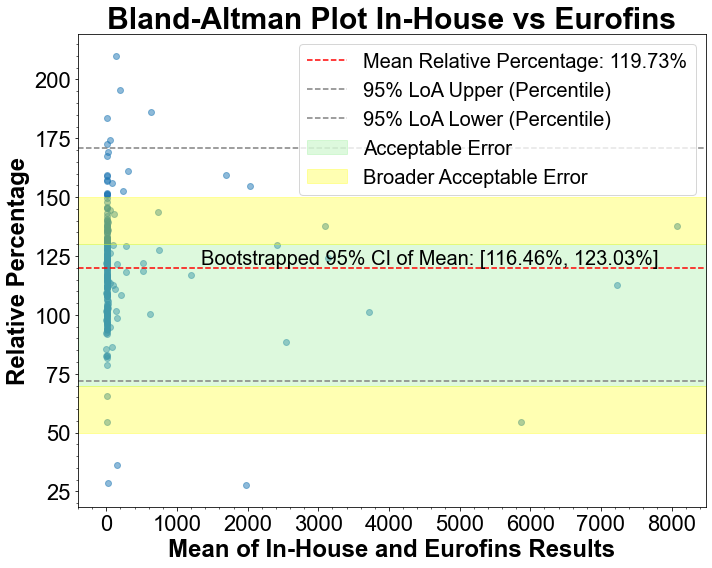

In [219]:
# Assuming method1 and method2 are your data series from the DataFrame
method2 = quant_df['Quant Only Incl Qual Flags_InHouse']
method1 = quant_df['Quant Only Incl Qual Flags_Eurofins']

# Calculate the mean of the measurements and the percent difference
means = (method1 + method2) / 2
percent_diff = (method2/ method1) * 100

# Calculate the mean percent difference
mean_percent_diff = np.mean(percent_diff)

# Bootstrap to estimate the CI of the mean percent difference
# Correctly unpack the returned values, ignoring bootstrapped_means
ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

# Calculate the 2.5th and 97.5th percentiles of the percent differences for the LoA
loa_lower = np.percentile(percent_diff, 2.5)
loa_upper = np.percentile(percent_diff, 97.5)

# Generate the Bland-Altman plot for percent difference
plt.figure(figsize=(10, 8))
plt.scatter(means, percent_diff, alpha=0.5)
plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}%')
plt.axhline(loa_upper, color='gray', linestyle='--', label='95% LoA Upper (Percentile)')
plt.axhline(loa_lower, color='gray', linestyle='--', label='95% LoA Lower (Percentile)')

# Determine new xmin and xmax based on the means data range and extend them a bit
xmin, xmax = min(means), max(means)
xrange_extension = (xmax - xmin) * 0.05  # Extend the range by 5% on each side
xmin_extended, xmax_extended = xmin - xrange_extension, xmax + xrange_extension

# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)

# Now, explicitly set the x-axis limits to include the extended range
plt.xlim(xmin_extended, xmax_extended)

# Annotate the plot with the bootstrapped CI of the mean percent difference
plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center',
             fontsize=20)
# Add minor ticks on both axes
plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())

plt.title('Bland-Altman Plot In-House vs Eurofins')
plt.xlabel('Mean of In-House and Eurofins Results')
plt.ylabel('Relative Percentage')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()



### By PFAS Compound

In [220]:
# Assuming merged_df is your DataFrame and 'PFAS Compound_1633' is the column you want to group by
grouped_counts = quant_df.groupby('PFAS Compound_InHouse').size()

# To display the counts for each group
print(grouped_counts)

PFAS Compound_InHouse
3:3 FTCA                                1
5:3 FTCA                                2
8:2 Fluorotelomersulfonic acid          1
NEtFOSAA                                1
NMeFOSAA                                1
Perfluorobutanesulfonic acid           29
Perfluorobutanoic acid                  7
Perfluorodecanoic acid                  4
Perfluorododecanoic acid                2
Perfluoroheptanesulfonic acid           1
Perfluoroheptanoic acid                22
Perfluorohexanesulfonic acid           26
Perfluorohexanoic acid                 31
Perfluoromethoxybutanoic acid           1
Perfluoromethoxypropoanoic acid         2
Perfluorononanesulfonic acid            1
Perfluorononanoic acid                  4
Perfluorooctanesulfonic acid (PFOS)    26
Perfluorooctanoic acid (PFOA)          32
Perfluoropentanesulfonic acid           2
Perfluoropentanoic acid                22
Perfluoroundecanoic acid                2
dtype: int64


Not enough data for 3:3 FTCA to generate a Bland-Altman plot.


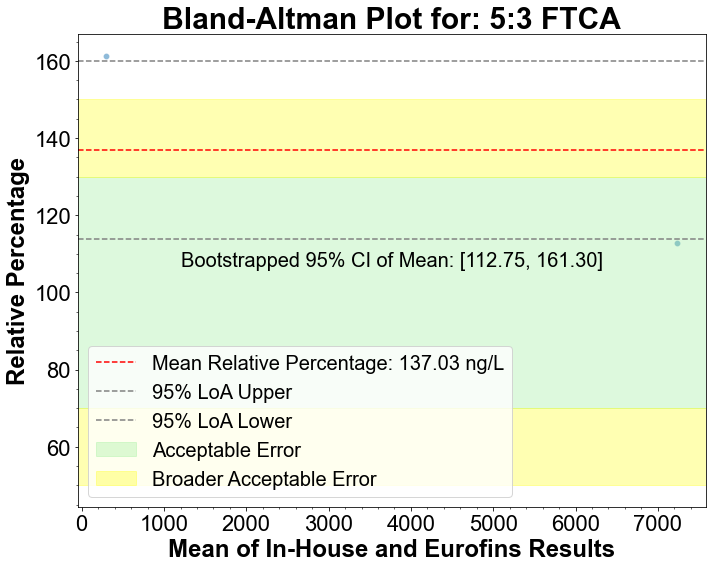

Not enough data for 8:2 Fluorotelomersulfonic acid to generate a Bland-Altman plot.
Not enough data for NEtFOSAA to generate a Bland-Altman plot.
Not enough data for NMeFOSAA to generate a Bland-Altman plot.


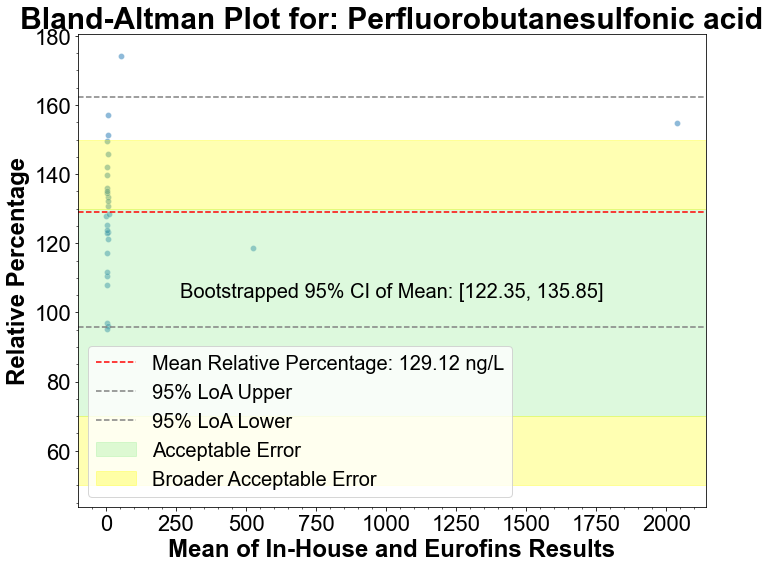

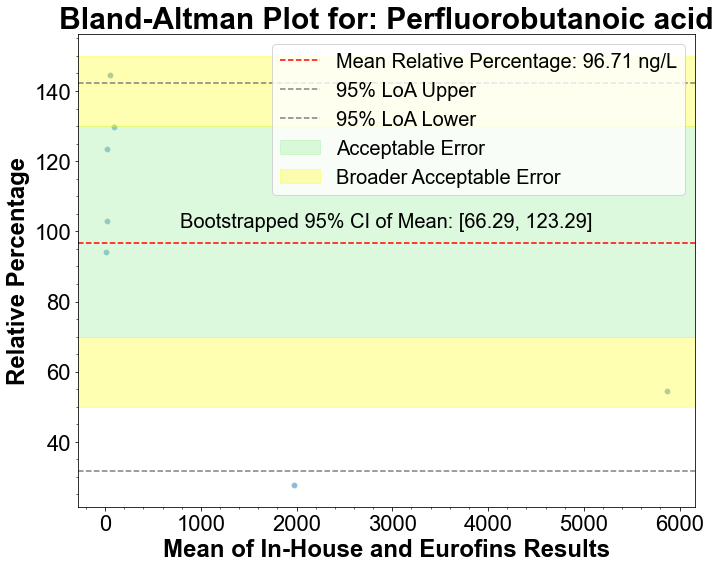

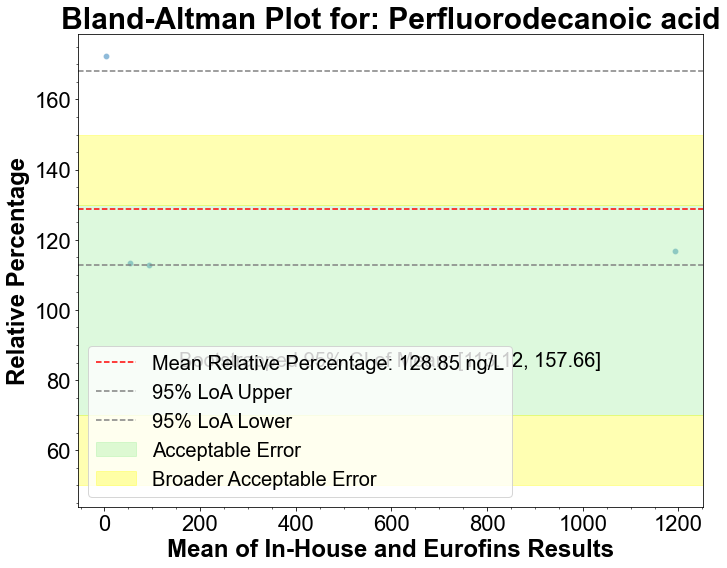

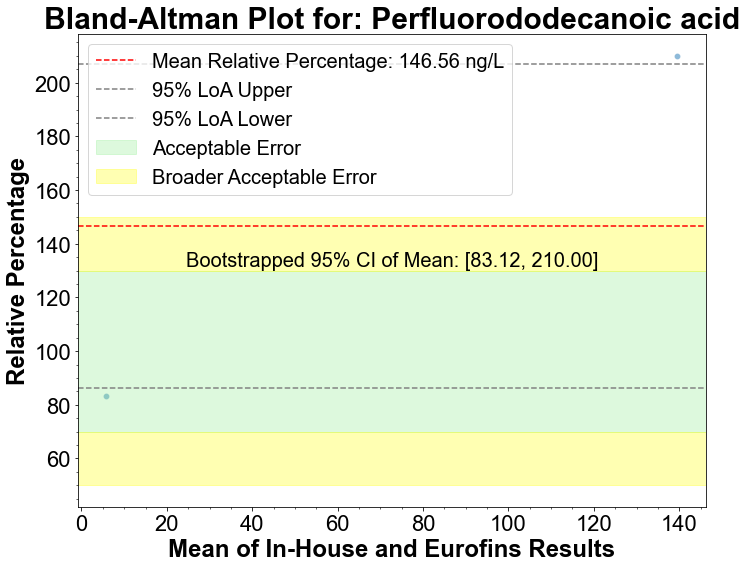

Not enough data for Perfluoroheptanesulfonic acid to generate a Bland-Altman plot.


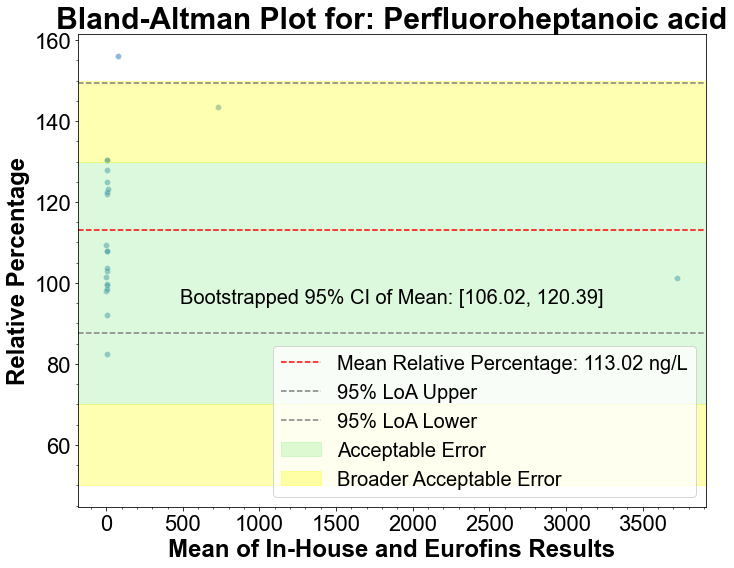

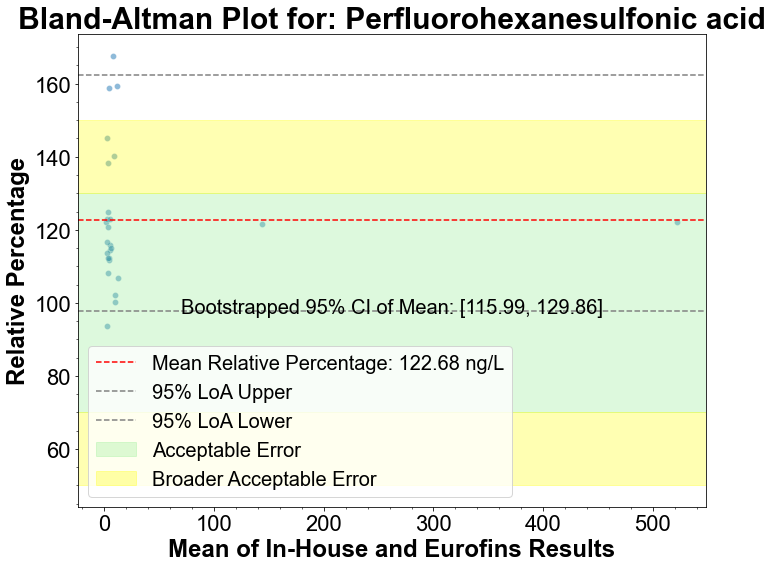

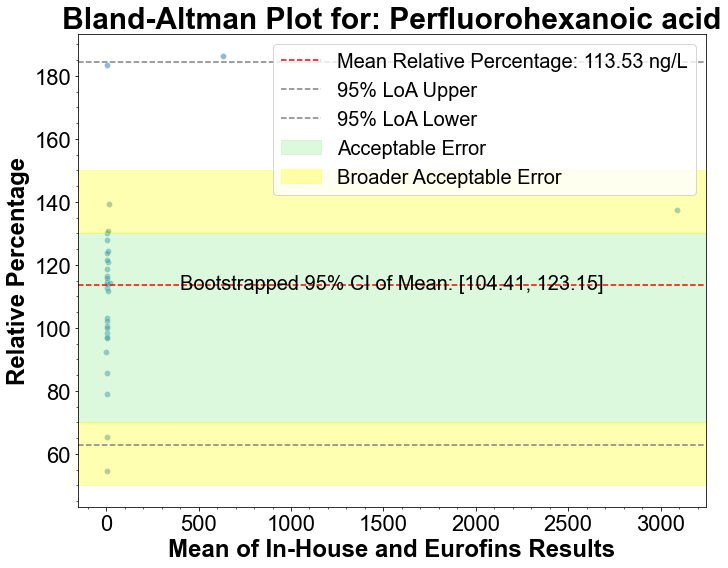

Not enough data for Perfluoromethoxybutanoic acid to generate a Bland-Altman plot.


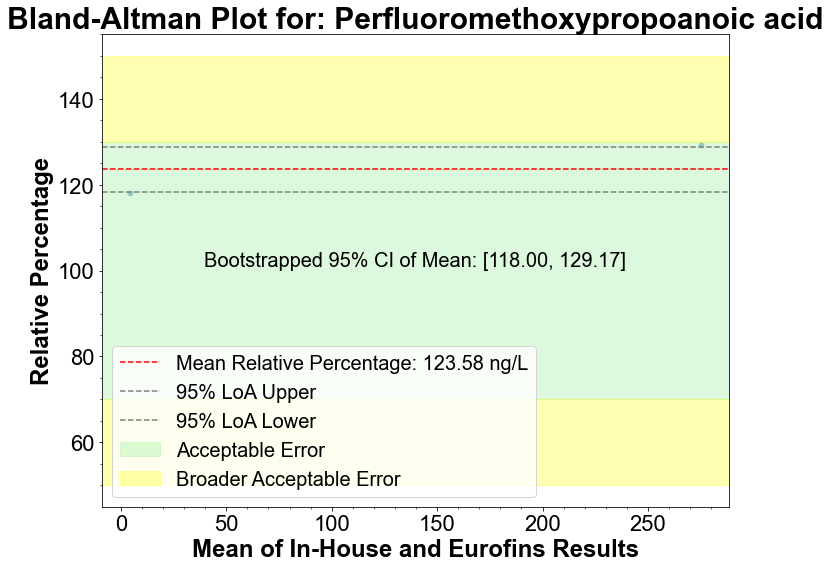

Not enough data for Perfluorononanesulfonic acid to generate a Bland-Altman plot.


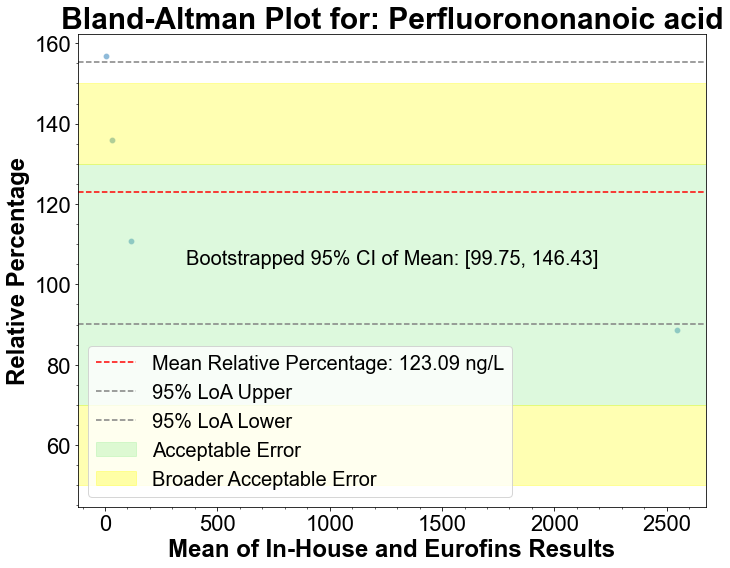

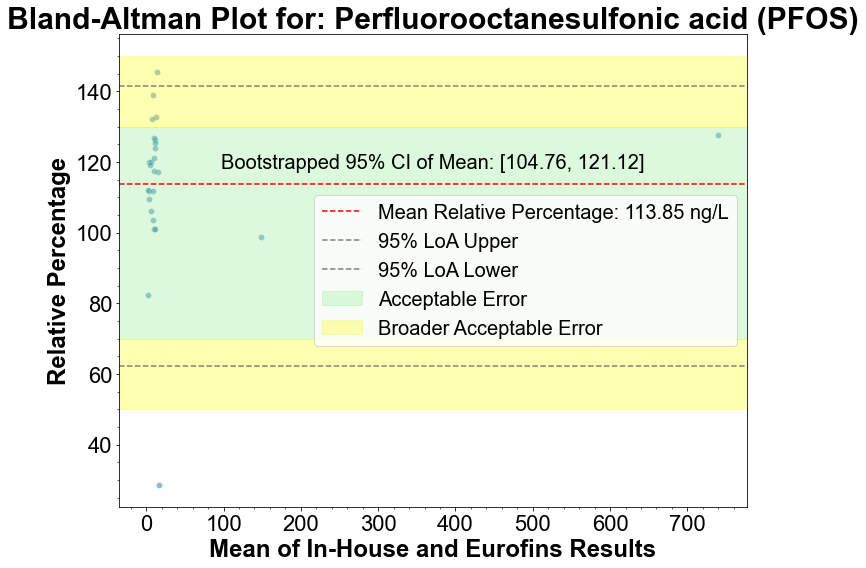

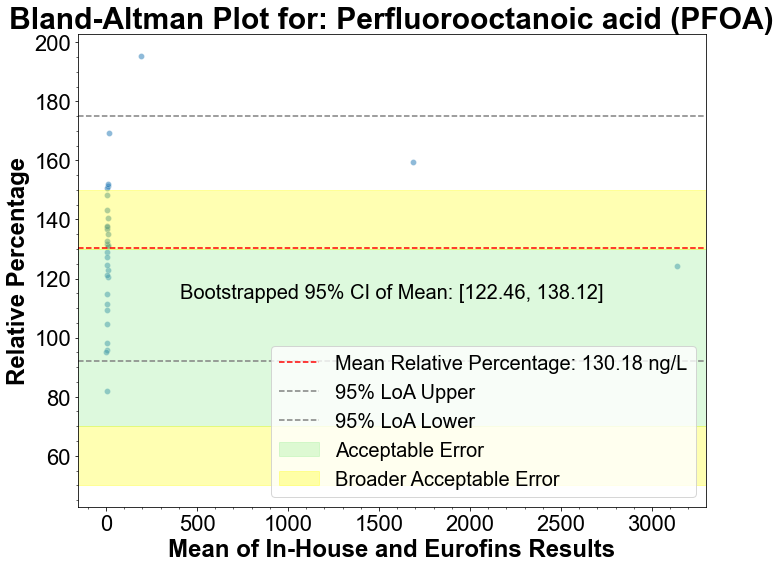

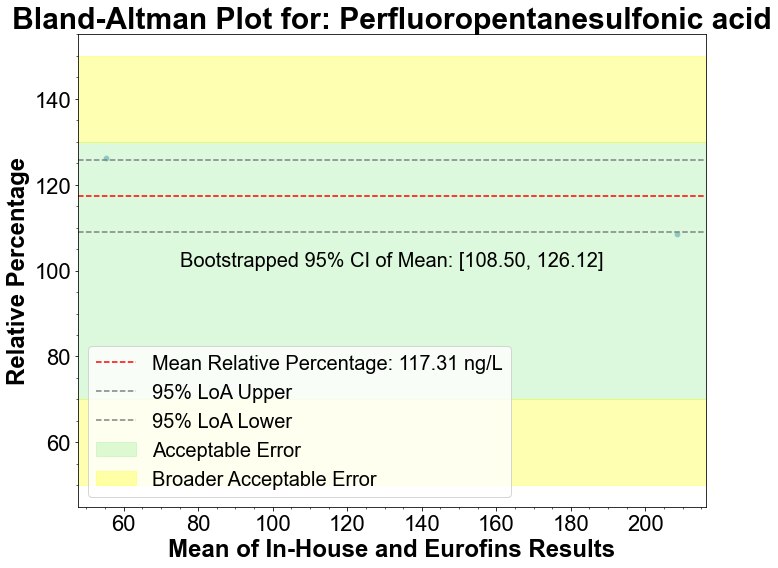

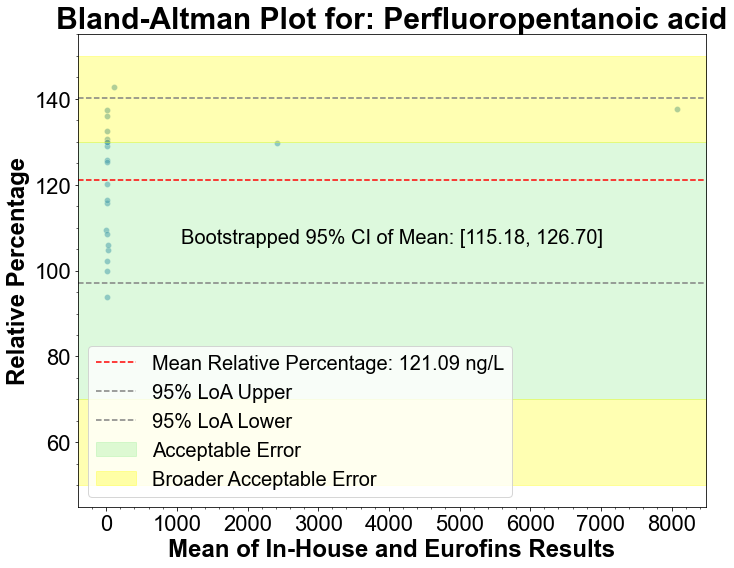

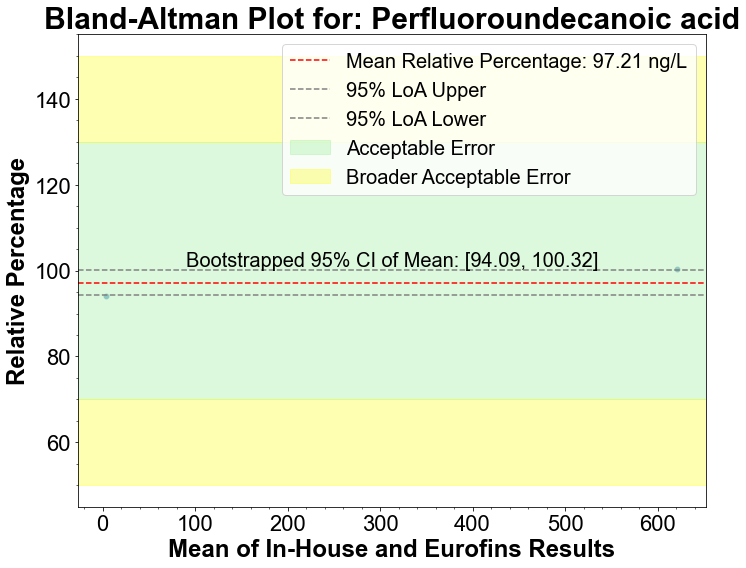

In [221]:
# Assuming quant_df is your DataFrame and bootstrap_mean_ci is defined as given
groups = quant_df.groupby('PFAS Compound_InHouse')

for compound, group in groups:
    method2 = group['Quant Only Incl Qual Flags_InHouse'].dropna()
    method1 = group['Quant Only Incl Qual Flags_Eurofins'].dropna()
    
    if len(method1) > 1 and len(method2) > 1:
        means = (method1 + method2) / 2
        diff = (method2/ method1) * 100
        
        # Calculate initial LoA
        loa_lower_initial = np.percentile(diff, 2.5)
        loa_upper_initial = np.percentile(diff, 97.5)
        
        # Recalculate mean percent difference 
        mean_diff = np.mean(diff)
        
        # Recalculate CI for the mean percent difference without outliers
        ci_lower, ci_upper, _ = bootstrap_mean_ci(diff, n_bootstraps=10000, ci=95)
        
        # Plotting
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x=means, y=diff, alpha=0.5)
        plt.axhline(mean_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_diff:.2f} ng/L')
        plt.axhline(loa_upper_initial, color='gray', linestyle='--', label='95% LoA Upper')
        plt.axhline(loa_lower_initial, color='gray', linestyle='--', label='95% LoA Lower')
        
        # Determine the full range of the x-axis based on data
        xmin, xmax = plt.xlim()
        plt.xlim(xmin, xmax)

        ymin, ymax = plt.ylim()
        y_range = ymax - ymin
        mean_diff_frac = (mean_diff - ymin) / y_range 
        
        # Shade the region of acceptable error (±30% Percent Error) using the extended range
        plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
        # Shade the region of acceptable error (±30% Percent Error) using the extended range
        plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
        # Shade the region of acceptable error (±30% Percent Error) using the extended range
        plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)
        
        # Annotate with the new CI of the mean percent difference
        plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}, {ci_upper:.2f}]', xy=(0.5, mean_diff_frac+.02), xycoords='axes fraction', ha='center', va='center', fontsize=20)
        
        # Add minor ticks on both axes
        plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
        plt.gca().yaxis.set_minor_locator(AutoMinorLocator())

        plt.title(f'Bland-Altman Plot for: {compound}')
        plt.xlabel('Mean of In-House and Eurofins Results')
        plt.ylabel('Relative Percentage')
        plt.legend(loc='best')
        
        plt.tight_layout()
        plt.show()
    else:
        print(f"Not enough data for {compound} to generate a Bland-Altman plot.")

### By PFAS Class

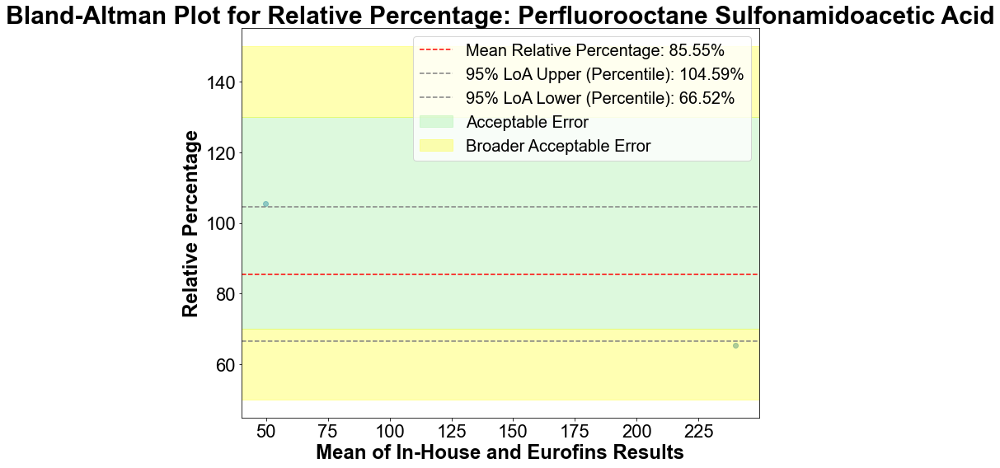

In [222]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Extract the two methods' measurements from the dataframe
method1 = filtered_df['Quant Only Incl Qual Flags_InHouse']
method2 = filtered_df['Quant Only Incl Qual Flags_Eurofins']

# Calculate the mean of the measurements and the percent difference
means = (method1 + method2) / 2
percent_diff =(method2/ method1) * 100

# Bootstrap to estimate the CI of the mean percent difference
ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

# Calculate the mean percent difference
mean_percent_diff = np.mean(percent_diff)

# Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
loa_lower = np.percentile(percent_diff, 2.5)
loa_upper = np.percentile(percent_diff, 97.5)

# Generate the Bland-Altman plot for percent difference
plt.figure(figsize=(10, 8))
plt.scatter(means, percent_diff, alpha=0.5)
plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}%')
plt.axhline(loa_upper, color='gray', linestyle='--', label=f'95% LoA Upper (Percentile): {loa_upper:.2f}%')
plt.axhline(loa_lower, color='gray', linestyle='--', label=f'95% LoA Lower (Percentile): {loa_lower:.2f}%')

# Shade the region of acceptable error (±30% Percent Error)
xmin, xmax = plt.xlim()
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)

# Adjust the x-axis limits if necessary
plt.xlim(xmin, xmax)

# Annotate the plot with the bootstrapped CI of the mean percent difference
#plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center', fontsize=20)

# Adding labels and title
plt.title('Bland-Altman Plot for Relative Percentage: Perfluorooctane Sulfonamidoacetic Acid')
plt.xlabel('Mean of In-House and Eurofins Results')
plt.ylabel('Relative Percentage')

# Adding a legend
plt.legend()

plt.tight_layout()
plt.show()


In [223]:
len(filtered_df)

2

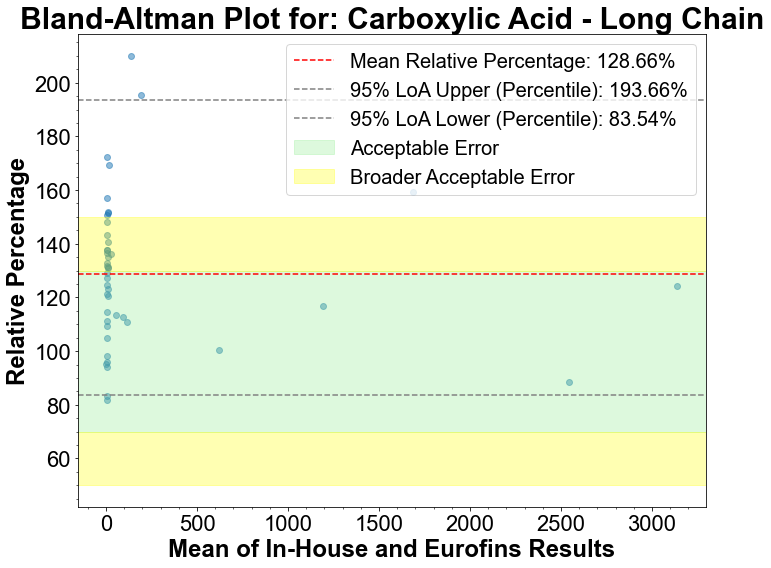

In [224]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Extract the two methods' measurements from the dataframe
method2 = filtered_df['Quant Only Incl Qual Flags_InHouse']
method1 = filtered_df['Quant Only Incl Qual Flags_Eurofins']

# Calculate the mean of the measurements and the percent difference
means = (method1 + method2) / 2
percent_diff = (method2/ method1) * 100

# Bootstrap to estimate the CI of the mean percent difference
ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

# Calculate the mean percent difference
mean_percent_diff = np.mean(percent_diff)

# Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
loa_lower = np.percentile(percent_diff, 2.5)
loa_upper = np.percentile(percent_diff, 97.5)

# Generate the Bland-Altman plot for percent difference
plt.figure(figsize=(10, 8))
plt.scatter(means, percent_diff, alpha=0.5)
plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}%')
plt.axhline(loa_upper, color='gray', linestyle='--', label=f'95% LoA Upper (Percentile): {loa_upper:.2f}%')
plt.axhline(loa_lower, color='gray', linestyle='--', label=f'95% LoA Lower (Percentile): {loa_lower:.2f}%')

# Shade the region of acceptable error (±30% Percent Error)
xmin, xmax = plt.xlim()
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)

# Adjust the x-axis limits if necessary
plt.xlim(xmin, xmax)

# Annotate the plot with the bootstrapped CI of the mean percent difference
#plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center',fontsize=20)

# Adding labels and title
plt.title('Bland-Altman Plot for: Carboxylic Acid - Long Chain')
plt.xlabel('Mean of In-House and Eurofins Results')
plt.ylabel('Relative Percentage')
# Add minor ticks on both axes
plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
# Adding a legend
plt.legend()

plt.tight_layout()
plt.show()


In [225]:
len(filtered_df)

44

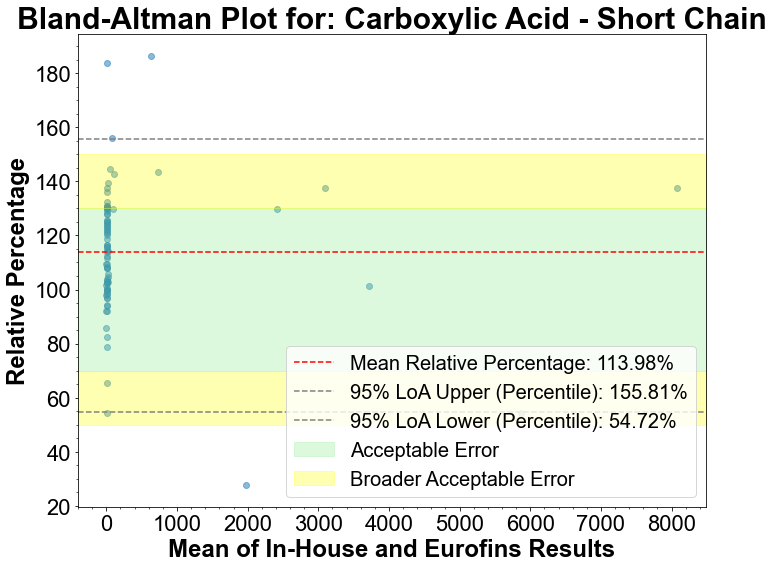

In [226]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Extract the two methods' measurements from the dataframe
method2 = filtered_df['Quant Only Incl Qual Flags_InHouse']
method1 = filtered_df['Quant Only Incl Qual Flags_Eurofins']

# Calculate the mean of the measurements and the percent difference
means = (method1 + method2) / 2
percent_diff = (method2/ method1) * 100

# Bootstrap to estimate the CI of the mean percent difference
ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

# Calculate the mean percent difference
mean_percent_diff = np.mean(percent_diff)

# Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
loa_lower = np.percentile(percent_diff, 2.5)
loa_upper = np.percentile(percent_diff, 97.5)

# Generate the Bland-Altman plot for percent difference
plt.figure(figsize=(10, 8))
plt.scatter(means, percent_diff, alpha=0.5)
plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}%')
plt.axhline(loa_upper, color='gray', linestyle='--', label=f'95% LoA Upper (Percentile): {loa_upper:.2f}%')
plt.axhline(loa_lower, color='gray', linestyle='--', label=f'95% LoA Lower (Percentile): {loa_lower:.2f}%')

# Shade the region of acceptable error (±30% Percent Error)
xmin, xmax = plt.xlim()
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)

# Adjust the x-axis limits if necessary
plt.xlim(xmin, xmax)

# Annotate the plot with the bootstrapped CI of the mean percent difference
#plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center',fontsize=20)

# Adding labels and title
plt.title('Bland-Altman Plot for: Carboxylic Acid - Short Chain')
plt.xlabel('Mean of In-House and Eurofins Results')
plt.ylabel('Relative Percentage')
# Add minor ticks on both axes
plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
# Adding a legend
plt.legend()

plt.tight_layout()
plt.show()


In [227]:
len(filtered_df)

82

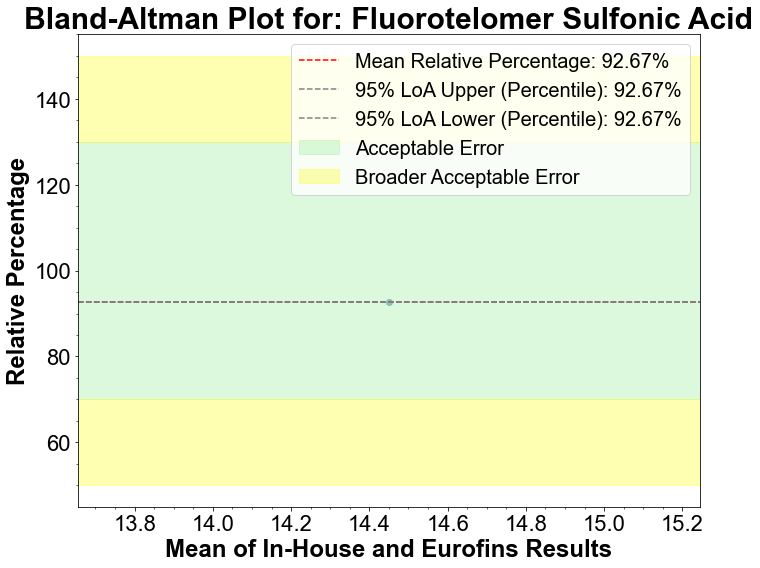

In [228]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_FluorotelomerSulfonicAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Extract the two methods' measurements from the dataframe
method2 = filtered_df['Quant Only Incl Qual Flags_InHouse']
method1 = filtered_df['Quant Only Incl Qual Flags_Eurofins']

# Calculate the mean of the measurements and the percent difference
means = (method1 + method2) / 2
percent_diff = (method2/ method1) * 100

# Bootstrap to estimate the CI of the mean percent difference
ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

# Calculate the mean percent difference
mean_percent_diff = np.mean(percent_diff)

# Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
loa_lower = np.percentile(percent_diff, 2.5)
loa_upper = np.percentile(percent_diff, 97.5)

# Generate the Bland-Altman plot for percent difference
plt.figure(figsize=(10, 8))
plt.scatter(means, percent_diff, alpha=0.5)
plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}%')
plt.axhline(loa_upper, color='gray', linestyle='--', label=f'95% LoA Upper (Percentile): {loa_upper:.2f}%')
plt.axhline(loa_lower, color='gray', linestyle='--', label=f'95% LoA Lower (Percentile): {loa_lower:.2f}%')

# Shade the region of acceptable error (±30% Percent Error)
xmin, xmax = plt.xlim()
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)

# Adjust the x-axis limits if necessary
plt.xlim(xmin, xmax)

# Annotate the plot with the bootstrapped CI of the mean percent difference
#plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center',fontsize=20)

# Adding labels and title
plt.title('Bland-Altman Plot for: Fluorotelomer Sulfonic Acid')
plt.xlabel('Mean of In-House and Eurofins Results')
plt.ylabel('Relative Percentage')
# Add minor ticks on both axes
plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
# Adding a legend
plt.legend()

plt.tight_layout()
plt.show()


In [229]:
len(filtered_df)

1

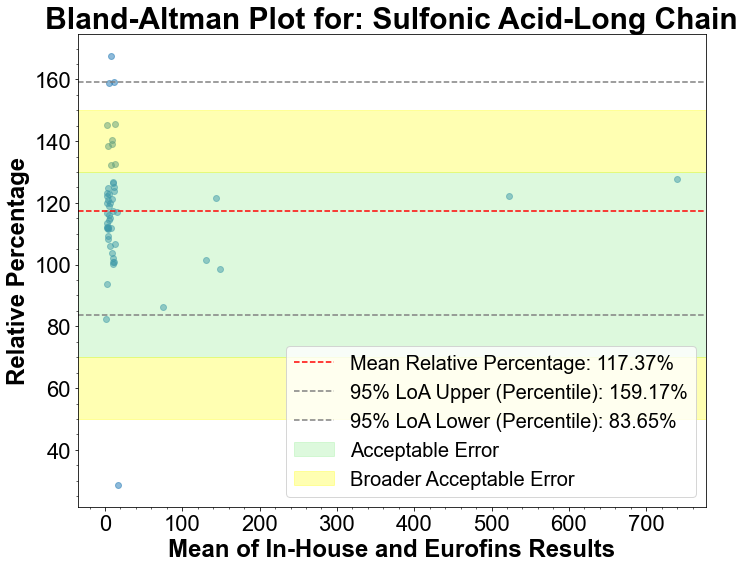

In [230]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Extract the two methods' measurements from the dataframe
method2 = filtered_df['Quant Only Incl Qual Flags_InHouse']
method1 = filtered_df['Quant Only Incl Qual Flags_Eurofins']

# Calculate the mean of the measurements and the percent difference
means = (method1 + method2) / 2
percent_diff = (method2/ method1) * 100

# Bootstrap to estimate the CI of the mean percent difference
ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

# Calculate the mean percent difference
mean_percent_diff = np.mean(percent_diff)

# Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
loa_lower = np.percentile(percent_diff, 2.5)
loa_upper = np.percentile(percent_diff, 97.5)

# Generate the Bland-Altman plot for percent difference
plt.figure(figsize=(10, 8))
plt.scatter(means, percent_diff, alpha=0.5)
plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}%')
plt.axhline(loa_upper, color='gray', linestyle='--', label=f'95% LoA Upper (Percentile): {loa_upper:.2f}%')
plt.axhline(loa_lower, color='gray', linestyle='--', label=f'95% LoA Lower (Percentile): {loa_lower:.2f}%')

# Shade the region of acceptable error (±30% Percent Error)
xmin, xmax = plt.xlim()
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)

# Adjust the x-axis limits if necessary
plt.xlim(xmin, xmax)

# Annotate the plot with the bootstrapped CI of the mean percent difference
#plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center',fontsize=20)

# Adding labels and title
plt.title('Bland-Altman Plot for: Sulfonic Acid-Long Chain')
plt.xlabel('Mean of In-House and Eurofins Results')
plt.ylabel('Relative Percentage')
# Add minor ticks on both axes
plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
# Adding a legend
plt.legend()

plt.tight_layout()
plt.show()


In [231]:
len(filtered_df)

54

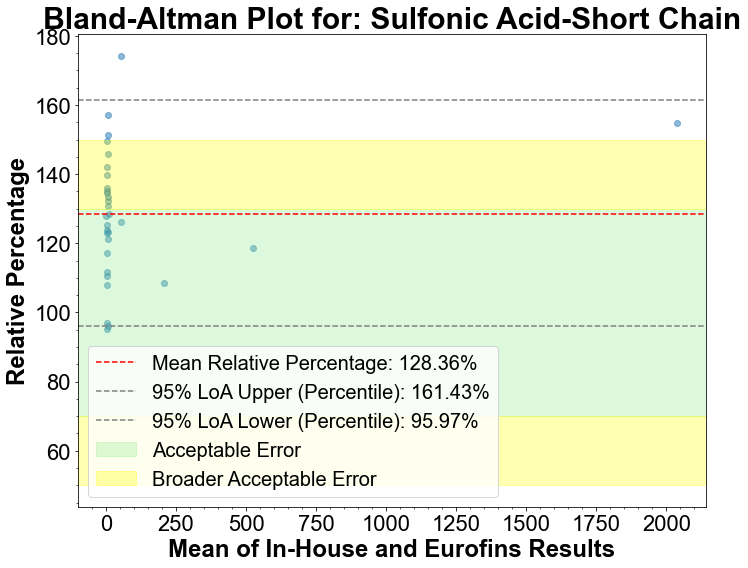

In [243]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Extract the two methods' measurements from the dataframe
method2 = filtered_df['Quant Only Incl Qual Flags_InHouse']
method1 = filtered_df['Quant Only Incl Qual Flags_Eurofins']

# Calculate the mean of the measurements and the percent difference
means = (method1 + method2) / 2
percent_diff = (method2/ method1) * 100

# Bootstrap to estimate the CI of the mean percent difference
ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

# Calculate the mean percent difference
mean_percent_diff = np.mean(percent_diff)

# Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
loa_lower = np.percentile(percent_diff, 2.5)
loa_upper = np.percentile(percent_diff, 97.5)

# Generate the Bland-Altman plot for percent difference
plt.figure(figsize=(10, 8))
plt.scatter(means, percent_diff, alpha=0.5)
plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}%')
plt.axhline(loa_upper, color='gray', linestyle='--', label=f'95% LoA Upper (Percentile): {loa_upper:.2f}%')
plt.axhline(loa_lower, color='gray', linestyle='--', label=f'95% LoA Lower (Percentile): {loa_lower:.2f}%')

# Shade the region of acceptable error (±30% Percent Error)
xmin, xmax = plt.xlim()
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
# Shade the region of acceptable error (±30% Percent Error) using the extended range
plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)

# Adjust the x-axis limits if necessary
plt.xlim(xmin, xmax)

# Annotate the plot with the bootstrapped CI of the mean percent difference
#plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center',fontsize=20)

# Adding labels and title
plt.title('Bland-Altman Plot for: Sulfonic Acid-Short Chain')
plt.xlabel('Mean of In-House and Eurofins Results')
plt.ylabel('Relative Percentage')
# Add minor ticks on both axes
plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
# Adding a legend
plt.legend()

plt.tight_layout()
plt.show()

In [233]:
len(filtered_df)

31

### By Type

In [234]:
# Assuming merged_df is your DataFrame and 'Type_1633' is the column you want to group by
grouped_counts = quant_df.groupby('Type_InHouse').size()

# To display the counts for each group
print(grouped_counts)

Type_InHouse
Ambient                38
Effluent               27
Groundwater            30
Influent               15
Outfall of Industry    55
Urban Creek            55
dtype: int64


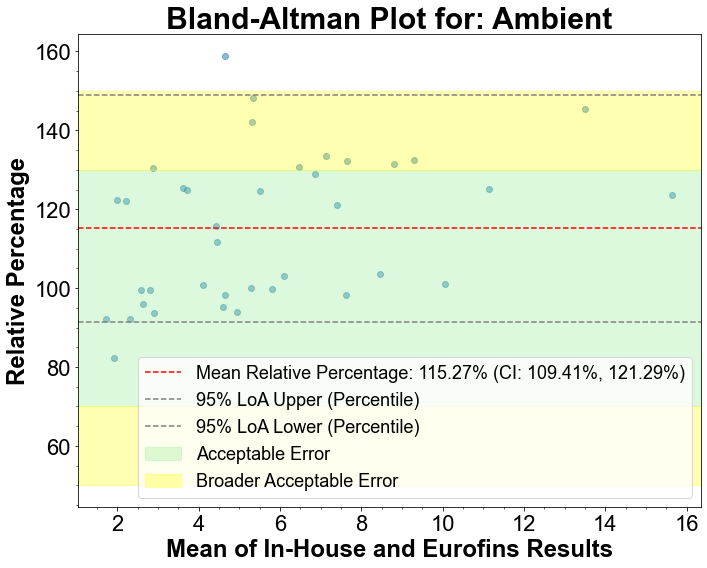

Mean Percent Difference for Ambient: 115.27% (CI: 109.41%, 121.29%)


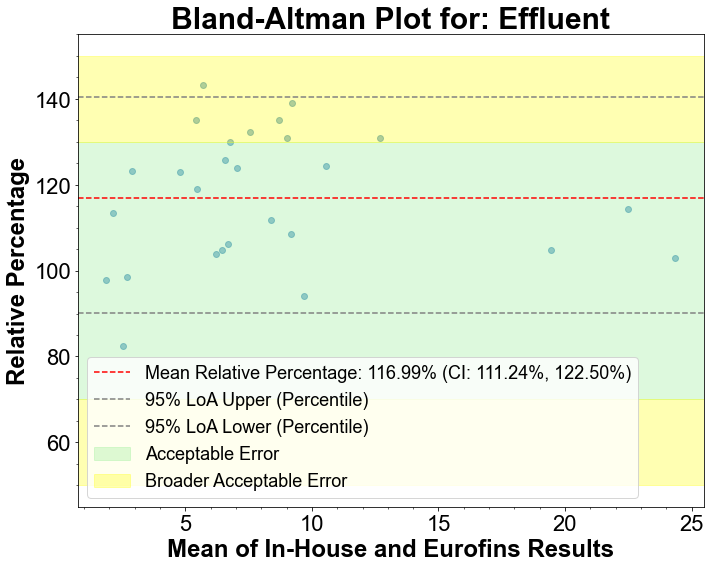

Mean Percent Difference for Effluent: 116.99% (CI: 111.24%, 122.50%)


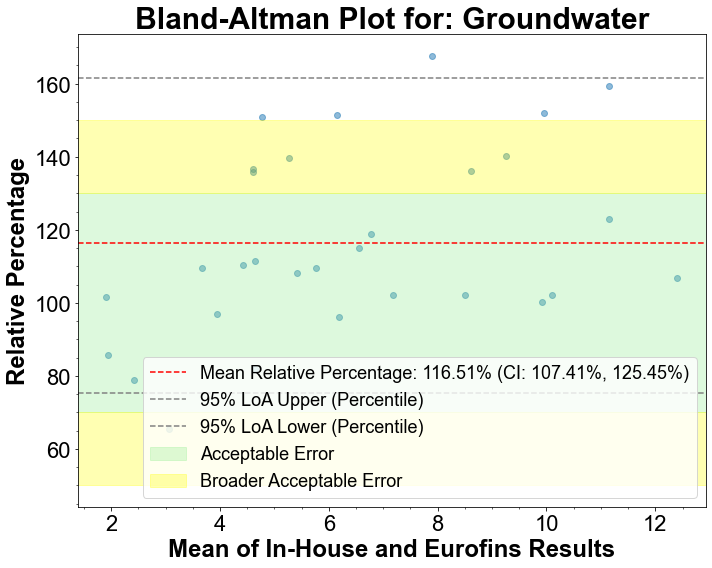

Mean Percent Difference for Groundwater: 116.51% (CI: 107.41%, 125.45%)


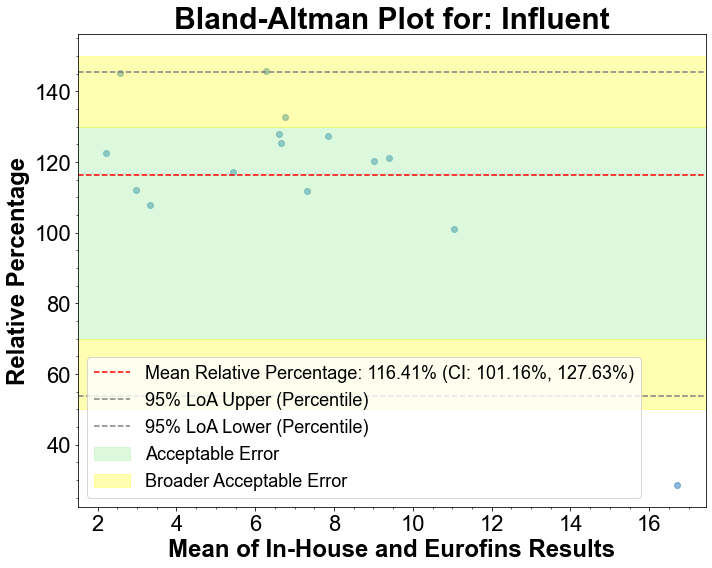

Mean Percent Difference for Influent: 116.41% (CI: 101.16%, 127.63%)


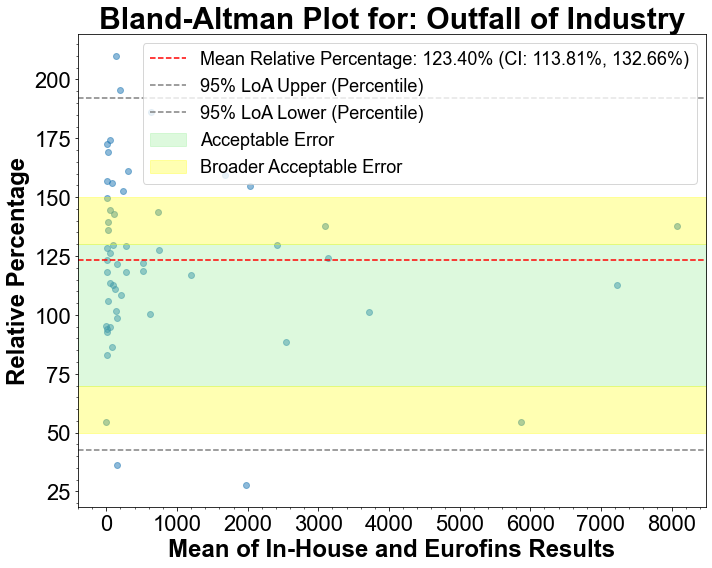

Mean Percent Difference for Outfall of Industry: 123.40% (CI: 113.81%, 132.66%)


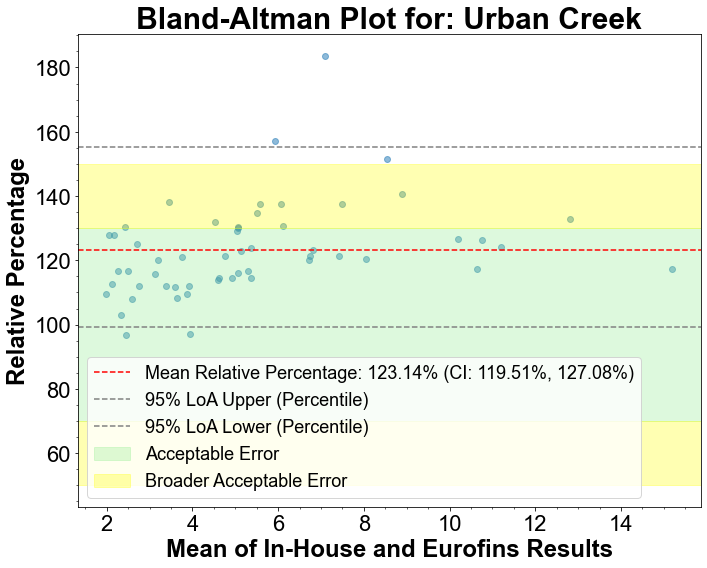

Mean Percent Difference for Urban Creek: 123.14% (CI: 119.51%, 127.08%)


In [235]:
# Iterate through each Type, grouping by 'Type_1633'
for Type, group in quant_df.groupby('Type_InHouse'):
    # Extract the two methods' measurements for the current group
    method2 = group['Quant Only Incl Qual Flags_InHouse'].dropna()
    method1 = group['Quant Only Incl Qual Flags_Eurofins'].dropna()
    
    # Ensure there are enough data points for a meaningful plot
    if len(method1) > 1 and len(method2) > 1:
        # Calculate the mean of the measurements and the percent difference
        means = (method1 + method2) / 2
        percent_diff = method2 / method1 * 100

        # Bootstrap to estimate the CI of the mean percent difference
        ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

        # Calculate the mean percent difference
        mean_percent_diff = np.mean(percent_diff)

        # Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
        loa_lower = np.percentile(percent_diff, 2.5)
        loa_upper = np.percentile(percent_diff, 97.5)

        # Generate the Bland-Altman plot for percent difference
        plt.figure(figsize=(10, 8))
        plt.scatter(means, percent_diff, alpha=0.5)
        plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)')
        plt.axhline(loa_upper, color='gray', linestyle='--', label='95% LoA Upper (Percentile)')
        plt.axhline(loa_lower, color='gray', linestyle='--', label='95% LoA Lower (Percentile)')

        # Shade the region of acceptable error (±30% Percent Error)
        xmin, xmax = plt.xlim()
        plt.fill_betweenx(y=[70, 130], x1=xmin_extended, x2=xmax_extended, color='lightgreen', alpha=0.3, label='Acceptable Error')
        # Shade the region of acceptable error (±30% Percent Error) using the extended range
        plt.fill_betweenx(y=[50, 70], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3, label='Broader Acceptable Error')
        # Shade the region of acceptable error (±30% Percent Error) using the extended range
        plt.fill_betweenx(y=[130, 150], x1=xmin_extended, x2=xmax_extended, color='yellow', alpha=0.3)
        # Annotate the plot with the bootstrapped CI of the mean percent difference
        #plt.annotate(f'Bootstrapped 95% CI of Mean: [{ci_lower:.2f}%, {ci_upper:.2f}%]', xy=(xmax*0.95, np.mean(percent_diff)), xytext=(10,10), textcoords='offset points', ha='right', va='center',fontsize=20)
        # Adjust the x-axis limits if necessary
        plt.xlim(xmin, xmax)

        # Adding labels and title
        plt.title(f'Bland-Altman Plot for: {Type}')
        plt.xlabel('Mean of In-House and Eurofins Results')
        plt.ylabel('Relative Percentage')
        plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
        plt.gca().yaxis.set_minor_locator(AutoMinorLocator())

        # Adding a legend
        plt.legend(fontsize=18)

        plt.tight_layout()
        plt.show()
        print(f"Mean Percent Difference for {Type}: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)")
    else:
        print(f"Not enough data for {Type} to generate a Bland-Altman plot.")


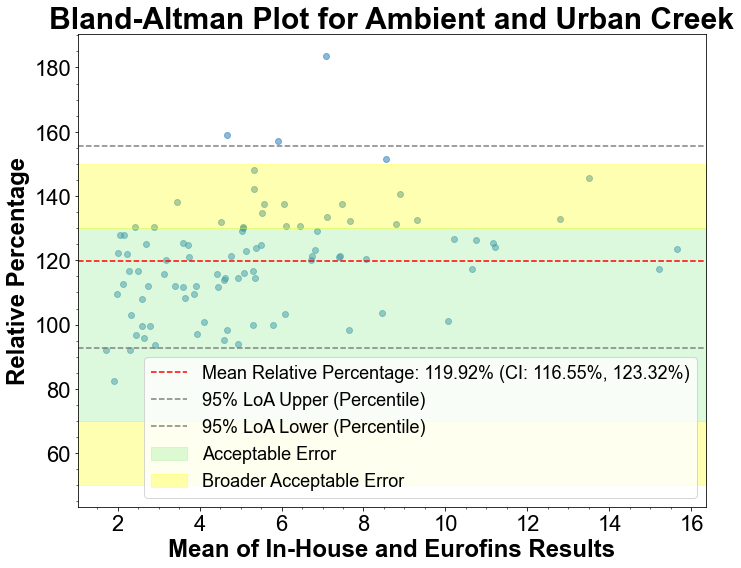

Mean Percent Difference: 119.92% (CI: 116.55%, 123.32%)


In [236]:
# Filter the DataFrame to include only the 'Ambient' or 'Urban Creek' sample types
filtered_df = quant_df[quant_df['Type_InHouse'].isin(['Ambient', 'Urban Creek'])]

# Ensure there are enough data points for a meaningful plot
if len(filtered_df) > 1:
    # Extract the two methods' measurements
    method1 = filtered_df['Quant Only Incl Qual Flags_InHouse'].dropna()
    method2 = filtered_df['Quant Only Incl Qual Flags_Eurofins'].dropna()

    # Calculate the mean of the measurements and the percent difference
    means = (method1 + method2) / 2
    percent_diff = method1 / method2 * 100

    # Bootstrap to estimate the CI of the mean percent difference
    ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

    # Calculate the mean percent difference
    mean_percent_diff = np.mean(percent_diff)

    # Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
    loa_lower = np.percentile(percent_diff, 2.5)
    loa_upper = np.percentile(percent_diff, 97.5)

    # Generate the Bland-Altman plot for percent difference
    plt.figure(figsize=(10, 8))
    plt.scatter(means, percent_diff, alpha=0.5)
    plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)')
    plt.axhline(loa_upper, color='gray', linestyle='--', label='95% LoA Upper (Percentile)')
    plt.axhline(loa_lower, color='gray', linestyle='--', label='95% LoA Lower (Percentile)')

    # Shade the region of acceptable error (±30% Percent Error)
    xmin, xmax = plt.xlim()
    plt.fill_betweenx(y=[70, 130], x1=xmin, x2=xmax, color='lightgreen', alpha=0.3, label='Acceptable Error')
    plt.fill_betweenx(y=[50, 70], x1=xmin, x2=xmax, color='yellow', alpha=0.3, label='Broader Acceptable Error')
    plt.fill_betweenx(y=[130, 150], x1=xmin, x2=xmax, color='yellow', alpha=0.3)

    # Adjust the x-axis limits if necessary
    plt.xlim(xmin, xmax)

    # Adding labels and title
    plt.title('Bland-Altman Plot for Ambient and Urban Creek')
    plt.xlabel('Mean of In-House and Eurofins Results')
    plt.ylabel('Relative Percentage')
    plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
    plt.gca().yaxis.set_minor_locator(AutoMinorLocator())

    # Adding a legend
    plt.legend(fontsize=18)

    plt.tight_layout()
    plt.show()
    print(f"Mean Percent Difference: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)")
else:
    print("Not enough data to generate a Bland-Altman plot.")


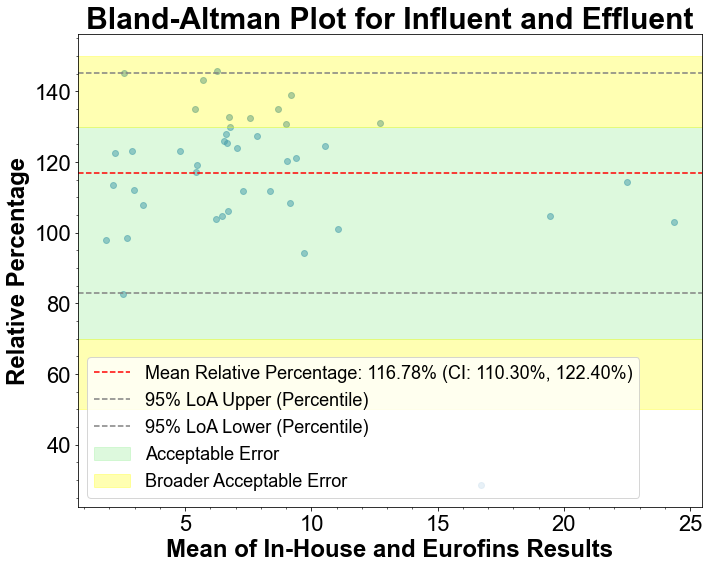

Mean Percent Difference: 116.78% (CI: 110.30%, 122.40%)


In [237]:
# Filter the DataFrame to include only the 'Ambient' or 'Urban Creek' sample types
filtered_df = quant_df[quant_df['Type_InHouse'].isin(['Influent', 'Effluent'])]

# Ensure there are enough data points for a meaningful plot
if len(filtered_df) > 1:
    # Extract the two methods' measurements
    method1 = filtered_df['Quant Only Incl Qual Flags_InHouse'].dropna()
    method2 = filtered_df['Quant Only Incl Qual Flags_Eurofins'].dropna()

    # Calculate the mean of the measurements and the percent difference
    means = (method1 + method2) / 2
    percent_diff = method1 / method2 * 100

    # Bootstrap to estimate the CI of the mean percent difference
    ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

    # Calculate the mean percent difference
    mean_percent_diff = np.mean(percent_diff)

    # Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
    loa_lower = np.percentile(percent_diff, 2.5)
    loa_upper = np.percentile(percent_diff, 97.5)

    # Generate the Bland-Altman plot for percent difference
    plt.figure(figsize=(10, 8))
    plt.scatter(means, percent_diff, alpha=0.5)
    plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)')
    plt.axhline(loa_upper, color='gray', linestyle='--', label='95% LoA Upper (Percentile)')
    plt.axhline(loa_lower, color='gray', linestyle='--', label='95% LoA Lower (Percentile)')

    # Shade the region of acceptable error (±30% Percent Error)
    xmin, xmax = plt.xlim()
    plt.fill_betweenx(y=[70, 130], x1=xmin, x2=xmax, color='lightgreen', alpha=0.3, label='Acceptable Error')
    plt.fill_betweenx(y=[50, 70], x1=xmin, x2=xmax, color='yellow', alpha=0.3, label='Broader Acceptable Error')
    plt.fill_betweenx(y=[130, 150], x1=xmin, x2=xmax, color='yellow', alpha=0.3)

    # Adjust the x-axis limits if necessary
    plt.xlim(xmin, xmax)

    # Adding labels and title
    plt.title('Bland-Altman Plot for Influent and Effluent')
    plt.xlabel('Mean of In-House and Eurofins Results')
    plt.ylabel('Relative Percentage')
    plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
    plt.gca().yaxis.set_minor_locator(AutoMinorLocator())

    # Adding a legend
    plt.legend(fontsize=18)

    plt.tight_layout()
    plt.show()
    print(f"Mean Percent Difference: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)")
else:
    print("Not enough data to generate a Bland-Altman plot.")

### By Sample Locations

In [238]:
# Assuming merged_df is your DataFrame and 'Sample Location_1633' is the column you want to group by
grouped_counts = quant_df.groupby('Sample Location_InHouse').size()

# To display the counts for each group
print(grouped_counts)

Sample Location_InHouse
Beaverton @ Cornelius              7
Dawson @ Brookwood                 8
Durham Effluent                    8
Durham Influent                    7
Fanno @ Bohmann                    7
Fanno @ Durham Park                7
Fanno @ SW 56th Ave                4
Fanno @ SW Bonita Rd               7
Fanno @ SW Grant Ave               5
Fanno @ SW North Dakota St         7
Fanno at Durham Rd                13
Forest Grove Effluent              5
Hillsboro Effluent                 7
Hillsboro Influent                 1
Hillsboro Landfill                15
Intel Ronler WATR                  1
Maxim (Analog)                     9
McKay @ Padgett                    1
Prudential Cleanroom               3
Quantum Global                    16
Rock @ Brookwood                   7
Rock @ East Main St                4
Rock @ NE Cornelius Pass Rd        7
Rock @ River Rd                    7
Rock Creek Effluent                7
Rock Creek Influent                7
Seals Unlimite

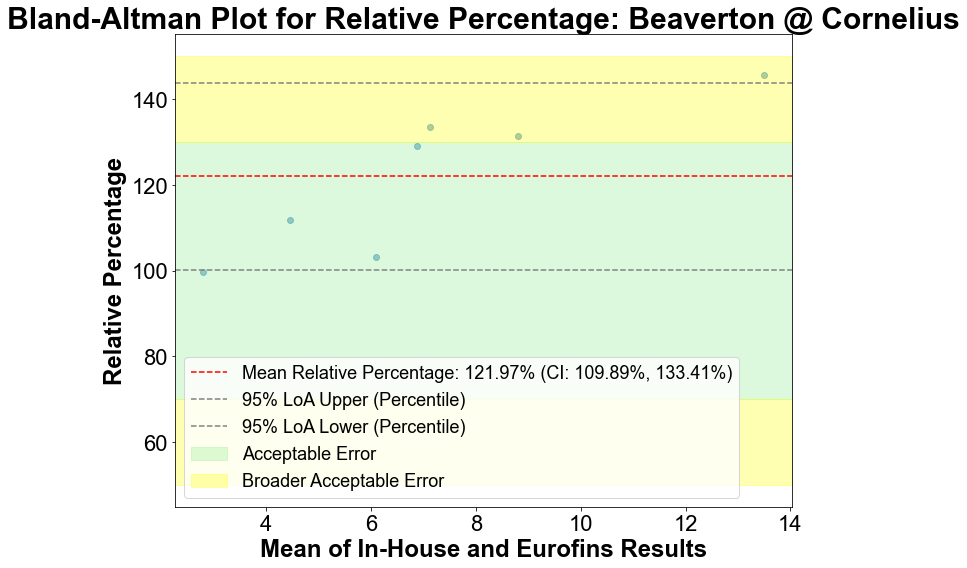

Mean Percent Difference for Beaverton @ Cornelius: 121.97% (CI: 109.89%, 133.41%)


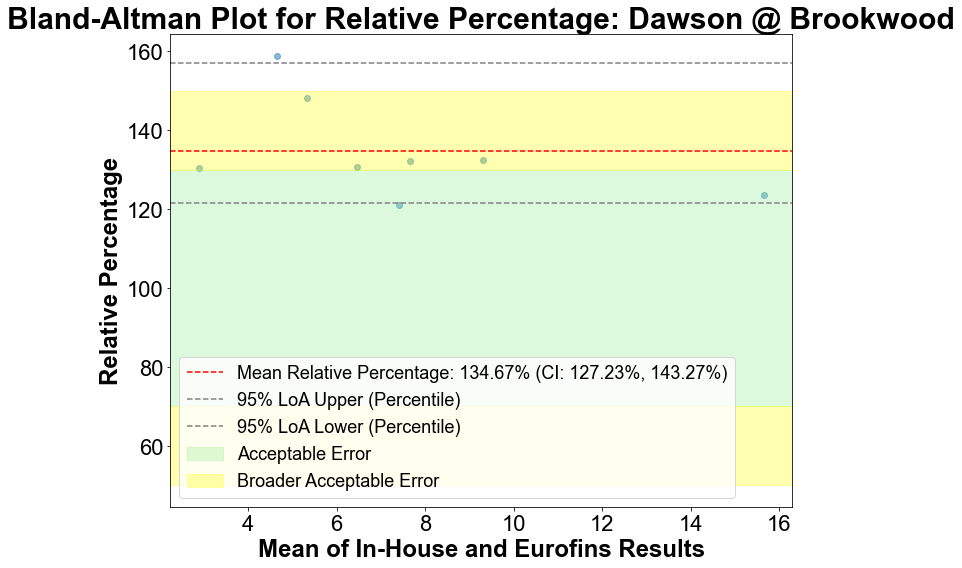

Mean Percent Difference for Dawson @ Brookwood: 134.67% (CI: 127.23%, 143.27%)


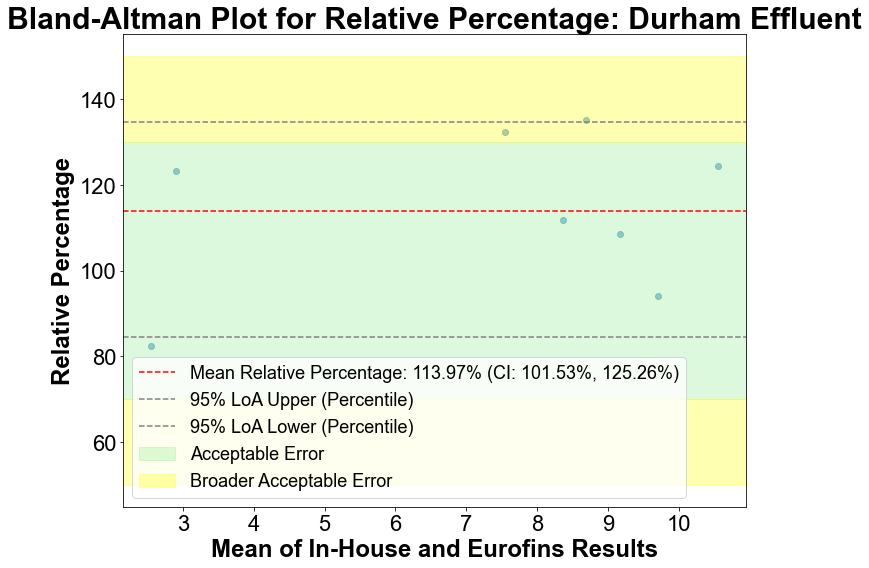

Mean Percent Difference for Durham Effluent: 113.97% (CI: 101.53%, 125.26%)


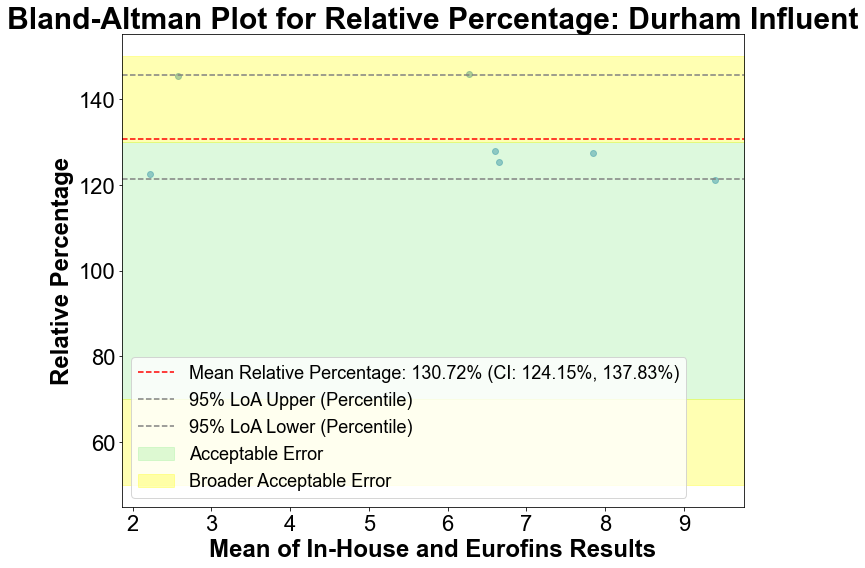

Mean Percent Difference for Durham Influent: 130.72% (CI: 124.15%, 137.83%)


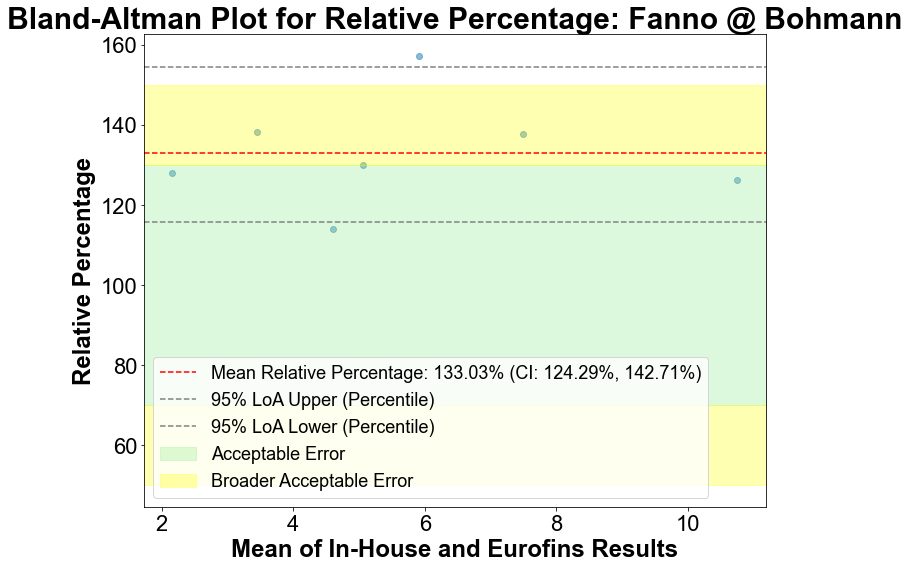

Mean Percent Difference for Fanno @ Bohmann: 133.03% (CI: 124.29%, 142.71%)


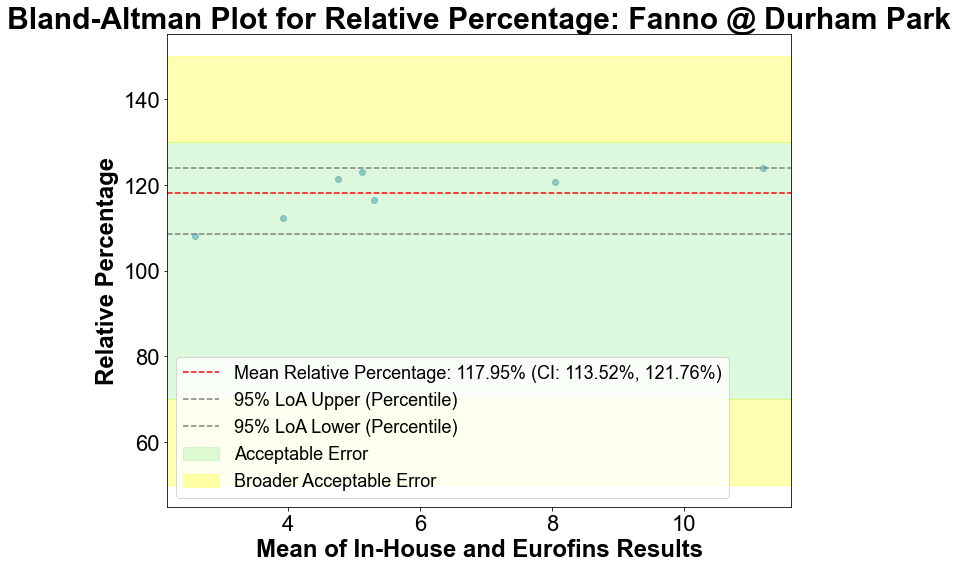

Mean Percent Difference for Fanno @ Durham Park: 117.95% (CI: 113.52%, 121.76%)


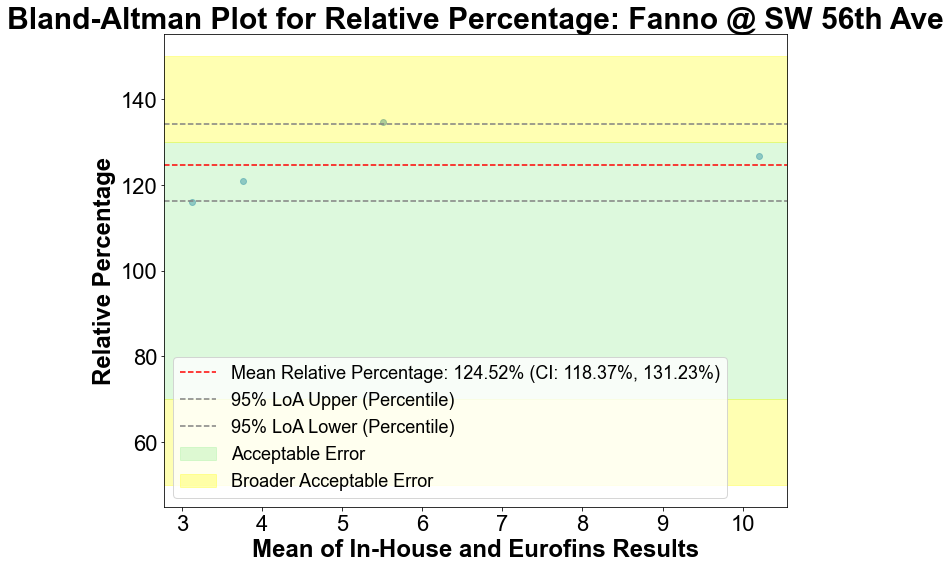

Mean Percent Difference for Fanno @ SW 56th Ave: 124.52% (CI: 118.37%, 131.23%)


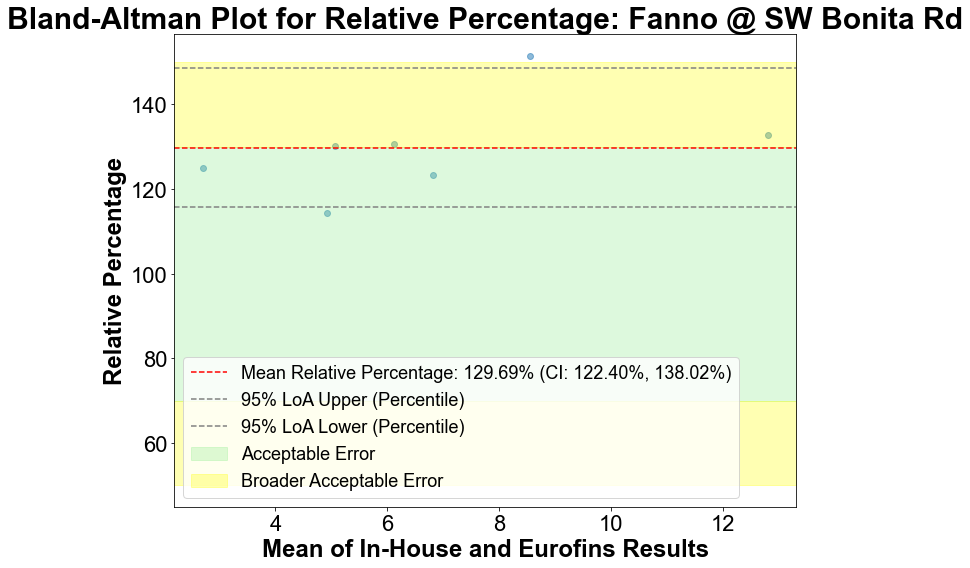

Mean Percent Difference for Fanno @ SW Bonita Rd: 129.69% (CI: 122.40%, 138.02%)


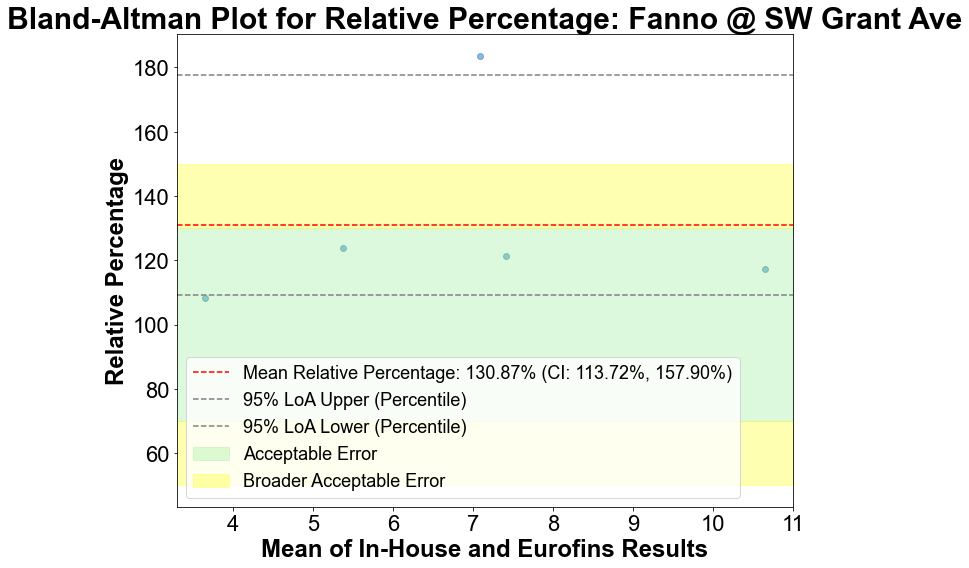

Mean Percent Difference for Fanno @ SW Grant Ave: 130.87% (CI: 113.72%, 157.90%)


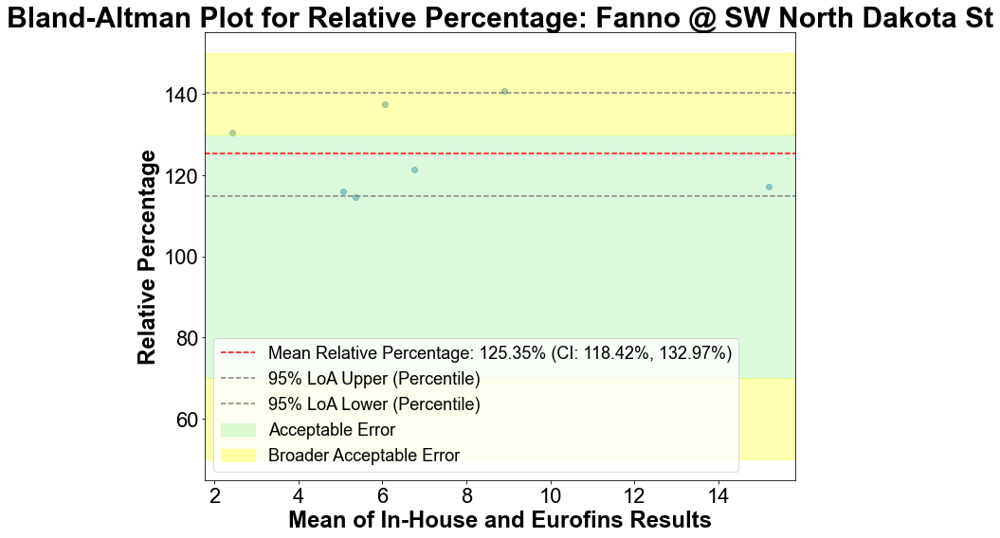

Mean Percent Difference for Fanno @ SW North Dakota St: 125.35% (CI: 118.42%, 132.97%)


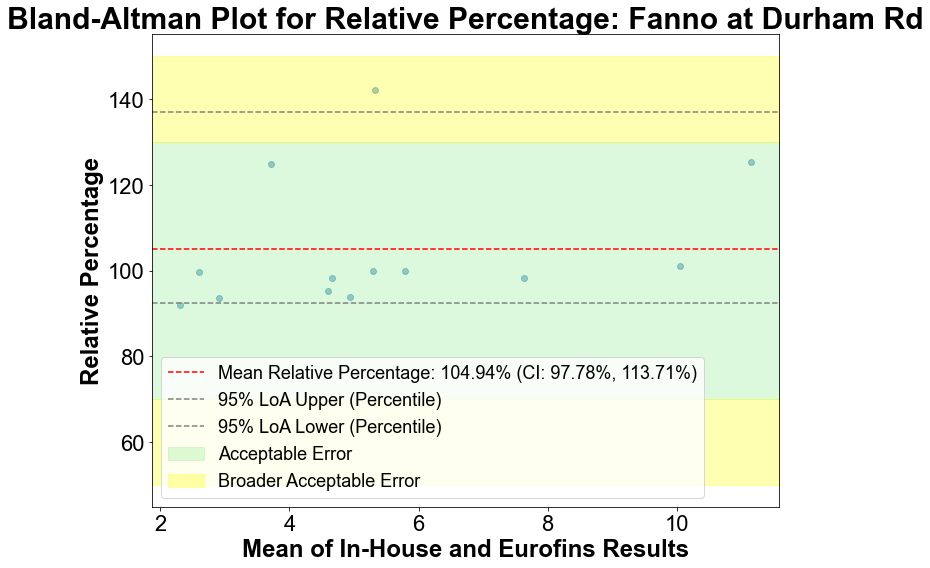

Mean Percent Difference for Fanno at Durham Rd: 104.94% (CI: 97.78%, 113.71%)


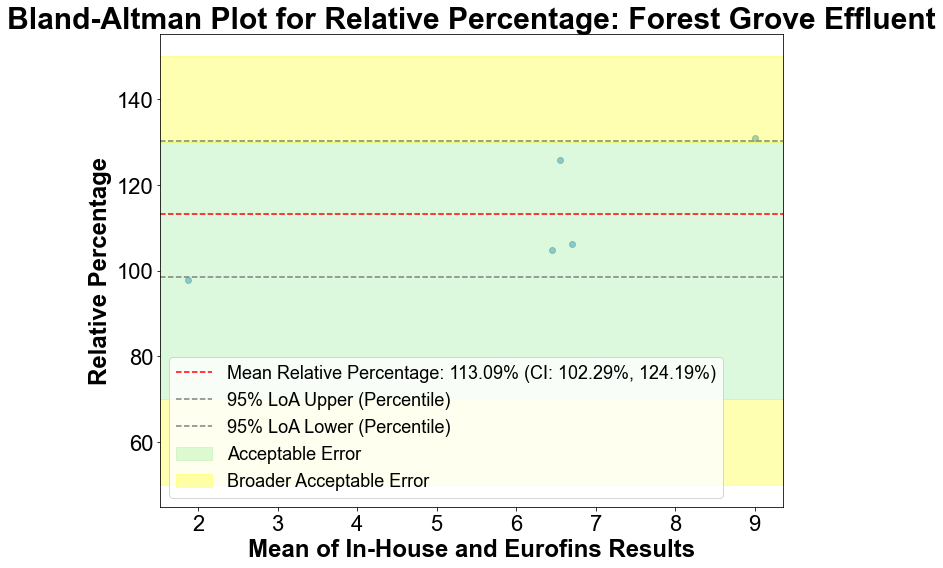

Mean Percent Difference for Forest Grove Effluent: 113.09% (CI: 102.29%, 124.19%)


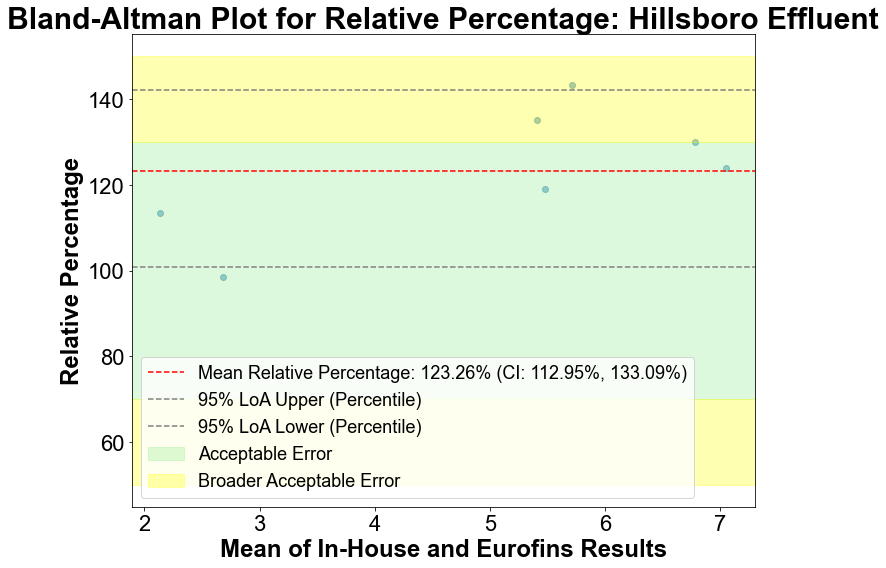

Mean Percent Difference for Hillsboro Effluent: 123.26% (CI: 112.95%, 133.09%)
Not enough data for Hillsboro Influent to generate a Bland-Altman plot.


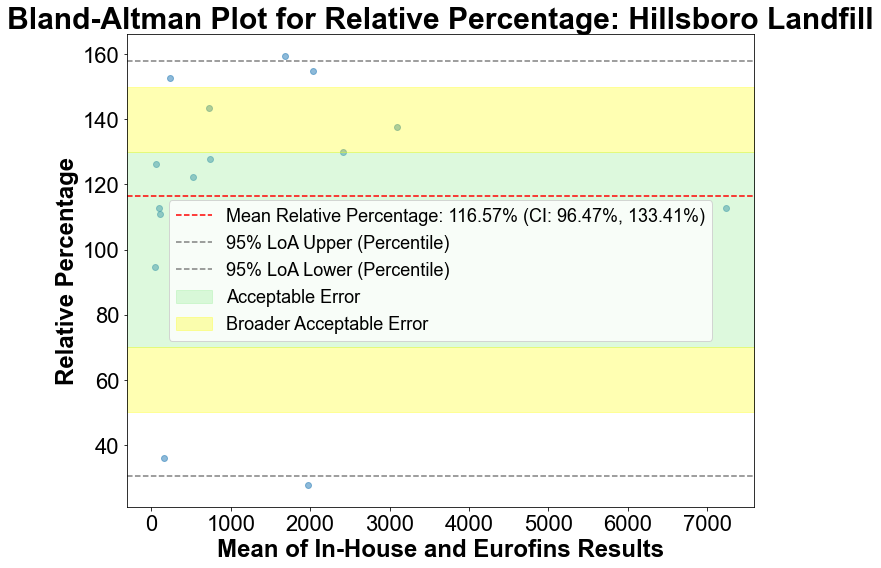

Mean Percent Difference for Hillsboro Landfill: 116.57% (CI: 96.47%, 133.41%)
Not enough data for Intel Ronler WATR to generate a Bland-Altman plot.


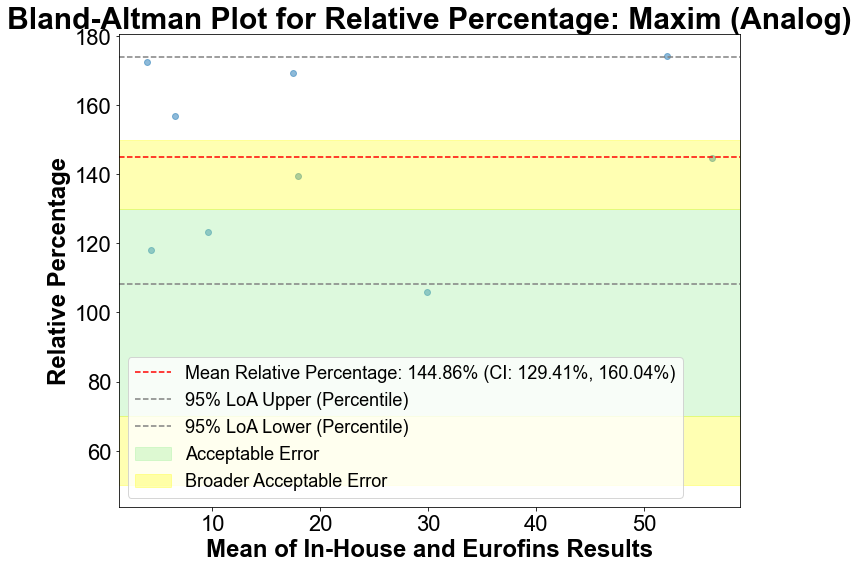

Mean Percent Difference for Maxim (Analog): 144.86% (CI: 129.41%, 160.04%)
Not enough data for McKay @ Padgett to generate a Bland-Altman plot.


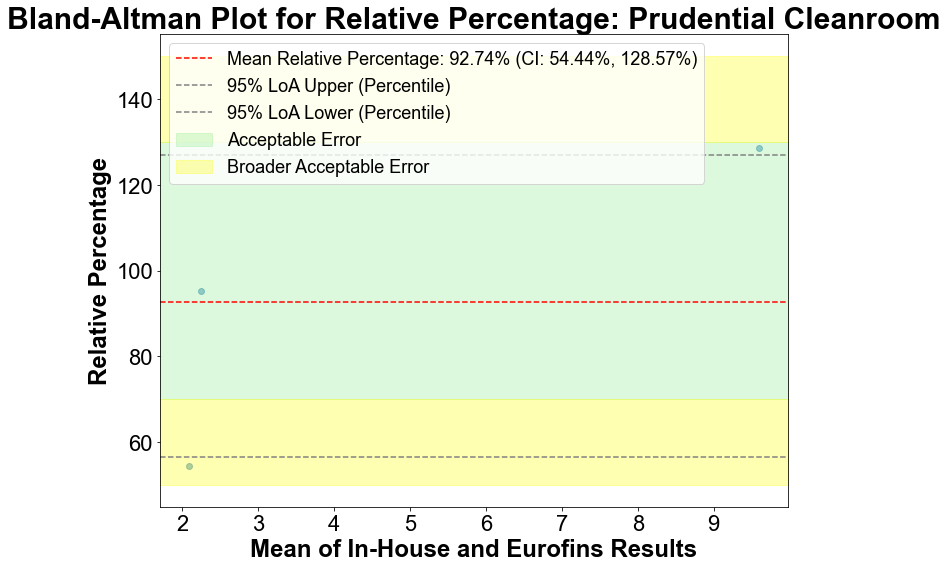

Mean Percent Difference for Prudential Cleanroom: 92.74% (CI: 54.44%, 128.57%)


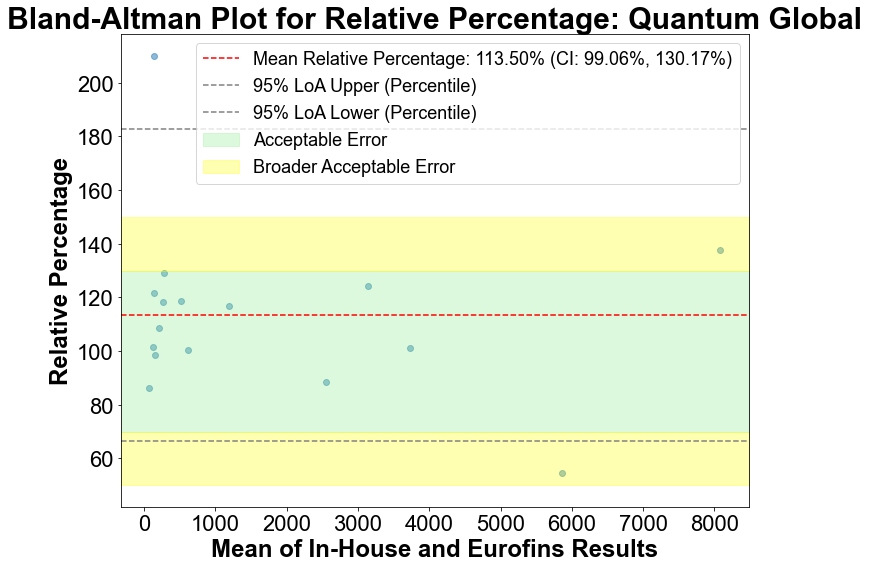

Mean Percent Difference for Quantum Global: 113.50% (CI: 99.06%, 130.17%)


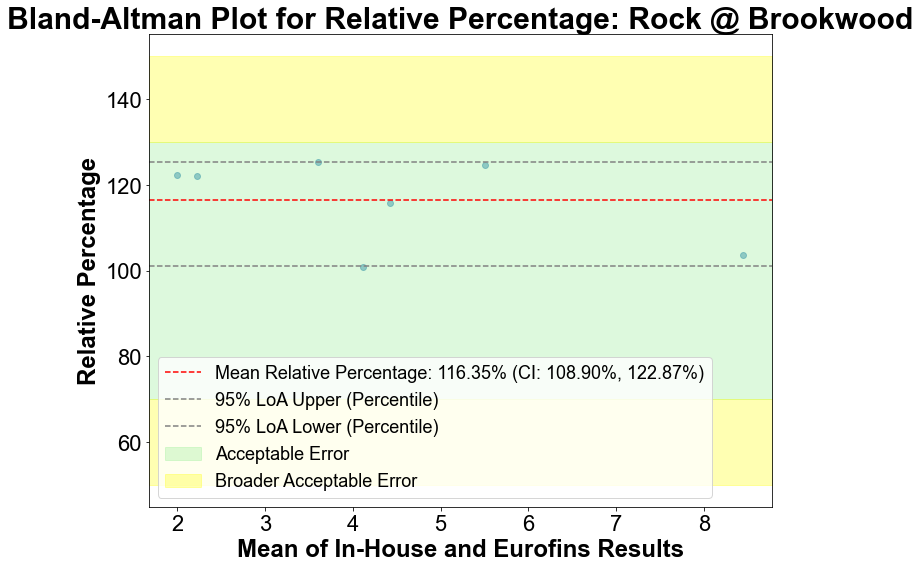

Mean Percent Difference for Rock @ Brookwood: 116.35% (CI: 108.90%, 122.87%)


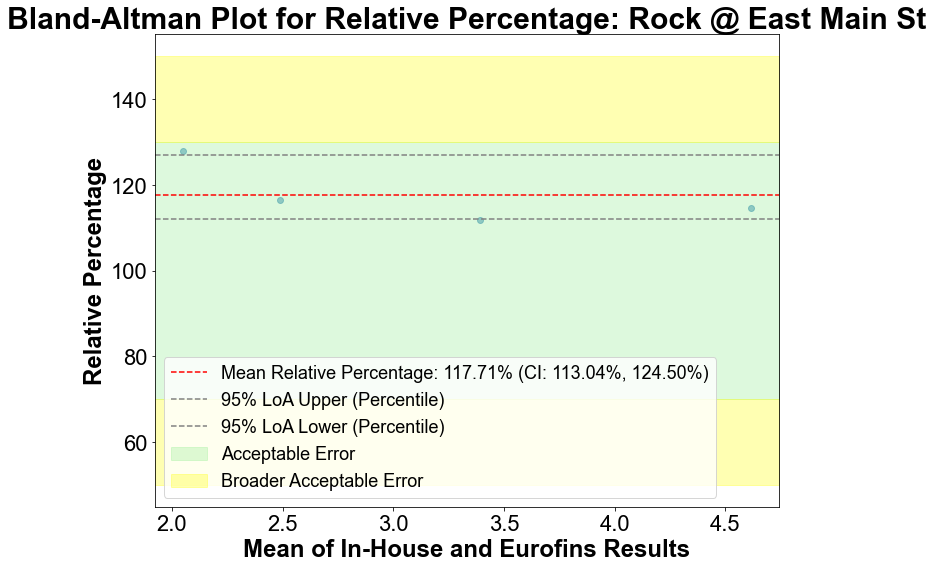

Mean Percent Difference for Rock @ East Main St: 117.71% (CI: 113.04%, 124.50%)


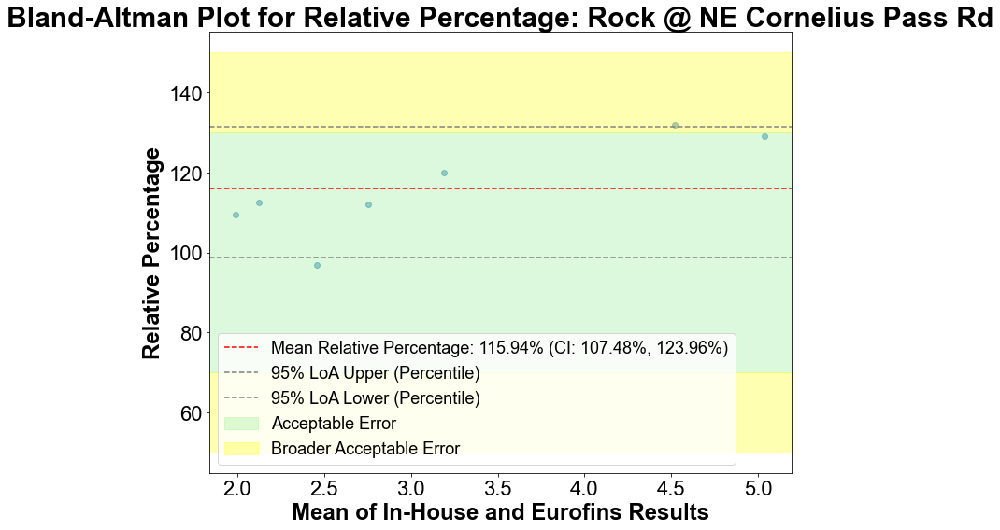

Mean Percent Difference for Rock @ NE Cornelius Pass Rd: 115.94% (CI: 107.48%, 123.96%)


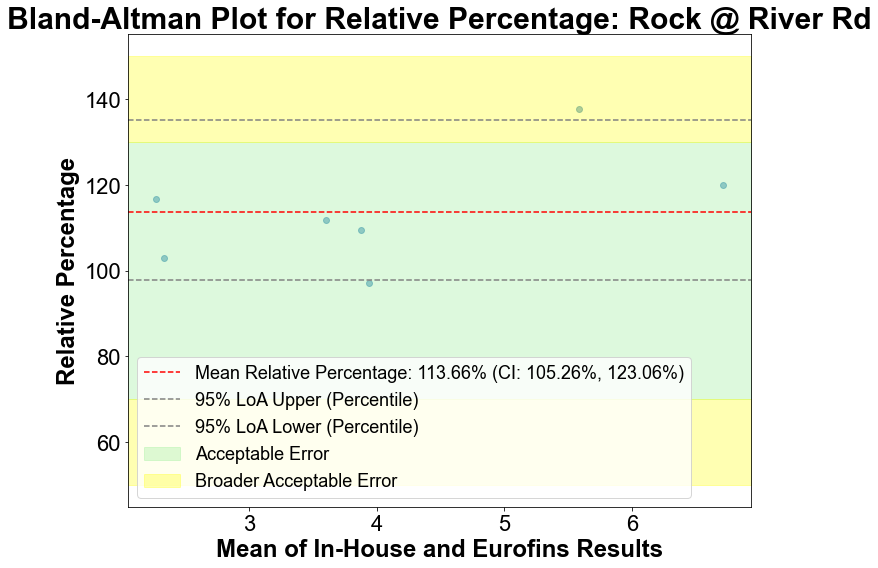

Mean Percent Difference for Rock @ River Rd: 113.66% (CI: 105.26%, 123.06%)


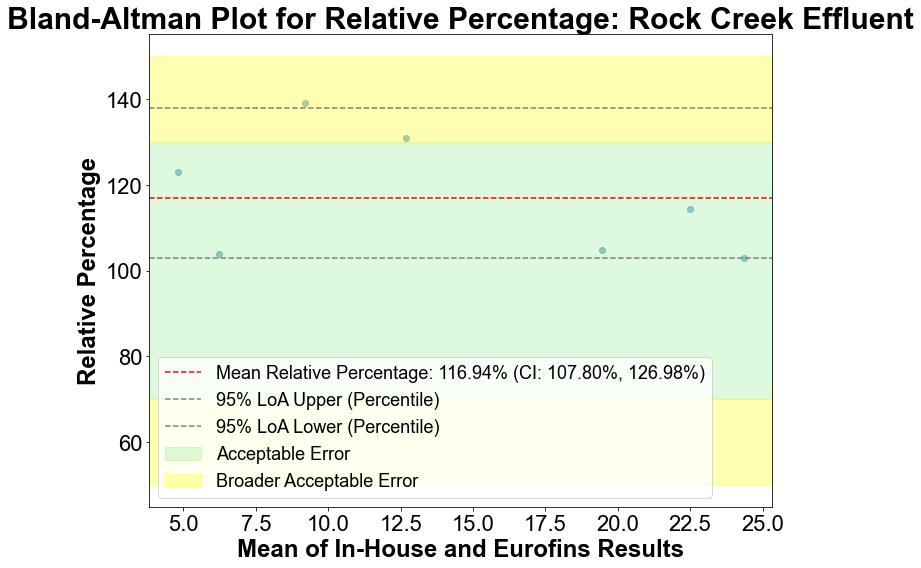

Mean Percent Difference for Rock Creek Effluent: 116.94% (CI: 107.80%, 126.98%)


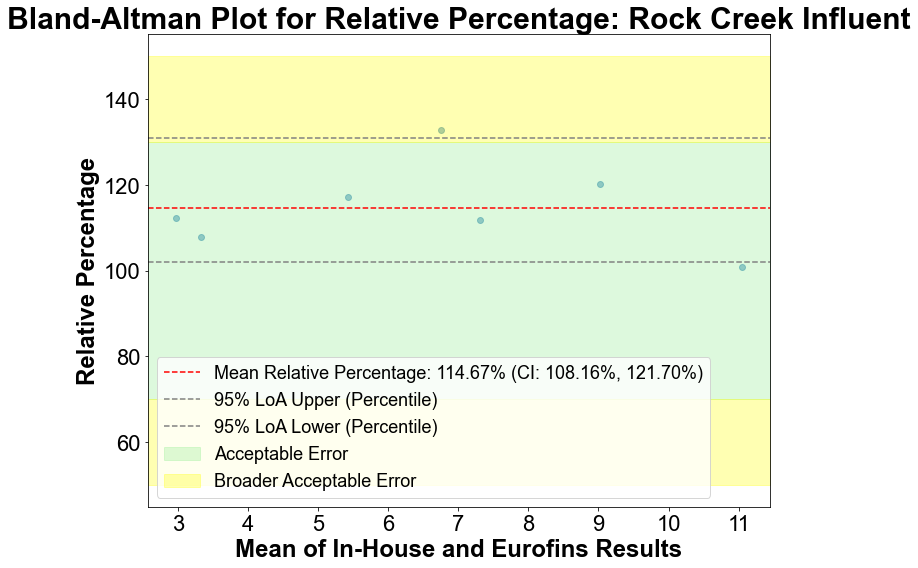

Mean Percent Difference for Rock Creek Influent: 114.67% (CI: 108.16%, 121.70%)


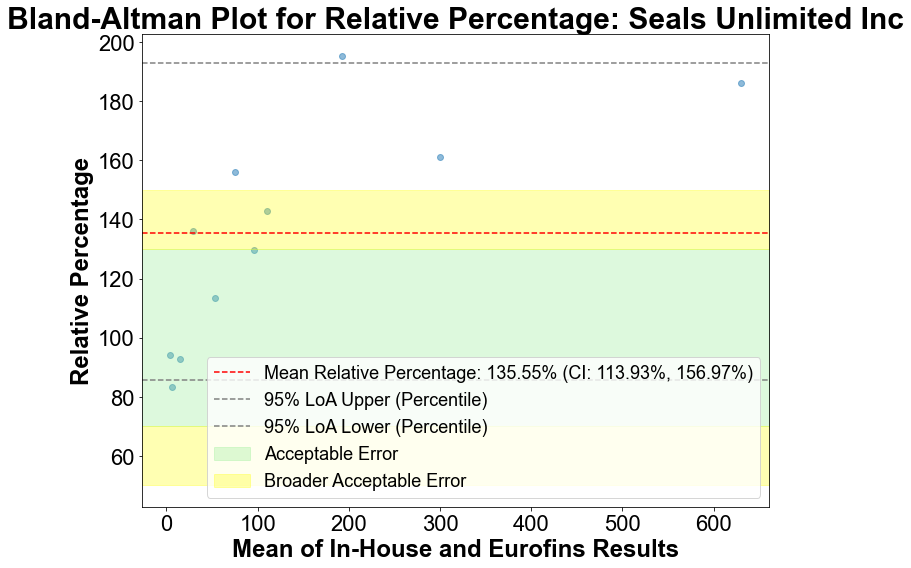

Mean Percent Difference for Seals Unlimited Inc: 135.55% (CI: 113.93%, 156.97%)
Not enough data for TR @ Boones Ferry to generate a Bland-Altman plot.
Not enough data for TR @ Jurgens to generate a Bland-Altman plot.


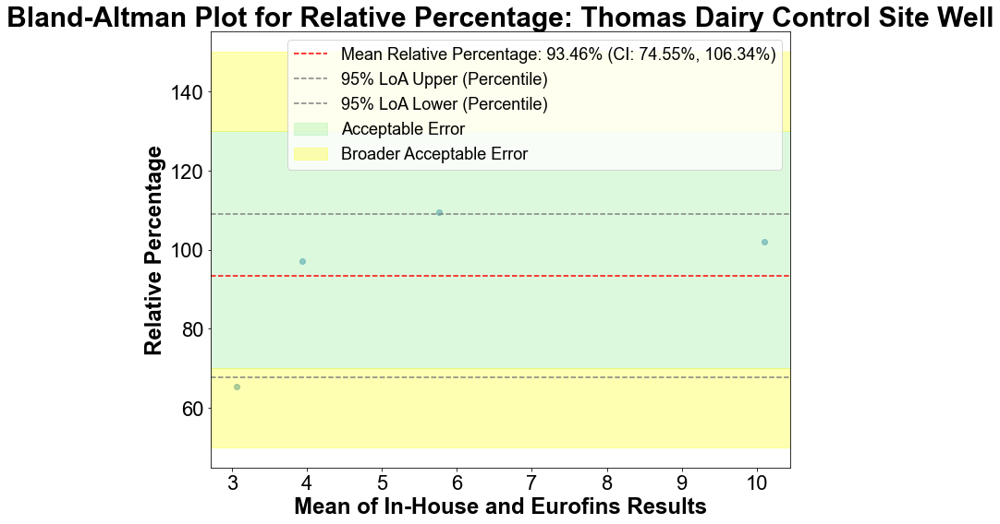

Mean Percent Difference for Thomas Dairy Control Site Well: 93.46% (CI: 74.55%, 106.34%)


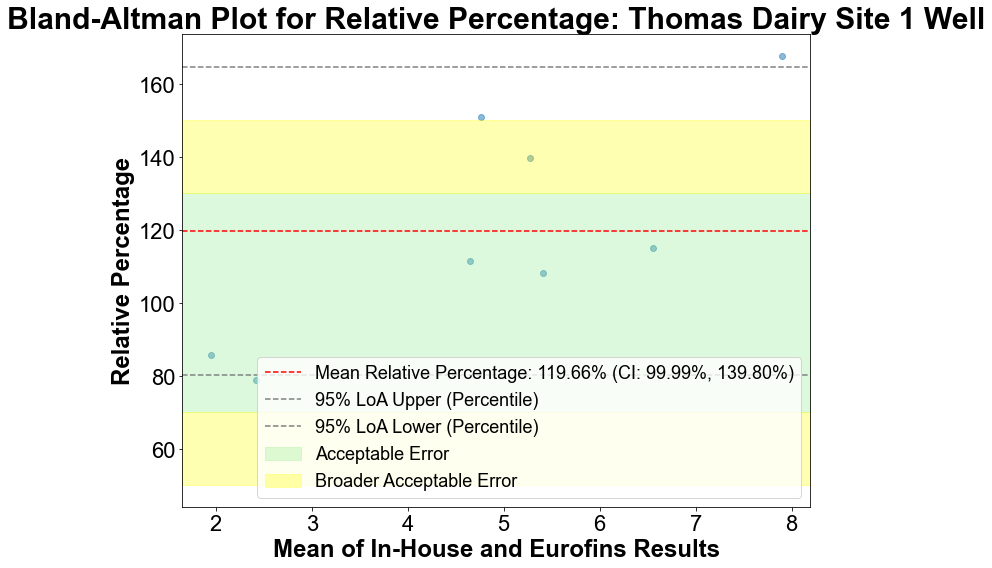

Mean Percent Difference for Thomas Dairy Site 1 Well: 119.66% (CI: 99.99%, 139.80%)


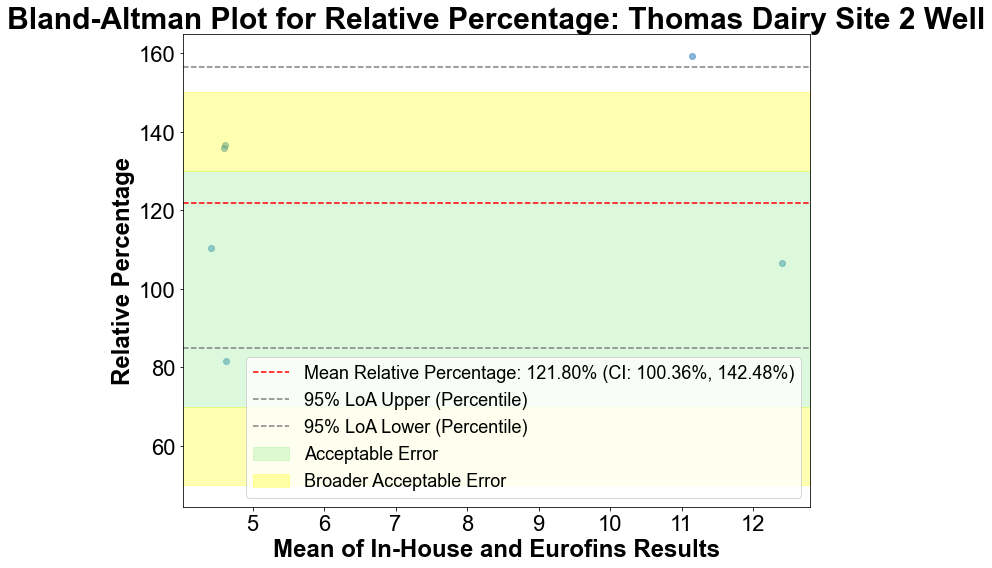

Mean Percent Difference for Thomas Dairy Site 2 Well: 121.80% (CI: 100.36%, 142.48%)


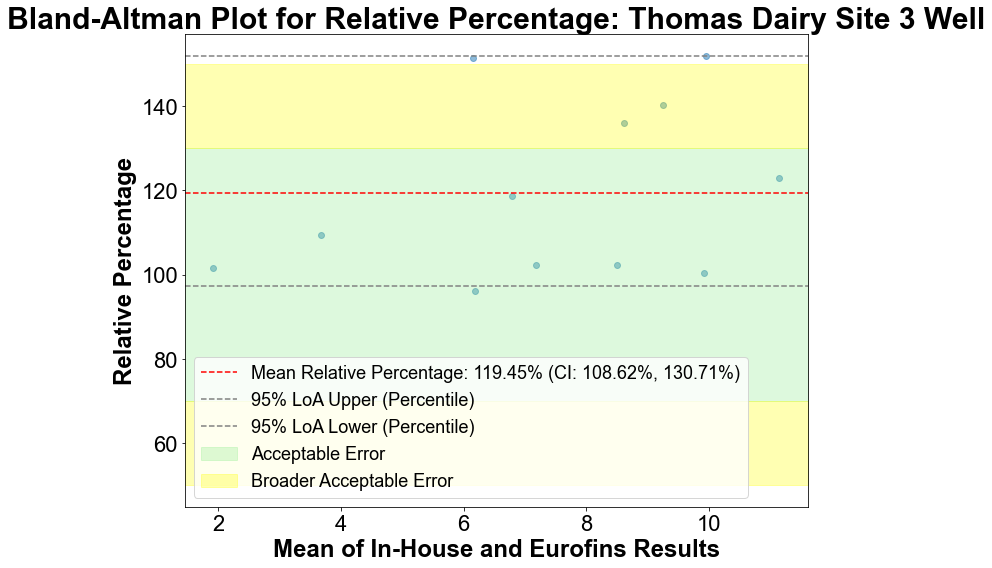

Mean Percent Difference for Thomas Dairy Site 3 Well: 119.45% (CI: 108.62%, 130.71%)


In [239]:
# Iterate through each Sample Location, grouping by 'Sample Location_1633'
for location, group in quant_df.groupby('Sample Location_InHouse'):
    # Extract the two methods' measurements for the current group
    method2 = group['Quant Only Incl Qual Flags_InHouse'].dropna()
    method1 = group['Quant Only Incl Qual Flags_Eurofins'].dropna()
    
    # Ensure there are enough data points for a meaningful plot
    if len(method1) > 1 and len(method2) > 1:
        # Calculate the mean of the measurements and the percent difference
        means = (method1 + method2) / 2
        percent_diff = (method2 / method1) * 100

        # Bootstrap to estimate the CI of the mean percent difference
        ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)

        # Calculate the mean percent difference
        mean_percent_diff = np.mean(percent_diff)

        # Calculate the 2.5th and 97.5th percentiles of the percent differences for the Limits of Agreement (LoA)
        loa_lower = np.percentile(percent_diff, 2.5)
        loa_upper = np.percentile(percent_diff, 97.5)

        # Generate the Bland-Altman plot for percent difference
        plt.figure(figsize=(10, 8))
        plt.scatter(means, percent_diff, alpha=0.5)
        plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Relative Percentage: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)')
        plt.axhline(loa_upper, color='gray', linestyle='--', label='95% LoA Upper (Percentile)')
        plt.axhline(loa_lower, color='gray', linestyle='--', label='95% LoA Lower (Percentile)')

        # Shade the region of acceptable error (±30% Percent Error)
        xmin, xmax = plt.xlim()
        plt.fill_betweenx(y=[70, 130], x1=xmin, x2=xmax, color='lightgreen', alpha=0.3, label='Acceptable Error')
        plt.fill_betweenx(y=[50, 70], x1=xmin, x2=xmax, color='yellow', alpha=0.3, label='Broader Acceptable Error')
        plt.fill_betweenx(y=[130, 150], x1=xmin, x2=xmax, color='yellow', alpha=0.3)

        # Adjust the x-axis limits if necessary
        plt.xlim(xmin, xmax)

        # Adding labels and title
        plt.title(f'Bland-Altman Plot for Relative Percentage: {location}')
        plt.xlabel('Mean of In-House and Eurofins Results')
        plt.ylabel('Relative Percentage')

        # Adding a legend
        plt.legend(fontsize=18)

        plt.tight_layout()
        plt.show()
        print(f"Mean Percent Difference for {location}: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)")
    else:
        print(f"Not enough data for {location} to generate a Bland-Altman plot.")


#### Custom plots

In [240]:
# Function to create Bland-Altman plot for a given location and dataframe
def create_bland_altman_plot(location, df):
    if len(df) >= 2:
        # Calculate the mean of the measurements and the percent difference
        means = (df['Quant Only Incl Qual Flags_InHouse'] + df['Quant Only Incl Qual Flags_Eurofins']) / 2
        percent_diff = ((df['Quant Only Incl Qual Flags_Eurofins'] - df['Quant Only Incl Qual Flags_InHouse']) / means) * 100
        
        # Bootstrap to estimate the CI of the mean percent difference
        ci_lower, ci_upper, _ = bootstrap_mean_ci(percent_diff, n_bootstraps=10000, ci=95)
        
        # Calculate the mean percent difference
        mean_percent_diff = np.mean(percent_diff)
        
        # Calculate the 2.5th and 97.5th percentiles for the Limits of Agreement (LoA)
        loa_lower = np.percentile(percent_diff, 2.5)
        loa_upper = np.percentile(percent_diff, 97.5)
        
        # Generate the Bland-Altman plot
        plt.figure(figsize=(10, 8))
        plt.scatter(means, percent_diff, alpha=0.5)
        plt.axhline(mean_percent_diff, color='red', linestyle='--', label=f'Mean Percent Difference: {mean_percent_diff:.2f}% (CI: {ci_lower:.2f}%, {ci_upper:.2f}%)')
        plt.axhline(loa_upper, color='gray', linestyle='--', label='95% LoA Upper (Percentile)')
        plt.axhline(loa_lower, color='gray', linestyle='--', label='95% LoA Lower (Percentile)')
        
        # Shade the region of acceptable error (±30% Percent Error)
        xmin, xmax = plt.xlim()
        plt.fill_betweenx(y=[-30, 30], x1=xmin, x2=xmax, color='lightgreen', alpha=0.3, label='Acceptable Error Region')
        
        # Adjust the x-axis limits if necessary
        plt.xlim(xmin, xmax)
        
        # Add labels and title
        plt.title(f'Bland-Altman Plot for Percent Difference: {location}')
        plt.xlabel('Mean of Methods In-House and Eurofins')
        plt.ylabel('Percent Difference between Methods In-House and Eurofins')
        
        # Add a legend
        plt.legend()
        
        plt.tight_layout()
        plt.show()



In [241]:
# Define the locations of interest
locations_of_interest = ['Durham Biosolids', 'Rock Creek Biosolids']

# Find common PFAS compounds in both locations
durham_df = quant_df[quant_df['Sample Location_InHouse'] == 'Durham Biosolids']
rock_creek_df = quant_df[quant_df['Sample Location_InHouse'] == 'Rock Creek Biosolids']
common_compounds = set(durham_df['PFAS Compound_InHouse']).intersection(set(rock_creek_df['PFAS Compound_InHouse']))

# Filter dataframes to only include common compounds
durham_common_df = durham_df[durham_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
rock_creek_common_df = rock_creek_df[rock_creek_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Create Bland-Altman plots for each location of interest with common PFAS compounds
create_bland_altman_plot('Durham Biosolids', durham_common_df)
create_bland_altman_plot('Rock Creek Biosolids', rock_creek_common_df)


In [242]:
# Add a column to each DataFrame to indicate the source
durham_common_df['Source'] = 'Durham'
rock_creek_common_df['Source'] = 'Rock Creek'

# Concatenate the two DataFrames
combined_df = pd.concat([durham_common_df, rock_creek_common_df], ignore_index=True)

# Create the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags_InHouse', data=combined_df)
plt.title('Comparison of Quant Values for Method In-House Between Durham and Rock Creek')
plt.ylabel('Quant Only Incl Qual Flags_InHouse')
plt.xlabel('Source')

plt.tight_layout()
plt.show()

ValueError: min() arg is an empty sequence

<Figure size 720x432 with 0 Axes>

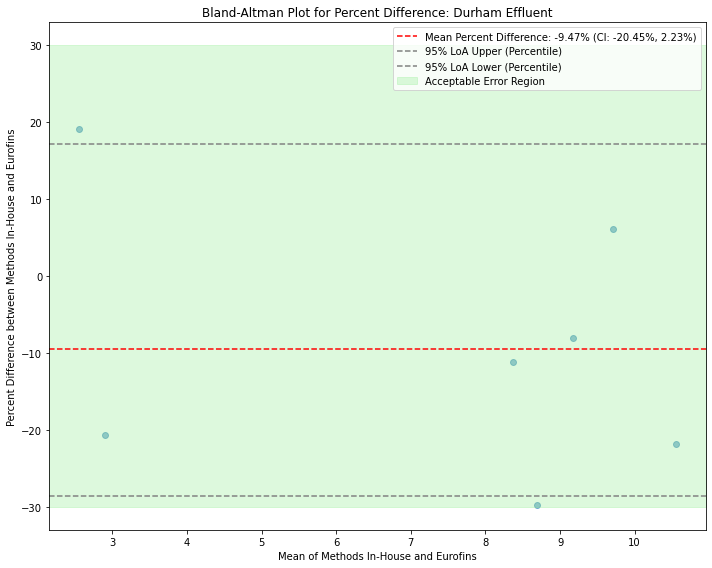

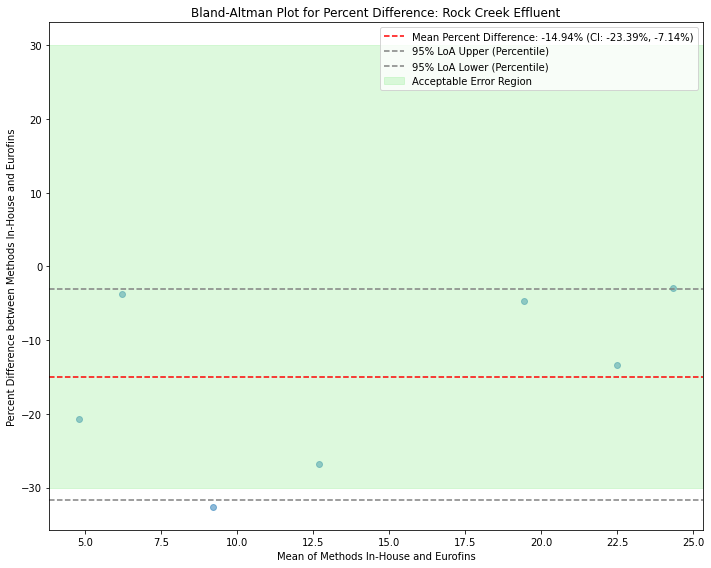

In [ ]:
# Define the locations of interest
locations_of_interest = ['Durham Effluent', 'Rock Creek Effluent']

# Find common PFAS compounds in both locations
durham_df = quant_df[quant_df['Sample Location_InHouse'] == 'Durham Effluent']
rock_creek_df = quant_df[quant_df['Sample Location_InHouse'] == 'Rock Creek Effluent']
common_compounds = set(durham_df['PFAS Compound_InHouse']).intersection(set(rock_creek_df['PFAS Compound_InHouse']))

# Filter dataframes to only include common compounds
durham_common_df = durham_df[durham_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
rock_creek_common_df = rock_creek_df[rock_creek_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Create Bland-Altman plots for each location of interest with common PFAS compounds
create_bland_altman_plot('Durham Effluent', durham_common_df)
create_bland_altman_plot('Rock Creek Effluent', rock_creek_common_df)

In [ ]:
# Add a column to each DataFrame to indicate the source
durham_common_df['Source'] = 'Durham'
rock_creek_common_df['Source'] = 'Rock Creek'

# Concatenate the two DataFrames
combined_df = pd.concat([durham_common_df, rock_creek_common_df], ignore_index=True)

# Create the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags_InHouse', data=combined_df)
plt.title('Comparison of Quant Values for Method In-House Between Durham and Rock Creek')
plt.ylabel('Quant Only Incl Qual Flags_InHouse')
plt.xlabel('Source')

plt.tight_layout()
plt.show()

ValueError: min() arg is an empty sequence

<Figure size 720x432 with 0 Axes>

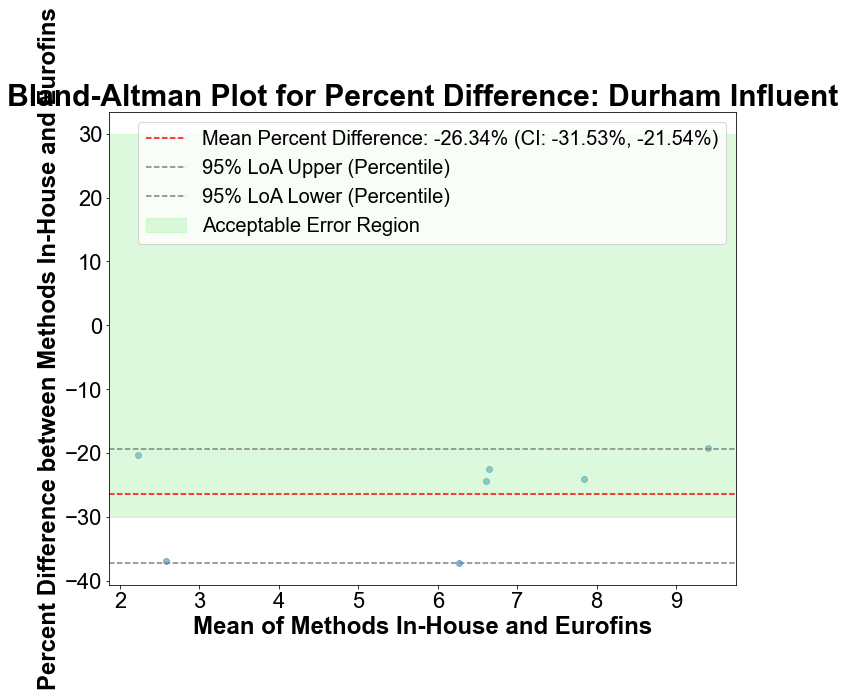

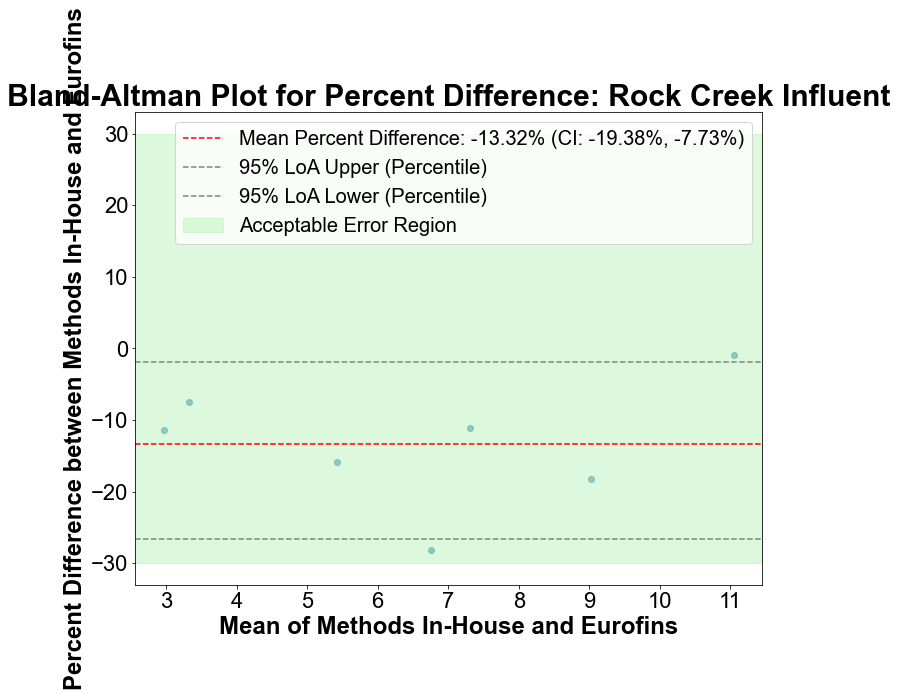

In [ ]:
# Define the locations of interest
locations_of_interest = ['Durham Influent', 'Rock Creek Influent']

# Find common PFAS compounds in both locations
durham_df = quant_df[quant_df['Sample Location_InHouse'] == 'Durham Influent']
rock_creek_df = quant_df[quant_df['Sample Location_InHouse'] == 'Rock Creek Influent']
common_compounds = set(durham_df['PFAS Compound_InHouse']).intersection(set(rock_creek_df['PFAS Compound_InHouse']))

# Filter dataframes to only include common compounds
durham_common_df = durham_df[durham_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
rock_creek_common_df = rock_creek_df[rock_creek_df['PFAS Compound_InHouse'].isin(common_compounds)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Create Bland-Altman plots for each location of interest with common PFAS compounds
create_bland_altman_plot('Durham Influent', durham_common_df)
create_bland_altman_plot('Rock Creek Influent', rock_creek_common_df)

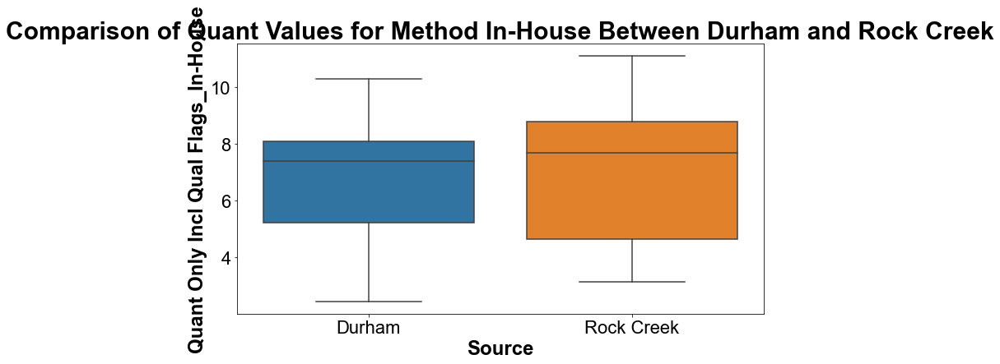

In [ ]:
# Add a column to each DataFrame to indicate the source
durham_common_df['Source'] = 'Durham'
rock_creek_common_df['Source'] = 'Rock Creek'

# Concatenate the two DataFrames
combined_df = pd.concat([durham_common_df, rock_creek_common_df], ignore_index=True)

# Create the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Source', y='Quant Only Incl Qual Flags_InHouse', data=combined_df)
plt.title('Comparison of Quant Values for Method In-House Between Durham and Rock Creek')
plt.ylabel('Quant Only Incl Qual Flags_In-House')
plt.xlabel('Source')

plt.tight_layout()
plt.show()

## Histograms

In [183]:
quant_df.columns

Index(['Result_InHouse', 'Analysis_InHouse', 'Sample Location_InHouse',
       'Type_InHouse', 'Sample Date_InHouse', 'PFAS Compound_InHouse',
       'MDL_InHouse', 'Detection Class_InHouse',
       'Quant Only Incl Qual Flags_InHouse',
       'Quant Incl Estimates Incl Qual Flags_InHouse',
       'All (w BDL= MDL/2) Incl Qual Flags_InHouse', 'Units_InHouse',
       'ChainLength_InHouse', 'Dominant Contributor_InHouse', 'Sector_InHouse',
       'unique_key', 'Result_Eurofins', 'Analysis_Eurofins',
       'Sample Location_Eurofins', 'Type_Eurofins', 'Sample Date_Eurofins',
       'PFAS Compound_Eurofins', 'MDL_Eurofins', 'Detection Class_Eurofins',
       'Quant Only Incl Qual Flags_Eurofins',
       'Quant Incl Estimates Incl Qual Flags_Eurofins',
       'All (w BDL= MDL/2) Incl Qual Flags_Eurofins', 'Units_Eurofins',
       'ChainLength_Eurofins', 'Dominant Contributor_Eurofins',
       'Sector_Eurofins', 'RPD'],
      dtype='object')

### All Quant

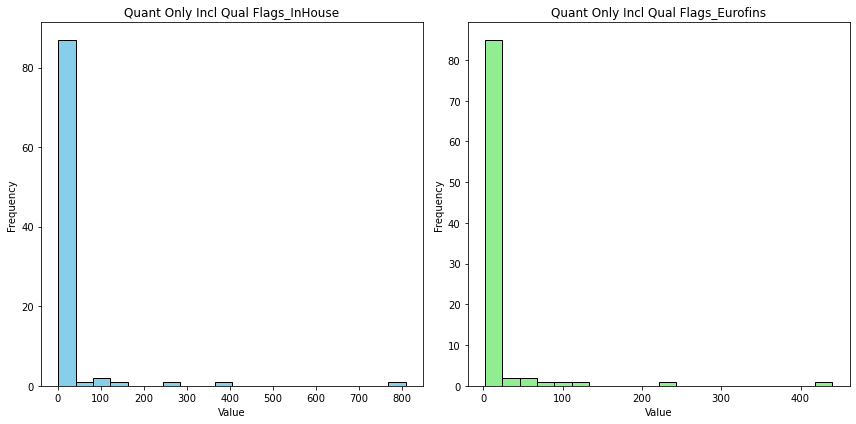

In [184]:
# Set up the matplotlib figure and axes for side-by-side histograms
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Histogram for 'Quant Only Incl Qual Flags_1633'
axes[0].hist(quant_df['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Quant Only Incl Qual Flags_InHouse')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Histogram for 'Quant Only Incl Qual Flags_537.1'
# Note: Ensure the column name matches exactly, including spaces and punctuation.
axes[1].hist(quant_df['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
axes[1].set_title('Quant Only Incl Qual Flags_Eurofins')
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the histograms
plt.show()


### By PFAS Compound

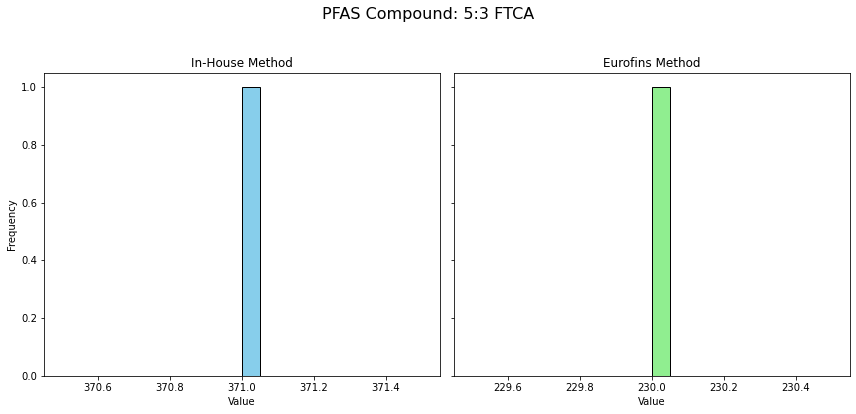

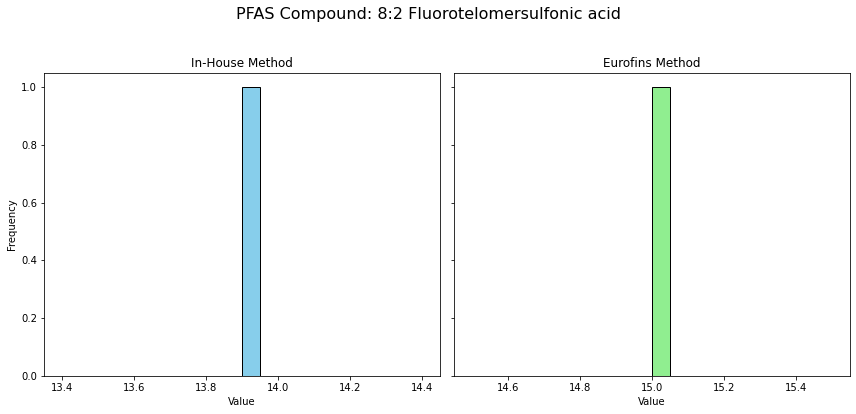

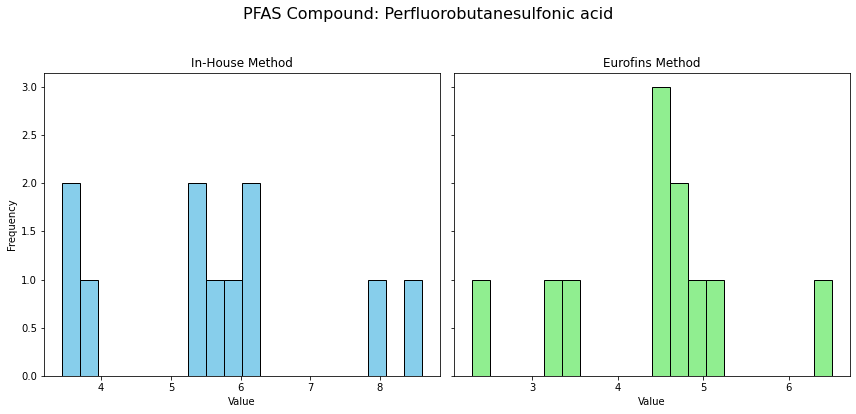

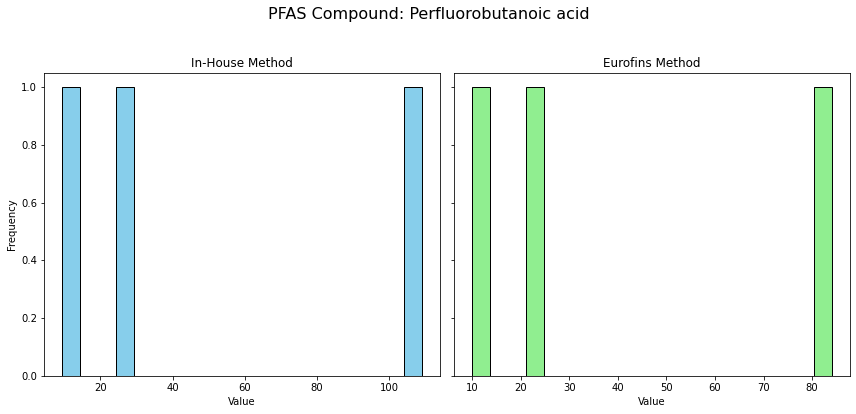

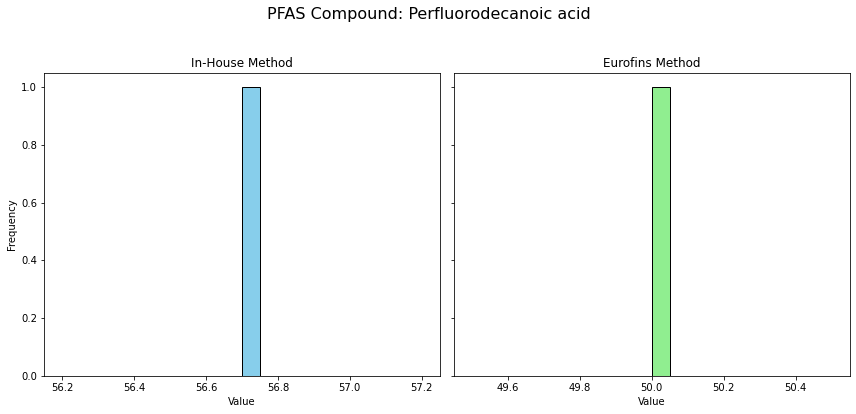

...

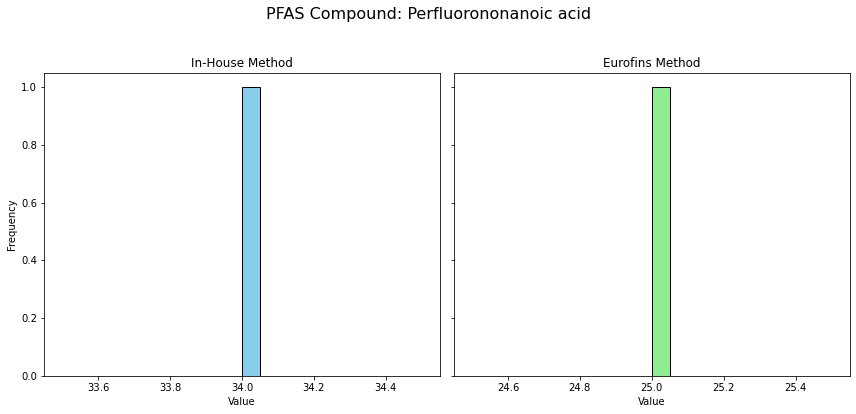

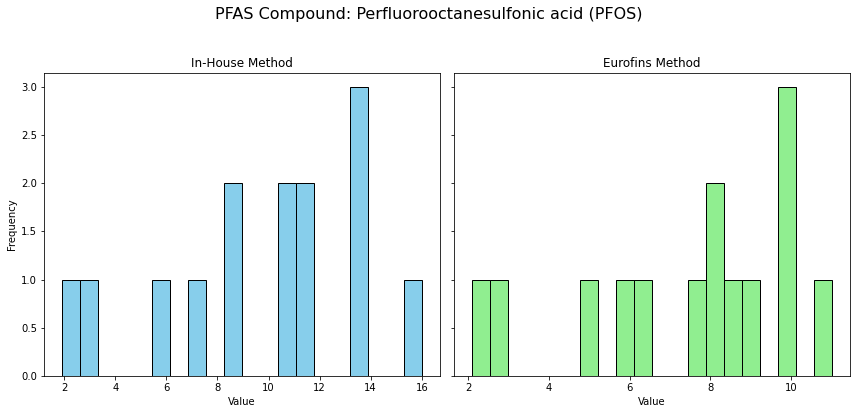

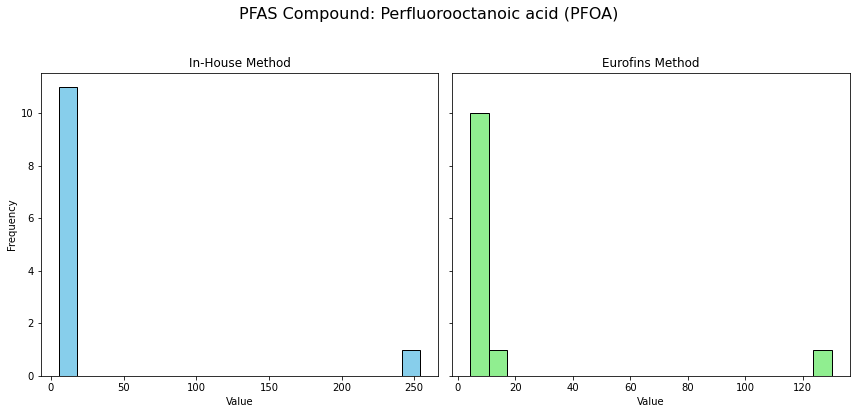

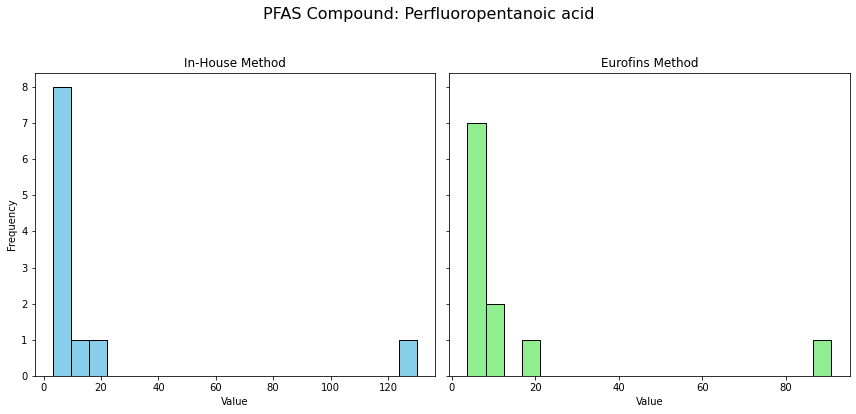

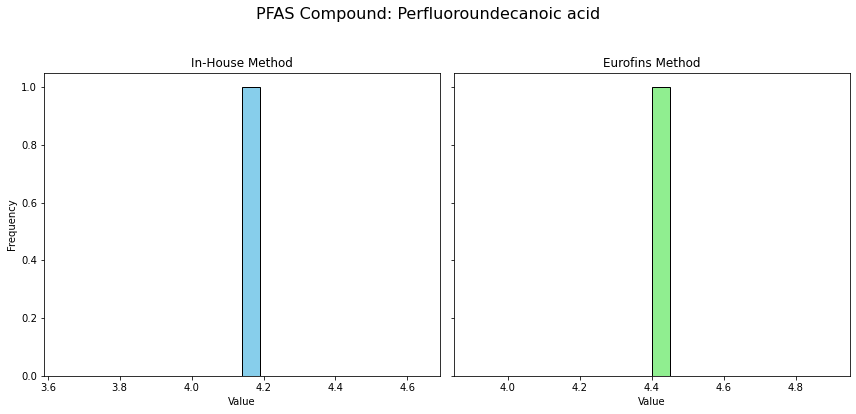

In [185]:
# Group the DataFrame by 'PFAS Compound_1633'
groups = quant_df.groupby('PFAS Compound_InHouse')

for compound, group in groups:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), sharey=True)
    fig.suptitle(f'PFAS Compound: {compound}', fontsize=16)
    
    # Histogram for 'Quant Only Incl Qual Flags_1633'
    axes[0].hist(group['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
    axes[0].set_title('In-House Method')
    axes[0].set_xlabel('Value')
    axes[0].set_ylabel('Frequency')
    
    # Histogram for 'Quant Only Incl Qual Flags_537.1'
    # Ensure the column name matches exactly, including spaces and punctuation.
    axes[1].hist(group['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
    axes[1].set_title('Eurofins Method')
    axes[1].set_xlabel('Value')
    # The Y-axis label is shared, set by the first histogram
    
    # Adjust layout for better spacing and display the plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect to make space for the suptitle
    plt.show()


### By PFAS Compound Class

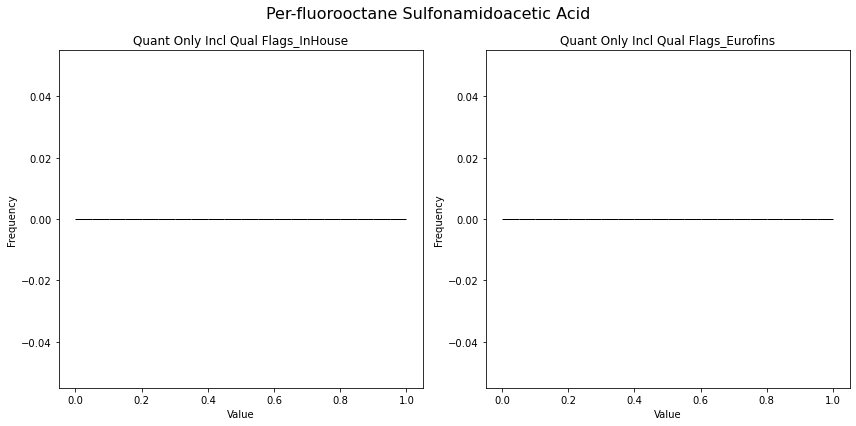

In [187]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
# Set up the matplotlib figure and axes for side-by-side histograms
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Per-fluorooctane Sulfonamidoacetic Acid', fontsize=16)

# Histogram for 'Quant Only Incl Qual Flags_1633'
axes[0].hist(filtered_df['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Quant Only Incl Qual Flags_InHouse')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Histogram for 'Quant Only Incl Qual Flags_537.1'
# Note: Ensure the column name matches exactly, including spaces and punctuation.
axes[1].hist(filtered_df['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
axes[1].set_title('Quant Only Incl Qual Flags_Eurofins')
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the histograms
plt.show()

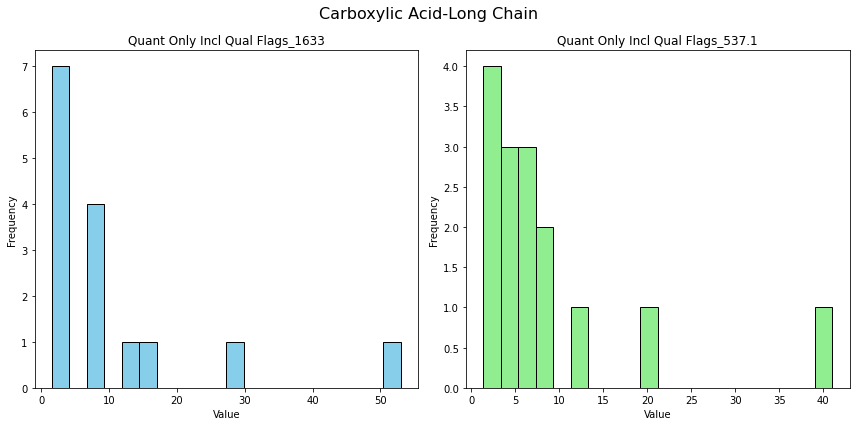

In [ ]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_1633'].isin(pfas_compounds_CarboxylicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_1633', 'Quant Only Incl Qual Flags_5371'])
# Set up the matplotlib figure and axes for side-by-side histograms
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Carboxylic Acid-Long Chain', fontsize=16)

# Histogram for 'Quant Only Incl Qual Flags_1633'
axes[0].hist(filtered_df['Quant Only Incl Qual Flags_1633'].dropna(), bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Quant Only Incl Qual Flags_1633')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Histogram for 'Quant Only Incl Qual Flags_537.1'
# Note: Ensure the column name matches exactly, including spaces and punctuation.
axes[1].hist(filtered_df['Quant Only Incl Qual Flags_5371'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
axes[1].set_title('Quant Only Incl Qual Flags_537.1')
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the histograms
plt.show()

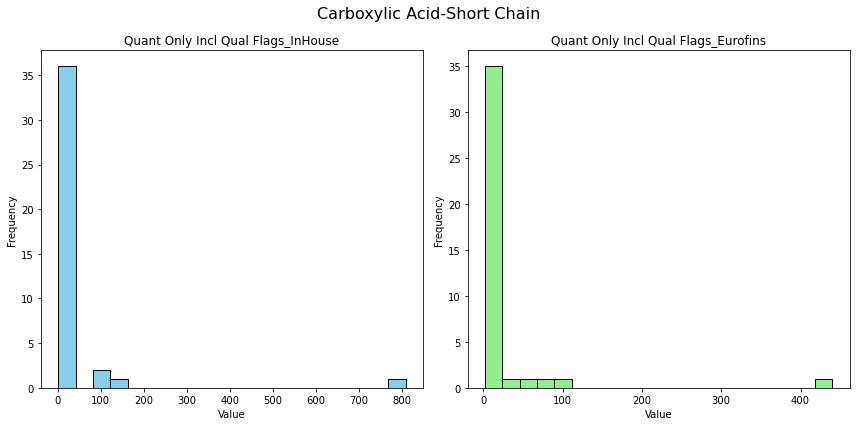

In [188]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
# Set up the matplotlib figure and axes for side-by-side histograms
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Carboxylic Acid-Short Chain', fontsize=16)

# Histogram for 'Quant Only Incl Qual Flags_1633'
axes[0].hist(filtered_df['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Quant Only Incl Qual Flags_InHouse')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Histogram for 'Quant Only Incl Qual Flags_537.1'
# Note: Ensure the column name matches exactly, including spaces and punctuation.
axes[1].hist(filtered_df['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
axes[1].set_title('Quant Only Incl Qual Flags_Eurofins')
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the histograms
plt.show()

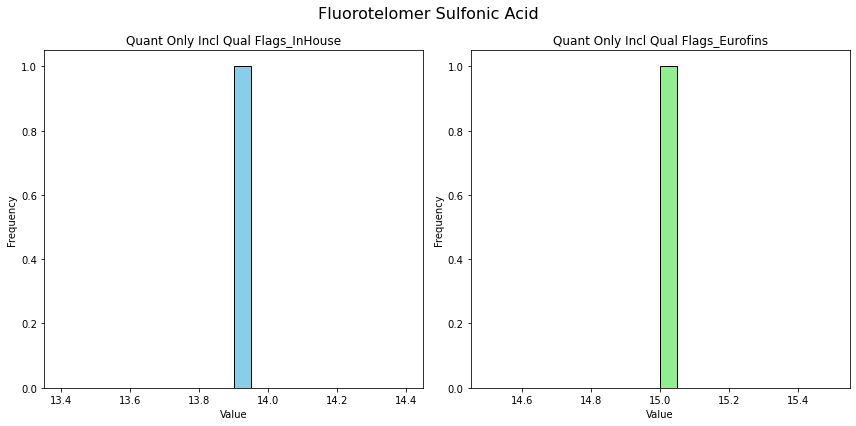

In [189]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_FluorotelomerSulfonicAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
# Set up the matplotlib figure and axes for side-by-side histograms
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Fluorotelomer Sulfonic Acid', fontsize=16)

# Histogram for 'Quant Only Incl Qual Flags_1633'
axes[0].hist(filtered_df['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Quant Only Incl Qual Flags_InHouse')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Histogram for 'Quant Only Incl Qual Flags_537.1'
# Note: Ensure the column name matches exactly, including spaces and punctuation.
axes[1].hist(filtered_df['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
axes[1].set_title('Quant Only Incl Qual Flags_Eurofins')
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the histograms
plt.show()

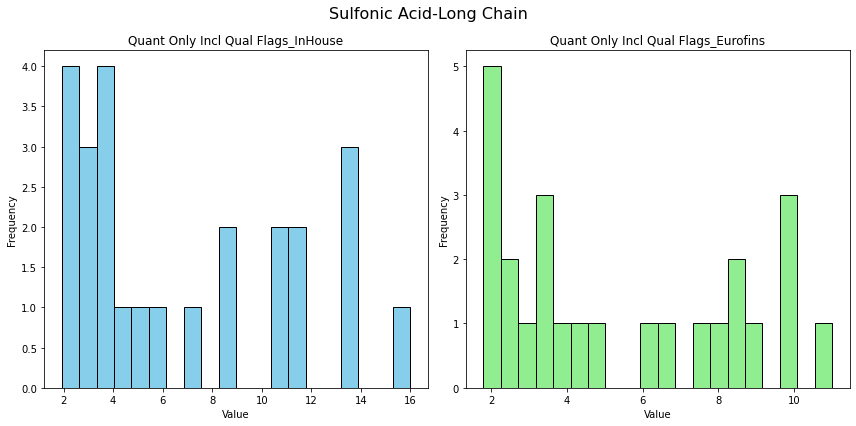

In [191]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
# Set up the matplotlib figure and axes for side-by-side histograms
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Sulfonic Acid-Long Chain', fontsize=16)

# Histogram for 'Quant Only Incl Qual Flags_1633'
axes[0].hist(filtered_df['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Quant Only Incl Qual Flags_InHouse')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Histogram for 'Quant Only Incl Qual Flags_537.1'
# Note: Ensure the column name matches exactly, including spaces and punctuation.
axes[1].hist(filtered_df['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
axes[1].set_title('Quant Only Incl Qual Flags_Eurofins')
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the histograms
plt.show()

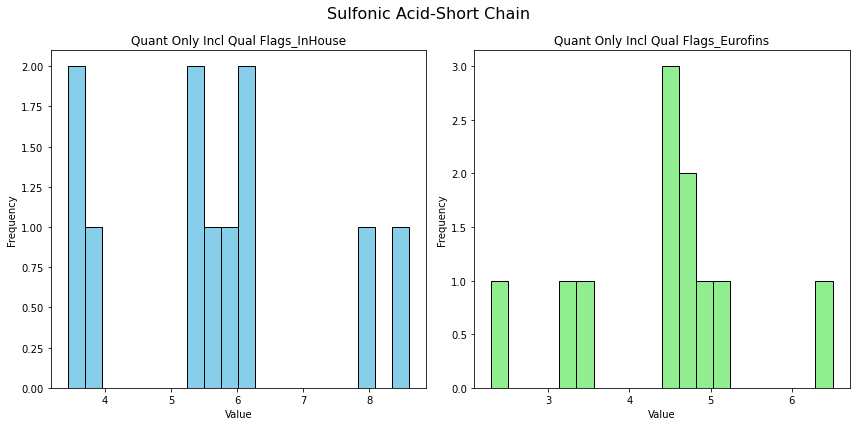

In [ ]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])
# Set up the matplotlib figure and axes for side-by-side histograms
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('Sulfonic Acid-Short Chain', fontsize=16)

# Histogram for 'Quant Only Incl Qual Flags_1633'
axes[0].hist(filtered_df['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Quant Only Incl Qual Flags_InHouse')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Histogram for 'Quant Only Incl Qual Flags_537.1'
# Note: Ensure the column name matches exactly, including spaces and punctuation.
axes[1].hist(filtered_df['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
axes[1].set_title('Quant Only Incl Qual Flags_Eurofins')
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the histograms
plt.show()

### By Type

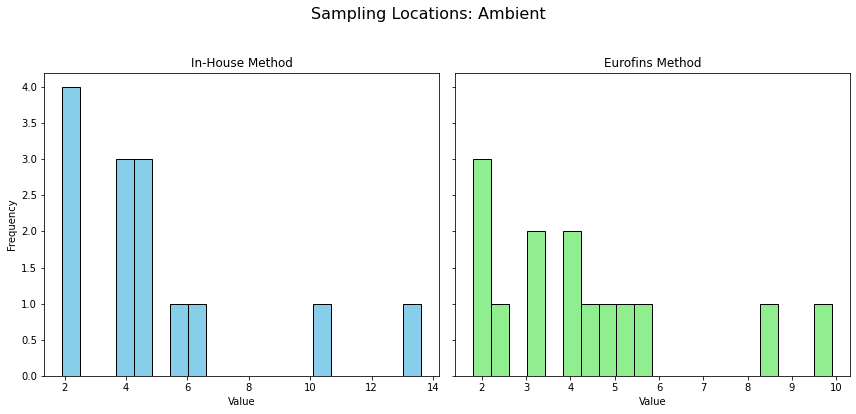

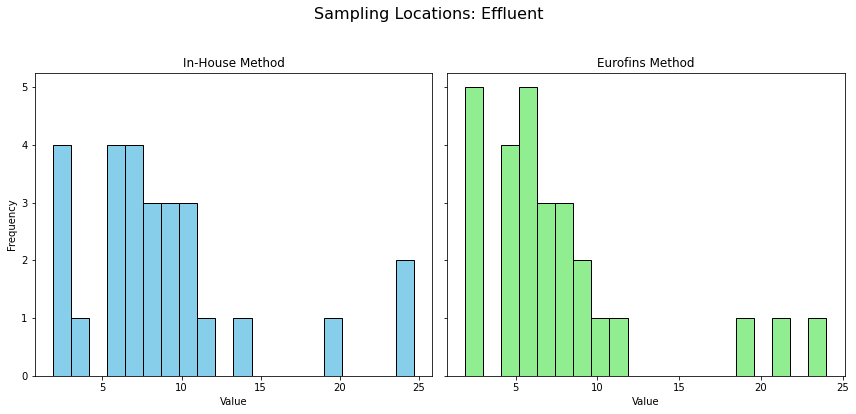

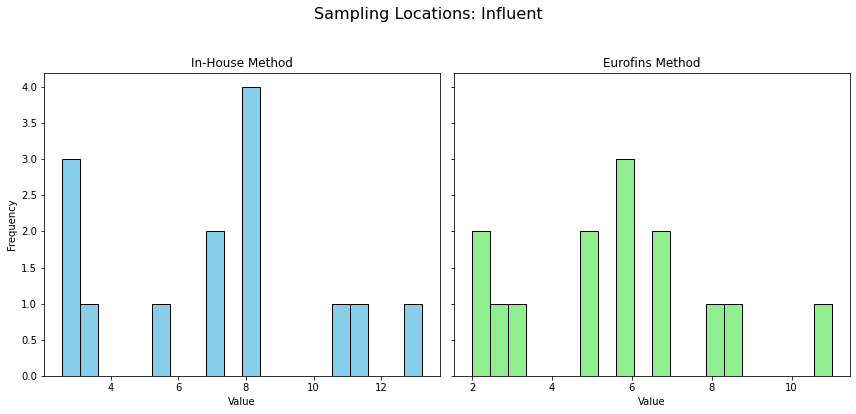

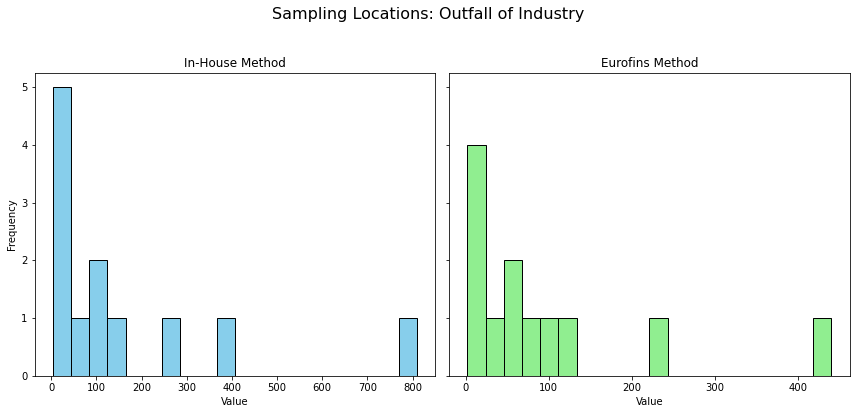

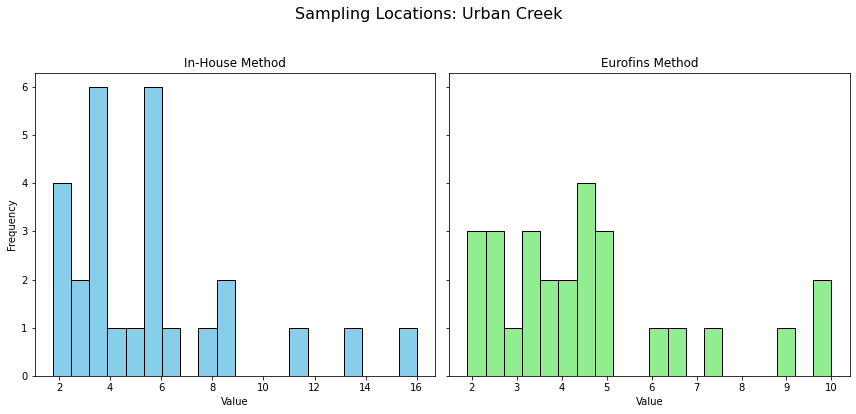

In [192]:
# Group the DataFrame by 'PFAS Compound_1633'
groups = quant_df.groupby('Type_InHouse')

for Type, group in groups:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), sharey=True)
    fig.suptitle(f'Sampling Locations: {Type}', fontsize=16)
    
    # Histogram for 'Quant Only Incl Qual Flags_1633'
    axes[0].hist(group['Quant Only Incl Qual Flags_InHouse'].dropna(), bins=20, color='skyblue', edgecolor='black')
    axes[0].set_title('In-House Method')
    axes[0].set_xlabel('Value')
    axes[0].set_ylabel('Frequency')
    
    # Histogram for 'Quant Only Incl Qual Flags_537.1'
    # Ensure the column name matches exactly, including spaces and punctuation.
    axes[1].hist(group['Quant Only Incl Qual Flags_Eurofins'].dropna(), bins=20, color='lightgreen', edgecolor='black')  # Adjust column name if necessary
    axes[1].set_title('Eurofins Method')
    axes[1].set_xlabel('Value')
    # The Y-axis label is shared, set by the first histogram
    
    # Adjust layout for better spacing and display the plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect to make space for the suptitle
    plt.show()

## Histogram for Differences

### All quant

In [193]:
# Calculate the percent difference
quant_df['Percent_Diff_In-House-Eurofins'] = ((quant_df['Quant Only Incl Qual Flags_InHouse'] - quant_df['Quant Only Incl Qual Flags_Eurofins']) / ((quant_df['Quant Only Incl Qual Flags_InHouse'] + quant_df['Quant Only Incl Qual Flags_InHouse']) / 2)) * 100


<ipython-input-193-322566a22917>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quant_df['Percent_Diff_In-House-Eurofins'] = ((quant_df['Quant Only Incl Qual Flags_InHouse'] - quant_df['Quant Only Incl Qual Flags_Eurofins']) / ((quant_df['Quant Only Incl Qual Flags_InHouse'] + quant_df['Quant Only Incl Qual Flags_InHouse']) / 2)) * 100


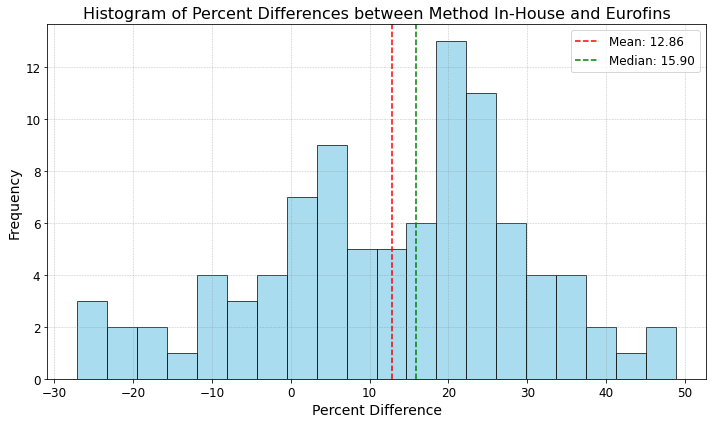

In [194]:
# Step 1: Create the histogram for percent differences
plt.figure(figsize=(10, 6))  # Set the figure size (width, height) in inches
n, bins, patches = plt.hist(quant_df['Percent_Diff_In-House-Eurofins'].dropna(), bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Step 2: Format the plot
plt.title('Histogram of Percent Differences between Method In-House and Eurofins', fontsize=16)  # Title of the histogram
plt.xlabel('Percent Difference', fontsize=14)  # X-axis label
plt.ylabel('Frequency', fontsize=14)  # Y-axis label

# Optional: Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Optional: Customizing ticks
plt.xticks(fontsize=12)  # Font size for X-axis ticks
plt.yticks(fontsize=12)  # Font size for Y-axis ticks

# Optional: Adding vertical lines for mean and median of percent differences
mean_val = np.mean(quant_df['Percent_Diff_In-House-Eurofins'])
median_val = np.median(quant_df['Percent_Diff_In-House-Eurofins'])
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Optional: Adding a legend
plt.legend(loc='upper right', fontsize=12)

# Step 3: Show the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


### By PFAS Compound

Not enough data for 5:3 FTCA to generate a histogram.
Not enough data for 8:2 Fluorotelomersulfonic acid to generate a histogram.


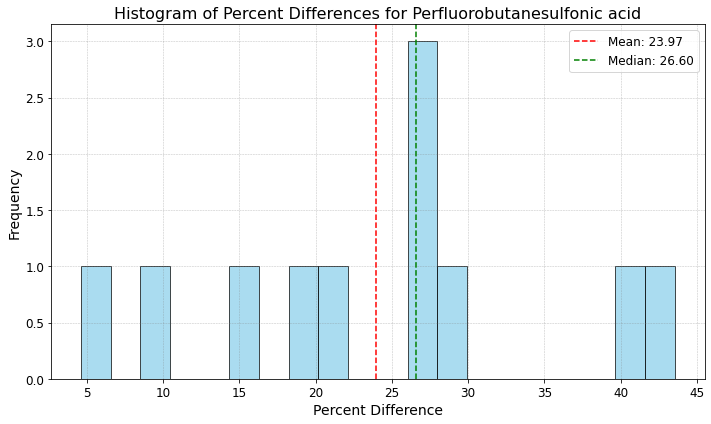

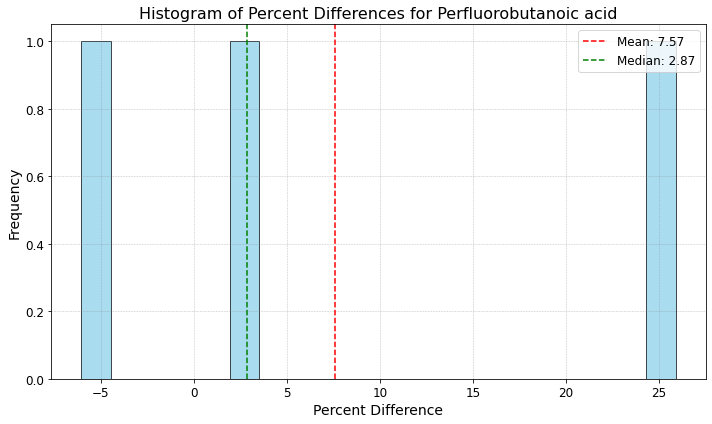

Not enough data for Perfluorodecanoic acid to generate a histogram.
Not enough data for Perfluorododecanoic acid to generate a histogram.


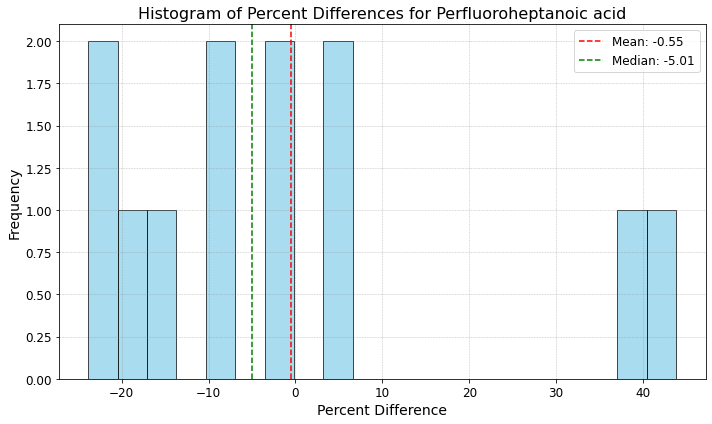

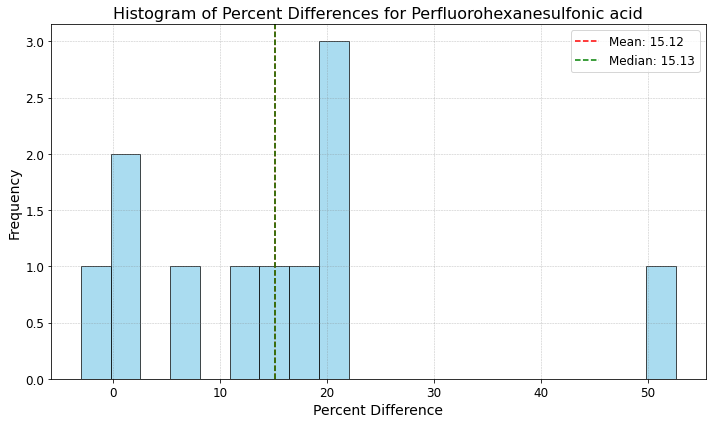

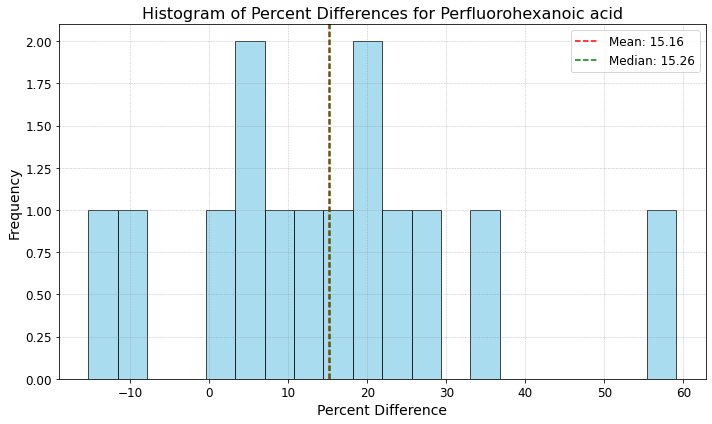

Not enough data for Perfluorononanoic acid to generate a histogram.


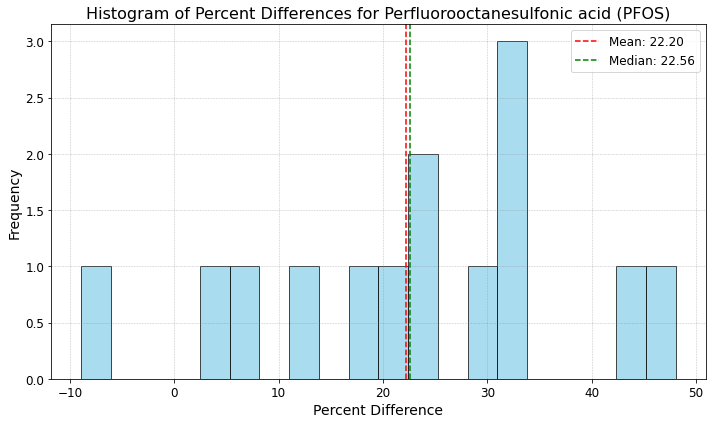

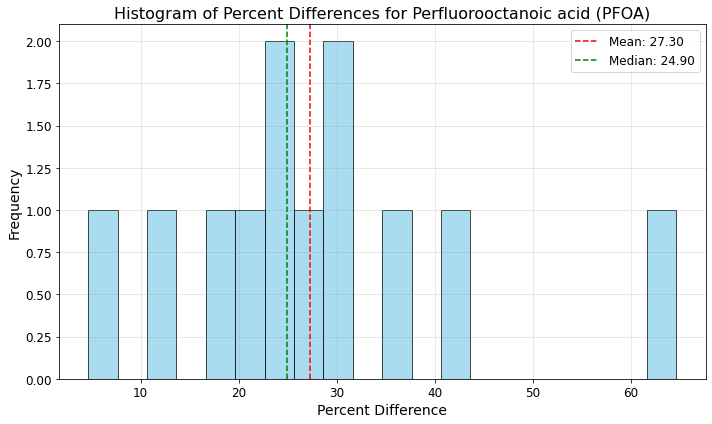

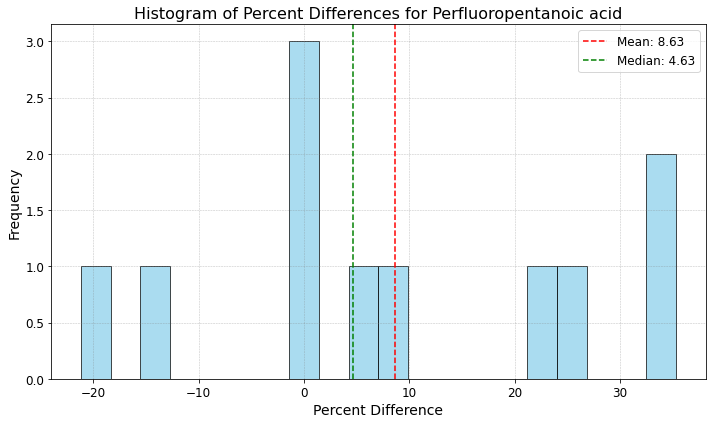

Not enough data for Perfluoroundecanoic acid to generate a histogram.


In [195]:
# Group the DataFrame by 'PFAS Compound_1633'
groups = quant_df.groupby('PFAS Compound_InHouse')

for compound, group in groups:
    # Calculate the percent difference for the current group
    group['Percent_Diff_In-House-Eurofins'] = ((group['Quant Only Incl Qual Flags_InHouse'] - group['Quant Only Incl Qual Flags_Eurofins']) / ((group['Quant Only Incl Qual Flags_InHouse'] + group['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100
    
    # Ensure there are enough data points for a meaningful histogram
    if len(group) > 1:
        plt.figure(figsize=(10, 6))
        n, bins, patches = plt.hist(group['Percent_Diff_In-House-Eurofins'].dropna(), bins=20, color='skyblue', edgecolor='black', alpha=0.7)

        # Formatting the plot
        plt.title(f'Histogram of Percent Differences for {compound}', fontsize=16)
        plt.xlabel('Percent Difference', fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        # Adding vertical lines for mean and median of the percent differences
        mean_val = np.mean(group['Percent_Diff_In-House-Eurofins'])
        median_val = np.median(group['Percent_Diff_In-House-Eurofins'])
        plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
        plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

        # Adding a legend
        plt.legend(loc='upper right', fontsize=12)

        plt.tight_layout()
        plt.show()
    else:
        print(f"Not enough data for {compound} to generate a histogram.")



### By PFAS Class

c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


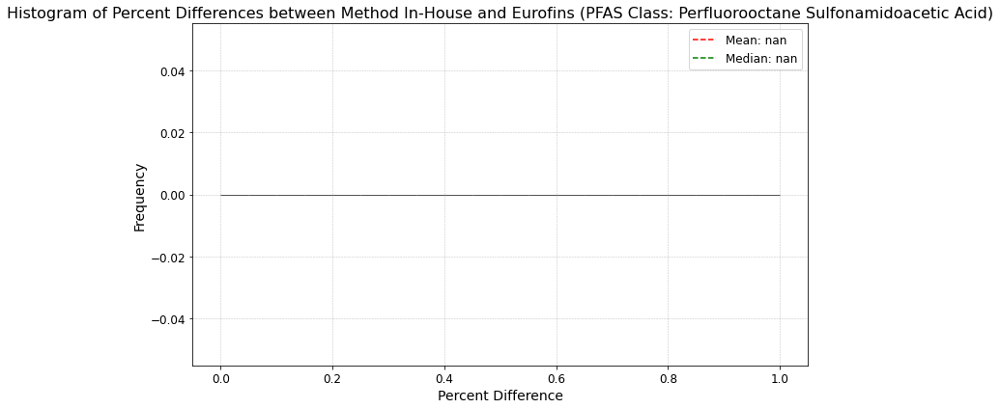

In [196]:
# Assuming 'pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid' is defined and 'quant_df' is your DataFrame
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the percent difference
filtered_df['Percent_Diff_In-House-Eurofins'] = ((filtered_df['Quant Only Incl Qual Flags_InHouse'] - filtered_df['Quant Only Incl Qual Flags_Eurofins']) / ((filtered_df['Quant Only Incl Qual Flags_InHouse'] + filtered_df['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100

# Step 1: Create the histogram for percent differences
plt.figure(figsize=(10, 6))  # Set the figure size (width, height) in inches
n, bins, patches = plt.hist(filtered_df['Percent_Diff_In-House-Eurofins'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Step 2: Format the plot
plt.title('Histogram of Percent Differences between Method In-House and Eurofins (PFAS Class: Perfluorooctane Sulfonamidoacetic Acid)', fontsize=16)  # Title of the histogram
plt.xlabel('Percent Difference', fontsize=14)  # X-axis label
plt.ylabel('Frequency', fontsize=14)  # Y-axis label

# Optional: Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Optional: Customizing ticks
plt.xticks(fontsize=12)  # Font size for X-axis ticks
plt.yticks(fontsize=12)  # Font size for Y-axis ticks

# Optional: Adding vertical lines for mean and median of percent differences
mean_val = np.mean(filtered_df['Percent_Diff_In-House-Eurofins'])
median_val = np.median(filtered_df['Percent_Diff_In-House-Eurofins'])
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Optional: Adding a legend
plt.legend(loc='upper right', fontsize=12)

# Step 3: Show the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


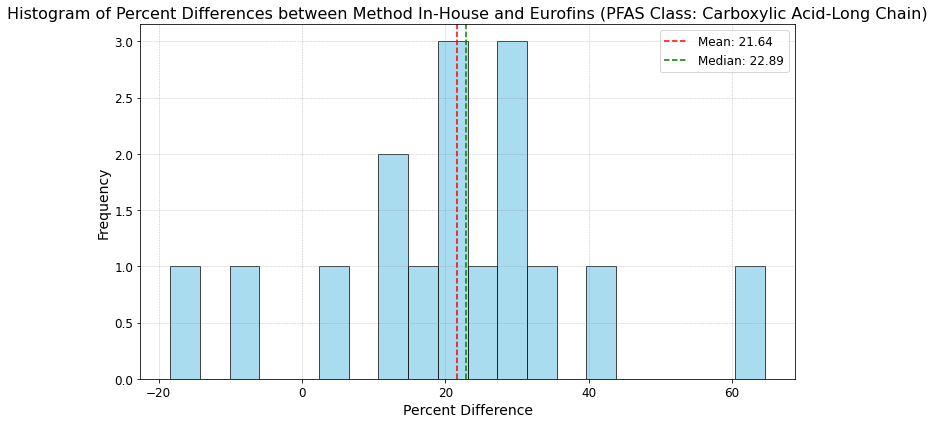

In [197]:
# Assuming 'pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid' is defined and 'quant_df' is your DataFrame
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the percent difference
filtered_df['Percent_Diff_In-House-Eurofins'] = ((filtered_df['Quant Only Incl Qual Flags_InHouse'] - filtered_df['Quant Only Incl Qual Flags_Eurofins']) / ((filtered_df['Quant Only Incl Qual Flags_InHouse'] + filtered_df['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100

# Step 1: Create the histogram for percent differences
plt.figure(figsize=(10, 6))  # Set the figure size (width, height) in inches
n, bins, patches = plt.hist(filtered_df['Percent_Diff_In-House-Eurofins'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Step 2: Format the plot
plt.title('Histogram of Percent Differences between Method In-House and Eurofins (PFAS Class: Carboxylic Acid-Long Chain)', fontsize=16)  # Title of the histogram
plt.xlabel('Percent Difference', fontsize=14)  # X-axis label
plt.ylabel('Frequency', fontsize=14)  # Y-axis label

# Optional: Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Optional: Customizing ticks
plt.xticks(fontsize=12)  # Font size for X-axis ticks
plt.yticks(fontsize=12)  # Font size for Y-axis ticks

# Optional: Adding vertical lines for mean and median of percent differences
mean_val = np.mean(filtered_df['Percent_Diff_In-House-Eurofins'])
median_val = np.median(filtered_df['Percent_Diff_In-House-Eurofins'])
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Optional: Adding a legend
plt.legend(loc='upper right', fontsize=12)

# Step 3: Show the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


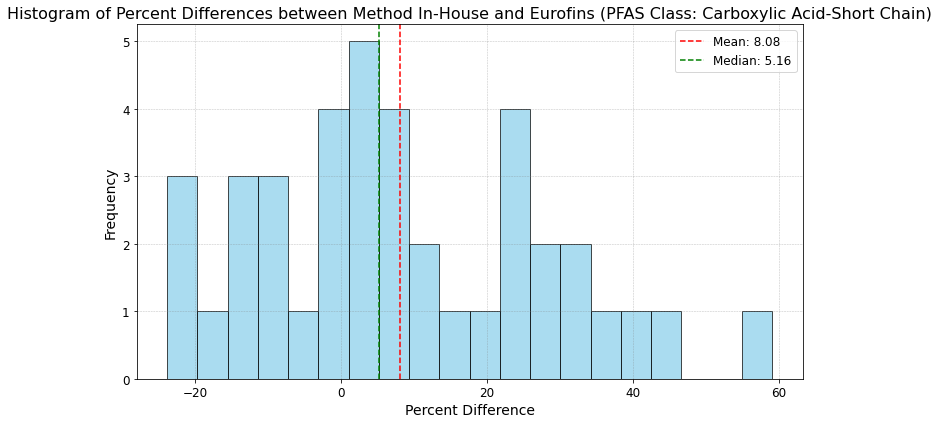

In [198]:
# Assuming 'pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid' is defined and 'quant_df' is your DataFrame
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the percent difference
filtered_df['Percent_Diff_In-House-Eurofins'] = ((filtered_df['Quant Only Incl Qual Flags_InHouse'] - filtered_df['Quant Only Incl Qual Flags_Eurofins']) / ((filtered_df['Quant Only Incl Qual Flags_InHouse'] + filtered_df['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100

# Step 1: Create the histogram for percent differences
plt.figure(figsize=(10, 6))  # Set the figure size (width, height) in inches
n, bins, patches = plt.hist(filtered_df['Percent_Diff_In-House-Eurofins'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Step 2: Format the plot
plt.title('Histogram of Percent Differences between Method In-House and Eurofins (PFAS Class: Carboxylic Acid-Short Chain)', fontsize=16)  # Title of the histogram
plt.xlabel('Percent Difference', fontsize=14)  # X-axis label
plt.ylabel('Frequency', fontsize=14)  # Y-axis label

# Optional: Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Optional: Customizing ticks
plt.xticks(fontsize=12)  # Font size for X-axis ticks
plt.yticks(fontsize=12)  # Font size for Y-axis ticks

# Optional: Adding vertical lines for mean and median of percent differences
mean_val = np.mean(filtered_df['Percent_Diff_In-House-Eurofins'])
median_val = np.median(filtered_df['Percent_Diff_In-House-Eurofins'])
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Optional: Adding a legend
plt.legend(loc='upper right', fontsize=12)

# Step 3: Show the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


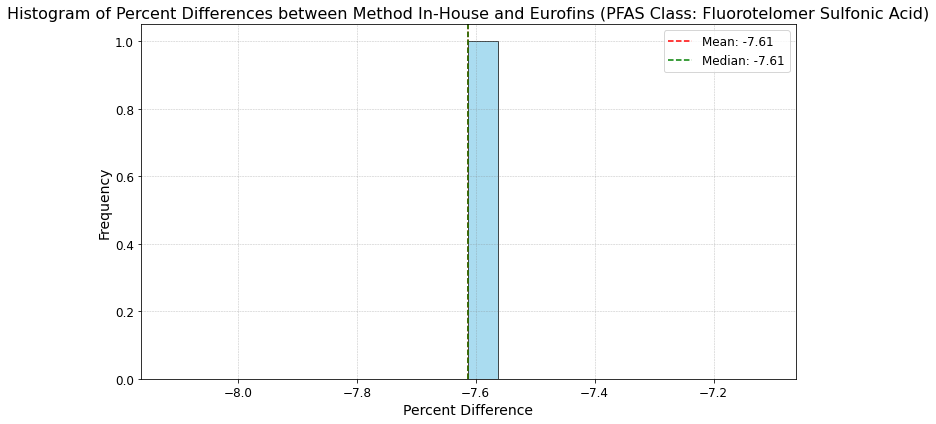

In [199]:
# Assuming 'pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid' is defined and 'quant_df' is your DataFrame
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_FluorotelomerSulfonicAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the percent difference
filtered_df['Percent_Diff_In-House-Eurofins'] = ((filtered_df['Quant Only Incl Qual Flags_InHouse'] - filtered_df['Quant Only Incl Qual Flags_Eurofins']) / ((filtered_df['Quant Only Incl Qual Flags_InHouse'] + filtered_df['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100

# Step 1: Create the histogram for percent differences
plt.figure(figsize=(10, 6))  # Set the figure size (width, height) in inches
n, bins, patches = plt.hist(filtered_df['Percent_Diff_In-House-Eurofins'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Step 2: Format the plot
plt.title('Histogram of Percent Differences between Method In-House and Eurofins (PFAS Class: Fluorotelomer Sulfonic Acid)', fontsize=16)  # Title of the histogram
plt.xlabel('Percent Difference', fontsize=14)  # X-axis label
plt.ylabel('Frequency', fontsize=14)  # Y-axis label

# Optional: Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Optional: Customizing ticks
plt.xticks(fontsize=12)  # Font size for X-axis ticks
plt.yticks(fontsize=12)  # Font size for Y-axis ticks

# Optional: Adding vertical lines for mean and median of percent differences
mean_val = np.mean(filtered_df['Percent_Diff_In-House-Eurofins'])
median_val = np.median(filtered_df['Percent_Diff_In-House-Eurofins'])
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Optional: Adding a legend
plt.legend(loc='upper right', fontsize=12)

# Step 3: Show the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


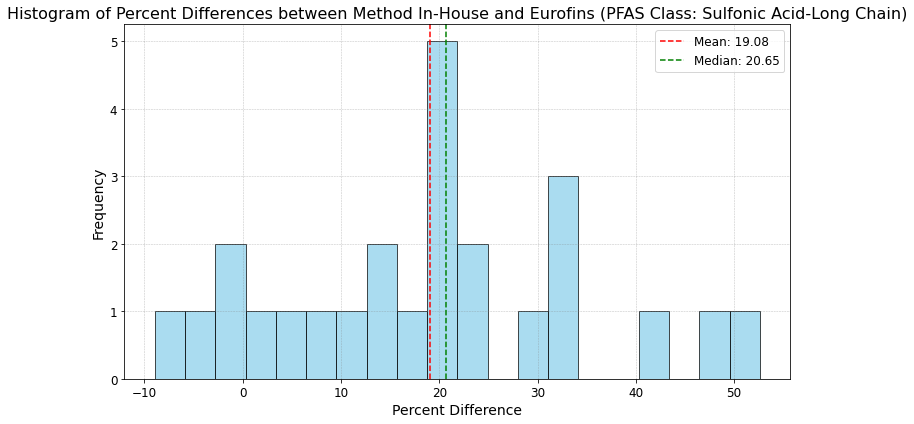

In [200]:
# Assuming 'pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid' is defined and 'quant_df' is your DataFrame
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the percent difference
filtered_df['Percent_Diff_In-House-Eurofins'] = ((filtered_df['Quant Only Incl Qual Flags_InHouse'] - filtered_df['Quant Only Incl Qual Flags_Eurofins']) / ((filtered_df['Quant Only Incl Qual Flags_InHouse'] + filtered_df['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100

# Step 1: Create the histogram for percent differences
plt.figure(figsize=(10, 6))  # Set the figure size (width, height) in inches
n, bins, patches = plt.hist(filtered_df['Percent_Diff_In-House-Eurofins'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Step 2: Format the plot
plt.title('Histogram of Percent Differences between Method In-House and Eurofins (PFAS Class: Sulfonic Acid-Long Chain)', fontsize=16)  # Title of the histogram
plt.xlabel('Percent Difference', fontsize=14)  # X-axis label
plt.ylabel('Frequency', fontsize=14)  # Y-axis label

# Optional: Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Optional: Customizing ticks
plt.xticks(fontsize=12)  # Font size for X-axis ticks
plt.yticks(fontsize=12)  # Font size for Y-axis ticks

# Optional: Adding vertical lines for mean and median of percent differences
mean_val = np.mean(filtered_df['Percent_Diff_In-House-Eurofins'])
median_val = np.median(filtered_df['Percent_Diff_In-House-Eurofins'])
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Optional: Adding a legend
plt.legend(loc='upper right', fontsize=12)

# Step 3: Show the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


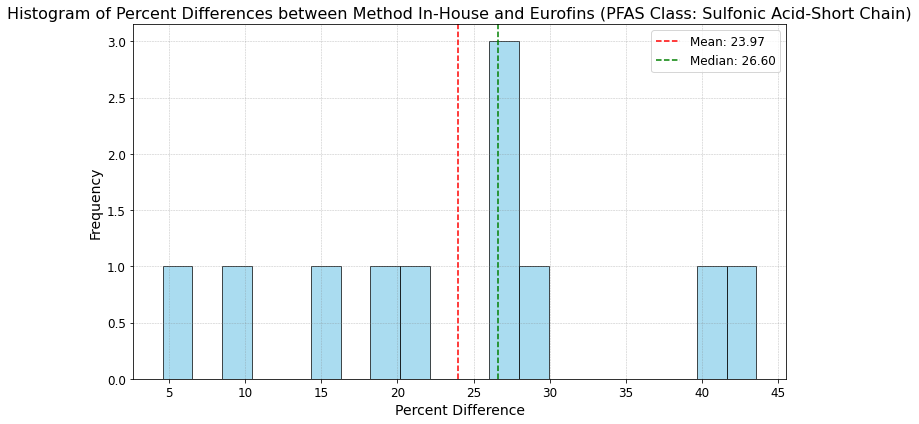

In [201]:
# Assuming 'pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid' is defined and 'quant_df' is your DataFrame
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the percent difference
filtered_df['Percent_Diff_In-House-Eurofins'] = ((filtered_df['Quant Only Incl Qual Flags_InHouse'] - filtered_df['Quant Only Incl Qual Flags_Eurofins']) / ((filtered_df['Quant Only Incl Qual Flags_InHouse'] + filtered_df['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100

# Step 1: Create the histogram for percent differences
plt.figure(figsize=(10, 6))  # Set the figure size (width, height) in inches
n, bins, patches = plt.hist(filtered_df['Percent_Diff_In-House-Eurofins'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Step 2: Format the plot
plt.title('Histogram of Percent Differences between Method In-House and Eurofins (PFAS Class: Sulfonic Acid-Short Chain)', fontsize=16)  # Title of the histogram
plt.xlabel('Percent Difference', fontsize=14)  # X-axis label
plt.ylabel('Frequency', fontsize=14)  # Y-axis label

# Optional: Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Optional: Customizing ticks
plt.xticks(fontsize=12)  # Font size for X-axis ticks
plt.yticks(fontsize=12)  # Font size for Y-axis ticks

# Optional: Adding vertical lines for mean and median of percent differences
mean_val = np.mean(filtered_df['Percent_Diff_In-House-Eurofins'])
median_val = np.median(filtered_df['Percent_Diff_In-House-Eurofins'])
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Optional: Adding a legend
plt.legend(loc='upper right', fontsize=12)

# Step 3: Show the plot
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


### By Type

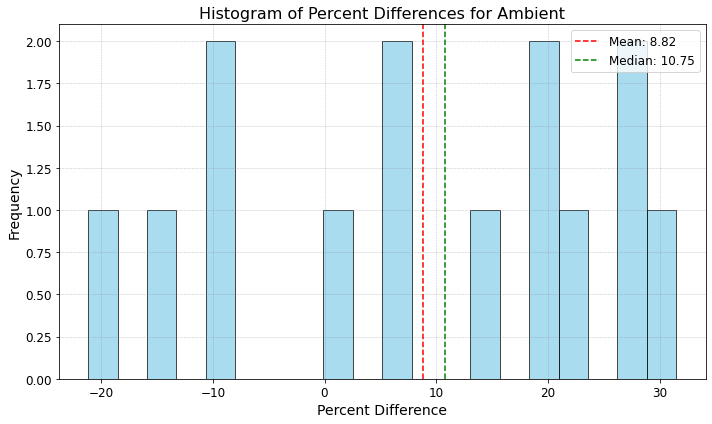

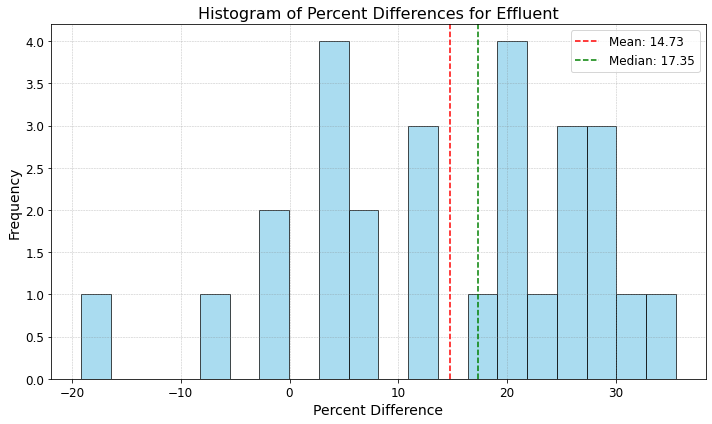

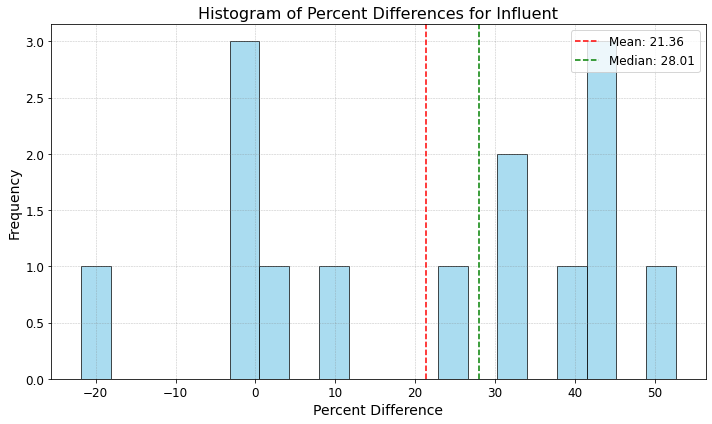

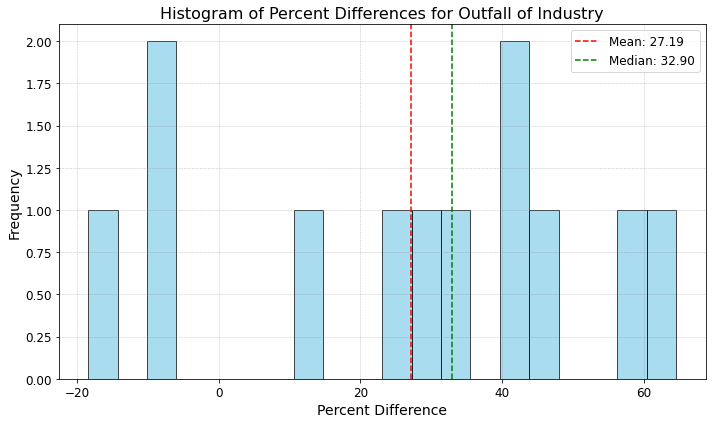

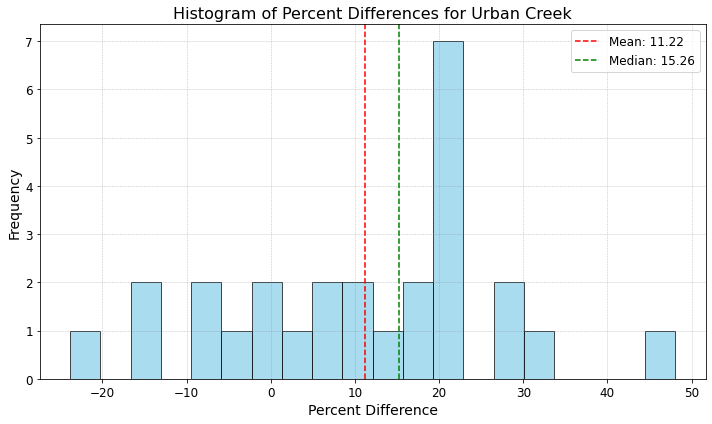

In [202]:
# Group the DataFrame by 'PFAS Compound_1633'
groups = quant_df.groupby('Type_InHouse')

for Type, group in groups:
    # Calculate the percent difference for the current group
    group['Percent_Diff_In-House-Eurofins'] = ((group['Quant Only Incl Qual Flags_InHouse'] - group['Quant Only Incl Qual Flags_Eurofins']) / ((group['Quant Only Incl Qual Flags_InHouse'] + group['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100
    
    # Ensure there are enough data points for a meaningful histogram
    if len(group) > 1:
        plt.figure(figsize=(10, 6))
        n, bins, patches = plt.hist(group['Percent_Diff_In-House-Eurofins'].dropna(), bins=20, color='skyblue', edgecolor='black', alpha=0.7)

        # Formatting the plot
        plt.title(f'Histogram of Percent Differences for {Type}', fontsize=16)
        plt.xlabel('Percent Difference', fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        # Adding vertical lines for mean and median of the percent differences
        mean_val = np.mean(group['Percent_Diff_In-House-Eurofins'])
        median_val = np.median(group['Percent_Diff_In-House-Eurofins'])
        plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
        plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

        # Adding a legend
        plt.legend(loc='upper right', fontsize=12)

        plt.tight_layout()
        plt.show()
    else:
        print(f"Not enough data for {Type} to generate a histogram.")

### By Sample Location

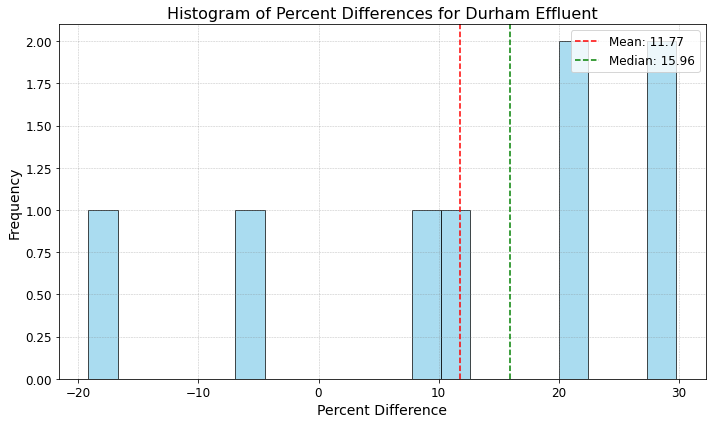

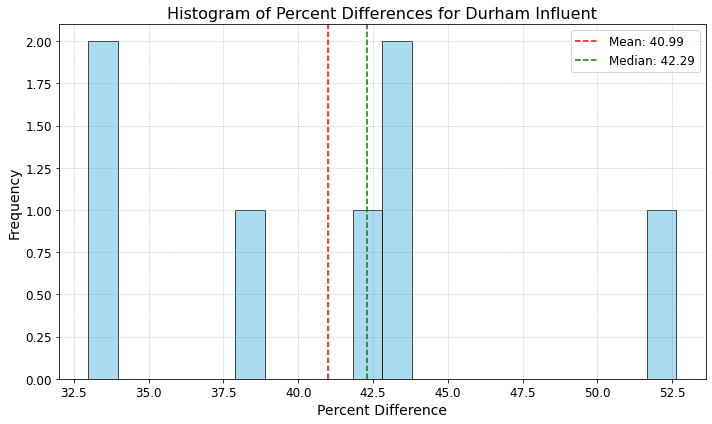

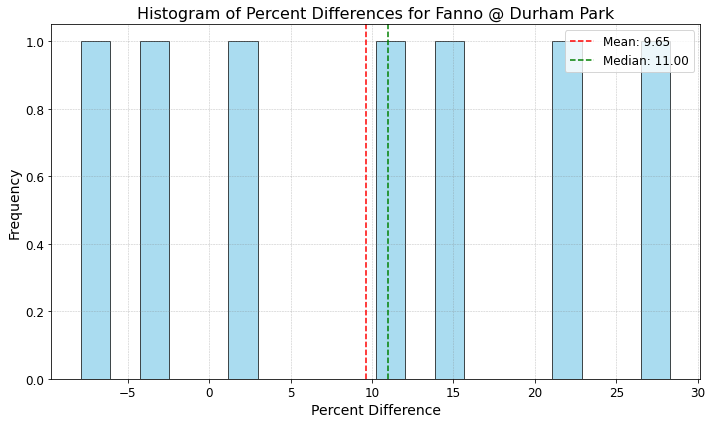

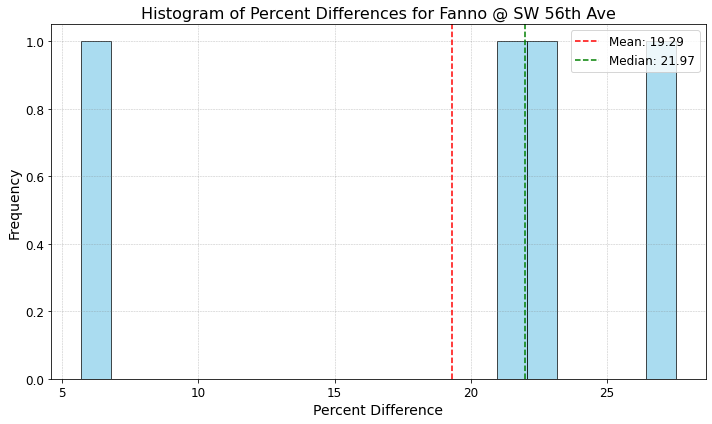

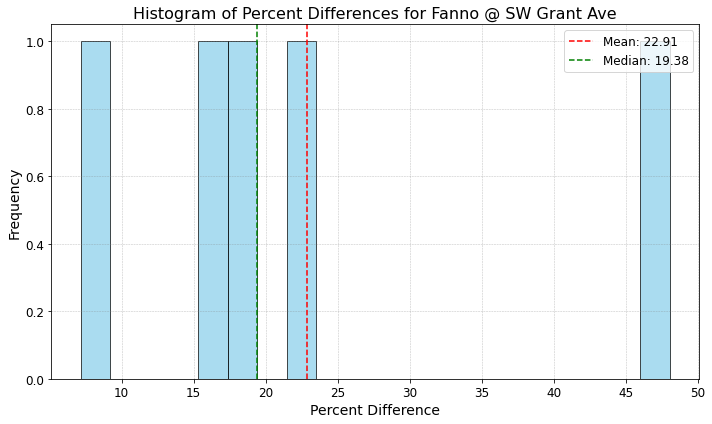

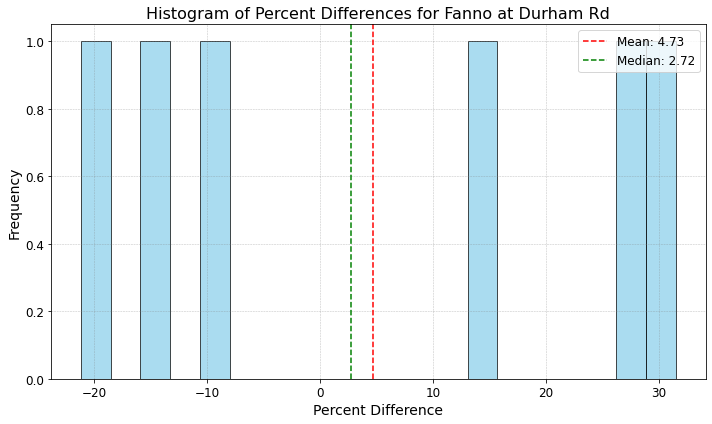

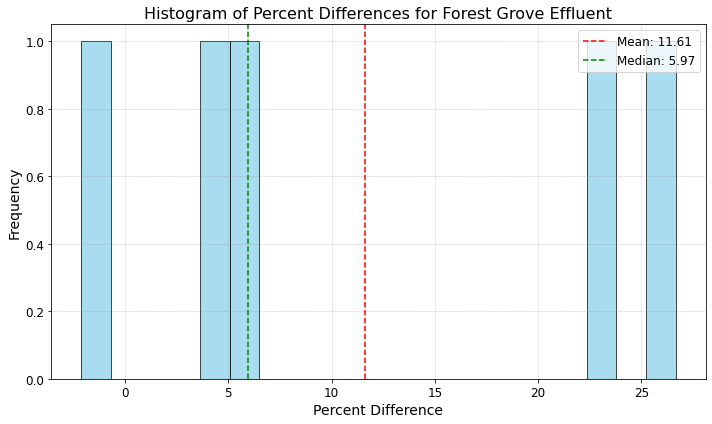

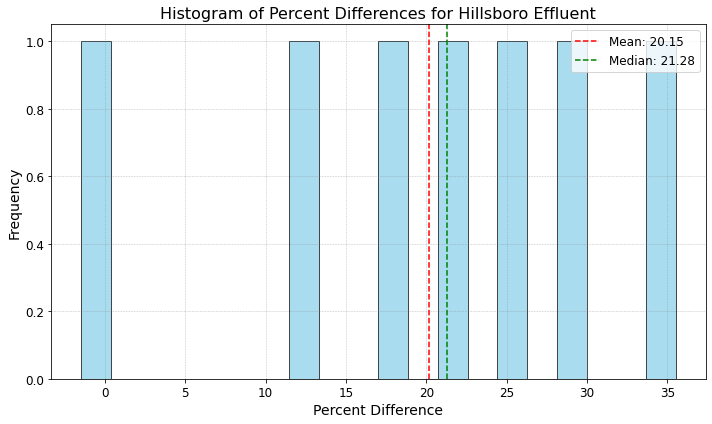

Not enough data for Intel Ronler WATR to generate a histogram.


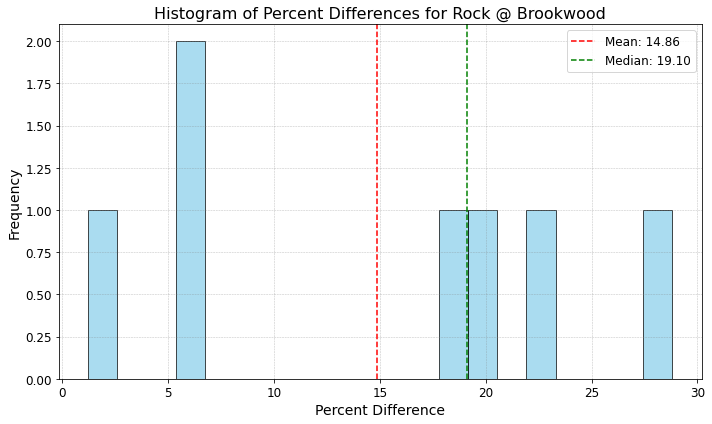

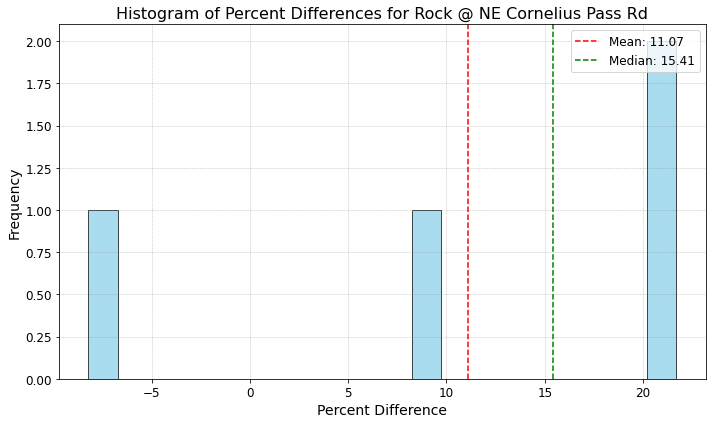

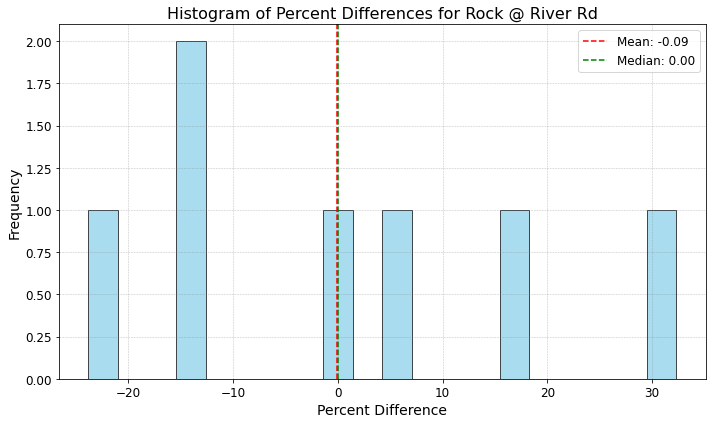

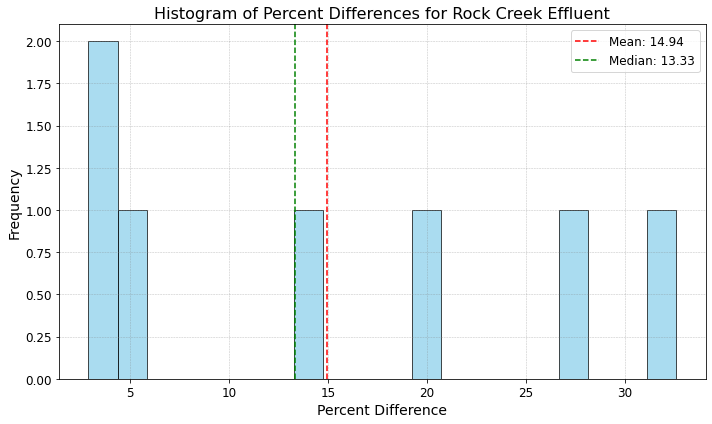

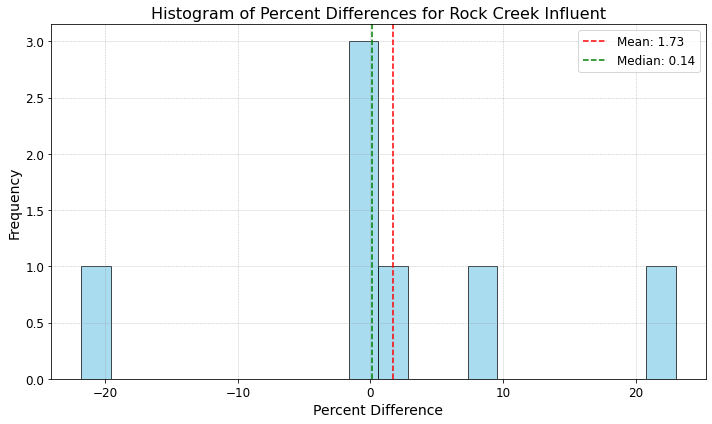

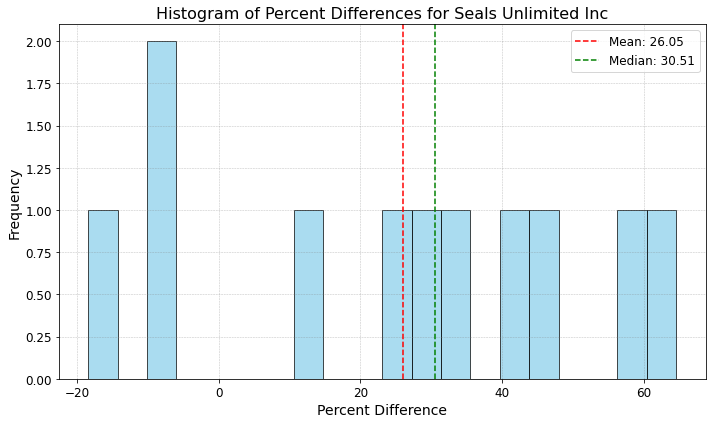

Not enough data for TR @ Boones Ferry to generate a histogram.


In [203]:
# Group the DataFrame by 'PFAS Compound_1633'
groups = quant_df.groupby('Sample Location_InHouse')

for Type, group in groups:
    # Calculate the percent difference for the current group
    group['Percent_Diff_In-House-Eurofins'] = ((group['Quant Only Incl Qual Flags_InHouse'] - group['Quant Only Incl Qual Flags_Eurofins']) / ((group['Quant Only Incl Qual Flags_InHouse'] + group['Quant Only Incl Qual Flags_Eurofins']) / 2)) * 100
    
    # Ensure there are enough data points for a meaningful histogram
    if len(group) > 1:
        plt.figure(figsize=(10, 6))
        n, bins, patches = plt.hist(group['Percent_Diff_In-House-Eurofins'].dropna(), bins=20, color='skyblue', edgecolor='black', alpha=0.7)

        # Formatting the plot
        plt.title(f'Histogram of Percent Differences for {Type}', fontsize=16)
        plt.xlabel('Percent Difference', fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        # Adding vertical lines for mean and median of the percent differences
        mean_val = np.mean(group['Percent_Diff_In-House-Eurofins'])
        median_val = np.median(group['Percent_Diff_In-House-Eurofins'])
        plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
        plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_val:.2f}')

        # Adding a legend
        plt.legend(loc='upper right', fontsize=12)

        plt.tight_layout()
        plt.show()
    else:
        print(f"Not enough data for {Type} to generate a histogram.")

## Kolmogorov-Smirnov test 

In [204]:
#Prepare data
#The test assumes that the samples are independent. Measurements within each method and between methods should not be paired or matched.
#This means we want to compare all quant results for both methods but they don't necessarily need to both be quant detection class.
quant_df_InHouse=subset_df_InHouse[subset_df_InHouse['Detection Class']=='Quant']
quant_df_Eurofins=subset_df_Eurofins[subset_df_Eurofins['Detection Class']=='Quant']

In [205]:
quant_df_InHouse.columns

Index(['Result', 'Analysis', 'Sample Location', 'Type', 'Sample Date',
       'PFAS Compound', 'MDL', 'Detection Class', 'Quant Only Incl Qual Flags',
       'Quant Incl Estimates Incl Qual Flags',
       'All (w BDL= MDL/2) Incl Qual Flags', 'Units', 'ChainLength',
       'Dominant Contributor', 'Sector', 'unique_key'],
      dtype='object')

### All Quant

In [206]:
# Perform the two-sample K-S test
statistic, p_value = ks_2samp(quant_df_InHouse['Quant Only Incl Qual Flags'], quant_df_Eurofins['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")


K-S statistic: 0.6029411764705882
P-value: 0.0


In [207]:
quant_df.head()

,Result_InHouse,Analysis_InHouse,Sample Location_InHouse,Type_InHouse,Sample Date_InHouse,PFAS Compound_InHouse,MDL_InHouse,Detection Class_InHouse,Quant Only Incl Qual Flags_InHouse,Quant Incl Estimates Incl Qual Flags_InHouse,...,Detection Class_Eurofins,Quant Only Incl Qual Flags_Eurofins,Quant Incl Estimates Incl Qual Flags_Eurofins,All (w BDL= MDL/2) Incl Qual Flags_Eurofins,Units_Eurofins,ChainLength_Eurofins,Dominant Contributor_Eurofins,Sector_Eurofins,RPD,Percent_Diff_In-House-Eurofins
3,4.15,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluoropentanoic acid,NaN,Quant,4.15,4.15,...,Quant,4.1,4.1,4.1,ppt_wt_v,5.0,Urban,NaN,0.012121,1.204819
7,3.92,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluorobutanesulfonic acid,NaN,Quant,3.92,3.92,...,Quant,3.2,3.2,3.2,ppt_wt_v,4.0,Urban,NaN,0.202247,18.367347
8,4.37,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluorohexanoic acid,NaN,Quant,4.37,4.37,...,Quant,4.1,4.1,4.1,ppt_wt_v,6.0,Urban,NaN,0.063754,6.178490
12,2.12,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluoroheptanoic acid,NaN,Quant,2.12,2.12,...,Quant,2.0,2.0,2.0,ppt_wt_v,7.0,Urban,NaN,0.058252,5.660377
16,6.55,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluorooctanoic acid (PFOA),NaN,Quant,6.55,6.55,...,Quant,4.9,4.9,4.9,ppt_wt_v,8.0,Urban,NaN,0.288210,25.190840


In [208]:
# Perform the two-sample K-S test
statistic, p_value = ks_2samp(quant_df['Quant Only Incl Qual Flags_InHouse'], quant_df['Quant Only Incl Qual Flags_Eurofins'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")


K-S statistic: 0.13829787234042554
P-value: 0.3311532489409431


### By PFAS Compound

In [209]:
# Identify common PFAS compounds in both dataframes
common_compounds = set(quant_df_InHouse['PFAS Compound']).intersection(set(quant_df_Eurofins['PFAS Compound']))
# Results container
ks_results = []

for compound in common_compounds:
    # Filter each dataframe for the current PFAS compound
    data_1633 = quant_df_InHouse[quant_df_InHouse['PFAS Compound'] == compound]['Quant Only Incl Qual Flags'].dropna()
    data_537 = quant_df_Eurofins[quant_df_Eurofins['PFAS Compound'] == compound]['Quant Only Incl Qual Flags'].dropna()
    
    # Ensure both groups have enough data points
    if len(data_1633) > 1 and len(data_537) > 1:
        # Perform the K-S test
        statistic, p_value = ks_2samp(data_1633, data_537)
        
        # Store the results
        ks_results.append((compound, statistic, p_value))
    else:
        print(f"Not enough data for {compound} to perform K-S test.")

# Optionally, convert the results list to a DataFrame for better visualization
ks_results_df = pd.DataFrame(ks_results, columns=['PFAS Compound', 'K-S Statistic', 'P-Value'])
print(ks_results_df)


Not enough data for Perfluorotetradecanoic acid to perform K-S test.
Not enough data for Perfluorononanesulfonic acid to perform K-S test.
Not enough data for NMeFOSAA to perform K-S test.
Not enough data for NEtFOSAA to perform K-S test.
Not enough data for Perfluorotridecanoic acid to perform K-S test.
Not enough data for 8:2 Fluorotelomersulfonic acid to perform K-S test.
Not enough data for 3:3 FTCA to perform K-S test.
Not enough data for Perfluoroheptanesulfonic acid to perform K-S test.
                          PFAS Compound  K-S Statistic   P-Value
0         Perfluorooctanoic acid (PFOA)       0.423077  0.009917
1                Perfluorobutanoic acid       0.863636  0.000154
2          Perfluorohexanesulfonic acid       0.355556  0.135188
3                Perfluorodecanoic acid       0.857143  0.001445
4              Perfluorododecanoic acid       0.750000  0.400000
5              Perfluoroundecanoic acid       1.000000  0.133333
6                Perfluorononanoic acid       

### By PFAS Class

In [210]:
subset_df_InHouse=subset_df[subset_df['Analysis']=='PFAS']
subset_df_Eurofins=subset_df[subset_df['Analysis']=='PFAS-CL']

In [211]:
# Filter the DataFrame to include only the specified compounds
filtered_df_1633 = subset_df_InHouse[subset_df_InHouse['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)].dropna(subset=['Quant Only Incl Qual Flags'])
filtered_df_537 = subset_df_Eurofins[subset_df_Eurofins['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)].dropna(subset=['Quant Only Incl Qual Flags'])

# Perform the two-sample K-S test
statistic, p_value = ks_2samp(filtered_df_1633['Quant Only Incl Qual Flags'], filtered_df_537['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")

K-S statistic: 0.07162698412698412
P-value: 0.9426512049958633


In [212]:
# Filter the DataFrame to include only the specified compounds
filtered_df_1633 = subset_df_InHouse[subset_df_InHouse['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags'])
filtered_df_537 = subset_df_Eurofins[subset_df_Eurofins['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags'])

# Perform the two-sample K-S test
statistic, p_value = ks_2samp(filtered_df_1633['Quant Only Incl Qual Flags'], filtered_df_537['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")

K-S statistic: 0.17410714285714285
P-value: 4.9422888234507134e-05


In [213]:
# Filter the DataFrame to include only the specified compounds
filtered_df_1633 = subset_df_InHouse[subset_df_InHouse['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags'])
filtered_df_537 = subset_df_Eurofins[subset_df_Eurofins['PFAS Compound'].isin(pfas_compounds_CarboxylicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags'])

# Perform the two-sample K-S test
statistic, p_value = ks_2samp(filtered_df_1633['Quant Only Incl Qual Flags'], filtered_df_537['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")

K-S statistic: 0.25663910505836574
P-value: 3.2743729391215837e-06


In [214]:
# Filter the DataFrame to include only the specified compounds
filtered_df_1633 = subset_df_InHouse[subset_df_InHouse['PFAS Compound'].isin(pfas_compounds_FluorotelomerSulfonicAcid)].dropna(subset=['Quant Only Incl Qual Flags'])
filtered_df_537 = subset_df_Eurofins[subset_df_Eurofins['PFAS Compound'].isin(pfas_compounds_FluorotelomerSulfonicAcid)].dropna(subset=['Quant Only Incl Qual Flags'])

# Perform the two-sample K-S test
statistic, p_value = ks_2samp(filtered_df_1633['Quant Only Incl Qual Flags'], filtered_df_537['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")

K-S statistic: 0.04593445769916358
P-value: 0.9955997252067321


In [215]:
# Filter the DataFrame to include only the specified compounds
filtered_df_1633 = subset_df_InHouse[subset_df_InHouse['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamideEthanol)].dropna(subset=['Quant Only Incl Qual Flags'])
filtered_df_537 = subset_df_Eurofins[subset_df_Eurofins['PFAS Compound'].isin(pfas_compounds_PerfluorooctaneSulfonamideEthanol)].dropna(subset=['Quant Only Incl Qual Flags'])

# Perform the two-sample K-S test
statistic, p_value = ks_2samp(filtered_df_1633['Quant Only Incl Qual Flags'], filtered_df_537['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")

K-S statistic: 0.14102564102564102
P-value: 0.26461695514123984


In [216]:
# Filter the DataFrame to include only the specified compounds
filtered_df_1633 = subset_df_InHouse[subset_df_InHouse['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags'])
filtered_df_537 = subset_df_Eurofins[subset_df_Eurofins['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags'])

# Perform the two-sample K-S test
statistic, p_value = ks_2samp(filtered_df_1633['Quant Only Incl Qual Flags'], filtered_df_537['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")

K-S statistic: 0.1700065274151436
P-value: 0.0003326467221168583


In [217]:
# Filter the DataFrame to include only the specified compounds
filtered_df_1633 = subset_df_InHouse[subset_df_InHouse['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags'])
filtered_df_537 = subset_df_Eurofins[subset_df_Eurofins['PFAS Compound'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags'])

# Perform the two-sample K-S test
statistic, p_value = ks_2samp(filtered_df_1633['Quant Only Incl Qual Flags'], filtered_df_537['Quant Only Incl Qual Flags'])

print(f"K-S statistic: {statistic}")
print(f"P-value: {p_value}")

K-S statistic: 0.1951923076923077
P-value: 0.03932840267341331


### By Type

In [218]:
# Assuming quant_df_1633 and quant_df_537 are your DataFrames filtered by 'Detection Class' == 'Quant'
# Identify common Sample Locations in both dataframes
common_types = set(quant_df_InHouse['Type']).intersection(set(quant_df_Eurofins['Type']))

# Results container
ks_results = []

for Type in common_types:
    # Filter each dataframe for the current Sample Location
    data_1633 = quant_df_InHouse[quant_df_InHouse['Type'] == Type]['Quant Only Incl Qual Flags'].dropna()
    data_537 = quant_df_Eurofins[quant_df_Eurofins['Type'] == Type]['Quant Only Incl Qual Flags'].dropna()
    
    # Ensure both groups have enough data points
    if len(data_1633) > 1 and len(data_537) > 1:
        # Perform the K-S test
        statistic, p_value = ks_2samp(data_1633, data_537)
        
        # Store the results
        ks_results.append((Type, statistic, p_value))
    else:
        print(f"Not enough data for Sample Location '{Type}' to perform K-S test.")

# Optionally, convert the results list to a DataFrame for better visualization
ks_results_df = pd.DataFrame(ks_results, columns=['Type', 'K-S Statistic', 'P-Value'])
print(ks_results_df)

                  Type  K-S Statistic       P-Value
0  Outfall of Industry       0.609260  1.888545e-09
1             Effluent       0.491803  1.078316e-04
2          Urban Creek       0.597826  6.830048e-11
3             Influent       0.468750  1.384045e-02
4              Ambient       0.700000  6.378841e-09


### By Sample Location

In [219]:
# Assuming quant_df_1633 and quant_df_537 are your DataFrames filtered by 'Detection Class' == 'Quant'
# Identify common Sample Locations in both dataframes
common_locations = set(quant_df_InHouse['Sample Location']).intersection(set(quant_df_Eurofins['Sample Location']))

# Results container
ks_results = []

for location in common_locations:
    # Filter each dataframe for the current Sample Location
    data_1633 = quant_df_InHouse[quant_df_InHouse['Sample Location'] == location]['Quant Only Incl Qual Flags'].dropna()
    data_537 = quant_df_Eurofins[quant_df_Eurofins['Sample Location'] == location]['Quant Only Incl Qual Flags'].dropna()
    
    # Ensure both groups have enough data points
    if len(data_1633) > 1 and len(data_537) > 1:
        # Perform the K-S test
        statistic, p_value = ks_2samp(data_1633, data_537)
        
        # Store the results
        ks_results.append((location, statistic, p_value))
    else:
        print(f"Not enough data for Sample Location '{location}' to perform K-S test.")

# Optionally, convert the results list to a DataFrame for better visualization
ks_results_df = pd.DataFrame(ks_results, columns=['Sample Location', 'K-S Statistic', 'P-Value'])
print(ks_results_df)


Not enough data for Sample Location 'TR @ Boones Ferry' to perform K-S test.
Not enough data for Sample Location 'Intel Ronler WATR' to perform K-S test.
                Sample Location  K-S Statistic   P-Value
0               Durham Influent       0.470588  0.163928
1           Rock Creek Influent       0.533333  0.079370
2            Fanno at Durham Rd       0.529412  0.020261
3               Durham Effluent       0.588235  0.023540
4            Hillsboro Effluent       0.428571  0.341305
5          Fanno @ SW Grant Ave       0.684211  0.030915
6               Rock @ River Rd       0.500000  0.176170
7              Rock @ Brookwood       0.333333  0.600143
8           Fanno @ SW 56th Ave       0.705882  0.046115
9         Forest Grove Effluent       0.500000  0.254128
10          Rock Creek Effluent       0.500000  0.126209
11          Seals Unlimited Inc       0.250000  0.719178
12          Fanno @ Durham Park       0.562500  0.059815
13  Rock @ NE Cornelius Pass Rd       0.666667  

## Bar Chart Visualization

### All Quant Pairs by PFAS Compound Separated by PFAS Groups Comparison between Method 1633 and 537.1

In [220]:
quant_df

,Result_InHouse,Analysis_InHouse,Sample Location_InHouse,Type_InHouse,Sample Date_InHouse,PFAS Compound_InHouse,MDL_InHouse,Detection Class_InHouse,Quant Only Incl Qual Flags_InHouse,Quant Incl Estimates Incl Qual Flags_InHouse,...,Detection Class_Eurofins,Quant Only Incl Qual Flags_Eurofins,Quant Incl Estimates Incl Qual Flags_Eurofins,All (w BDL= MDL/2) Incl Qual Flags_Eurofins,Units_Eurofins,ChainLength_Eurofins,Dominant Contributor_Eurofins,Sector_Eurofins,RPD,Percent_Diff_In-House-Eurofins
3,4.15,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluoropentanoic acid,NaN,Quant,4.15,4.15,...,Quant,4.1,4.1,4.1,ppt_wt_v,5.0,Urban,NaN,0.012121,1.204819
7,3.92,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluorobutanesulfonic acid,NaN,Quant,3.92,3.92,...,Quant,3.2,3.2,3.2,ppt_wt_v,4.0,Urban,NaN,0.202247,18.367347
8,4.37,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluorohexanoic acid,NaN,Quant,4.37,4.37,...,Quant,4.1,4.1,4.1,ppt_wt_v,6.0,Urban,NaN,0.063754,6.178490
12,2.12,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluoroheptanoic acid,NaN,Quant,2.12,2.12,...,Quant,2.0,2.0,2.0,ppt_wt_v,7.0,Urban,NaN,0.058252,5.660377
16,6.55,PFAS,Rock @ Brookwood,Ambient,2024-02-21,Perfluorooctanoic acid (PFOA),NaN,Quant,6.55,6.55,...,Quant,4.9,4.9,4.9,ppt_wt_v,8.0,Urban,NaN,0.288210,25.190840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,34,PFAS,Seals Unlimited Inc,Outfall of Industry,2024-03-12,Perfluorononanoic acid,NaN,Quant,34.00,34.00,...,Quant,25.0,25.0,25.0,ppt_wt_v,9.0,NaN,Rubber Manufacture,0.305085,26.470588
2362,13.9,PFAS,Seals Unlimited Inc,Outfall of Industry,2024-03-12,8:2 Fluorotelomersulfonic acid,NaN,Quant,13.90,13.90,...,Quant,15.0,15.0,15.0,ppt_wt_v,10.0,NaN,Rubber Manufacture,-0.076125,-7.913669
2363,56.7,PFAS,Seals Unlimited Inc,Outfall of Industry,2024-03-12,Perfluorodecanoic acid,NaN,Quant,56.70,56.70,...,Quant,50.0,50.0,50.0,ppt_wt_v,10.0,NaN,Rubber Manufacture,0.125586,11.816578
2367,4.14,PFAS,Seals Unlimited Inc,Outfall of Industry,2024-03-12,Perfluoroundecanoic acid,NaN,Quant,4.14,4.14,...,Quant,4.4,4.4,4.4,ppt_wt_v,11.0,NaN,Rubber Manufacture,-0.060890,-6.280193


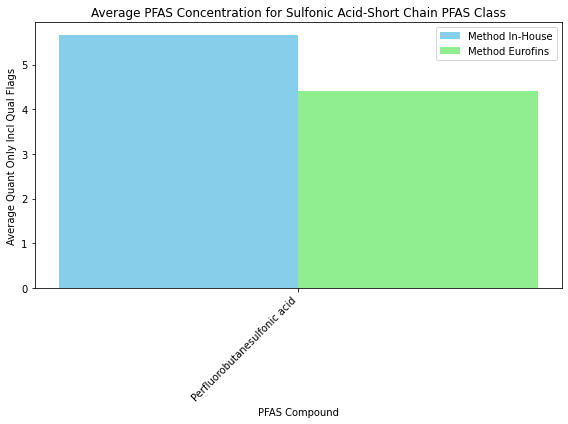

In [221]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the mean for each PFAS Compound
average_df = filtered_df.groupby('PFAS Compound_InHouse').agg({
    'Quant Only Incl Qual Flags_InHouse': 'mean',
    'Quant Only Incl Qual Flags_Eurofins': 'mean'
}).reset_index()

# Set the positions and width for the bars
positions = np.arange(len(average_df['PFAS Compound_InHouse']))
width = 0.35  # the width of the bars

# Create the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot bars for each method
bars_1633 = ax.bar(positions - width/2, average_df['Quant Only Incl Qual Flags_InHouse'], width, label='Method In-House', color='skyblue')
bars_5371 = ax.bar(positions + width/2, average_df['Quant Only Incl Qual Flags_Eurofins'], width, label='Method Eurofins', color='lightgreen')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('PFAS Compound')
ax.set_ylabel('Average Quant Only Incl Qual Flags')
ax.set_title('Average PFAS Concentration for Sulfonic Acid-Short Chain PFAS Class')
ax.set_xticks(positions)
ax.set_xticklabels(average_df['PFAS Compound_InHouse'], rotation=45, ha="right")
ax.legend()

fig.tight_layout()

plt.show()

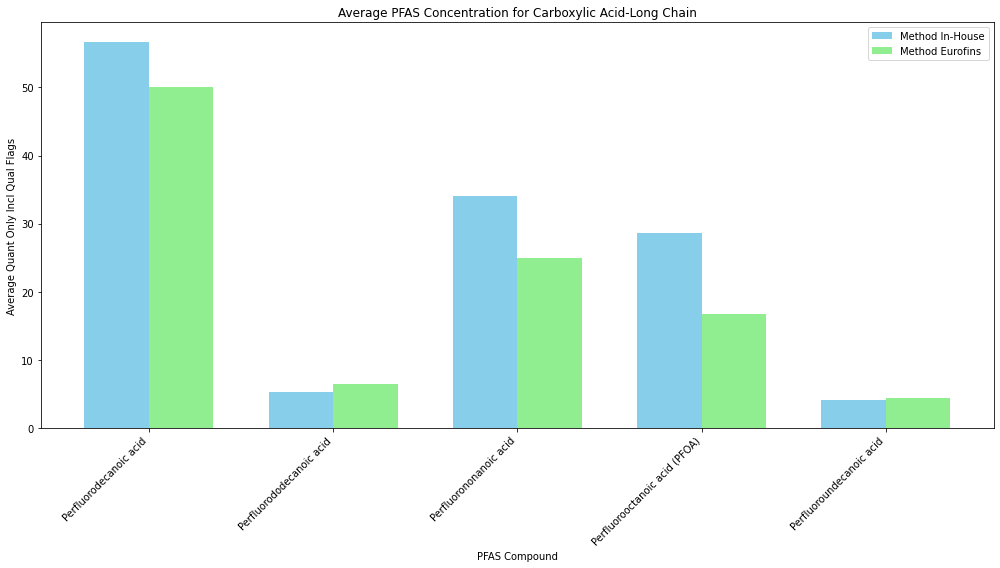

In [223]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the mean for each PFAS Compound
average_df = filtered_df.groupby('PFAS Compound_InHouse').agg({
    'Quant Only Incl Qual Flags_InHouse': 'mean',
    'Quant Only Incl Qual Flags_Eurofins': 'mean'
}).reset_index()

# Set the positions and width for the bars
positions = np.arange(len(average_df['PFAS Compound_InHouse']))
width = 0.35  # the width of the bars

# Create the plot
fig, ax = plt.subplots(figsize=(14, 8))

# Plot bars for each method
bars_1633 = ax.bar(positions - width/2, average_df['Quant Only Incl Qual Flags_InHouse'], width, label='Method In-House', color='skyblue')
bars_5371 = ax.bar(positions + width/2, average_df['Quant Only Incl Qual Flags_Eurofins'], width, label='Method Eurofins', color='lightgreen')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('PFAS Compound')
ax.set_ylabel('Average Quant Only Incl Qual Flags')
ax.set_title('Average PFAS Concentration for Carboxylic Acid-Long Chain')
ax.set_xticks(positions)
ax.set_xticklabels(average_df['PFAS Compound_InHouse'], rotation=45, ha="right")
ax.legend()

fig.tight_layout()

plt.show()

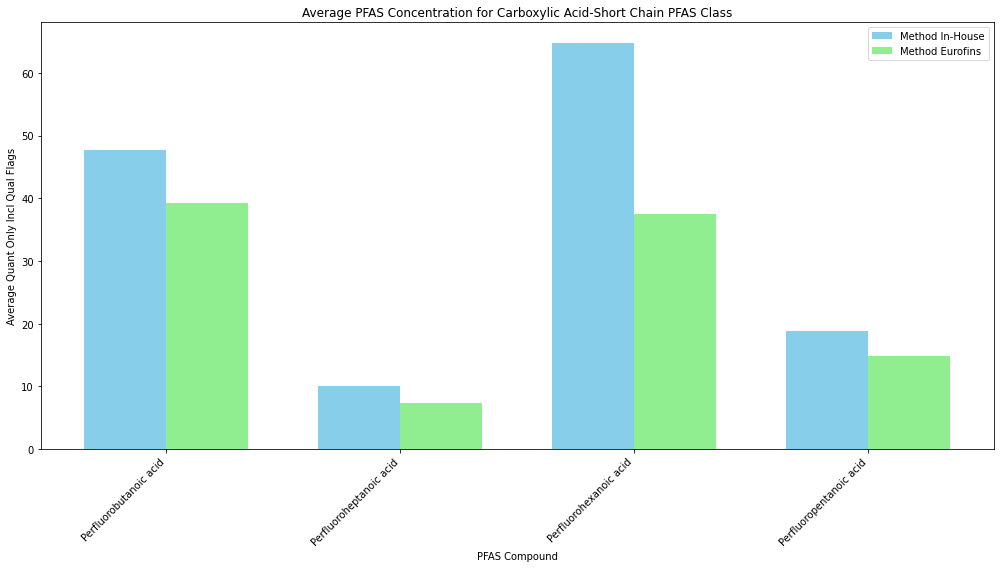

In [224]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_CarboxylicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the mean for each PFAS Compound
average_df = filtered_df.groupby('PFAS Compound_InHouse').agg({
    'Quant Only Incl Qual Flags_InHouse': 'mean',
    'Quant Only Incl Qual Flags_Eurofins': 'mean'
}).reset_index()

# Set the positions and width for the bars
positions = np.arange(len(average_df['PFAS Compound_InHouse']))
width = 0.35  # the width of the bars

# Create the plot
fig, ax = plt.subplots(figsize=(14, 8))

# Plot bars for each method
bars_1633 = ax.bar(positions - width/2, average_df['Quant Only Incl Qual Flags_InHouse'], width, label='Method In-House', color='skyblue')
bars_5371 = ax.bar(positions + width/2, average_df['Quant Only Incl Qual Flags_Eurofins'], width, label='Method Eurofins', color='lightgreen')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('PFAS Compound')
ax.set_ylabel('Average Quant Only Incl Qual Flags')
ax.set_title('Average PFAS Concentration for Carboxylic Acid-Short Chain PFAS Class')
ax.set_xticks(positions)
ax.set_xticklabels(average_df['PFAS Compound_InHouse'], rotation=45, ha="right")
ax.legend()

fig.tight_layout()

plt.show()

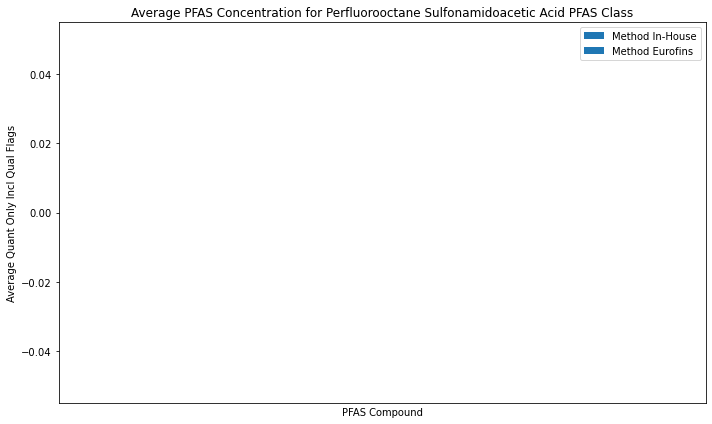

In [226]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_PerfluorooctaneSulfonamidoaceticAcid)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the mean for each PFAS Compound
average_df = filtered_df.groupby('PFAS Compound_InHouse').agg({
    'Quant Only Incl Qual Flags_InHouse': 'mean',
    'Quant Only Incl Qual Flags_Eurofins': 'mean'
}).reset_index()

# Set the positions and width for the bars
positions = np.arange(len(average_df['PFAS Compound_InHouse']))
width = 0.35  # the width of the bars

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot bars for each method
bars_1633 = ax.bar(positions - width/2, average_df['Quant Only Incl Qual Flags_InHouse'], width, label='Method In-House', color='skyblue')
bars_5371 = ax.bar(positions + width/2, average_df['Quant Only Incl Qual Flags_Eurofins'], width, label='Method Eurofins', color='lightgreen')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('PFAS Compound')
ax.set_ylabel('Average Quant Only Incl Qual Flags')
ax.set_title('Average PFAS Concentration for Perfluorooctane Sulfonamidoacetic Acid PFAS Class')
ax.set_xticks(positions)
ax.set_xticklabels(average_df['PFAS Compound_InHouse'], rotation=45, ha="right")
ax.legend()

fig.tight_layout()

plt.show()

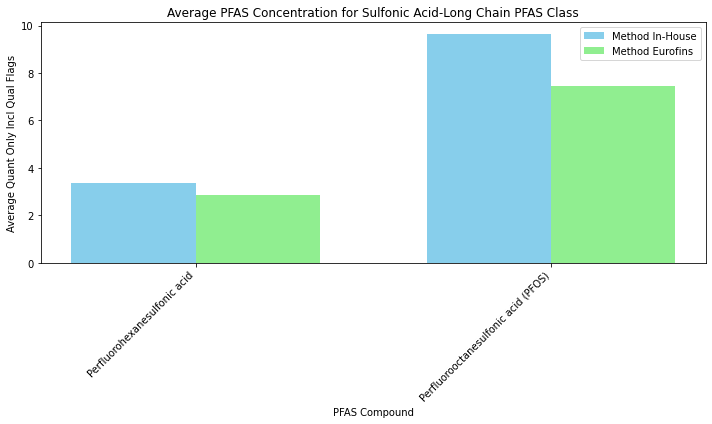

In [227]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_InHouse'].isin(pfas_compounds_SulfonicAcid_Long)].dropna(subset=['Quant Only Incl Qual Flags_InHouse', 'Quant Only Incl Qual Flags_Eurofins'])

# Calculate the mean for each PFAS Compound
average_df = filtered_df.groupby('PFAS Compound_InHouse').agg({
    'Quant Only Incl Qual Flags_InHouse': 'mean',
    'Quant Only Incl Qual Flags_Eurofins': 'mean'
}).reset_index()

# Set the positions and width for the bars
positions = np.arange(len(average_df['PFAS Compound_InHouse']))
width = 0.35  # the width of the bars

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot bars for each method
bars_1633 = ax.bar(positions - width/2, average_df['Quant Only Incl Qual Flags_InHouse'], width, label='Method In-House', color='skyblue')
bars_5371 = ax.bar(positions + width/2, average_df['Quant Only Incl Qual Flags_Eurofins'], width, label='Method Eurofins', color='lightgreen')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('PFAS Compound')
ax.set_ylabel('Average Quant Only Incl Qual Flags')
ax.set_title('Average PFAS Concentration for Sulfonic Acid-Long Chain PFAS Class')
ax.set_xticks(positions)
ax.set_xticklabels(average_df['PFAS Compound_InHouse'], rotation=45, ha="right")
ax.legend()

fig.tight_layout()

plt.show()

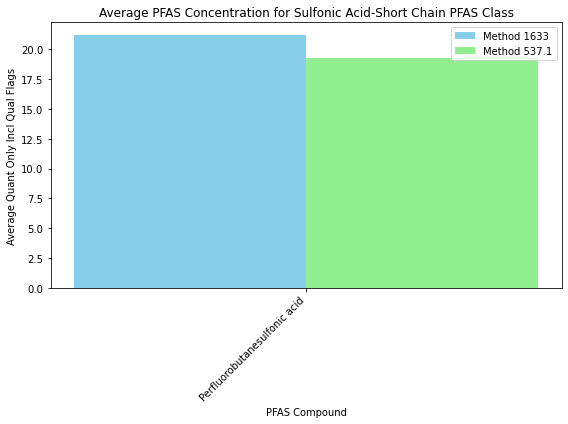

In [ ]:
# Filter the DataFrame to include only the specified compounds
filtered_df = quant_df[quant_df['PFAS Compound_1633'].isin(pfas_compounds_SulfonicAcid_Short)].dropna(subset=['Quant Only Incl Qual Flags_1633', 'Quant Only Incl Qual Flags_5371'])

# Calculate the mean for each PFAS Compound
average_df = filtered_df.groupby('PFAS Compound_1633').agg({
    'Quant Only Incl Qual Flags_1633': 'mean',
    'Quant Only Incl Qual Flags_5371': 'mean'
}).reset_index()

# Set the positions and width for the bars
positions = np.arange(len(average_df['PFAS Compound_1633']))
width = 0.35  # the width of the bars

# Create the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot bars for each method
bars_1633 = ax.bar(positions - width/2, average_df['Quant Only Incl Qual Flags_1633'], width, label='Method 1633', color='skyblue')
bars_5371 = ax.bar(positions + width/2, average_df['Quant Only Incl Qual Flags_5371'], width, label='Method 537.1', color='lightgreen')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('PFAS Compound')
ax.set_ylabel('Average Quant Only Incl Qual Flags')
ax.set_title('Average PFAS Concentration for Sulfonic Acid-Short Chain PFAS Class')
ax.set_xticks(positions)
ax.set_xticklabels(average_df['PFAS Compound_1633'], rotation=45, ha="right")
ax.legend()

fig.tight_layout()

plt.show()

## Stacked Bar Comparison

#### Prepare Data (Paired by location, date and compound but by quality)

In [247]:
#Remove Blanks
# Assuming 'df' is your DataFrame
subset_df_InHouse = subset_df_InHouse[subset_df_InHouse['Sample Location'] != 'Blank']
subset_df_Eurofins = subset_df_Eurofins[subset_df_Eurofins['Sample Location'] != 'Blank']
# Filter df1 to only include rows where the 'unique_key' exists in df2
subset_df_InHouse_filtered = subset_df_InHouse[subset_df_InHouse['unique_key'].isin(subset_df_Eurofins['unique_key'])]

# Filter df2 to only include rows where the 'unique_key' exists in df1
subset_df_Eurofins_filtered = subset_df_Eurofins[subset_df_Eurofins['unique_key'].isin(subset_df_InHouse['unique_key'])]
concat_df=pd.concat([subset_df_InHouse_filtered,subset_df_Eurofins_filtered], ignore_index=True).sort_values(by= 'unique_key')



In [248]:
concat_df=concat_df[concat_df['Batch']!='PFAS00008']

In [249]:
unique_key_counts = concat_df['unique_key'].value_counts()
print(unique_key_counts)

International Paper_Outfall of Industry_2024-03-13_Perfluorohexanoic acid          3
Beaverton @ Cornelius_Ambient_2024-04-17_11Cl-PF3OUdS                              2
Rock Creek Effluent_Effluent_2024-03-12_Perfluorooctanesulfonic acid (PFOS)        2
Rock Creek Influent_Influent_2024-03-12_6:2 Fluorotelomersulfonic acid             2
Rock Creek Influent_Influent_2024-03-12_5:3 FTCA                                   2
                                                                                  ..
Hillsboro Landfill_Outfall of Industry_2024-03-12_Perfluorodecanoic acid           1
Hillsboro Landfill_Outfall of Industry_2024-03-12_Perfluorobutanoic acid           1
Hillsboro Landfill_Outfall of Industry_2024-03-12_Perfluorobutanesulfonic acid     1
Hillsboro Landfill_Outfall of Industry_2024-03-12_NEtFOSAA                         1
Hillsboro Landfill_Outfall of Industry_2024-03-12_Perfluoropentanesulfonic acid    1
Name: unique_key, Length: 1809, dtype: int64


In [250]:
# Filter to find unique_keys with counts more than 2
keys_more_than_two = unique_key_counts[unique_key_counts > 2]

# Print the results
print(keys_more_than_two)


International Paper_Outfall of Industry_2024-03-13_Perfluorohexanoic acid    3
Name: unique_key, dtype: int64


In [251]:
#dfs: A dictionary where keys are the tab names and values are the DataFrames to write.
dfs = {'PairsCounts': unique_key_counts,
       'concat_df': concat_df
       }

#filename: The name of the Excel file to write to.
filename= 'PairedCounts.xlsx'
dfs_to_excel(dfs, filename)

File 'PairedCounts.xlsx' has been written with 2 tabs.


In [252]:
# Convert the Series to a DataFrame
unique_key_counts = unique_key_counts.to_frame(name='Count')
unique_key_counts


,Count
International Paper_Outfall of Industry_2024-03-13_Perfluorohexanoic acid,3
Beaverton @ Cornelius_Ambient_2024-04-17_11Cl-PF3OUdS,2
Rock Creek Effluent_Effluent_2024-03-12_Perfluorooctanesulfonic acid (PFOS),2
Rock Creek Influent_Influent_2024-03-12_6:2 Fluorotelomersulfonic acid,2
Rock Creek Influent_Influent_2024-03-12_5:3 FTCA,2
...,...
Hillsboro Landfill_Outfall of Industry_2024-03-12_Perfluorodecanoic acid,1
Hillsboro Landfill_Outfall of Industry_2024-03-12_Perfluorobutanoic acid,1
Hillsboro Landfill_Outfall of Industry_2024-03-12_Perfluorobutanesulfonic acid,1
Hillsboro Landfill_Outfall of Industry_2024-03-12_NEtFOSAA,1


In [253]:
# Filter the DataFrame for counts of 2 or 3
filtered_df = unique_key_counts[unique_key_counts['Count'].isin([2, 3])]

# Get the index values (which are now in a column after reset_index)
indices_to_use = filtered_df.index.tolist()

# Use these index values to filter concat_df
filtered_concat_df = concat_df[concat_df['unique_key'].isin(indices_to_use)]

#### Functions

In [289]:
def PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(data_df, filter_qual_summary=None, filter_pfas_compound=None, filter_Analysis = None,
                              filter_sample_location=None, start_date=None, end_date=None,col_name= 'Quant Incl Estimates Incl Qual Flags'):
    """
    Create a custom pivot table with filters based on 'Qual Summary (Grade for filtering)', 'PFAS Compound',
    'Sample Location', and a date range for 'Sample Date'.

    Args:
        data_df (pd.DataFrame): The DataFrame containing the data.
        filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
        filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
        filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
        start_date (str, optional): Start date for the date range filter (default is None).
        end_date (str, optional): End date for the date range filter (default is None).

    Returns:
        pd.DataFrame: The custom pivot table.
    """
    try:
        # Apply filters based on 'Qual Summary (Grade for filtering)'
        filtered_data = data_df
        if filter_qual_summary:
            filtered_data = filtered_data[filtered_data['Qual Summary (Grade for filtering)'].isin(filter_qual_summary)]

        # Apply filters based on 'PFAS Compound'
        if len(filter_pfas_compound) > 0:
            filtered_data = filtered_data[filtered_data['PFAS Compound'].isin(filter_pfas_compound)]

        # Apply filters based on 'Sample Location'
        if len(filter_sample_location) >0:
            filtered_data = filtered_data[filtered_data['Sample Location'].isin(filter_sample_location)]
    
        # Apply filters based on 'Analysis'
        if len(filter_Analysis) >0:
            filtered_data = filtered_data[filtered_data['Analysis'].isin(filter_Analysis)]

        # Apply date range filter based on 'Sample Date'
        if start_date and end_date:
            filtered_data = filtered_data[(filtered_data['Sample Date'] >= start_date) & (filtered_data['Sample Date'] <= end_date)]

        # Create a pivot table with 'Sample Location' as rows, 'PFAS Compound' as columns, and average of 'Quant Incl Estimates Incl Qual Flags' as values
        pivot_table = pd.pivot_table(filtered_data, values=col_name,
                                     index='Sample Location', columns='PFAS Compound', aggfunc='mean', fill_value=0)

        return pivot_table

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [290]:
def PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation_Type(data_df, filter_qual_summary=None, filter_pfas_compound=None, filter_Analysis = None,
                              filter_sample_location=None, start_date=None, end_date=None,col_name= 'Quant Incl Estimates Incl Qual Flags'):
    """
    Create a custom pivot table with filters based on 'Qual Summary (Grade for filtering)', 'PFAS Compound',
    'Sample Location', and a date range for 'Sample Date'.

    Args:
        data_df (pd.DataFrame): The DataFrame containing the data.
        filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
        filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
        filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
        start_date (str, optional): Start date for the date range filter (default is None).
        end_date (str, optional): End date for the date range filter (default is None).

    Returns:
        pd.DataFrame: The custom pivot table.
    """
    try:
        # Apply filters based on 'Qual Summary (Grade for filtering)'
        filtered_data = data_df
        if filter_qual_summary:
            filtered_data = filtered_data[filtered_data['Qual Summary (Grade for filtering)'].isin(filter_qual_summary)]

        # Apply filters based on 'PFAS Compound'
        if len(filter_pfas_compound) > 0:
            filtered_data = filtered_data[filtered_data['PFAS Compound'].isin(filter_pfas_compound)]

        # Apply filters based on 'Sample Location'
        if len(filter_sample_location) >0:
            filtered_data = filtered_data[filtered_data['Sample Location'].isin(filter_sample_location)]
    
        # Apply filters based on 'Analysis'
        if len(filter_Analysis) >0:
            filtered_data = filtered_data[filtered_data['Analysis'].isin(filter_Analysis)]

        # Apply date range filter based on 'Sample Date'
        if start_date and end_date:
            filtered_data = filtered_data[(filtered_data['Sample Date'] >= start_date) & (filtered_data['Sample Date'] <= end_date)]

        # Create a pivot table with 'Sample Location' as rows, 'PFAS Compound' as columns, and average of 'Quant Incl Estimates Incl Qual Flags' as values
        pivot_table = pd.pivot_table(filtered_data, values=col_name,
                                     index='Type', columns='PFAS Compound', aggfunc='mean', fill_value=0)

        return pivot_table

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [291]:
def create_seasonal_stacked_bar_chart(season_1_data, season_2_data, figsize=(12, 8), title='Seasonal PFAS Concentrations by Sample Location', compound_colors_dict=None,
                                      title_fontsize=20, axis_label_fontsize=16, tick_label_fontsize=14, legend_fontsize=12, bar_width=0.35, anchor=-.8):
    try:
        font_bold = FontProperties(family='Arial', weight='bold')
        
        # Prepare figure and axes
        fig, ax = plt.subplots(figsize=figsize)
        locations = season_1_data.index.intersection(season_2_data.index)
        
        # Position indices for the bars, now adjusted to include a gap
        x_indices = np.arange(len(locations)) 
        
        gap = 0.025  # This is the gap between bars
        adjusted_width = bar_width / 2 - gap / 2  # Adjust bar width to accommodate gap
        
        dry_bottom = {loc: 0 for loc in locations}
        wet_bottom = {loc: 0 for loc in locations}

        for compound in compound_colors_dict.keys():  # Ensures order is based on the color dictionary
            color = compound_colors_dict[compound]
            dry_heights = [season_1_data.at[loc, compound] if compound in season_1_data.columns else 0 for loc in locations]
            wet_heights = [season_2_data.at[loc, compound] if compound in season_2_data.columns else 0 for loc in locations]

            # Plot dry season data with adjusted positions
            ax.bar(x_indices - adjusted_width - gap, dry_heights, width=adjusted_width, bottom=[dry_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            dry_bottom = {loc: dry_bottom[loc] + height for loc, height in zip(locations, dry_heights)}

            # Plot wet season data with adjusted positions
            ax.bar(x_indices + gap, wet_heights, width=adjusted_width, bottom=[wet_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            wet_bottom = {loc: wet_bottom[loc] + height for loc, height in zip(locations, wet_heights)}

        # Calculate maximum stack height
        max_stack_height = max(max(dry_bottom.values()), max(wet_bottom.values()))
        # Set y-axis limits
        ax.set_ylim(0, max_stack_height * 1.10)

        # Split label function
        def split_label(label):
            if len(label) > 8:
                split_point = label.find(' ', 8)  # Find next space after 14th character
                if split_point != -1:
                    return label[:split_point] + '\n' + label[split_point + 1:]
            return label  # Return label unmodified if it's short enough or no space found

        # Modify the x-tick labels
        split_xtick_labels = [split_label(label) for label in locations]

        ax.set_xticks(x_indices)
        ax.set_xticklabels(split_xtick_labels, rotation=45, ha='right', fontsize=tick_label_fontsize)
        ax.set_xlabel('Sample Location', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_ylabel('PFAS Concentration (ng/L)', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_title(title, fontsize=title_fontsize, fontproperties=font_bold)
        
        # Generate legend only for compounds actually plotted and arrange it below the plot
        handles, labels = ax.get_legend_handles_labels()
        filtered_handles = []
        filtered_labels = []
        seen_labels = set()

        for handle, label in zip(handles, labels):
            if (label in season_1_data.columns and season_1_data[label].sum() > 0) or (label in season_2_data.columns and season_2_data[label].sum() > 0):
                if label not in seen_labels:
                    filtered_handles.append(handle)
                    filtered_labels.append(label)
                    seen_labels.add(label)

        ax.legend(filtered_handles, filtered_labels, title='PFAS Compounds', loc='lower center', bbox_to_anchor=(0.5, anchor), ncol=7, fontsize=legend_fontsize, title_fontsize=legend_fontsize+2)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {e}")

### Set Settings and Filters

In [257]:
# All Ambient Locations

# Specify filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
# (Eg. 'Good', 'Questionable', etc)
filter_qual_summary=['Good - unreportable', 'Good', "Good - Don't use - Re-extract",'Probably ok', 'probably ok', 'Questionable','Probably ok - unreportable']

filter_Analysis_InHouse = ['PFAS']
filter_Analysis_Eurofins = ['PFAS-CL']

#Specify filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
filter_pfas_compound= filtered_concat_df['PFAS Compound'].unique()


#Specify filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
filter_sample_location= ['Beaverton @ Cornelius', 'Chicken @ Sholls-Sherwood',
       'Dairy @ Hwy 8', 'Dawson @ Brookwood', 'Durham Effluent',
       'Durham Influent', 'Fanno @ Bohmann', 'Fanno @ Durham Park',
       'Fanno @ SW 56th Ave', 'Fanno @ SW Bonita Rd',
       'Fanno @ SW Grant Ave', 'Fanno @ SW North Dakota St',
       'Fanno at Durham Rd', 'Forest Grove Effluent',
       'Forest Grove Influent', 'Gales @ Stringtown',
       'Hillsboro Effluent', 'Hillsboro Influent', 'Intel Aloha F15',
       'Intel Ronler PAWN', 'Intel Ronler WATR', 'International Paper',
       'JAE Oregon Inc', 'Jireh Semiconductor Inc',
       'Leupold & Stevens Inc', 'Maxim (Analog)', 'McKay @ Padgett',
       'Prudential Cleanroom', 'Quantum Global', 'Rock @ Brookwood',
       'Rock @ East Main St', 'Rock @ NE Cornelius Pass Rd',
       'Rock @ NW Old Cornelius Pass Rd', 'Rock @ River Rd',
       'Rock Creek Effluent', 'Rock Creek Influent',
       'Scoggins Below Hagg', 'Seals Unlimited Inc', 'TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill', 'TR @ Golf Course',
       'TR @ Jurgens', 'Thomas Dairy Control Site Well',
       'Thomas Dairy Site 1 Well', 'Thomas Dairy Site 2 Well',
       'Thomas Dairy Site 3 Well']

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

# Specify start_date (str, optional): Start date for the date range filter (default is None).
start_date='2019-01-01'

#Specify end_date (str, optional): End date for the date range filter (default is None).
end_date='2024-07-29'

col_name= 'Quant Incl Estimates Incl Qual Flags'

In [258]:
filter_sample_location_Ambient = ['Rock @ Brookwood', 'Fanno at Durham Rd', 'Scoggins Below Hagg',
       'Dairy @ Hwy 8', 'TR @ Boones Ferry', 'TR @ Fernhill',
       'TR @ Cherry Grove', 'Rock @ River Rd',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Fanno @ Durham Park', 'Fanno @ SW Grant Ave',
       'Fanno @ SW 56th Ave', 'Rock Creek Effluent',
       'Forest Grove Effluent', 'Hillsboro Effluent', 'Blank',
       'Intel Aloha F15']
filter_sample_location_Tualatin = ['TR @ Cherry Grove','TR @ Fernhill','TR @ Golf Course','TR @ Jurgens']
filter_sample_location_Fanno=['Fanno @ SW 56th Ave','Fanno @ Bohmann','Fanno @ SW North Dakota St','Fanno @ SW Grant Ave','Fanno @ SW Bonita Rd','Fanno at Durham Rd','Fanno @ Durham Park','Fanno @ Durham Park']
filter_sample_location_Rock=['Rock @ NW Old Cornelius Pass Rd','Rock @ NE Cornelius Pass Rd','Rock @ East Main St','Beaverton @ Cornelius','Dawson @ Brookwood','Rock @ Brookwood','Rock @ River Rd']
filter_sample_location_Tributaries = [ 'Scoggins Below Hagg','Dairy @ Hwy 8','Rock Creek Effluent','Rock @ Brookwood','Fanno @ Durham Park']
filter_sample_location_LowerTributaries=['Rock Creek Effluent','Rock @ Brookwood','Chicken @ Sholls-Sherwood','Durham Effluent','Fanno at Durham Rd']
filter_sample_location_UpperTributaries= ['Scoggins Below Hagg','Gales @ Stringtown','Dairy @ Hwy 8','McKay @ Padgett']
filter_sample_location_Influent_Effluent=['Durham Influent','Durham Effluent','Hillsboro Influent','Hillsboro Effluent','Forest Grove Influent','Forest Grove Effluent','Rock Creek Influent','Rock Creek Effluent']
filter_sample_location_Industries = ['Intel Aloha F15','Intel Ronler PAWN', 'Intel Ronler WATR', 'International Paper','JAE Oregon Inc', 'Jireh Semiconductor Inc','Leupold & Stevens Inc', 'Maxim (Analog)', 
                                     'Prudential Cleanroom', 'Quantum Global', 'Seals Unlimited Inc']
filter_sample_location_ThomasDairy=['Thomas Dairy Control Site Well','Thomas Dairy Site 1 Well', 'Thomas Dairy Site 2 Well','Thomas Dairy Site 3 Well']

filter_sample_location = filter_sample_location_Tualatin

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()



### Ambient

In [259]:
filter_sample_location = filter_sample_location_Tualatin

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [260]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(filtered_concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.loc[['TR @ Cherry Grove','TR @ Fernhill','TR @ Golf Course','TR @ Jurgens']]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
TR @ Cherry Grove,0,0,0,0.000,0.00,0.00,0.000,0.000,0.000,0,...,0,0.000,0,0,1.680,0,0,0,0,0
TR @ Fernhill,0,0,0,0.000,0.00,0.00,0.000,0.000,0.000,0,...,0,0.032,0,0,2.310,0,0,0,0,0
TR @ Golf Course,0,0,0,0.038,0.00,0.00,0.000,0.062,0.027,0,...,0,0.000,0,0,0.646,0,0,0,0,0
TR @ Jurgens,0,0,0,2.320,2.09,1.66,0.475,2.080,0.262,0,...,0,0.000,0,0,0.911,0,0,0,0,0


In [261]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
Eurofins_df = Eurofins_df.loc[['TR @ Cherry Grove','TR @ Fernhill','TR @ Golf Course','TR @ Jurgens']]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
TR @ Cherry Grove,0,0,0,0,0.0,0.0,0.00,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0
TR @ Fernhill,0,0,0,0,0.0,0.0,0.00,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0
TR @ Golf Course,0,0,0,0,0.0,0.0,0.00,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0
TR @ Jurgens,0,0,0,2,1.7,1.8,0.66,1.7,0,0,...,0,0,0,0,0,0,0,0,0,0


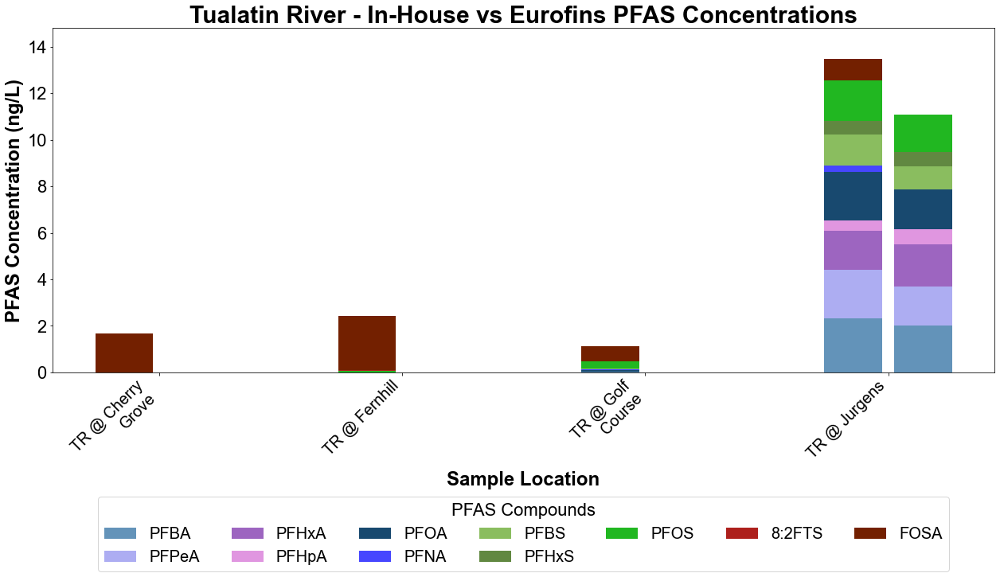

In [262]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,12), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=20, bar_width=0.5,
                                   title='Tualatin River - In-House vs Eurofins PFAS Concentrations',anchor=-.6)

### Fanno Creek

In [294]:
filter_sample_location = filter_sample_location_Fanno

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [295]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(filtered_concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.loc[['Fanno @ SW 56th Ave','Fanno @ Bohmann','Fanno @ SW North Dakota St','Fanno @ SW Grant Ave','Fanno @ SW Bonita Rd','Fanno at Durham Rd','Fanno @ Durham Park','Fanno @ Durham Park']]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Fanno @ SW 56th Ave,0,0,0,1.89,3.14,3.36,1.42,5.83,0.440,0.114,...,0,0,0,0,4.360,0.000,0,0,0,0
Fanno @ Bohmann,0,0,0,3.15,5.72,4.90,2.43,8.67,0.744,0.402,...,0,0,0,0,0.668,0.000,0,0,0,0
Fanno @ SW North Dakota St,0,0,0,4.09,7.01,5.73,2.74,10.40,1.200,0.823,...,0,0,0,0,0.852,0.059,0,0,0,0
Fanno @ SW Grant Ave,0,0,0,3.32,6.67,9.18,2.46,8.13,0.835,0.448,...,0,0,0,0,2.050,0.000,0,0,0,0
Fanno @ SW Bonita Rd,0,0,0,4.19,6.93,5.73,3.00,10.30,1.240,0.652,...,0,0,0,0,0.619,0.000,0,0,0,0


In [296]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
Eurofins_df = Eurofins_df.loc[['Fanno @ SW 56th Ave','Fanno @ Bohmann','Fanno @ SW North Dakota St','Fanno @ SW Grant Ave','Fanno @ SW Bonita Rd','Fanno at Durham Rd','Fanno @ Durham Park','Fanno @ Durham Park']]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Fanno @ SW 56th Ave,0,0,0,2.5,2.7,2.9,1.3,0.87,0.59,0.00,...,0,0,0,0,0,0,0,0,0,0
Fanno @ Bohmann,0,0,0,2.7,4.4,4.3,1.9,6.30,0.87,0.59,...,0,0,0,0,0,0,0,0,0,0
Fanno @ SW North Dakota St,0,0,0,3.7,5.1,5.0,2.1,7.40,1.10,0.94,...,0,0,0,0,0,0,0,0,0,0
Fanno @ SW Grant Ave,0,0,0,3.4,3.7,5.0,2.0,6.70,0.76,0.77,...,0,0,0,0,0,0,0,0,0,0
Fanno @ SW Bonita Rd,0,0,0,3.7,5.3,4.4,2.4,6.80,1.00,0.69,...,0,0,0,0,0,0,0,0,0,0


In [292]:
def create_seasonal_stacked_bar_chart(season_1_data, season_2_data, figsize=(12, 8), title='Seasonal PFAS Concentrations by Sample Location', compound_colors_dict=None,
                                      title_fontsize=20, axis_label_fontsize=16, tick_label_fontsize=14, legend_fontsize=12, bar_width=0.35, anchor=-.8):
    try:
        font_bold = FontProperties(family='Arial', weight='bold')
        
        # Prepare figure and axes
        fig, ax = plt.subplots(figsize=figsize)
        locations = season_1_data.index.intersection(season_2_data.index)
        
        # Position indices for the bars, now adjusted to include a gap
        x_indices = np.arange(len(locations)) 
        
        gap = 0.025  # This is the gap between bars
        adjusted_width = bar_width / 2 - gap / 2  # Adjust bar width to accommodate gap
        
        dry_bottom = {loc: 0 for loc in locations}
        wet_bottom = {loc: 0 for loc in locations}

        for compound in compound_colors_dict.keys():  # Ensures order is based on the color dictionary
            color = compound_colors_dict[compound]
            dry_heights = [season_1_data.at[loc, compound] if compound in season_1_data.columns else 0 for loc in locations]
            wet_heights = [season_2_data.at[loc, compound] if compound in season_2_data.columns else 0 for loc in locations]

            # Plot dry season data with adjusted positions
            ax.bar(x_indices - adjusted_width - gap, dry_heights, width=adjusted_width, bottom=[dry_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            dry_bottom = {loc: dry_bottom[loc] + height for loc, height in zip(locations, dry_heights)}

            # Plot wet season data with adjusted positions
            ax.bar(x_indices + gap, wet_heights, width=adjusted_width, bottom=[wet_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            wet_bottom = {loc: wet_bottom[loc] + height for loc, height in zip(locations, wet_heights)}

        # Calculate maximum stack height
        max_stack_height = max(max(dry_bottom.values()), max(wet_bottom.values()))
        # Set y-axis limits
        ax.set_ylim(0, max_stack_height * 1.10)

        # Split label function
        def split_label(label):
            if len(label) > 8:
                split_point = label.find(' ', 8)  # Find next space after 14th character
                if split_point != -1:
                    return label[:split_point] + '\n' + label[split_point + 1:]
            return label  # Return label unmodified if it's short enough or no space found

        # Modify the x-tick labels
        split_xtick_labels = [split_label(label) for label in locations]

        ax.set_xticks(x_indices)
        ax.set_xticklabels(split_xtick_labels, rotation=45, ha='right', fontsize=tick_label_fontsize)
        ax.set_xlabel('Sample Location', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_ylabel('PFAS Concentration (ng/L)', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_title(title, fontsize=title_fontsize, fontproperties=font_bold)
        
        # Generate legend only for compounds actually plotted and arrange it below the plot
        handles, labels = ax.get_legend_handles_labels()
        filtered_handles = []
        filtered_labels = []
        seen_labels = set()

        for handle, label in zip(handles, labels):
            if (label in season_1_data.columns and season_1_data[label].sum() > 0) or (label in season_2_data.columns and season_2_data[label].sum() > 0):
                if label not in seen_labels:
                    filtered_handles.append(handle)
                    filtered_labels.append(label)
                    seen_labels.add(label)

        ax.legend(filtered_handles, filtered_labels, title='PFAS Compounds', loc='lower center', bbox_to_anchor=(0.5, anchor), ncol=7, fontsize=legend_fontsize, title_fontsize=legend_fontsize+2)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {e}")

In [267]:
def create_seasonal_stacked_bar_chart(season_1_data, season_2_data, figsize=(12, 8), title='Seasonal PFAS Concentrations by Sample Location', compound_colors_dict=None,
                                      title_fontsize=20, axis_label_fontsize=16, tick_label_fontsize=14, legend_fontsize=12, bar_width=0.35, anchor=-.8):
    try:
        font_bold = FontProperties(family='Arial', weight='bold')
        
        # Prepare figure and axes
        fig, ax = plt.subplots(figsize=figsize)
        locations = season_1_data.index.intersection(season_2_data.index)
        
        # Position indices for the bars, now adjusted to include a gap
        x_indices = np.arange(len(locations)) 
        
        gap = 0.025  # This is the gap between bars
        adjusted_width = bar_width / 2 - gap / 2  # Adjust bar width to accommodate gap
        
        dry_bottom = {loc: 0 for loc in locations}
        wet_bottom = {loc: 0 for loc in locations}

        for compound in compound_colors_dict.keys():  # Ensures order is based on the color dictionary
            color = compound_colors_dict[compound]
            # Aggregate data by mean if there are multiple entries for a location
            dry_heights = [season_1_data.loc[season_1_data.index == loc, compound].mean() if compound in season_1_data.columns else 0 for loc in locations]
            wet_heights = [season_2_data.loc[season_2_data.index == loc, compound].mean() if compound in season_2_data.columns else 0 for loc in locations]

            # Plot dry season data with adjusted positions
            ax.bar(x_indices - adjusted_width - gap, dry_heights, width=adjusted_width, bottom=[dry_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            dry_bottom = {loc: dry_bottom[loc] + height for loc, height in zip(locations, dry_heights)}

            # Plot wet season data with adjusted positions
            ax.bar(x_indices + gap, wet_heights, width=adjusted_width, bottom=[wet_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            wet_bottom = {loc: wet_bottom[loc] + height for loc, height in zip(locations, wet_heights)}

        # Calculate maximum stack height
        max_stack_height = max(max(dry_bottom.values()), max(wet_bottom.values()))
        ax.set_ylim(0, max_stack_height * 1.10)

        # Modify the x-tick labels
        split_xtick_labels = [split_label(label) for label in locations]

        ax.set_xticks(x_indices)
        ax.set_xticklabels(split_xtick_labels, rotation=45, ha='right', fontsize=tick_label_fontsize)
        ax.set_xlabel('Sample Location', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_ylabel('PFAS Concentration (ng/L)', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_title(title, fontsize=title_fontsize, fontproperties=font_bold)
        
        # Generate legend
        handles, labels = ax.get_legend_handles_labels()
        filtered_handles = []
        filtered_labels = []
        seen_labels = set()

        for handle, label in zip(handles, labels):
            if (label in season_1_data.columns and season_1_data[label].sum() > 0) or (label in season_2_data.columns and season_2_data[label].sum() > 0):
                if label not in seen_labels:
                    filtered_handles.append(handle)
                    filtered_labels.append(label)
                    seen_labels.add(label)

        ax.legend(filtered_handles, filtered_labels, title='PFAS Compounds', loc='lower center', bbox_to_anchor=(0.5, anchor), ncol=7, fontsize=legend_fontsize, title_fontsize=legend_fontsize+2)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {e}")


An error occurred: setting an array element with a sequence.


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\lib\stride_tricks.py:536: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  args = [np.array(_m, copy=False, subok=subok) for _m in args]
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


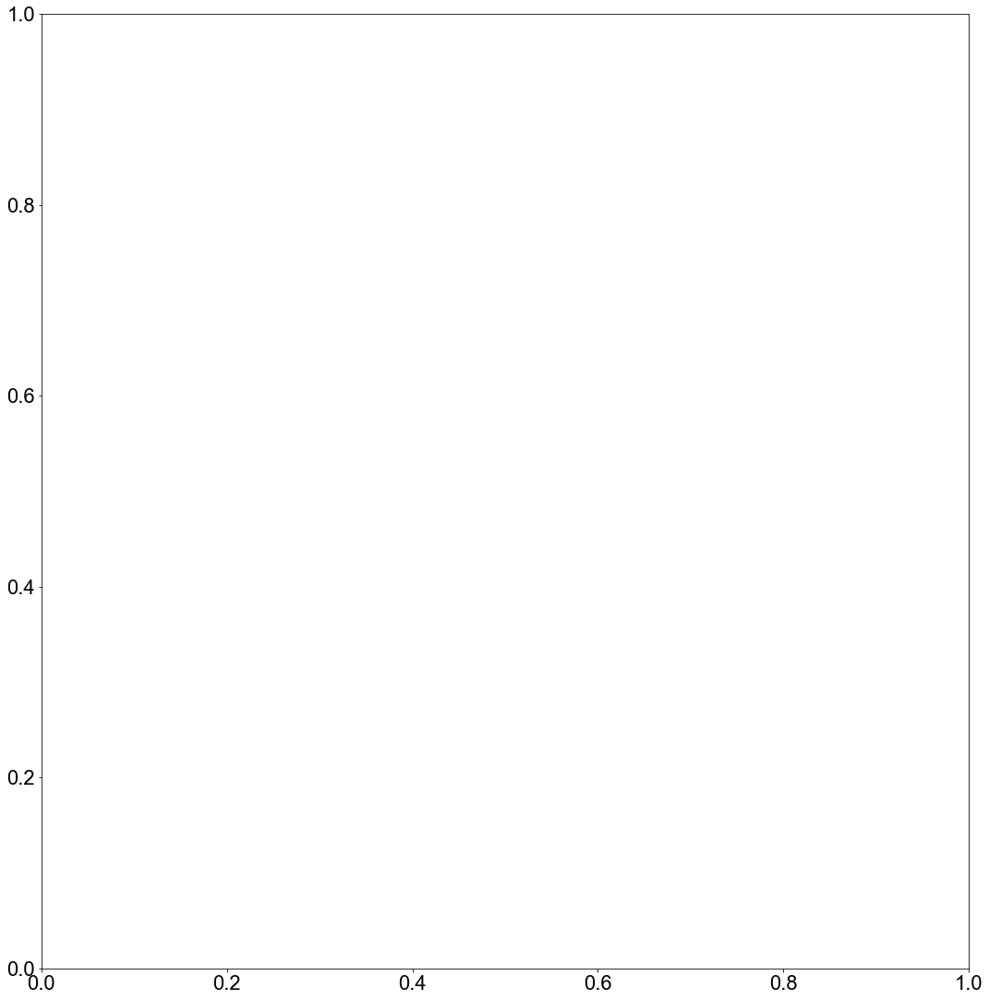

In [297]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,19), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=20, bar_width=0.5,
                                   title='Fanno Creek - In-House vs Eurofins PFAS Concentrations',anchor=-.9)

### Rock Creek

In [298]:
filter_sample_location = filter_sample_location_Rock

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [299]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(filtered_concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.loc[['Rock @ NW Old Cornelius Pass Rd','Rock @ NE Cornelius Pass Rd','Rock @ East Main St','Beaverton @ Cornelius','Dawson @ Brookwood','Rock @ Brookwood','Rock @ River Rd']]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Rock @ NW Old Cornelius Pass Rd,0,0,0,0.000,0.000,0.000,0.000,0.00,0.0000,0.000,...,0,0,0,0,2.000,0.0000,0,0,0,0
Rock @ NE Cornelius Pass Rd,0,0,0,2.395,2.725,2.335,1.745,5.41,0.4885,0.000,...,0,0,0,0,1.109,0.0425,0,0,0,0
Rock @ East Main St,0,0,0,3.060,3.440,2.680,1.780,4.93,0.8380,0.000,...,0,0,0,0,0.298,0.3080,0,0,0,0
Beaverton @ Cornelius,0,0,0,5.110,7.740,6.190,2.790,9.99,1.5800,0.782,...,0,0,0,0,0.364,0.0000,0,0,0,0
Dawson @ Brookwood,0,0,0,17.300,10.600,8.110,3.260,6.37,1.2100,0.369,...,0,0,0,0,0.570,0.0000,0,0,0,0


In [300]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
Eurofins_df = Eurofins_df.loc[['Rock @ NW Old Cornelius Pass Rd','Rock @ NE Cornelius Pass Rd','Rock @ East Main St','Beaverton @ Cornelius','Dawson @ Brookwood','Rock @ Brookwood','Rock @ River Rd']]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Rock @ NW Old Cornelius Pass Rd,0,0,0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,0,0,0,0,0,0,0,0,0,0
Rock @ NE Cornelius Pass Rd,0,0,0,2.65,2.4,2.25,1.65,4.15,0.59,0.00,...,0,0,0,0,0,0,0,0,0,0
Rock @ East Main St,0,0,0,3.00,3.0,2.30,1.70,4.30,0.82,0.00,...,0,0,0,0,0,0,0,0,0,0
Beaverton @ Cornelius,0,0,0,5.20,6.0,6.00,2.80,7.60,1.40,0.73,...,0,0,0,0,0,0,0,0,0,0
Dawson @ Brookwood,0,0,0,14.00,8.0,6.70,2.50,4.30,1.10,0.70,...,0,0,0,0,0,0,0,0,0,0


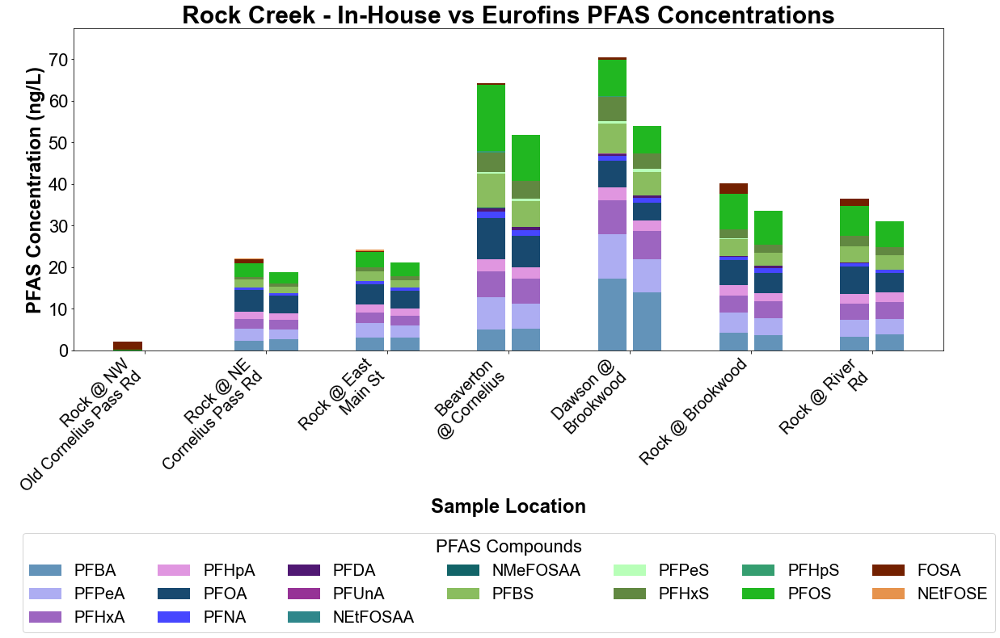

In [301]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,19), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=20, bar_width=0.5,
                                   title='Rock Creek - In-House vs Eurofins PFAS Concentrations',anchor=-.9)

### Lower Tributaries

In [302]:
filter_sample_location = filter_sample_location_LowerTributaries

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [303]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(filtered_concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.loc[['Rock Creek Effluent','Rock @ Brookwood','Chicken @ Sholls-Sherwood','Durham Effluent','Fanno at Durham Rd']]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Rock Creek Effluent,0,0,0,24.700,19.90,24.000,6.330,14.40,1.1400,0.4830,...,1.840,0,0,0,0.0640,0,0,0,0,0
Rock @ Brookwood,0,0,0,4.290,4.75,4.130,2.440,6.11,0.8700,0.1760,...,0.000,0,0,0,2.4900,0,0,0,0,0
Chicken @ Sholls-Sherwood,0,0,0,0.711,1.47,0.978,0.367,1.88,1.4300,0.0000,...,0.000,0,0,0,0.2170,0,0,0,0,0
Durham Effluent,0,0,0,9.410,9.54,11.700,2.310,9.99,0.5380,0.3340,...,0.083,0,0,0,0.0090,0,0,0,0,0
Fanno at Durham Rd,0,0,0,3.415,5.29,4.960,2.400,7.91,0.9135,0.4425,...,0.000,0,0,0,2.0985,0,0,0,0,0


In [304]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
Eurofins_df = Eurofins_df.loc[['Rock Creek Effluent','Rock @ Brookwood','Chicken @ Sholls-Sherwood','Durham Effluent','Fanno at Durham Rd']]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Rock Creek Effluent,0,0,0,24.0,19.00,21.0,6.10,11.00,1.50,0.76,...,0,0,0,0,0,0,0,0,0,0
Rock @ Brookwood,0,0,0,3.6,4.10,4.1,2.00,4.90,1.10,0.56,...,0,0,0,0,0,0,0,0,0,0
Chicken @ Sholls-Sherwood,0,0,0,0.0,0.00,1.4,0.69,1.50,1.20,0.00,...,0,0,0,0,0,0,0,0,0,0
Durham Effluent,0,0,0,10.0,8.80,9.4,2.80,7.40,1.00,0.59,...,0,0,0,0,0,0,0,0,0,0
Fanno at Durham Rd,0,0,0,3.8,5.45,5.0,2.50,3.85,1.05,0.68,...,0,0,0,0,0,0,0,0,0,0


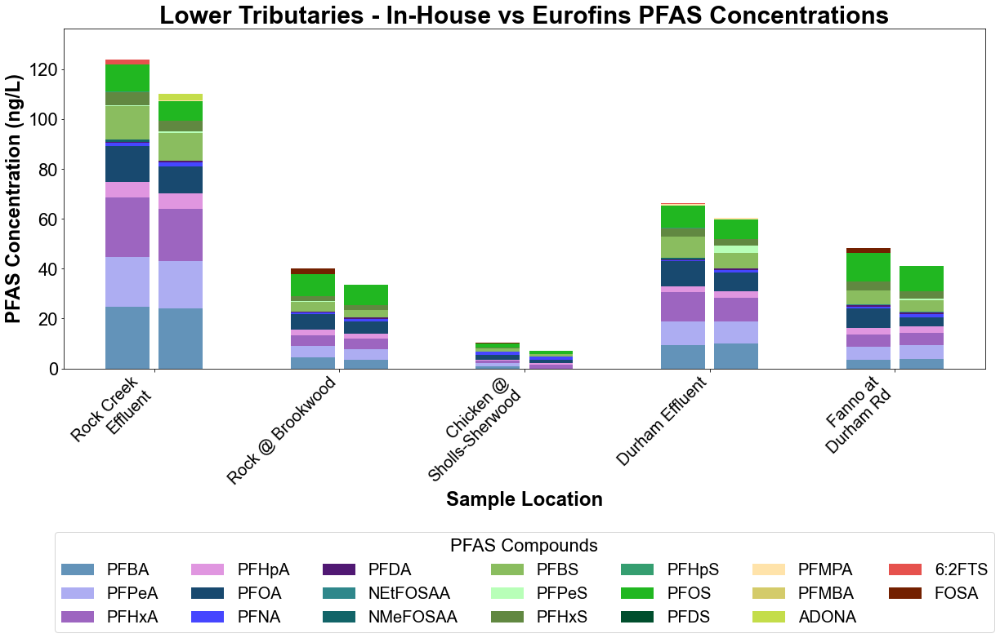

In [305]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,16), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=20, bar_width=0.5,
                                   title='Lower Tributaries - In-House vs Eurofins PFAS Concentrations',anchor=-.8)

### Upper Tributaries

In [306]:
filter_sample_location = filter_sample_location_UpperTributaries

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [307]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(filtered_concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.loc[['Scoggins Below Hagg','Gales @ Stringtown','Dairy @ Hwy 8','McKay @ Padgett' ]]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Scoggins Below Hagg,0,0,0,0.000,0.00,0.000,0.000,0.00,0.000,0,...,0,0,0,0,1.580,0,0,0,0,0
Gales @ Stringtown,0,0,0,0.000,0.00,0.000,0.000,0.00,0.000,0,...,0,0,0,0,0.156,0,0,0,0,0
Dairy @ Hwy 8,0,0,0,0.503,0.25,0.228,0.453,1.10,0.000,0,...,0,0,0,0,2.580,0,0,0,0,0
McKay @ Padgett,0,0,0,2.090,1.86,1.550,0.822,2.59,0.274,0,...,0,0,0,0,0.335,0,0,0,0,0


In [308]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
Eurofins_df = Eurofins_df.loc[['Scoggins Below Hagg','Gales @ Stringtown','Dairy @ Hwy 8','McKay @ Padgett']]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Scoggins Below Hagg,0,0,0,0.0,0.0,0.0,0.00,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gales @ Stringtown,0,0,0,0.0,0.0,0.0,0.00,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0
Dairy @ Hwy 8,0,0,0,0.0,0.0,0.0,0.00,1.0,0,0,...,0,0,0,0,0,0,0,0,0,0
McKay @ Padgett,0,0,0,2.2,1.9,1.7,0.88,2.7,0,0,...,0,0,0,0,0,0,0,0,0,0


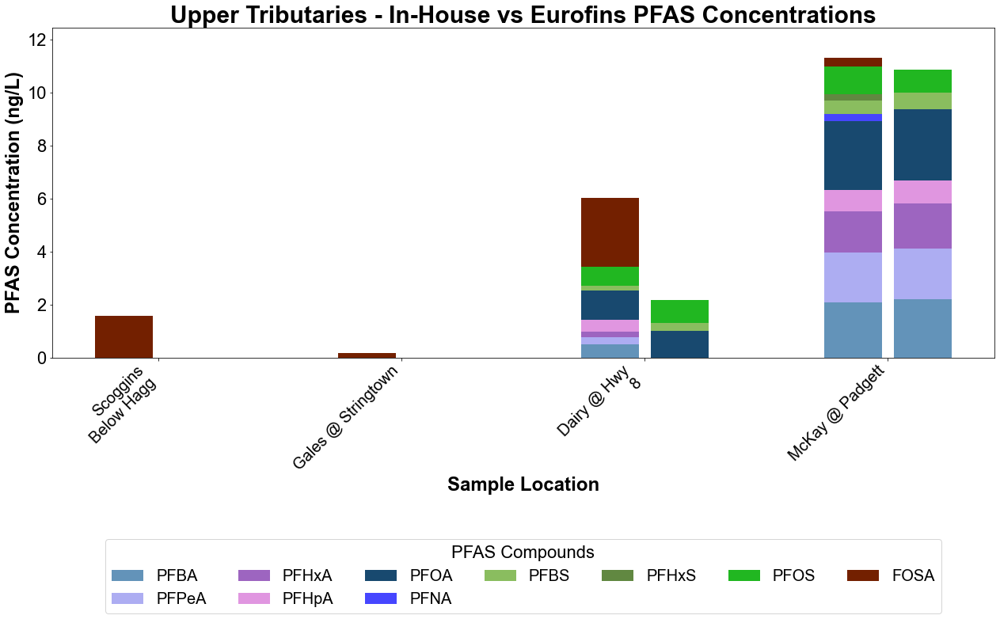

In [309]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,16), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=20, bar_width=0.5,
                                   title='Upper Tributaries - In-House vs Eurofins PFAS Concentrations',anchor=-.8)

### Influent and Effluent

In [310]:
filter_sample_location = filter_sample_location_Influent_Effluent

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [311]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(filtered_concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.loc[['Durham Influent','Durham Effluent','Hillsboro Influent','Hillsboro Effluent','Forest Grove Influent','Forest Grove Effluent','Rock Creek Influent','Rock Creek Effluent']]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Durham Influent,0,1.09,0,7.10,7.39,7.41,2.45,8.79,1.320,0.742,...,0.000,0,0.0,0,0.000,0.000,0,0,0,0
Durham Effluent,0,0.00,0,9.41,9.54,11.70,2.31,9.99,0.538,0.334,...,0.083,0,0.0,0,0.009,0.000,0,0,0,0
Hillsboro Influent,0,0.00,0,0.00,0.00,5.20,0.00,0.00,0.000,0.000,...,0.000,0,0.0,0,0.000,0.000,0,0,0,0
Hillsboro Effluent,0,0.00,0,5.25,7.66,7.80,2.66,6.73,0.413,0.051,...,0.000,0,0.0,0,0.510,0.074,0,0,0,0
Forest Grove Influent,0,0.00,0,0.00,0.00,0.00,0.00,0.00,0.000,0.000,...,0.000,0,0.0,0,0.000,0.000,0,0,0,0


In [312]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
Eurofins_df = Eurofins_df.loc[['Durham Influent','Durham Effluent','Hillsboro Influent','Hillsboro Effluent','Forest Grove Influent','Forest Grove Effluent','Rock Creek Influent','Rock Creek Effluent']]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Durham Influent,0,0,0,5.2,5.9,5.8,2.0,6.9,1.00,0.67,...,0,0,0,0,0,0,0,0,0,0
Durham Effluent,0,0,0,10.0,8.8,9.4,2.8,7.4,1.00,0.59,...,0,0,0,0,0,0,0,0,0,0
Hillsboro Influent,0,0,0,0.0,0.0,6.8,0.0,0.0,0.00,0.00,...,0,0,0,0,0,0,0,0,0,0
Hillsboro Effluent,0,0,0,4.1,5.9,6.3,2.7,4.7,0.63,0.00,...,0,0,0,0,0,0,0,0,0,0
Forest Grove Influent,0,0,0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,...,0,0,0,0,0,0,0,0,0,0


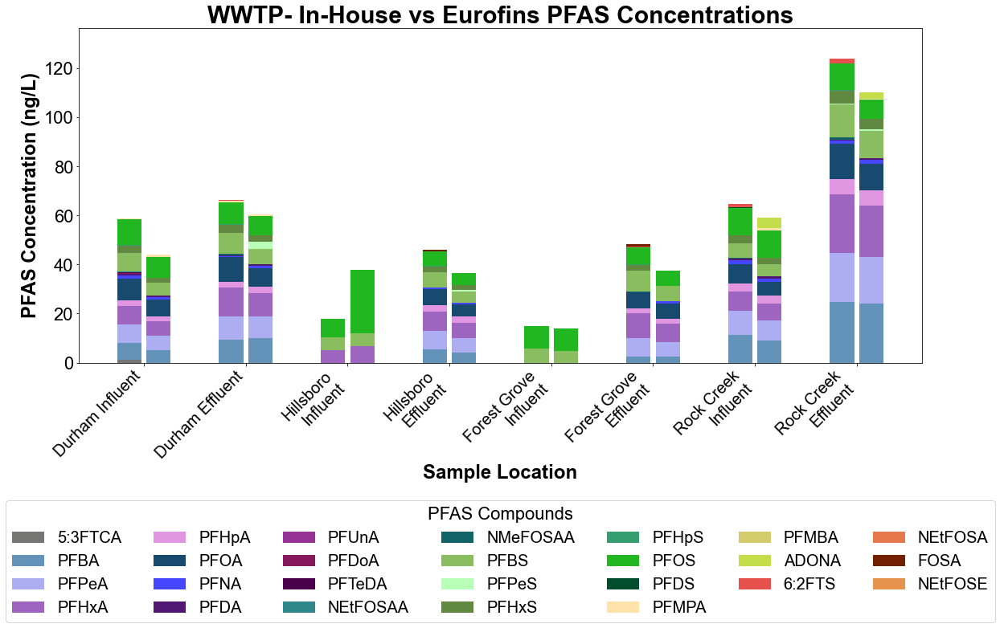

In [313]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,16), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=20, bar_width=0.5,
                                   title='WWTP- In-House vs Eurofins PFAS Concentrations',anchor=-.8)

### By Sample Type

In [314]:
#Specify filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
filter_sample_location= ['Rock @ Brookwood', 'Fanno at Durham Rd', 'Scoggins Below Hagg',
       'Dairy @ Hwy 8', 'TR @ Boones Ferry', 'TR @ Fernhill',
       'TR @ Cherry Grove', 'Rock @ River Rd',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Fanno @ Durham Park', 'Fanno @ SW Grant Ave',
       'Fanno @ SW 56th Ave', 'Rock Creek Effluent',
       'Forest Grove Effluent', 'Hillsboro Effluent']

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [315]:
SampleTypes_InHouse_pivot= PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation_Type(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in SampleTypes_InHouse_pivot.columns]
# Reorder columns by indexing df with the desired order
SampleTypes_InHouse_pivot = SampleTypes_InHouse_pivot[filtered_order]
SampleTypes_InHouse_pivot = SampleTypes_InHouse_pivot.rename(columns=pfas_mapping)

SampleTypes_InHouse_pivot.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Type,,,,,,,,,,,,,,,,,,,,,
Ambient,0,0,0,1.602875,2.101250,2.007250,1.072625,3.067500,0.344375,0.132625,...,0.000000,0.004,0,0,2.130875,0.000000,0,0,0,0
Effluent,0,0,0,10.850000,11.620000,14.000000,3.616667,9.243333,0.606333,0.178000,...,0.761667,0.000,0,0,0.523333,0.024667,0,0,0,0
Urban Creek,0,0,0,2.374286,3.574286,3.758571,1.777143,5.721429,0.567857,0.199000,...,0.000000,0.000,0,0,2.041143,0.012143,0,0,0,0


In [316]:
SampleTypes_Eurofins_pivot= PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation_Type(concat_df, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'Quant Incl Estimates Incl Qual Flags')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in SampleTypes_Eurofins_pivot.columns]
# Reorder columns by indexing df with the desired order
SampleTypes_Eurofins_pivot = SampleTypes_Eurofins_pivot[filtered_order]
SampleTypes_Eurofins_pivot = SampleTypes_Eurofins_pivot.rename(columns=pfas_mapping)

SampleTypes_Eurofins_pivot.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Type,,,,,,,,,,,,,,,,,,,,,
Ambient,0,0,0,1.400000,2.050000,1.962500,0.953750,1.875000,0.400000,0.240000,...,0,0,0,0,0,0,0,0,0,0
Effluent,0,0,0,10.166667,10.233333,11.700000,3.566667,7.333333,0.960000,0.253333,...,0,0,0,0,0,0,0,0,0,0
Urban Creek,0,0,0,2.614286,2.828571,2.957143,1.628571,3.981429,0.634286,0.222857,...,0,0,0,0,0,0,0,0,0,0


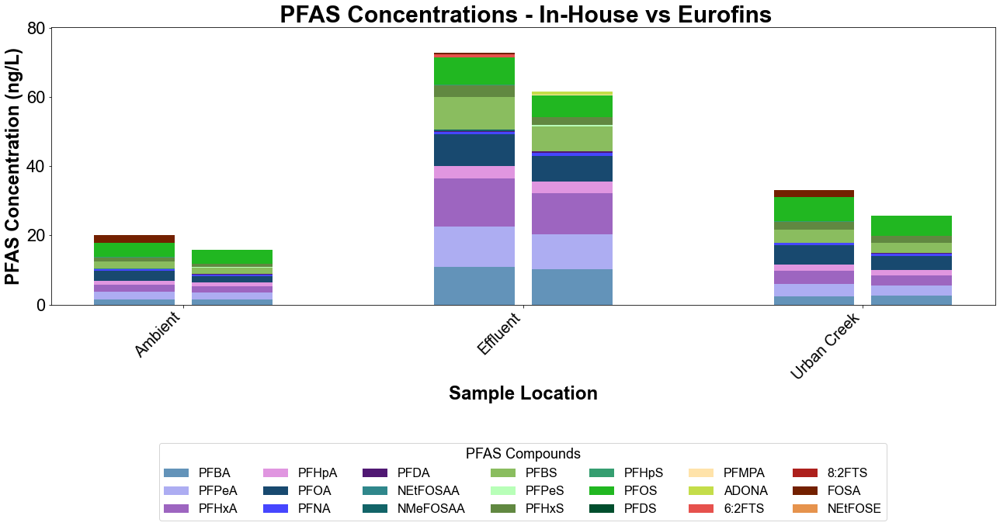

In [317]:
create_seasonal_stacked_bar_chart(season_1_data=SampleTypes_InHouse_pivot,season_2_data=SampleTypes_Eurofins_pivot,figsize=(18,14), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=16, bar_width=0.5,
                                   title=' PFAS Concentrations - In-House vs Eurofins')

## Stacked Bars (All, using Eurofins MDL for In-house)

#### Prepare Data (Apply Eurofins MDL to In-House)

In [244]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/temporary/Default MDLs.xlsx'
#Specify sheet name
sheet_name = 'Sheet1'

#Call data import function
MDLs_df = pd.read_excel(excel_file_path,sheet_name=sheet_name)

MDLs_df.head()

,MDL (ppt),PFBA,PFMPA,3:3FTCA,PFPeA,PFMBA,4:2FTS,NFDHA,PFBS,PFHxA,...,PFDS,PFTrDA,11Cl-PF3OUdS,FOSA,PFTeDA,PFDoS,NMeFOSE,NMeFOSA,NEtFOSE,NEtFOSA
0,Eurofins MDL,1.8,0.46,1.4,0.91,0.91,1.5,0.91,0.27,0.46,...,0.46,0.46,1.8,0.46,0.46,0.46,4.6,0.46,4.6,0.46
1,Eurofins RL,7.3,3.60,9.1,3.60,3.60,7.3,3.60,1.80,1.80,...,1.80,1.80,7.3,1.80,1.80,1.80,18.0,1.80,18.0,1.80


In [245]:
# Create a dictionary mapping PFAS Compounds to their corresponding Abbreviation 
pfas_mapping_Abbrev_long = dict(zip(df_PFAS_Attributes['Abbrev'], df_PFAS_Attributes['Database']))

In [246]:
data_wMDLs= concat_df
MDLs_df.rename(columns=pfas_mapping_Abbrev_long, inplace=True)
MDLs_df.rename(columns={col: col.replace('TOP-', '') for col in MDLs_df.columns if 'TOP-' in col}, inplace=True)
MDLs_df

NameError: name 'concat_df' is not defined

In [ ]:
def update_wBDL(row):
    if row['Analysis'] == 'PFAS' and np.isnan(row['MDL']) and (row['Detection Class'] == 'BDL' or row['Detection Class'] == 'BQL'):
        # Access the matching MDL value from MDLs_df based on 'PFAS Compound'
        compound = row['PFAS Compound']
        if compound in MDLs_df.columns:
            # Assuming the value you need is in the first row of the specified column
            md_value = MDLs_df.loc[0, compound]
            return md_value / 2  # Adjust the value as necessary
        else:
            return row['All (w BDL= MDL/2) Incl Qual Flags']  # Return original if no match
    else:
        return row['All (w BDL= MDL/2) Incl Qual Flags']

# Apply the function to each row in the dataframe
data_wMDLs['All (w BDL= MDL/2) Incl Qual Flags_NEW'] = data_wMDLs.apply(update_wBDL, axis=1)


In [ ]:
#Check
data_wMDLs[data_wMDLs['Analysis']=='PFAS'][['MDL','Detection Class','PFAS Compound','All (w BDL= MDL/2) Incl Qual Flags','All (w BDL= MDL/2) Incl Qual Flags_NEW']]


,MDL,Detection Class,PFAS Compound,All (w BDL= MDL/2) Incl Qual Flags,All (w BDL= MDL/2) Incl Qual Flags_NEW
152,NaN,BDL,11Cl-PF3OUdS,0.000,0.900
122,NaN,BDL,3:3 FTCA,0.000,0.700
125,NaN,BDL,4:2 Fluorotelomersulfonic acid,0.000,0.750
131,NaN,BDL,5:3 FTCA,0.000,4.550
135,NaN,BDL,6:2 Fluorotelomersulfonic acid,0.000,1.150
...,...,...,...,...,...
213,NaN,BDL,Perfluoropentanesulfonic acid,0.000,0.230
203,NaN,BDL,Perfluoropentanoic acid,0.000,0.455
234,NaN,Quant,Perfluorotetradecanoic acid,0.319,0.319
231,NaN,BDL,Perfluorotridecanoic acid,0.000,0.230


### By Location

#### Functions

In [ ]:
def PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(data_df, filter_qual_summary=None, filter_pfas_compound=None, filter_Analysis = None,
                              filter_sample_location=None, start_date=None, end_date=None,col_name= 'Quant Incl Estimates Incl Qual Flags'):
    """
    Create a custom pivot table with filters based on 'Qual Summary (Grade for filtering)', 'PFAS Compound',
    'Sample Location', and a date range for 'Sample Date'.

    Args:
        data_df (pd.DataFrame): The DataFrame containing the data.
        filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
        filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
        filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
        start_date (str, optional): Start date for the date range filter (default is None).
        end_date (str, optional): End date for the date range filter (default is None).

    Returns:
        pd.DataFrame: The custom pivot table.
    """
    try:
        # Apply filters based on 'Qual Summary (Grade for filtering)'
        filtered_data = data_df
        if filter_qual_summary:
            filtered_data = filtered_data[filtered_data['Qual Summary (Grade for filtering)'].isin(filter_qual_summary)]

        # Apply filters based on 'PFAS Compound'
        if len(filter_pfas_compound) > 0:
            filtered_data = filtered_data[filtered_data['PFAS Compound'].isin(filter_pfas_compound)]

        # Apply filters based on 'Sample Location'
        if len(filter_sample_location) >0:
            filtered_data = filtered_data[filtered_data['Sample Location'].isin(filter_sample_location)]
    
        # Apply filters based on 'Analysis'
        if len(filter_Analysis) >0:
            filtered_data = filtered_data[filtered_data['Analysis'].isin(filter_Analysis)]

        # Apply date range filter based on 'Sample Date'
        if start_date and end_date:
            filtered_data = filtered_data[(filtered_data['Sample Date'] >= start_date) & (filtered_data['Sample Date'] <= end_date)]

        # Create a pivot table with 'Sample Location' as rows, 'PFAS Compound' as columns, and average of 'Quant Incl Estimates Incl Qual Flags' as values
        pivot_table = pd.pivot_table(filtered_data, values=col_name,
                                     index='Sample Location', columns='PFAS Compound', aggfunc='mean', fill_value=0)

        return pivot_table

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [ ]:
def PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation_Type(data_df, filter_qual_summary=None, filter_pfas_compound=None, filter_Analysis = None,
                              filter_sample_location=None, start_date=None, end_date=None,col_name= 'Quant Incl Estimates Incl Qual Flags'):
    """
    Create a custom pivot table with filters based on 'Qual Summary (Grade for filtering)', 'PFAS Compound',
    'Sample Location', and a date range for 'Sample Date'.

    Args:
        data_df (pd.DataFrame): The DataFrame containing the data.
        filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
        filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
        filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
        start_date (str, optional): Start date for the date range filter (default is None).
        end_date (str, optional): End date for the date range filter (default is None).

    Returns:
        pd.DataFrame: The custom pivot table.
    """
    try:
        # Apply filters based on 'Qual Summary (Grade for filtering)'
        filtered_data = data_df
        if filter_qual_summary:
            filtered_data = filtered_data[filtered_data['Qual Summary (Grade for filtering)'].isin(filter_qual_summary)]

        # Apply filters based on 'PFAS Compound'
        if len(filter_pfas_compound) > 0:
            filtered_data = filtered_data[filtered_data['PFAS Compound'].isin(filter_pfas_compound)]

        # Apply filters based on 'Sample Location'
        if len(filter_sample_location) >0:
            filtered_data = filtered_data[filtered_data['Sample Location'].isin(filter_sample_location)]
    
        # Apply filters based on 'Analysis'
        if len(filter_Analysis) >0:
            filtered_data = filtered_data[filtered_data['Analysis'].isin(filter_Analysis)]

        # Apply date range filter based on 'Sample Date'
        if start_date and end_date:
            filtered_data = filtered_data[(filtered_data['Sample Date'] >= start_date) & (filtered_data['Sample Date'] <= end_date)]

        # Create a pivot table with 'Sample Location' as rows, 'PFAS Compound' as columns, and average of 'Quant Incl Estimates Incl Qual Flags' as values
        pivot_table = pd.pivot_table(filtered_data, values=col_name,
                                     index='Type', columns='PFAS Compound', aggfunc='mean', fill_value=0)

        return pivot_table

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [ ]:
def create_seasonal_stacked_bar_chart(season_1_data, season_2_data, figsize=(12, 8), title='Seasonal PFAS Concentrations by Sample Location', compound_colors_dict=None,
                                      title_fontsize=20, axis_label_fontsize=16, tick_label_fontsize=14, legend_fontsize=12, bar_width=0.35):
    try:
        font_bold = FontProperties(family='Arial', weight='bold')
        
        # Prepare figure and axes
        fig, ax = plt.subplots(figsize=figsize)
        locations = season_1_data.index.intersection(season_2_data.index)
        
        # Position indices for the bars, now adjusted to include a gap
        x_indices = np.arange(len(locations)) 
        
        gap = 0.025  # This is the gap between bars
        adjusted_width = bar_width / 2 - gap / 2  # Adjust bar width to accommodate gap
        
        dry_bottom = {loc: 0 for loc in locations}
        wet_bottom = {loc: 0 for loc in locations}

        for compound in compound_colors_dict.keys():  # Ensures order is based on the color dictionary
            color = compound_colors_dict[compound]
            dry_heights = [season_1_data.at[loc, compound] if compound in season_1_data.columns else 0 for loc in locations]
            wet_heights = [season_2_data.at[loc, compound] if compound in season_2_data.columns else 0 for loc in locations]

            # Plot dry season data with adjusted positions
            ax.bar(x_indices - adjusted_width - gap, dry_heights, width=adjusted_width, bottom=[dry_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            dry_bottom = {loc: dry_bottom[loc] + height for loc, height in zip(locations, dry_heights)}

            # Plot wet season data with adjusted positions
            ax.bar(x_indices + gap, wet_heights, width=adjusted_width, bottom=[wet_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            wet_bottom = {loc: wet_bottom[loc] + height for loc, height in zip(locations, wet_heights)}

        # Calculate maximum stack height
        max_stack_height = max(max(dry_bottom.values()), max(wet_bottom.values()))
        # Set y-axis limits
        ax.set_ylim(0, max_stack_height * 1.10)

        # Split label function
        def split_label(label):
            if len(label) > 14:
                split_point = label.find(' ', 10)  # Find next space after 14th character
                if split_point != -1:
                    return label[:split_point] + '\n' + label[split_point + 1:]
            return label  # Return label unmodified if it's short enough or no space found

        # Modify the x-tick labels
        split_xtick_labels = [split_label(label) for label in locations]

        ax.set_xticks(x_indices)
        ax.set_xticklabels(split_xtick_labels, rotation=45, ha='right', fontsize=tick_label_fontsize, fontproperties=font_bold)
        ax.set_xlabel('Sample Location', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_ylabel('PFAS Concentration (ng/L)', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_title(title, fontsize=title_fontsize, fontproperties=font_bold)
        
        # Generate legend only for compounds actually plotted and arrange it below the plot
        handles, labels = ax.get_legend_handles_labels()
        filtered_handles = []
        filtered_labels = []
        seen_labels = set()

        for handle, label in zip(handles, labels):
            if (label in season_1_data.columns and season_1_data[label].sum() > 0) or (label in season_2_data.columns and season_2_data[label].sum() > 0):
                if label not in seen_labels:
                    filtered_handles.append(handle)
                    filtered_labels.append(label)
                    seen_labels.add(label)

        ax.legend(filtered_handles, filtered_labels, title='PFAS Compounds', loc='lower center', bbox_to_anchor=(0.5, -0.99), ncol=7, fontsize=legend_fontsize, title_fontsize=legend_fontsize+2)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {e}")

#### Filters and Settings

In [ ]:
# All Ambient Locations

# Specify filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
# (Eg. 'Good', 'Questionable', etc)
filter_qual_summary=['Good','Probably Ok','Probably ok','Probably okay','probably ok']

filter_Analysis_InHouse = ['PFAS']
filter_Analysis_Eurofins = ['PFAS-CL']

#Specify filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
filter_pfas_compound= ['11Cl-PF3OUdS', '3:3 FTCA', '4:2 Fluorotelomersulfonic acid',
       '5:3 FTCA', '6:2 Fluorotelomersulfonic acid', '7:3 FTCA',
       '8:2 Fluorotelomersulfonic acid', '9Cl-PF3ONS', 'ADONA', 'HFPO-DA',
       'NEtFOSA', 'NEtFOSAA', 'NEtFOSE', 'NMeFOSA', 'NMeFOSAA', 'NMeFOSE',
       'Nonafluorodioxaheptanoic acid', 'PFEESA',
       'Perfluorobutanesulfonic acid', 'Perfluorobutanoic acid',
       'Perfluorodecanesulfonic acid', 'Perfluorodecanoic acid',
       'Perfluorododecanesulfonic acid', 'Perfluorododecanoic acid',
       'Perfluoroheptanesulfonic acid', 'Perfluoroheptanoic acid',
       'Perfluorohexanesulfonic acid', 'Perfluorohexanoic acid',
       'Perfluoromethoxybutanoic acid', 'Perfluoromethoxypropoanoic acid',
       'Perfluorononanesulfonic acid', 'Perfluorononanoic acid',
       'Perfluorooctanesulfonamide',
       'Perfluorooctanesulfonic acid (PFOS)',
       'Perfluorooctanoic acid (PFOA)', 'Perfluoropentanesulfonic acid',
       'Perfluoropentanoic acid', 'Perfluorotetradecanoic acid',
       'Perfluorotridecanoic acid', 'Perfluoroundecanoic acid']


#Specify filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
filter_sample_location= ['Dairy @ Hwy 8', 'Durham Effluent', 'Durham Influent',
       'Fanno @ Durham Park', 'Fanno @ SW 56th Ave',
       'Fanno @ SW Grant Ave', 'Fanno at Durham Rd',
       'Forest Grove Effluent', 'Hillsboro Effluent', 'Intel Aloha F15',
       'Intel Ronler PAWN', 'Intel Ronler WATR', 'Rock @ Brookwood',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Rock @ River Rd', 'Rock Creek Effluent', 'Rock Creek Influent',
       'Scoggins Below Hagg', 'Seals Unlimited Inc', 'TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill']

filter_sample_location_Ambient = ['Dairy @ Hwy 8',
       'Fanno @ Durham Park', 'Fanno @ SW 56th Ave',
       'Fanno @ SW Grant Ave', 'Fanno at Durham Rd',
       'Rock @ Brookwood','Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Rock @ River Rd', 'Scoggins Below Hagg','TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill']

filter_sample_location_Industry= ['Intel Aloha F15','Intel Ronler PAWN', 'Intel Ronler WATR','Seals Unlimited Inc']

filter_sample_location_Wastewater= ['Durham Effluent', 'Durham Influent',
       'Forest Grove Effluent', 'Hillsboro Effluent','Rock Creek Effluent', 'Rock Creek Influent']

filter_sample_location = filter_sample_location_Wastewater

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

# Specify start_date (str, optional): Start date for the date range filter (default is None).
start_date='2024-02-01'

#Specify end_date (str, optional): End date for the date range filter (default is None).
end_date='2024-04-30'

col_name= 'All (w BDL= MDL/2) Incl Qual Flags_NEW'

#### By Locations

In [ ]:

#filter_sample_location_FannoCreek = ['Fanno @ SW 56th Ave','Fanno @ SW Grant Ave','Fanno at Durham Rd','Fanno @ Durham Park']

#filter_sample_location = filter_sample_location_FannoCreek

filter_sample_location_Industry= ['Intel Aloha F15','Intel Ronler PAWN', 'Intel Ronler WATR']
#['Intel Aloha F15','Intel Ronler PAWN', 'Intel Ronler WATR','Seals Unlimited Inc']
filter_sample_location = filter_sample_location_Industry


rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

In [ ]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(data_wMDLs, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'All (w BDL= MDL/2) Incl Qual Flags_NEW')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.loc[['Intel Aloha F15','Intel Ronler PAWN', 'Intel Ronler WATR']]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHpA,PFOA,PFNA,PFDA,PFUnA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Intel Aloha F15,0.0,0.00,0.00,0.00,0.000,0.000,0.000,0.00,0.00,0,...,0.00,0.0,0.00,0.00,0.000,0.0,0.0,0.00,0.000,0.0
Intel Ronler PAWN,0.7,4.55,4.55,1.12,0.171,0.097,0.506,0.23,0.23,0,...,1.15,1.2,0.23,0.23,5.670,2.3,2.3,0.23,0.455,0.9
Intel Ronler WATR,0.7,4.55,4.55,0.90,0.041,0.004,0.032,0.23,0.23,0,...,1.15,1.2,0.23,0.23,0.137,2.3,2.3,0.23,0.455,0.9


In [ ]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation(data_wMDLs, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'All (w BDL= MDL/2) Incl Qual Flags_NEW')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
InHouse_df = InHouse_df.loc[['Intel Aloha F15','Intel Ronler PAWN', 'Intel Ronler WATR']]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHpA,PFOA,PFNA,PFDA,PFUnA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Sample Location,,,,,,,,,,,,,,,,,,,,,
Intel Aloha F15,0.00,0,0,0.00,0.0,0.000,0.000,0.000,0.000,0.000,...,0.00,0.00,0.000,0.000,0.000,0.00,0.00,0.000,0.0,0.00
Intel Ronler PAWN,0.75,5,5,1.00,0.5,0.265,0.670,0.255,0.255,0.255,...,1.25,1.30,0.255,0.255,0.255,2.55,2.55,0.255,0.5,1.00
Intel Ronler WATR,0.80,5,5,1.05,0.5,0.270,0.335,0.260,0.260,0.260,...,1.30,1.35,0.260,0.260,0.260,2.60,2.60,0.260,0.5,1.05


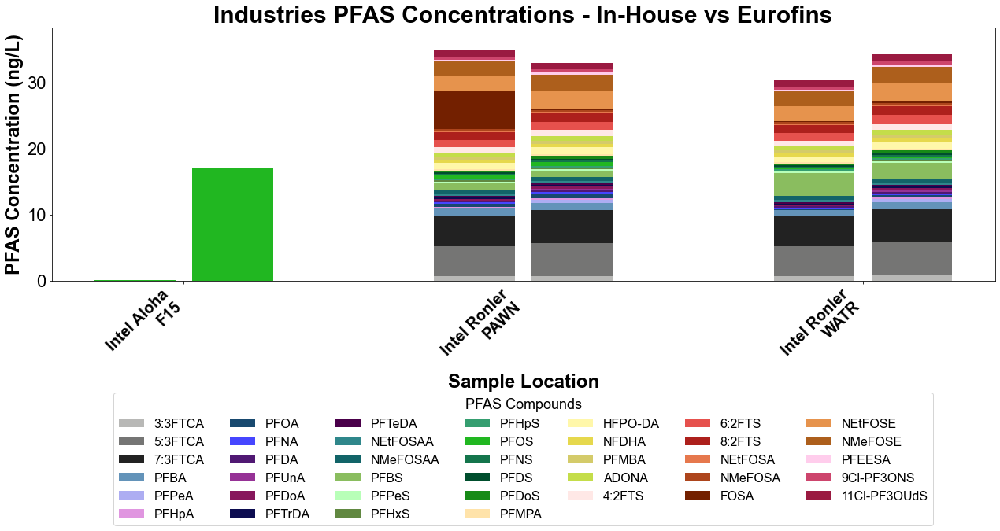

In [ ]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,20), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=16, bar_width=0.5,
                                   title='Industries PFAS Concentrations - In-House vs Eurofins')

### By Sample Type

In [ ]:
def create_seasonal_stacked_bar_chart(season_1_data, season_2_data, figsize=(12, 8), title='Seasonal PFAS Concentrations by Sample Location', compound_colors_dict=None,
                                      title_fontsize=20, axis_label_fontsize=16, tick_label_fontsize=14, legend_fontsize=12, bar_width=0.35):
    try:
        font_bold = FontProperties(family='Arial', weight='bold')
        
        # Prepare figure and axes
        fig, ax = plt.subplots(figsize=figsize)
        locations = season_1_data.index.intersection(season_2_data.index)
        
        # Position indices for the bars, now adjusted to include a gap
        x_indices = np.arange(len(locations)) 
        
        gap = 0.025  # This is the gap between bars
        adjusted_width = bar_width / 2 - gap / 2  # Adjust bar width to accommodate gap
        
        dry_bottom = {loc: 0 for loc in locations}
        wet_bottom = {loc: 0 for loc in locations}

        for compound in compound_colors_dict.keys():  # Ensures order is based on the color dictionary
            color = compound_colors_dict[compound]
            dry_heights = [season_1_data.at[loc, compound] if compound in season_1_data.columns else 0 for loc in locations]
            wet_heights = [season_2_data.at[loc, compound] if compound in season_2_data.columns else 0 for loc in locations]

            # Plot dry season data with adjusted positions
            ax.bar(x_indices - adjusted_width - gap, dry_heights, width=adjusted_width, bottom=[dry_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            dry_bottom = {loc: dry_bottom[loc] + height for loc, height in zip(locations, dry_heights)}

            # Plot wet season data with adjusted positions
            ax.bar(x_indices + gap, wet_heights, width=adjusted_width, bottom=[wet_bottom[loc] for loc in locations], color=color, label=compound, align='edge')
            # Update bottom heights
            wet_bottom = {loc: wet_bottom[loc] + height for loc, height in zip(locations, wet_heights)}

        # Calculate maximum stack height
        max_stack_height = max(max(dry_bottom.values()), max(wet_bottom.values()))
        # Set y-axis limits
        ax.set_ylim(0, max_stack_height * 1.10)

        # Split label function
        def split_label(label):
            if len(label) > 14:
                split_point = label.find(' ', 10)  # Find next space after 14th character
                if split_point != -1:
                    return label[:split_point] + '\n' + label[split_point + 1:]
            return label  # Return label unmodified if it's short enough or no space found

        # Modify the x-tick labels
        split_xtick_labels = [split_label(label) for label in locations]

        ax.set_xticks(x_indices)
        ax.set_xticklabels(split_xtick_labels, rotation=45, ha='right', fontsize=tick_label_fontsize, fontproperties=font_bold)
        ax.set_xlabel('Sample Type', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_ylabel('PFAS Concentration (ng/L)', fontsize=axis_label_fontsize, fontproperties=font_bold)
        ax.set_title(title, fontsize=title_fontsize, fontproperties=font_bold)
        
        # Generate legend only for compounds actually plotted and arrange it below the plot
        handles, labels = ax.get_legend_handles_labels()
        filtered_handles = []
        filtered_labels = []
        seen_labels = set()

        for handle, label in zip(handles, labels):
            if (label in season_1_data.columns and season_1_data[label].sum() > 0) or (label in season_2_data.columns and season_2_data[label].sum() > 0):
                if label not in seen_labels:
                    filtered_handles.append(handle)
                    filtered_labels.append(label)
                    seen_labels.add(label)

        ax.legend(filtered_handles, filtered_labels, title='PFAS Compounds', loc='lower center', bbox_to_anchor=(0.5, -0.99), ncol=7, fontsize=legend_fontsize, title_fontsize=legend_fontsize+2)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {e}")

#### Filters and Settings

In [ ]:
# All Ambient Locations

# Specify filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
# (Eg. 'Good', 'Questionable', etc)
filter_qual_summary=['Good','Probably Ok','Probably ok','Probably okay','probably ok']

filter_Analysis_InHouse = ['PFAS']
filter_Analysis_Eurofins = ['PFAS-CL']

#Specify filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
filter_pfas_compound= ['11Cl-PF3OUdS', '3:3 FTCA', '4:2 Fluorotelomersulfonic acid',
       '5:3 FTCA', '6:2 Fluorotelomersulfonic acid', '7:3 FTCA',
       '8:2 Fluorotelomersulfonic acid', '9Cl-PF3ONS', 'ADONA', 'HFPO-DA',
       'NEtFOSA', 'NEtFOSAA', 'NEtFOSE', 'NMeFOSA', 'NMeFOSAA', 'NMeFOSE',
       'Nonafluorodioxaheptanoic acid', 'PFEESA',
       'Perfluorobutanesulfonic acid', 'Perfluorobutanoic acid',
       'Perfluorodecanesulfonic acid', 'Perfluorodecanoic acid',
       'Perfluorododecanesulfonic acid', 'Perfluorododecanoic acid',
       'Perfluoroheptanesulfonic acid', 'Perfluoroheptanoic acid',
       'Perfluorohexanesulfonic acid', 'Perfluorohexanoic acid',
       'Perfluoromethoxybutanoic acid', 'Perfluoromethoxypropoanoic acid',
       'Perfluorononanesulfonic acid', 'Perfluorononanoic acid',
       'Perfluorooctanesulfonamide',
       'Perfluorooctanesulfonic acid (PFOS)',
       'Perfluorooctanoic acid (PFOA)', 'Perfluoropentanesulfonic acid',
       'Perfluoropentanoic acid', 'Perfluorotetradecanoic acid',
       'Perfluorotridecanoic acid', 'Perfluoroundecanoic acid']


#Specify filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
filter_sample_location= ['Dairy @ Hwy 8', 'Durham Effluent', 'Durham Influent',
       'Fanno @ Durham Park', 'Fanno @ SW 56th Ave',
       'Fanno @ SW Grant Ave', 'Fanno at Durham Rd',
       'Forest Grove Effluent', 'Hillsboro Effluent', 'Intel Aloha F15',
       'Intel Ronler PAWN', 'Intel Ronler WATR', 'Rock @ Brookwood',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Rock @ River Rd', 'Rock Creek Effluent', 'Rock Creek Influent',
       'Scoggins Below Hagg', 'Seals Unlimited Inc', 'TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill']

filter_sample_location_Ambient = ['Dairy @ Hwy 8',
       'Fanno @ Durham Park', 'Fanno @ SW 56th Ave',
       'Fanno @ SW Grant Ave', 'Fanno at Durham Rd',
       'Rock @ Brookwood','Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Rock @ River Rd', 'Scoggins Below Hagg','TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill']

filter_sample_location_Industry= ['Intel Aloha F15','Intel Ronler PAWN', 'Intel Ronler WATR','Seals Unlimited Inc']

filter_sample_location_Wastewater= ['Durham Effluent', 'Durham Influent',
       'Forest Grove Effluent', 'Hillsboro Effluent','Rock Creek Effluent', 'Rock Creek Influent']

rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

# Specify start_date (str, optional): Start date for the date range filter (default is None).
start_date='2024-02-01'

#Specify end_date (str, optional): End date for the date range filter (default is None).
end_date='2024-04-30'

col_name= 'All (w BDL= MDL/2) Incl Qual Flags_NEW'

In [ ]:
filter_sample_location = filter_sample_location_Industry
filter_sample_location= ['Dairy @ Hwy 8', 'Durham Effluent', 'Durham Influent',
       'Fanno @ Durham Park', 'Fanno @ SW 56th Ave',
       'Fanno @ SW Grant Ave', 'Fanno at Durham Rd',
       'Forest Grove Effluent', 'Hillsboro Effluent', 'Rock @ Brookwood',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Rock @ River Rd', 'Rock Creek Effluent', 'Rock Creek Influent',
       'Scoggins Below Hagg', 'TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill']
rows_order= filter_sample_location
rows_order_reverse=filter_sample_location.reverse()

#### Create Pivot Tables

In [ ]:
InHouse_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation_Type(data_wMDLs, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'All (w BDL= MDL/2) Incl Qual Flags_NEW')

# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in InHouse_df.columns]
# Reorder columns by indexing df with the desired order
InHouse_df = InHouse_df[filtered_order]
InHouse_df = InHouse_df.rename(columns=pfas_mapping)
InHouse_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Type,,,,,,,,,,,,,,,,,,,,,
Ambient,0.7,4.55,4.55,1.634143,1.613429,1.703286,0.849143,2.606714,0.423000,0.341286,...,1.1500,1.2,0.230,0.23,2.065714,2.007000,2.3,0.23,0.276000,0.500714
Effluent,0.7,4.55,4.55,10.490000,11.100000,13.425000,3.290000,9.430000,0.589250,0.274500,...,0.8795,1.2,0.230,0.23,0.394750,1.743500,2.3,0.23,0.455000,0.900000
Influent,0.7,3.31,4.55,8.720000,8.170000,7.520000,2.765000,8.955000,0.973500,0.466500,...,1.3250,1.2,0.117,0.23,0.230000,2.300000,2.3,0.23,0.455000,0.900000
Urban Creek,0.7,4.55,4.55,2.226833,2.955833,3.440500,1.681667,5.709833,0.619667,0.437000,...,1.1500,1.2,0.230,0.23,1.566667,1.140333,2.3,0.23,0.248333,0.669500


In [ ]:
Eurofins_df = PivotTable_AvgPFASCompound_FilterByCompoundSamplingDatesLocation_Type(data_wMDLs, filter_qual_summary=filter_qual_summary, filter_pfas_compound=filter_pfas_compound, filter_Analysis = ['PFAS-CL'],
                              filter_sample_location=filter_sample_location, start_date=start_date, end_date=end_date,col_name= 'All (w BDL= MDL/2) Incl Qual Flags_NEW')
# Assuming df is your original DataFrame and df_PFAS_Attributes['Database'] contains the desired column order
desired_order = df['Database'].tolist()  # Convert to list if not already
# Filter the desired_order to only include columns that exist in df
filtered_order = [comp for comp in desired_order if comp in Eurofins_df.columns]
# Reorder columns by indexing df with the desired order
Eurofins_df = Eurofins_df[filtered_order]
Eurofins_df = Eurofins_df.rename(columns=pfas_mapping)
Eurofins_df.head()

PFAS Compound,3:3FTCA,5:3FTCA,7:3FTCA,PFBA,PFPeA,PFHxA,PFHpA,PFOA,PFNA,PFDA,...,6:2FTS,8:2FTS,NEtFOSA,NMeFOSA,FOSA,NEtFOSE,NMeFOSE,PFEESA,9Cl-PF3ONS,11Cl-PF3OUdS
Type,,,,,,,,,,,,,,,,,,,,,
Ambient,0.707143,4.692857,4.692857,1.707143,1.883571,1.705714,0.887143,1.212143,0.470714,0.359286,...,1.171429,1.221429,0.235000,0.235000,0.235000,2.350000,2.350000,0.235000,0.469286,0.950000
Effluent,0.650000,4.412500,4.412500,10.125000,9.875000,11.125000,3.375000,7.350000,0.970000,0.448750,...,1.100000,1.150000,0.220000,0.220000,0.220000,2.200000,2.200000,0.220000,0.441250,0.887500
Influent,0.800000,5.350000,5.350000,7.050000,7.050000,6.350000,2.600000,6.350000,1.100000,0.775000,...,8.325000,1.400000,0.270000,0.270000,0.270000,2.700000,2.700000,0.270000,0.535000,1.100000
Urban Creek,0.708333,4.641667,4.641667,2.758333,2.994167,3.155833,1.707500,4.045000,0.685833,0.414167,...,1.166667,1.216667,0.234167,0.234167,0.234167,2.341667,2.341667,0.234167,0.464167,0.941667


#### Create Stacked Bar

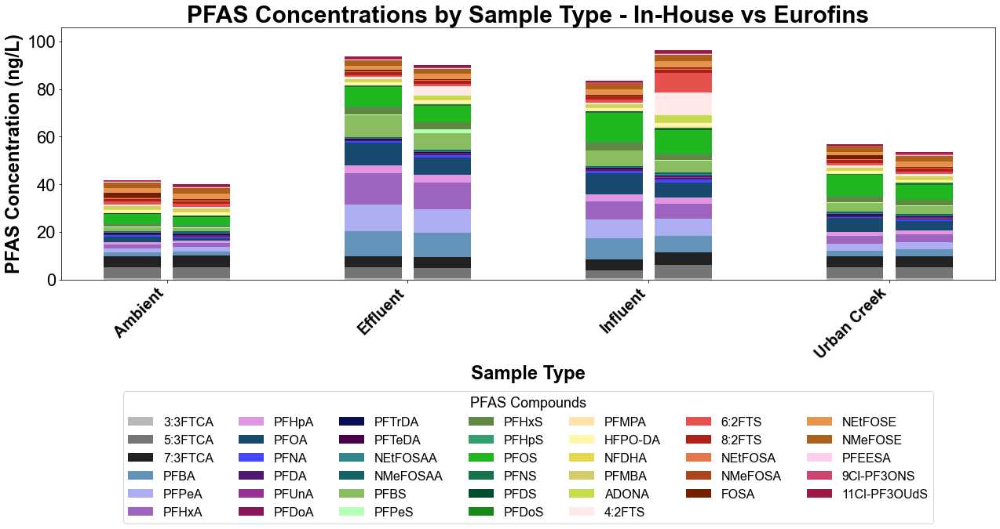

In [ ]:
create_seasonal_stacked_bar_chart(season_1_data=InHouse_df, season_2_data=Eurofins_df,figsize=(18,20), compound_colors_dict=compound_colors_dict_abbrev,
                                   title_fontsize=30, axis_label_fontsize=24, tick_label_fontsize=20, legend_fontsize=16, bar_width=0.5,
                                   title='PFAS Concentrations by Sample Type - In-House vs Eurofins')

## By Individual PFAS Compounds at Location

### Prepare Data

In [318]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/temporary/Default MDLs.xlsx'
#Specify sheet name
sheet_name = 'Sheet1'

#Call data import function
MDLs_df = pd.read_excel(excel_file_path,sheet_name=sheet_name)

MDLs_df.head()

,MDL (ppt),PFBA,PFMPA,3:3FTCA,PFPeA,PFMBA,4:2FTS,NFDHA,PFBS,PFHxA,...,PFDS,PFTrDA,11Cl-PF3OUdS,FOSA,PFTeDA,PFDoS,NMeFOSE,NMeFOSA,NEtFOSE,NEtFOSA
0,Eurofins MDL,1.8,0.46,1.4,0.91,0.91,1.5,0.91,0.27,0.46,...,0.46,0.46,1.8,0.46,0.46,0.46,4.6,0.46,4.6,0.46
1,Eurofins RL,7.3,3.60,9.1,3.60,3.60,7.3,3.60,1.80,1.80,...,1.80,1.80,7.3,1.80,1.80,1.80,18.0,1.80,18.0,1.80


In [319]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/temporary/Default MDLs.xlsx'
#Specify sheet name
sheet_name = 'Sheet1'

#Call data import function
MDLs_df_abbrev = pd.read_excel(excel_file_path,sheet_name=sheet_name)
MDLs_df_abbrev


,MDL (ppt),PFBA,PFMPA,3:3FTCA,PFPeA,PFMBA,4:2FTS,NFDHA,PFBS,PFHxA,...,PFDS,PFTrDA,11Cl-PF3OUdS,FOSA,PFTeDA,PFDoS,NMeFOSE,NMeFOSA,NEtFOSE,NEtFOSA
0,Eurofins MDL,1.8,0.46,1.4,0.91,0.91,1.5,0.91,0.27,0.46,...,0.46,0.46,1.8,0.46,0.46,0.46,4.6,0.46,4.6,0.46
1,Eurofins RL,7.3,3.60,9.1,3.60,3.60,7.3,3.60,1.80,1.80,...,1.80,1.80,7.3,1.80,1.80,1.80,18.0,1.80,18.0,1.80


In [320]:
# Create a dictionary mapping PFAS Compounds to their corresponding Abbreviation 
pfas_mapping_Abbrev_long = dict(zip(df_PFAS_Attributes['Abbrev'], df_PFAS_Attributes['Database']))

In [321]:
data_wMDLs= concat_df
MDLs_df.rename(columns=pfas_mapping_Abbrev_long, inplace=True)
MDLs_df.rename(columns={col: col.replace('TOP-', '') for col in MDLs_df.columns if 'TOP-' in col}, inplace=True)
MDLs_df

,MDL (ppt),Perfluorobutanoic acid,Perfluoromethoxypropoanoic acid,3:3 FTCA,Perfluoropentanoic acid,Perfluoromethoxybutanoic acid,4:2 Fluorotelomersulfonic acid,Nonafluorodioxaheptanoic acid,Perfluorobutanesulfonic acid,Perfluorohexanoic acid,...,Perfluorodecanesulfonic acid,Perfluorotridecanoic acid,11Cl-PF3OUdS,Perfluorooctanesulfonamide,Perfluorotetradecanoic acid,Perfluorododecanesulfonic acid,NMeFOSE,NMeFOSA,NEtFOSE,NEtFOSA
0,Eurofins MDL,1.8,0.46,1.4,0.91,0.91,1.5,0.91,0.27,0.46,...,0.46,0.46,1.8,0.46,0.46,0.46,4.6,0.46,4.6,0.46
1,Eurofins RL,7.3,3.60,9.1,3.60,3.60,7.3,3.60,1.80,1.80,...,1.80,1.80,7.3,1.80,1.80,1.80,18.0,1.80,18.0,1.80


In [322]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/temporary/In-House MDLs 500 mL sample.xlsx'
#Specify sheet name
sheet_name = 'MDL Connie 500 mL'

#Call data import function
MDLs_df_InHouse= pd.read_excel(excel_file_path,sheet_name=sheet_name,skiprows=8,usecols='D:AR')
MDLs_df_InHouse=MDLs_df_InHouse.iloc[0:1]
MDLs_df_InHouse


,MDL (ppt),11Cl-PF3OUdS,3:3 FTCA,4:2 FTS,5:3 FTCA,6:2 FTS,7:3 FTCA,8:2 FTS,9Cl-PF3ONS,DONA,...,PFNA,PFNS,PFOA,PFOS,PFOSA,PFPeA,PFPeS,PFTeDA,PFTrDA,PFUnDA
0,MDL (500 mL volume),0.442537,0.737491,0.500361,2.644879,0.620513,2.900641,0.910022,0.600943,0.51457,...,0.175015,0.185435,0.254285,0.229676,0.206042,0.21826,0.170847,0.357689,0.191654,0.18871


In [323]:
def update_wBDL(row):
    if row['Analysis'] == 'PFAS' and np.isnan(row['MDL']) and (row['Detection Class'] == 'BQL'):
        # Access the matching MDL value from MDLs_df based on 'PFAS Compound'
        compound = row['PFAS Compound']
        if compound in MDLs_df_InHouse.columns:
            # Assuming the value you need is in the first row of the specified column
            md_value = MDLs_df_InHouse.loc[0, compound]
            return md_value / 2  # Adjust the value as necessary
        else:
            return row['Quant Incl Estimates Incl Qual Flags']  # Return original if no match
    else:
        return row['Quant Incl Estimates Incl Qual Flags']

# Apply the function to each row in the dataframe
data_wMDLs['Quant Incl Estimates Incl Qual Flags_NEW'] = data_wMDLs.apply(update_wBDL, axis=1)

In [324]:
concat_df[concat_df['Analysis']=='PFAS']['Detection Class'].unique()

array(['BDL', 'Quant'], dtype=object)

### Functions

In [325]:
def create_pivot_table_from_dataframe(data_df, filter_qual_summary=None, filter_sample_location=None, filter_type=None, filter_pfas_compound=None, aggfunc='mean'):
    """
    Create a pivot table from a given DataFrame with specified filters and calculate the specified aggregation function
    for each PFAS Compound and Type.

    Args:
        data_df (pd.DataFrame): The DataFrame containing the data.
        filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
        filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
        filter_type (list of str, optional): List of 'Type' values to filter the data (default is None).
        filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
        aggfunc (str, optional): The aggregation function to apply to the values in the pivot table (default is 'mean').
            Supported values: 'mean', 'count', 'std' (standard deviation), 'sum', 'min', 'max', 'median'.

    Returns:
        pd.DataFrame: The pivot table with specified aggregation function applied to the values.
    """
    try:
        # Apply filters based on specified columns
        filtered_data = data_df
        if filter_qual_summary:
            filtered_data = filtered_data[filtered_data['Qual Summary (Grade for filtering)'].isin(filter_qual_summary)]

        if filter_sample_location:
            filtered_data = filtered_data[filtered_data['Sample Location'].isin(filter_sample_location)]

        if filter_type:
            filtered_data = filtered_data[filtered_data['Type'].isin(filter_type)]
        # Convert numpy array to list if it's not already a list
        if isinstance(filter_pfas_compound, np.ndarray):
            filter_pfas_compound = filter_pfas_compound.tolist()
        if filter_pfas_compound:
            filtered_data = filtered_data[filtered_data['PFAS Compound'].isin(filter_pfas_compound)]

        # Create a pivot table with 'Type' as columns, 'PFAS Compound' as rows, and specified aggregation function as values
        pivot_table = pd.pivot_table(filtered_data, values='Quant Incl Estimates Incl Qual Flags',
                                     index='PFAS Compound', columns='Sample Location',
                                     aggfunc=aggfunc, fill_value=np.nan)

        return pivot_table

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [326]:
def calculate_error_pivot(average_pivot, std_dev_pivot, count_pivot):
    """
    Calculate error values for each column in the average pivot table using standard deviation and count.

    Args:
        average_pivot (pd.DataFrame): Pivot table with average values.
        std_dev_pivot (pd.DataFrame): Pivot table with standard deviation values.
        count_pivot (pd.DataFrame): Pivot table with count values.

    Returns:
        pd.DataFrame: A new pivot table with error values for each column in the average pivot.
    """
    try:
        # Calculate error by dividing standard deviation by the square root of count
        error_pivot = std_dev_pivot / np.sqrt(count_pivot)

        return error_pivot

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [327]:
def create_grouped_bar_chart_with_MDLs(avg_pivot_table, error_pivot_table, mdl_values_inhouse, mdl_values_eurofins, title=None, ylabel=None, figsize=None, colors=None):
    try:
        # Setup the plot
        fig, ax = plt.subplots(figsize=figsize or (10, 6))
        subgroups = avg_pivot_table.columns
        pfas_compounds = avg_pivot_table.index
        group_indices = np.arange(len(avg_pivot_table))
        bar_width = 0.15  # Width of each bar within a group
        gap = 0.05  # Gap between each group, adjust as needed

        # Plot bars and MDL lines
        for i, subgroup in enumerate(subgroups):
            x_positions = group_indices + i * (bar_width + gap)
            avg_values = avg_pivot_table[subgroup]
            error_values = error_pivot_table[subgroup]
            bar_color = colors.get(subgroup, 'grey')

            # Plot bars
            bars = ax.bar(x_positions, avg_values, width=bar_width, color=bar_color, label=subgroup if i == 0 else "", yerr=error_values, capsize=5)

            # Plot MDL lines
            for j, compound in enumerate(pfas_compounds):
                # In-House MDL line
                if compound in mdl_values_inhouse.columns and i == 0:  # Only plot on the first bar (In-House)
                    mdl_value_inhouse = mdl_values_inhouse[compound].iloc[0]
                    ax.hlines(mdl_value_inhouse, x_positions[j] - bar_width/2, x_positions[j] + bar_width/2, colors='red', linewidth=2, linestyles='solid', label="MDL In-House" if j == 0 else "")

                # Eurofins MDL line
                if compound in mdl_values_eurofins.columns and i == 1:  # Only plot on the second bar (Eurofins)
                    mdl_value_eurofins = mdl_values_eurofins[compound].iloc[0]
                    ax.hlines(mdl_value_eurofins, x_positions[j] - bar_width/2, x_positions[j] + bar_width/2, colors='blue', linewidth=2, linestyles='dashed', label="MDL Eurofins" if j == 0 else "")

        # Chart formatting
        ax.set_xlabel('PFAS Compounds')
        ax.set_ylabel(ylabel or 'Average Concentration')
        ax.set_xticks(group_indices + (len(subgroups) - 1) * (bar_width + gap) / 2)
        ax.set_xticklabels(avg_pivot_table.index, rotation=45, ha='center')
        ax.set_title(title)

        # Create custom handles for the legend to show both bars and MDL lines
        handles, labels = ax.get_legend_handles_labels()
        custom_handles = [Line2D([0], [0], color='red', lw=2, linestyle='-', label='MDL In-House'),
                          Line2D([0], [0], color='blue', lw=2, linestyle='--', label='MDL Eurofins')]
        handles.extend(custom_handles)  # Add the custom line handles to the existing handles

        # Set the legend outside the plot to the right
        ax.legend(handles, labels, loc='best')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {str(e)}")


In [328]:
from matplotlib.patches import Rectangle

def create_grouped_bar_chart_with_MDLs(avg_pivot_table, error_pivot_table, mdl_values_inhouse, mdl_values_eurofins, title=None, ylabel=None, figsize=None, colors=None):
    try:
        # Setup the plot
        fig, ax = plt.subplots(figsize=figsize or (10, 6))
        subgroups = avg_pivot_table.columns
        pfas_compounds = avg_pivot_table.index
        group_indices = np.arange(len(avg_pivot_table))
        bar_width = 0.15  # Width of each bar within a group
        gap = 0.05  # Gap between each group

        # Legend elements list
        legend_elements = []

        # Add custom bar handles for legend using Rectangle
        legend_elements.append(Rectangle((0, 0), 1, 1, color=colors['In-House'], label='In-House'))
        legend_elements.append(Rectangle((0, 0), 1, 1, color=colors['Eurofins'], label='Eurofins'))

        # Add custom MDL lines to legend elements
        legend_elements.append(Line2D([0], [0], color='red', lw=2, linestyle='-', label='MDL In-House'))
        legend_elements.append(Line2D([0], [0], color='blue', lw=2, linestyle='--', label='MDL Eurofins'))

        # Plot bars and MDL lines
        for i, subgroup in enumerate(subgroups):
            x_positions = group_indices + i * (bar_width + gap)
            avg_values = avg_pivot_table[subgroup]
            error_values = error_pivot_table[subgroup]
            bar_color = colors.get(subgroup, 'grey')

            # Plot bars
            ax.bar(x_positions, avg_values, width=bar_width, color=bar_color, yerr=error_values, capsize=5)

            # Plot MDL lines for each compound
            for j, compound in enumerate(pfas_compounds):
                # In-House MDL line
                if compound in mdl_values_inhouse.columns and i == 0:
                    mdl_value_inhouse = mdl_values_inhouse[compound].iloc[0]
                    ax.hlines(mdl_value_inhouse, x_positions[j] - bar_width/2, x_positions[j] + bar_width/2, colors='red', linewidth=2)

                # Eurofins MDL line
                if compound in mdl_values_eurofins.columns and i == 1:
                    mdl_value_eurofins = mdl_values_eurofins[compound].iloc[0]
                    ax.hlines(mdl_value_eurofins, x_positions[j] - bar_width/2, x_positions[j] + bar_width/2, colors='blue', linewidth=2)

        # Set plot details
        ax.set_xlabel('PFAS Compounds')
        ax.set_ylabel(ylabel or 'Average Concentration')
        ax.set_xticks(group_indices + (len(subgroups) - 1) * (bar_width + gap) / 2)
        ax.set_xticklabels(avg_pivot_table.index, rotation=45, ha='center')
        ax.set_title(title)

        # Add the legend
        ax.legend(handles=legend_elements, loc='best')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {str(e)}")



In [329]:
def concatenate_dataframes(df1, df2, label1='In-House', label2='Eurofins'):
    try:
        if not df1.index.equals(df2.index):
            print(f"Index mismatch between {label1} and {label2}")
            # Align indices if necessary
            df1, df2 = df1.align(df2, join='outer', axis=0)  
        
        concatenated_df = pd.concat([df1, df2], axis=1)
        concatenated_df = concatenated_df.loc[~(concatenated_df == 0).all(axis=1)]
        return concatenated_df
    except Exception as e:
        print(f"Failed to concatenate {label1} and {label2}: {str(e)}")
        return None
    

def process_and_plot_data_for_location(location, concat_df, filter_qual_summary, filter_pfas_compound, df_PFAS_Attributes,mdl_values_inhouse, mdl_values_eurofins):
    # Filter based on the provided location
    print(f"Processing location: {location}")

    # Create the average pivot tables
    Avg_Pivot_InHouse = create_pivot_table_from_dataframe(concat_df[concat_df['Analysis']=='PFAS'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='mean')
    Avg_Pivot_Eurofins = create_pivot_table_from_dataframe(concat_df[concat_df['Analysis']=='PFAS-CL'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='mean')

    # Mapping PFAS Compounds to abbreviations
    pfas_mapping = dict(zip(df_PFAS_Attributes['Database'], df_PFAS_Attributes['Abbrev']))
    Avg_Pivot_InHouse.index = Avg_Pivot_InHouse.index.map(pfas_mapping)
    Avg_Pivot_Eurofins.index = Avg_Pivot_Eurofins.index.map(pfas_mapping)
    
    # Renaming columns
    Avg_Pivot_InHouse.columns = ['In-House']
    Avg_Pivot_Eurofins.columns = ['Eurofins']

    # Concatenating dataframes
    Avg_Pivot = concatenate_dataframes(Avg_Pivot_InHouse, Avg_Pivot_Eurofins, label1='In-House', label2='Eurofins')
    
    # Create the Count pivot tables
    Count_Pivot_InHouse = create_pivot_table_from_dataframe(concat_df[concat_df['Analysis']=='PFAS'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='count')
    Count_Pivot_Eurofins = create_pivot_table_from_dataframe(concat_df[concat_df['Analysis']=='PFAS-CL'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='count')

    # Mapping PFAS Compounds to abbreviations
    Count_Pivot_InHouse.index = Count_Pivot_InHouse.index.map(pfas_mapping)
    Count_Pivot_Eurofins.index = Count_Pivot_Eurofins.index.map(pfas_mapping)
    
    # Renaming columns
    Count_Pivot_InHouse.columns = ['In-House']
    Count_Pivot_Eurofins.columns = ['Eurofins']

    # Concatenating dataframes
    Count_Pivot_InHouse = Count_Pivot_InHouse.loc[Count_Pivot_InHouse.index.isin(Avg_Pivot.index)]
    Count_Pivot_Eurofins = Count_Pivot_Eurofins.loc[Count_Pivot_Eurofins.index.isin(Avg_Pivot.index)]
    Count_Pivot = concatenate_dataframes(Count_Pivot_InHouse, Count_Pivot_Eurofins, label1='In-House', label2='Eurofins')


    # Create standard deviation pivot tables
    Std_Pivot_InHouse = create_pivot_table_from_dataframe(concat_df[concat_df['Analysis']=='PFAS'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='std')
    Std_Pivot_Eurofins = create_pivot_table_from_dataframe(concat_df[concat_df['Analysis']=='PFAS-CL'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='std')
    Std_Pivot_InHouse.index = Std_Pivot_InHouse.index.map(pfas_mapping)
    Std_Pivot_Eurofins.index = Std_Pivot_Eurofins.index.map(pfas_mapping)

    # Concatenating standard deviation dataframes
    #Std_Pivot = pd.concat([Std_Pivot_InHouse, Std_Pivot_Eurofins], axis=1)
    Std_Pivot = concatenate_dataframes(Std_Pivot_InHouse, Std_Pivot_Eurofins, label1='In-House', label2='Eurofins')


    # Error computation (placeholder function call here)
    Error_Pivot = calculate_error_pivot(Avg_Pivot, Std_Pivot,Count_Pivot)

    # Color dictionary
    colors_dict = {
        'Eurofins': '#4682B4', 
        'In-House': '#FFA07A'
    }

    # Generate the bar chart
    create_grouped_bar_chart_with_MDLs(avg_pivot_table=Avg_Pivot, error_pivot_table=Error_Pivot,mdl_values_inhouse=mdl_values_inhouse,mdl_values_eurofins=mdl_values_eurofins, title=f'{location} PFAS Concentrations', colors=colors_dict, ylabel='Concentration (ng/L)', figsize=(20,10))



### Filters and Settings

In [335]:
filtered_concat_df['Sample Location'].unique()

array(['Beaverton @ Cornelius', 'Chicken @ Sholls-Sherwood',
       'Dairy @ Hwy 8', 'Dawson @ Brookwood', 'Durham Effluent',
       'Durham Influent', 'Fanno @ Bohmann', 'Fanno @ Durham Park',
       'Fanno @ SW 56th Ave', 'Fanno @ SW Bonita Rd',
       'Fanno @ SW Grant Ave', 'Fanno @ SW North Dakota St',
       'Fanno at Durham Rd', 'Forest Grove Effluent',
       'Forest Grove Influent', 'Gales @ Stringtown',
       'Hillsboro Effluent', 'Hillsboro Influent', 'Intel Aloha F15',
       'Intel Ronler PAWN', 'Intel Ronler WATR', 'International Paper',
       'Maxim (Analog)', 'McKay @ Padgett', 'Prudential Cleanroom',
       'Quantum Global', 'Rock @ Brookwood', 'Rock @ East Main St',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Rock @ River Rd', 'Rock Creek Effluent', 'Rock Creek Influent',
       'Scoggins Below Hagg', 'Seals Unlimited Inc', 'TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill', 'TR @ Golf Course',
       'TR @ Jurgens'

In [336]:
#filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
filter_qual_summary = ['Good - unreportable', 'Good', "Good - Don't use - Re-extract",'Probably ok', 'probably ok', 'Questionable','Probably ok - unreportable']
#filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).

#filter_type (list of str, optional): List of 'Type' values to filter the data (default is None).
filter_type = ['Ambient', 'Effluent', 'Influent', 'Urban Creek',
       'Outfall of Industry', 'Groundwater']
#filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
filter_pfas_compound =filtered_concat_df['PFAS Compound'].unique()

filter_sample_location= ['Beaverton @ Cornelius', 'Chicken @ Sholls-Sherwood',
       'Dairy @ Hwy 8', 'Dawson @ Brookwood', 'Durham Effluent',
       'Durham Influent', 'Fanno @ Bohmann', 'Fanno @ Durham Park',
       'Fanno @ SW 56th Ave', 'Fanno @ SW Bonita Rd',
       'Fanno @ SW Grant Ave', 'Fanno @ SW North Dakota St',
       'Fanno at Durham Rd', 'Forest Grove Effluent',
       'Forest Grove Influent', 'Gales @ Stringtown',
       'Hillsboro Effluent', 'Hillsboro Influent', 'Intel Aloha F15',
       'Intel Ronler PAWN', 'Intel Ronler WATR', 'International Paper',
       'Maxim (Analog)', 'McKay @ Padgett', 'Prudential Cleanroom',
       'Quantum Global', 'Rock @ Brookwood', 'Rock @ East Main St',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Rock @ River Rd', 'Rock Creek Effluent', 'Rock Creek Influent',
       'Scoggins Below Hagg', 'Seals Unlimited Inc', 'TR @ Boones Ferry',
       'TR @ Cherry Grove', 'TR @ Fernhill', 'TR @ Golf Course',
       'TR @ Jurgens', 'Thomas Dairy Control Site Well',
       'Thomas Dairy Site 1 Well', 'Thomas Dairy Site 2 Well',
       'Thomas Dairy Site 3 Well']


pfas_mapping = dict(zip(df_PFAS_Attributes['Database'], df_PFAS_Attributes['Abbrev']))

#### Loop Through the Sample Locations to Create Table and Bar Chart

Processing location: Beaverton @ Cornelius


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


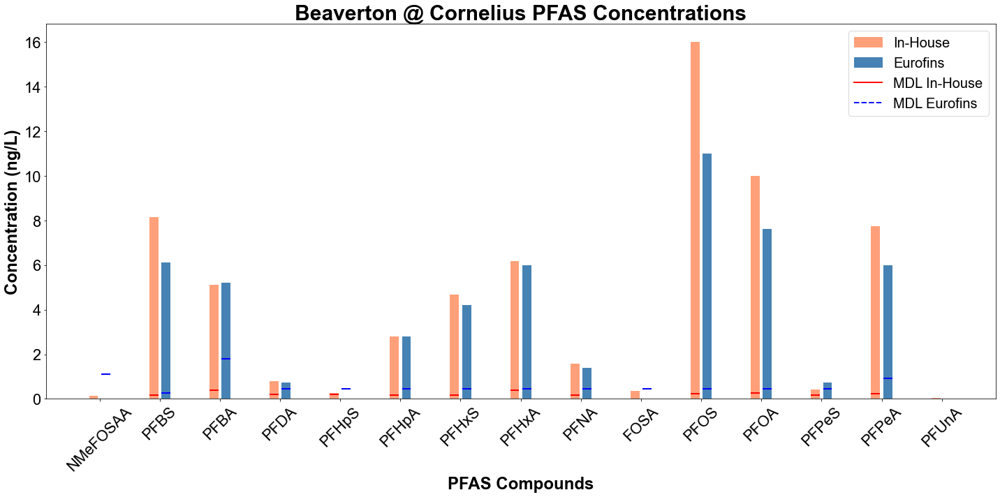

Processing location: Chicken @ Sholls-Sherwood


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


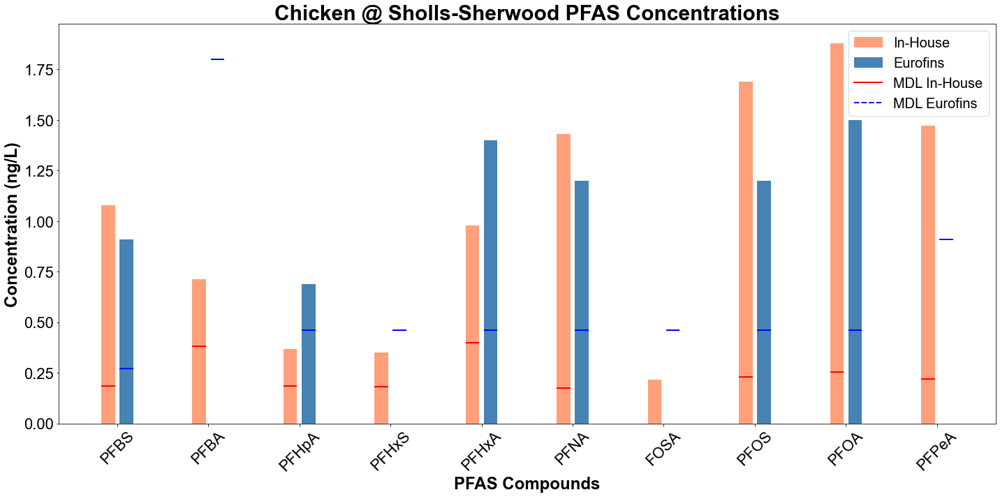

Processing location: Dairy @ Hwy 8


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


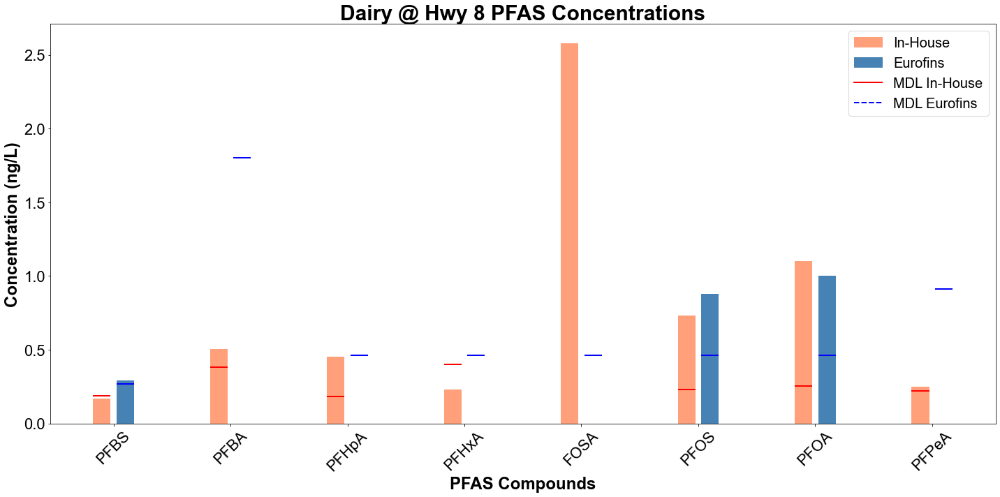

Processing location: Dawson @ Brookwood


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


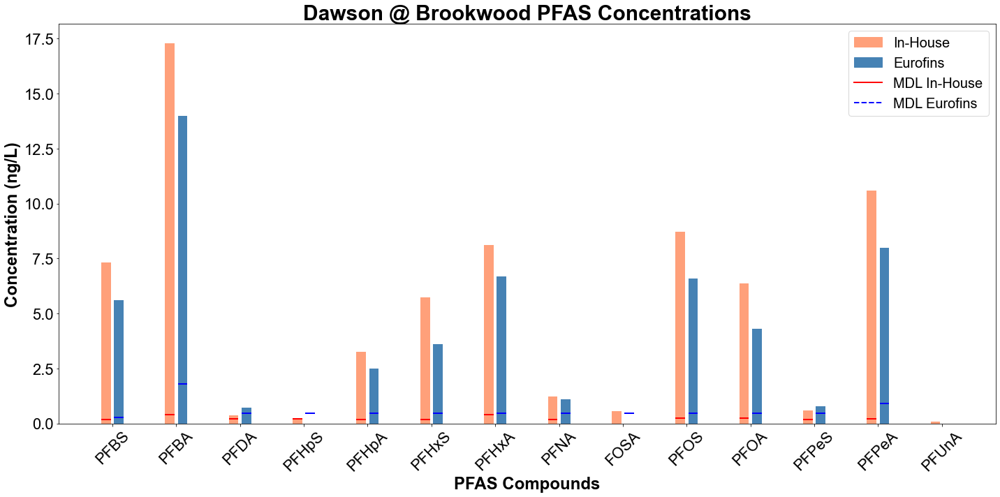

Processing location: Durham Effluent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


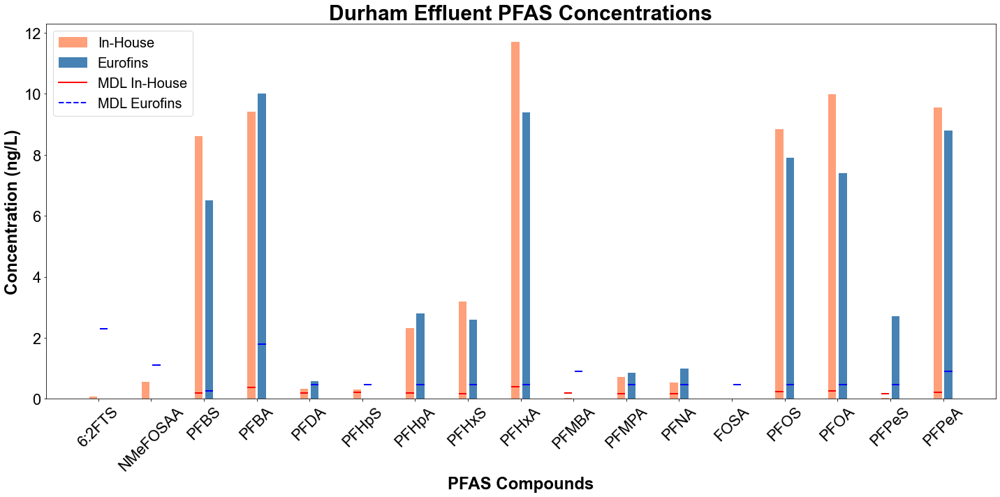

Processing location: Durham Influent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


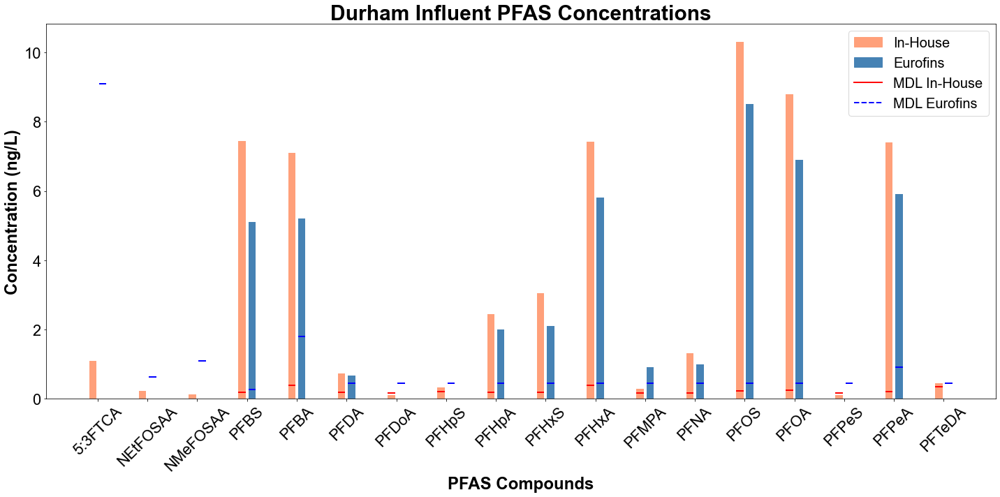

Processing location: Fanno @ Bohmann


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


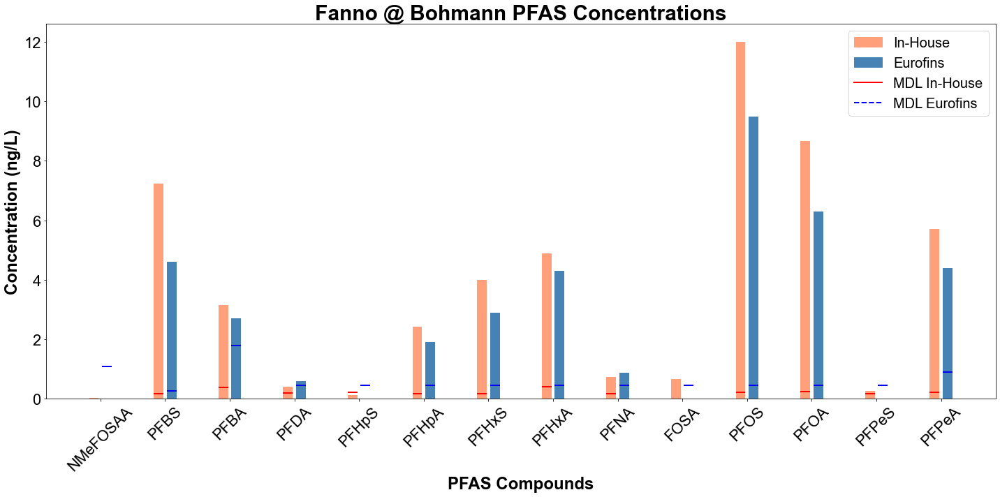

Processing location: Fanno @ Durham Park


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


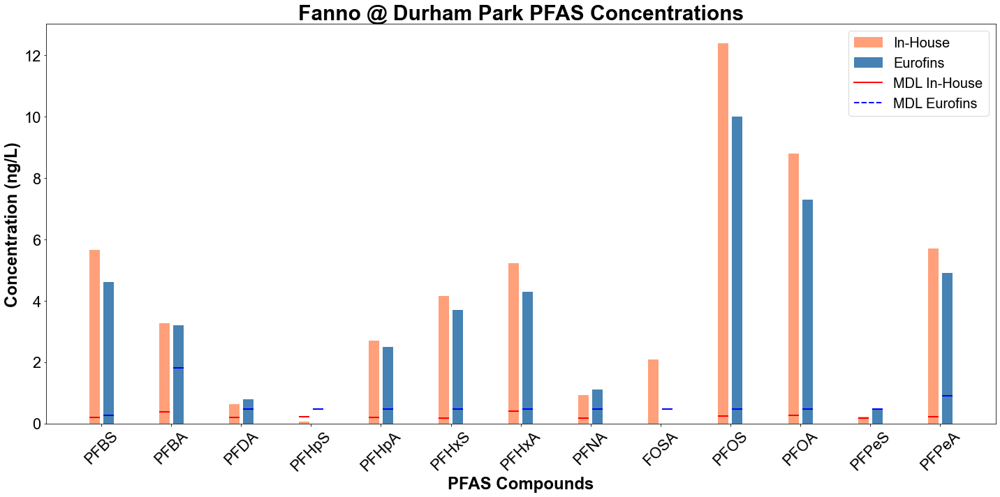

Processing location: Fanno @ SW 56th Ave


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


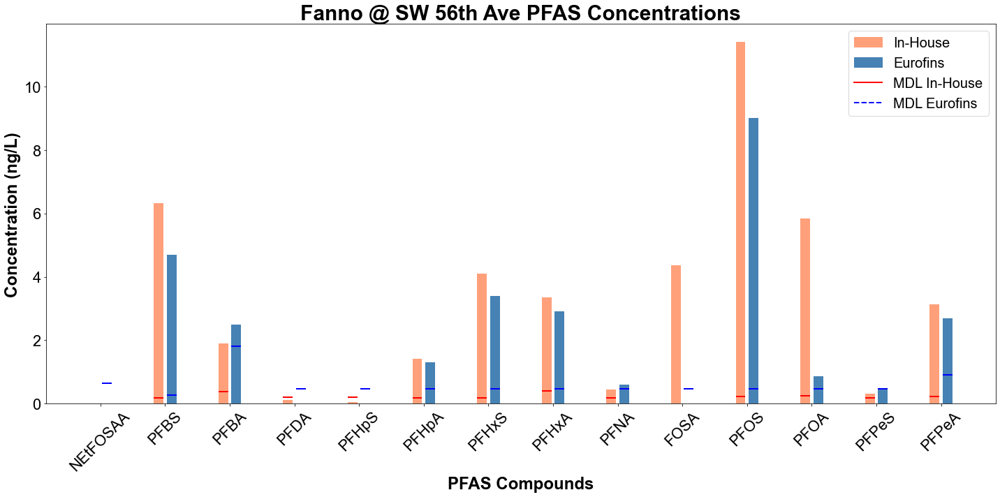

Processing location: Fanno @ SW Bonita Rd


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


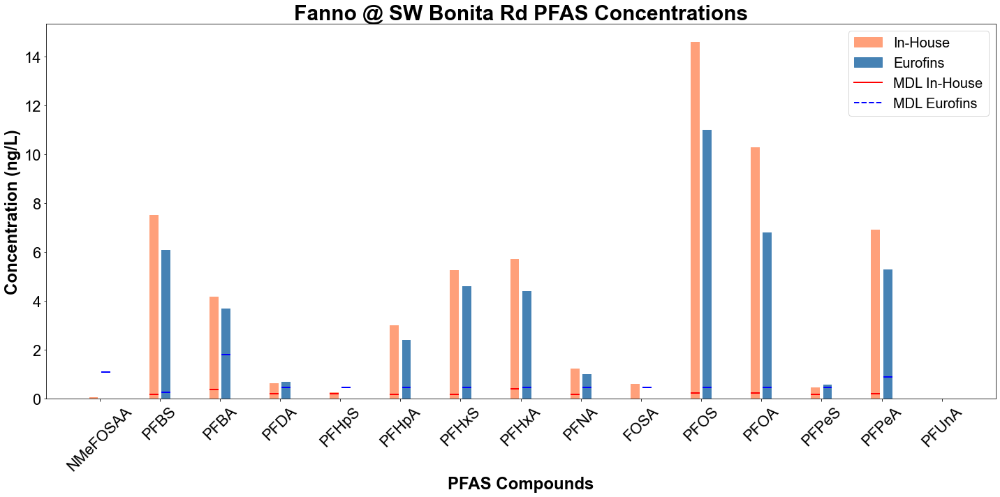

Processing location: Fanno @ SW Grant Ave


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


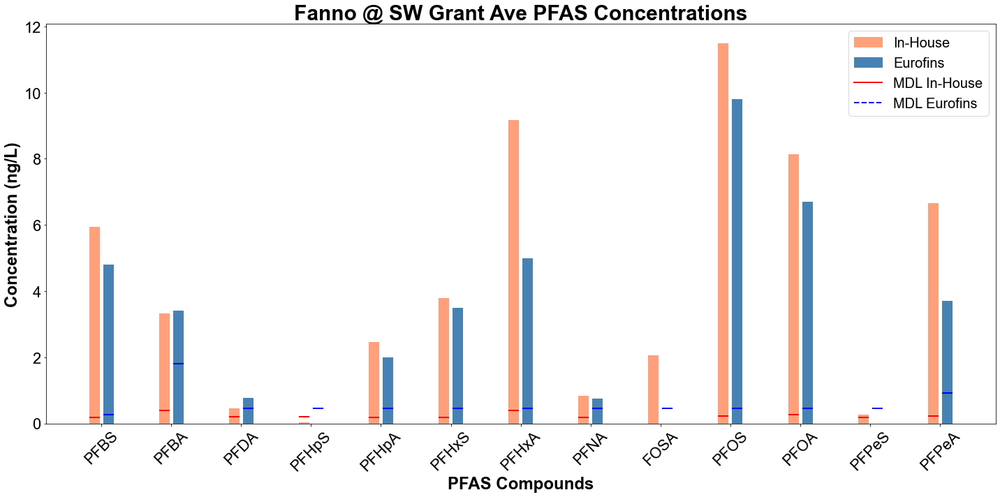

Processing location: Fanno @ SW North Dakota St


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


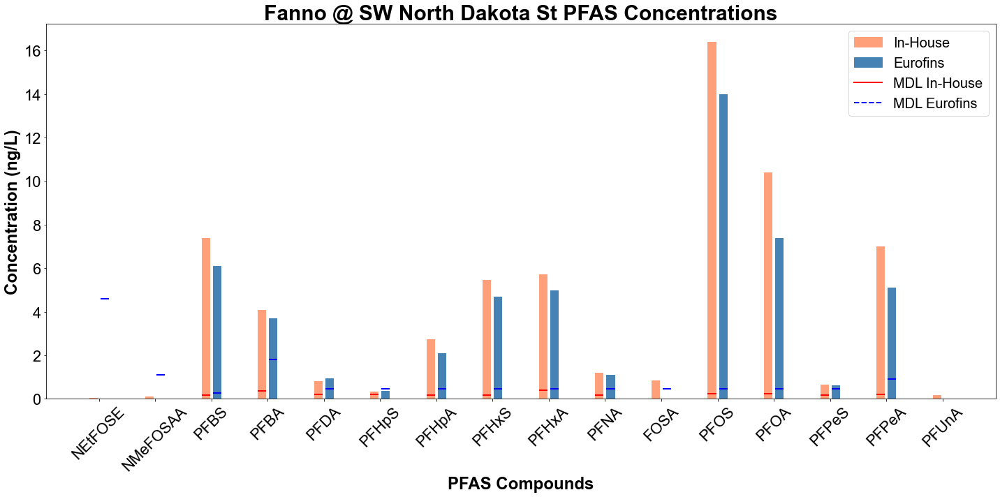

Processing location: Fanno at Durham Rd


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


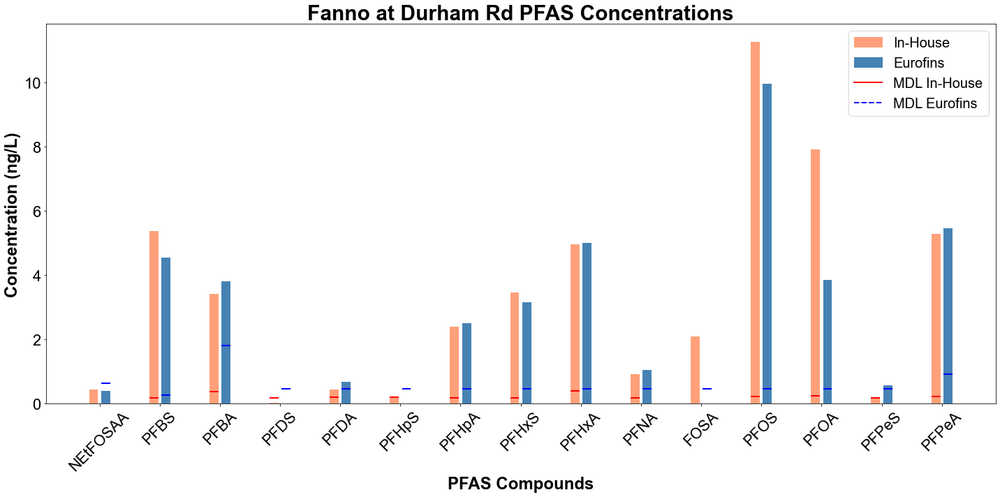

Processing location: Forest Grove Effluent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


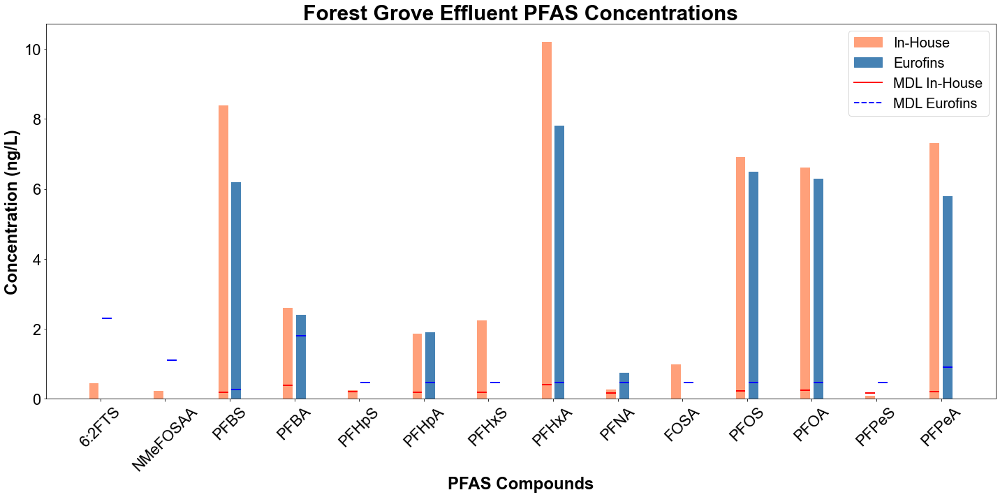

Processing location: Forest Grove Influent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


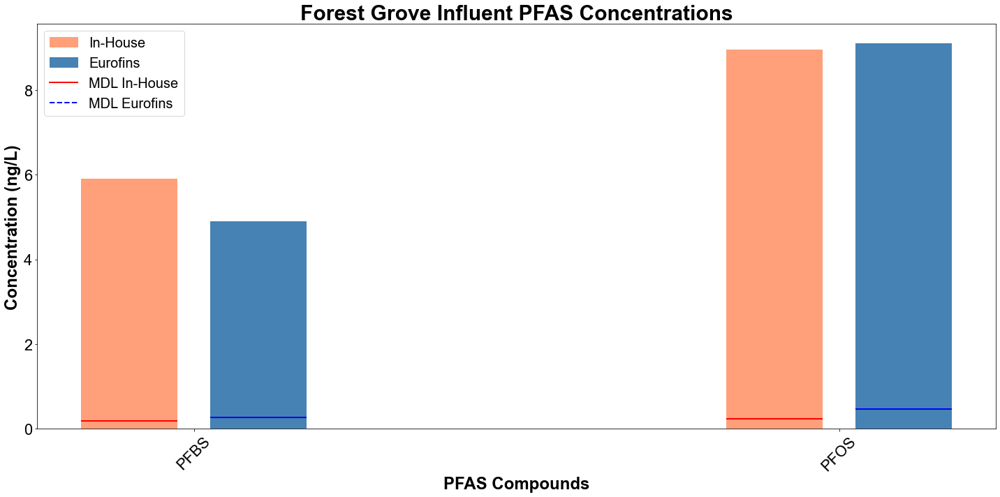

Processing location: Gales @ Stringtown


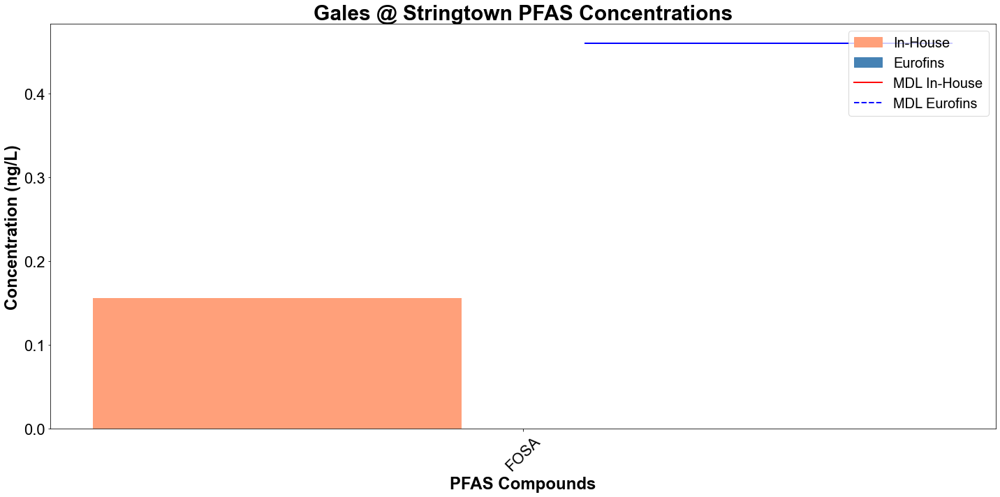

Processing location: Hillsboro Effluent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


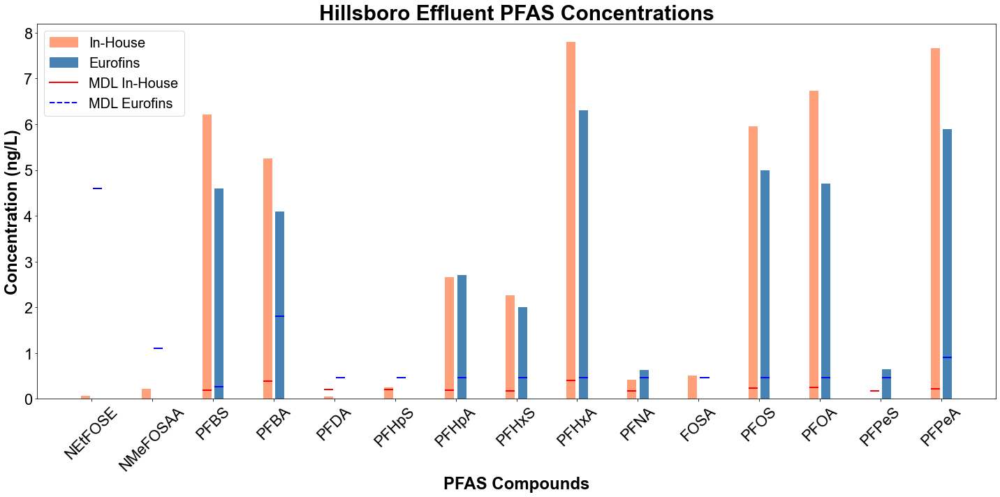

Processing location: Hillsboro Influent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


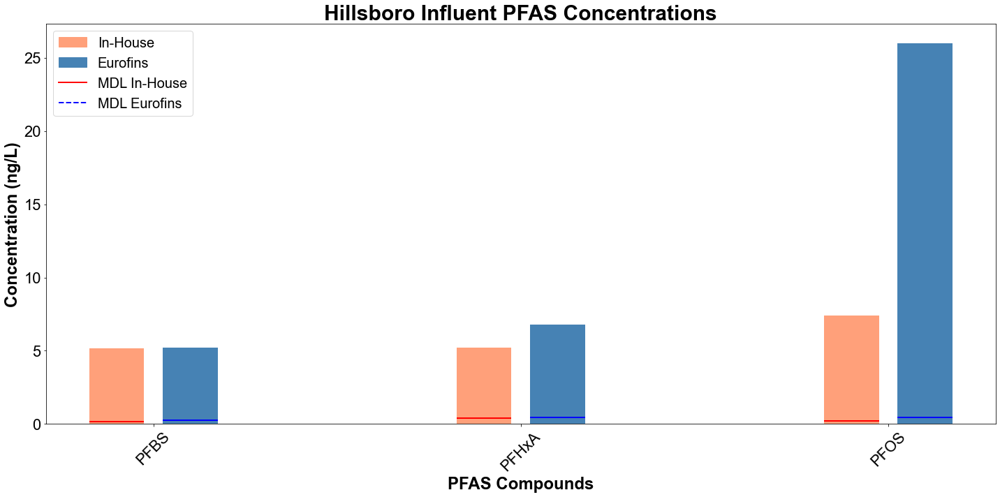

Processing location: Intel Aloha F15


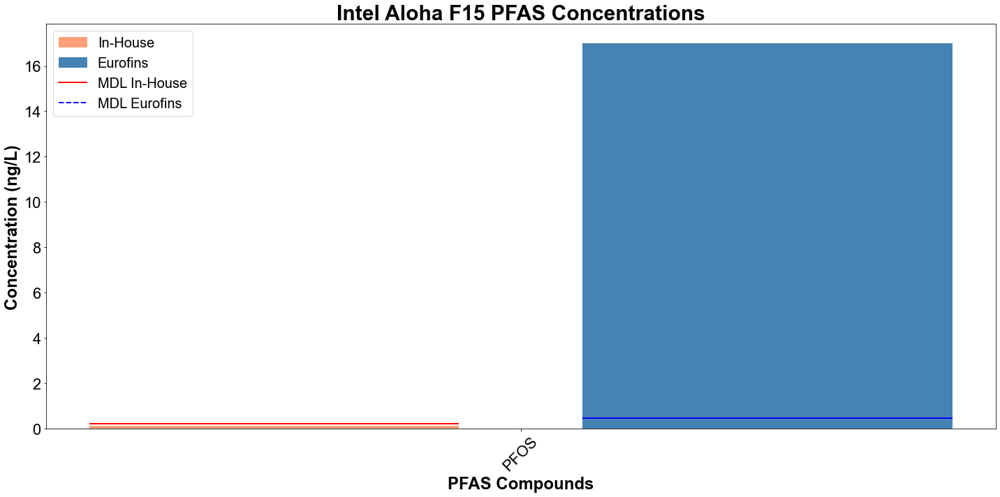

Processing location: Intel Ronler PAWN


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


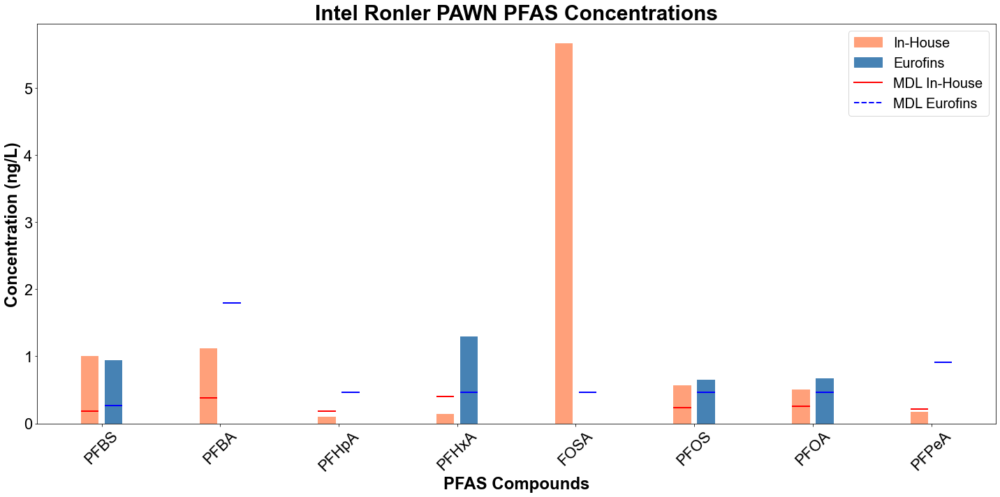

Processing location: Intel Ronler WATR


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


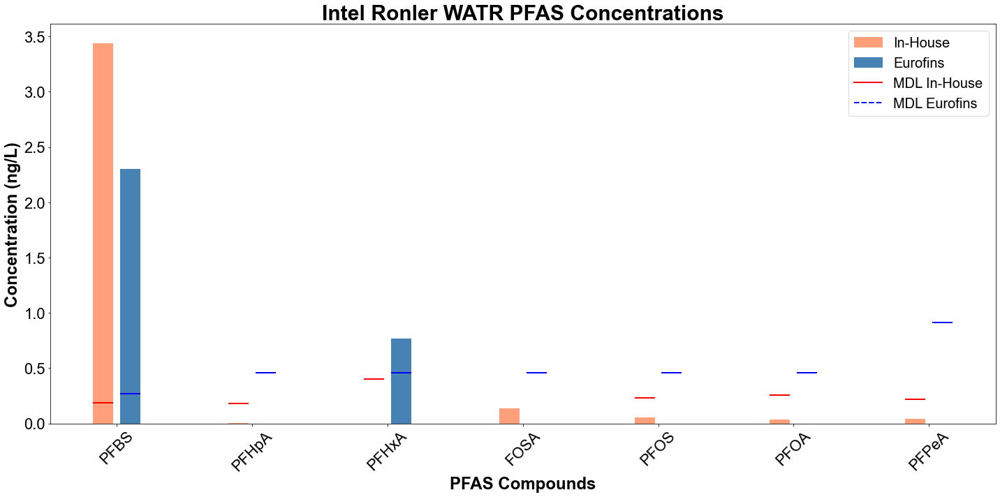

Processing location: International Paper
Index mismatch between In-House and Eurofins


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


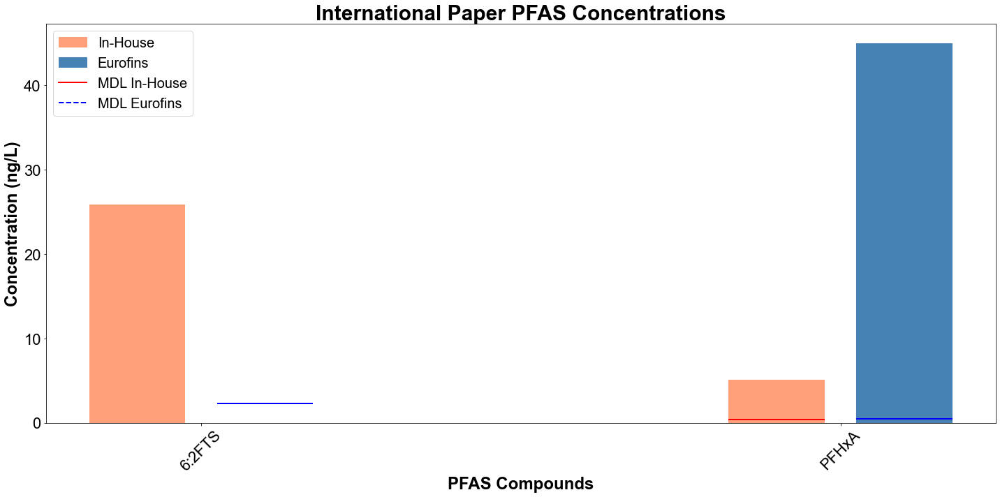

Processing location: Maxim (Analog)


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


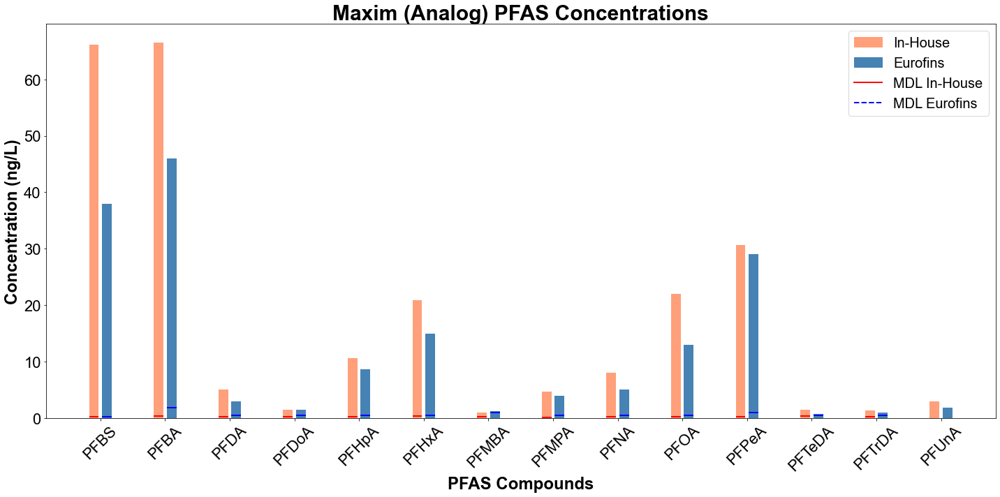

Processing location: McKay @ Padgett


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


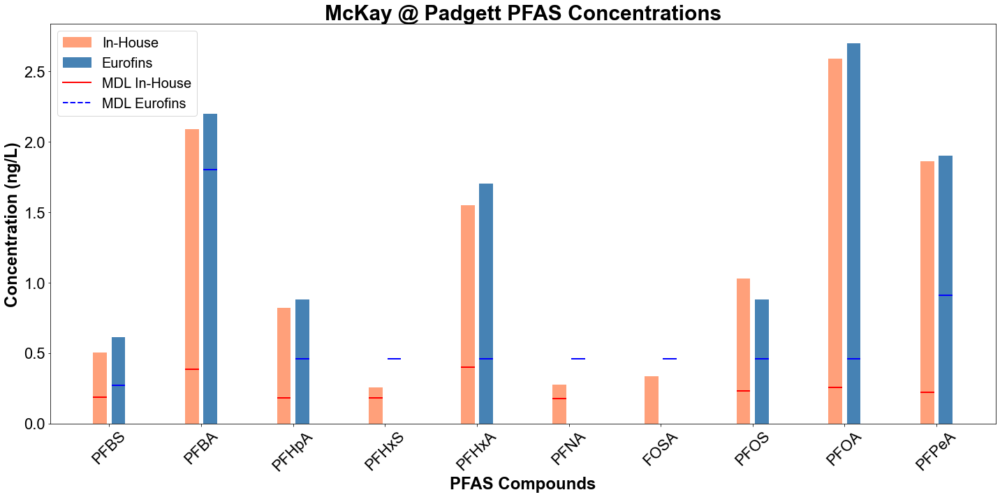

Processing location: Prudential Cleanroom


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


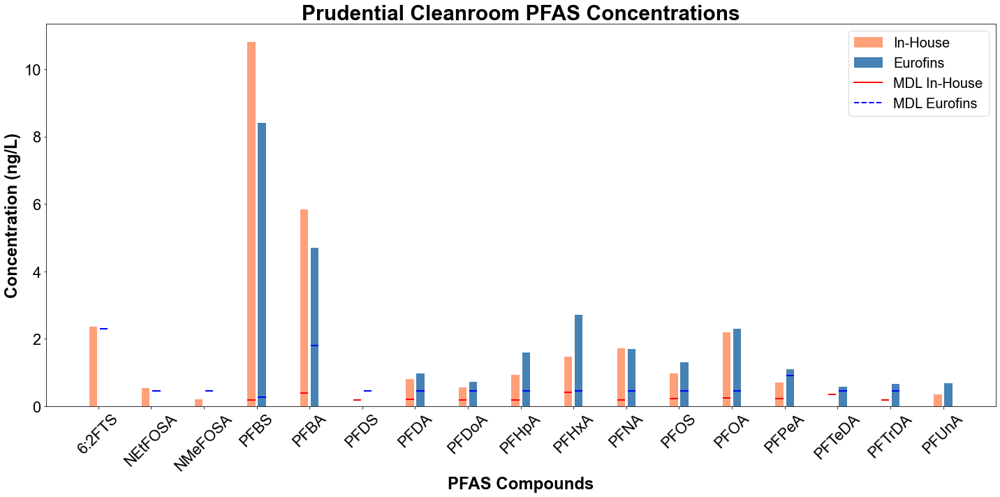

Processing location: Quantum Global


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


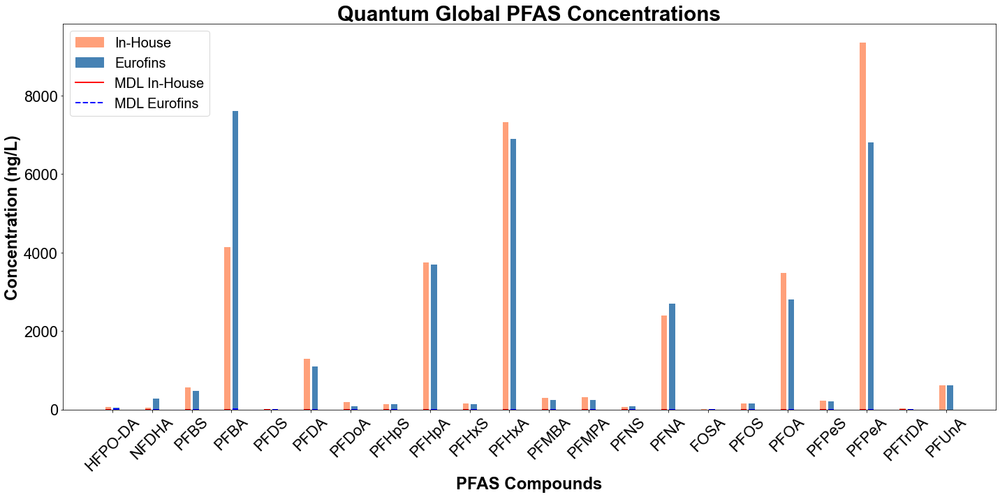

Processing location: Rock @ Brookwood


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


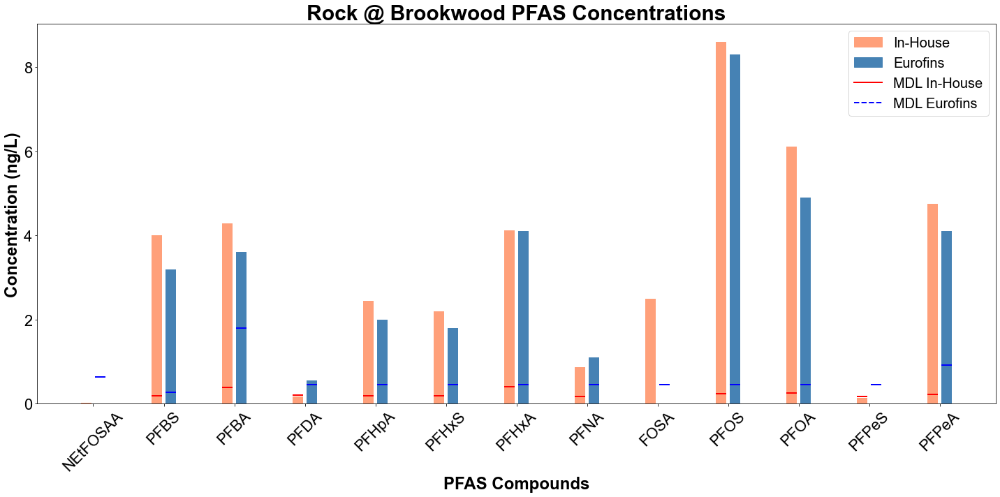

Processing location: Rock @ East Main St


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


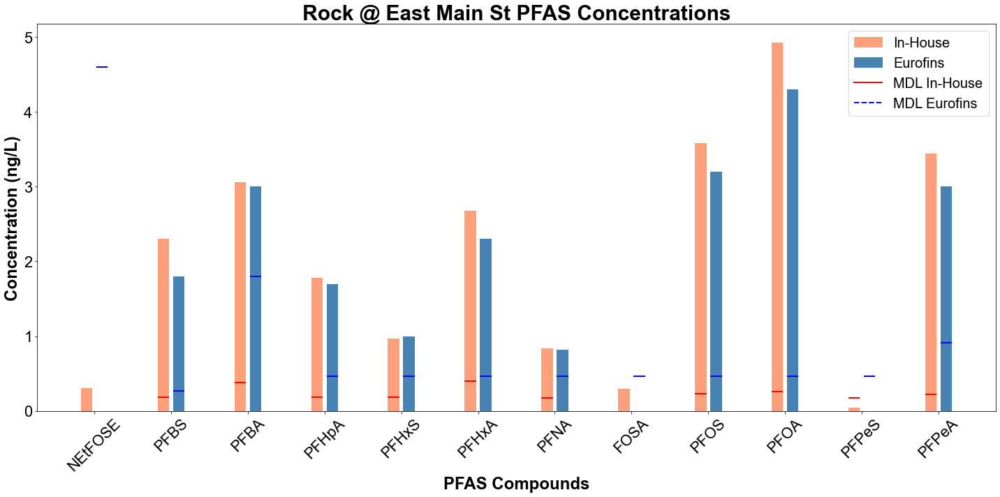

Processing location: Rock @ NE Cornelius Pass Rd


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


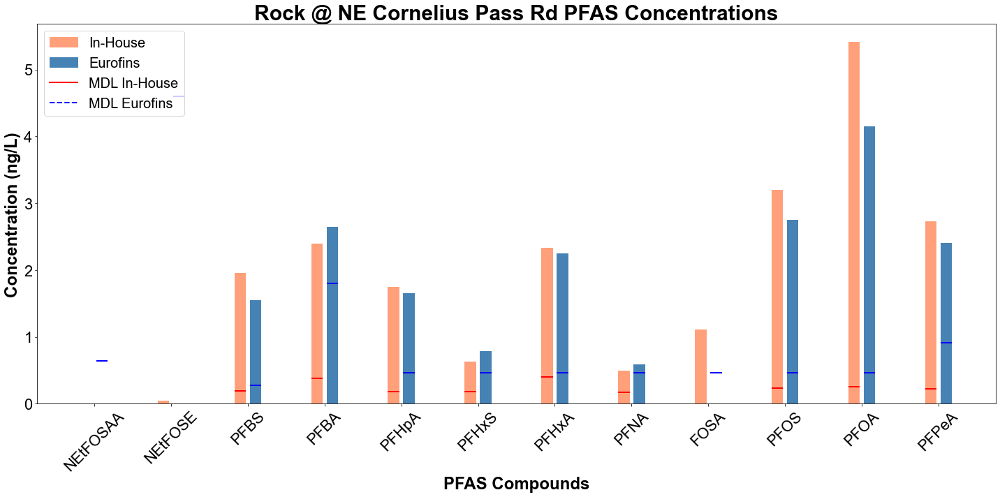

Processing location: Rock @ NW Old Cornelius Pass Rd


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


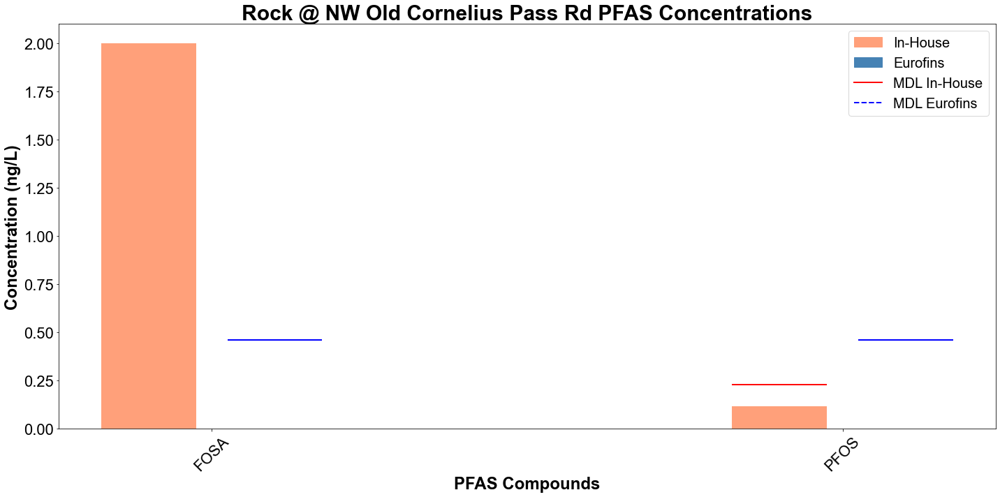

Processing location: Rock @ River Rd


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


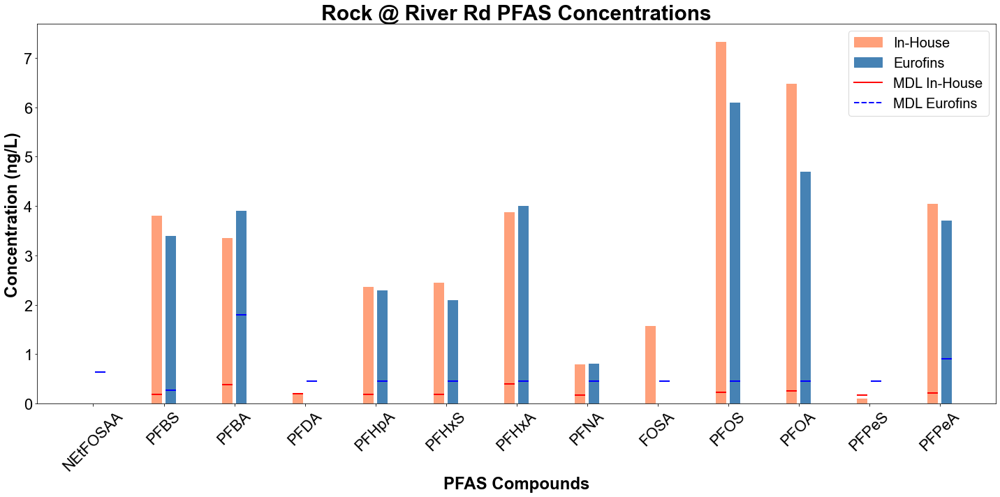

Processing location: Rock Creek Effluent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


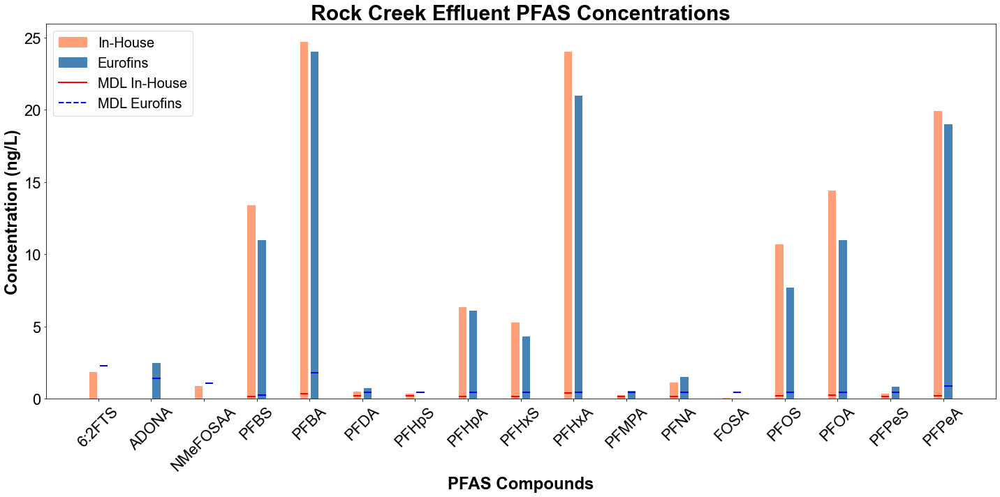

Processing location: Rock Creek Influent


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


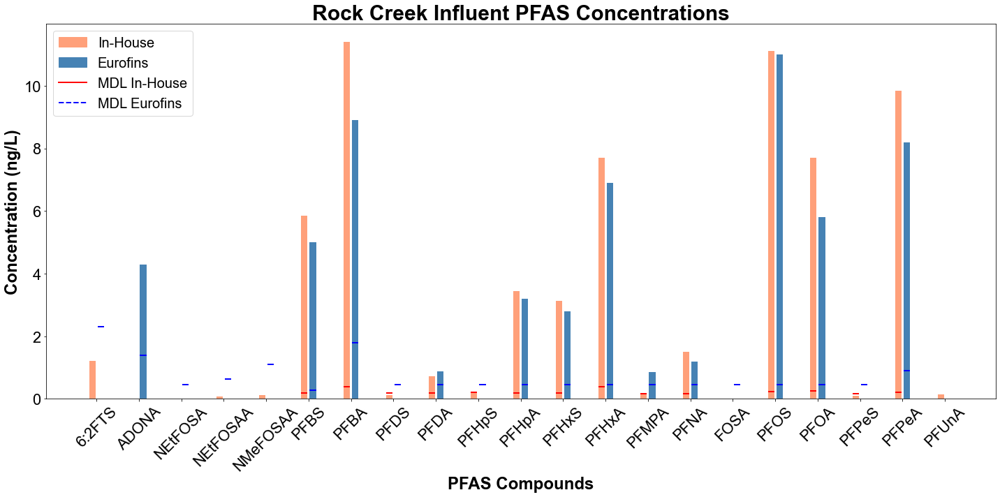

Processing location: Scoggins Below Hagg


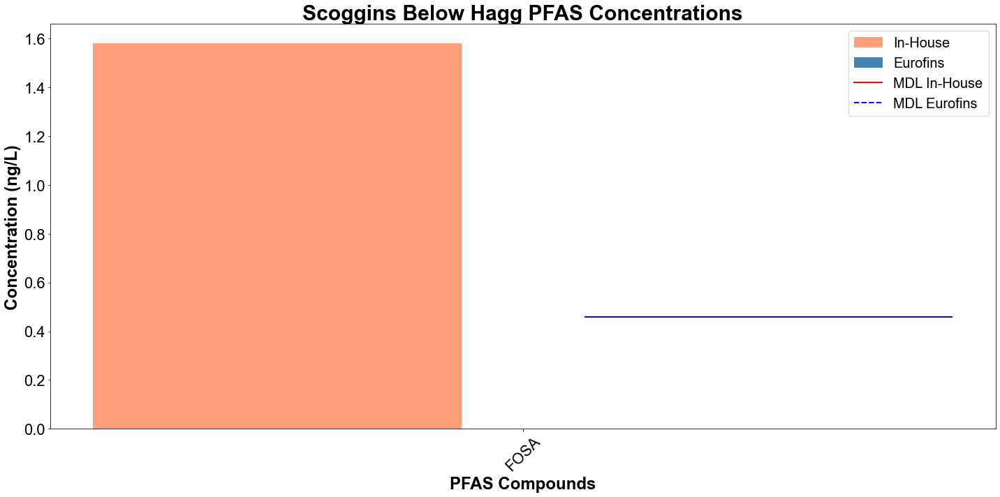

Processing location: Seals Unlimited Inc


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


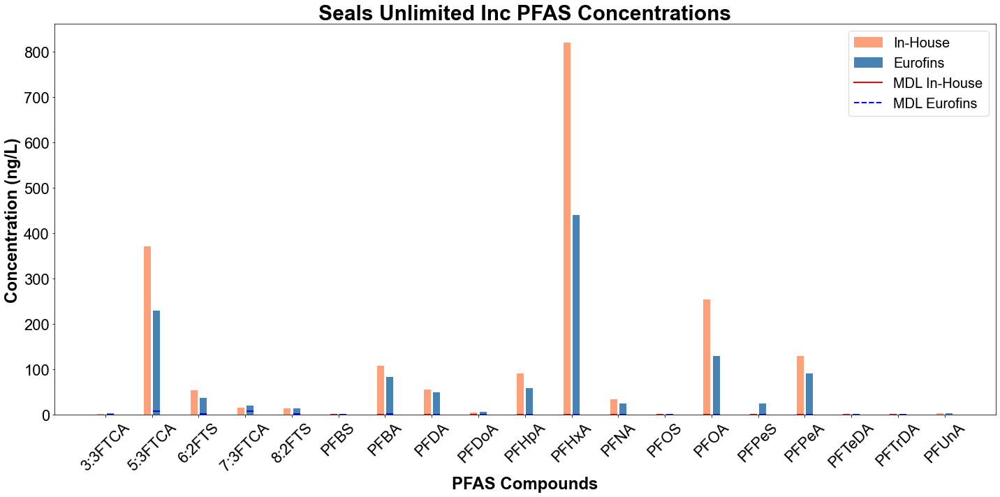

Processing location: TR @ Boones Ferry


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


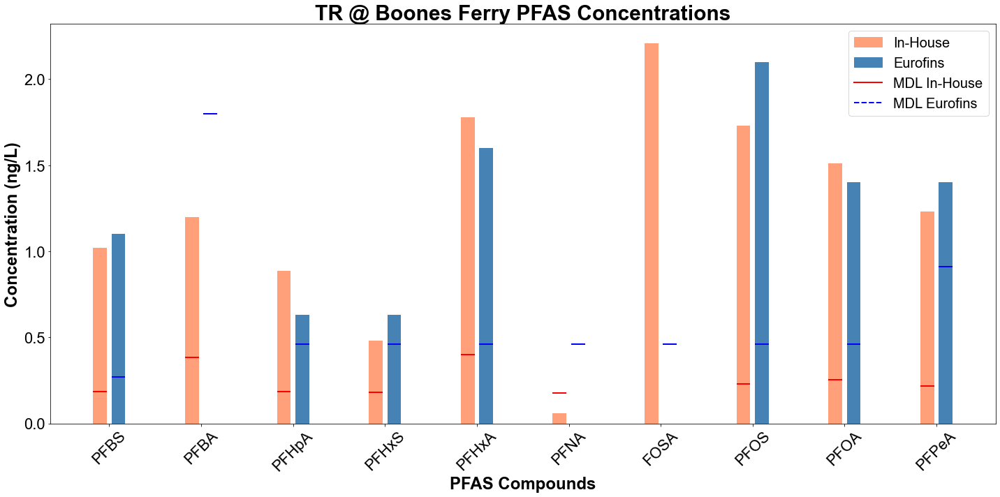

Processing location: TR @ Cherry Grove


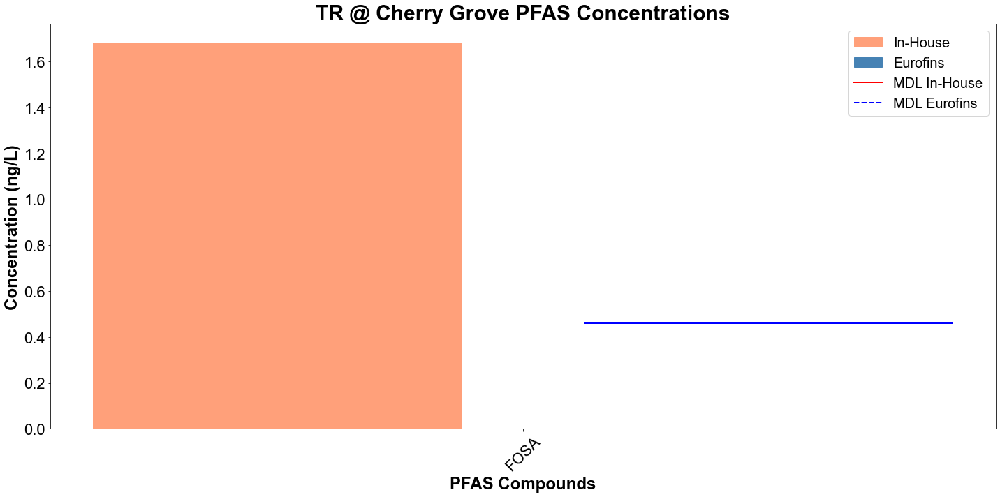

Processing location: TR @ Fernhill


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


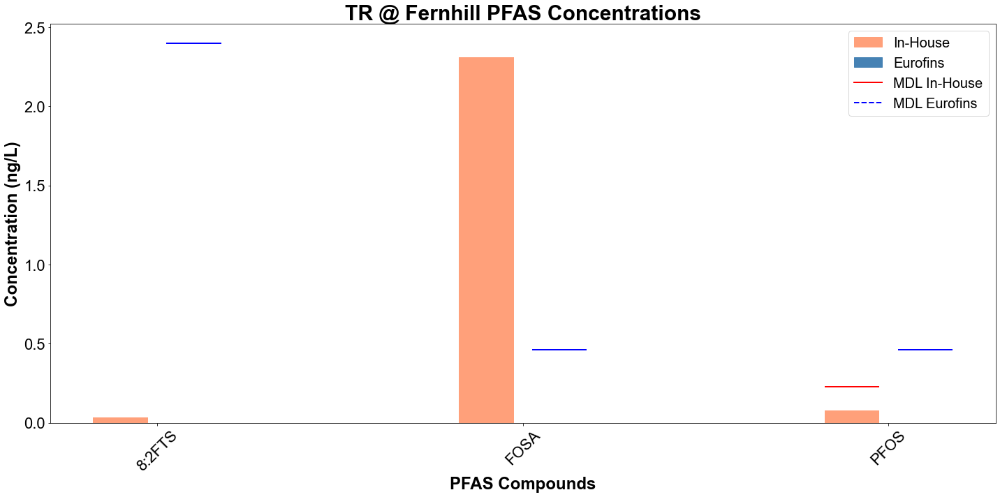

Processing location: TR @ Golf Course


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


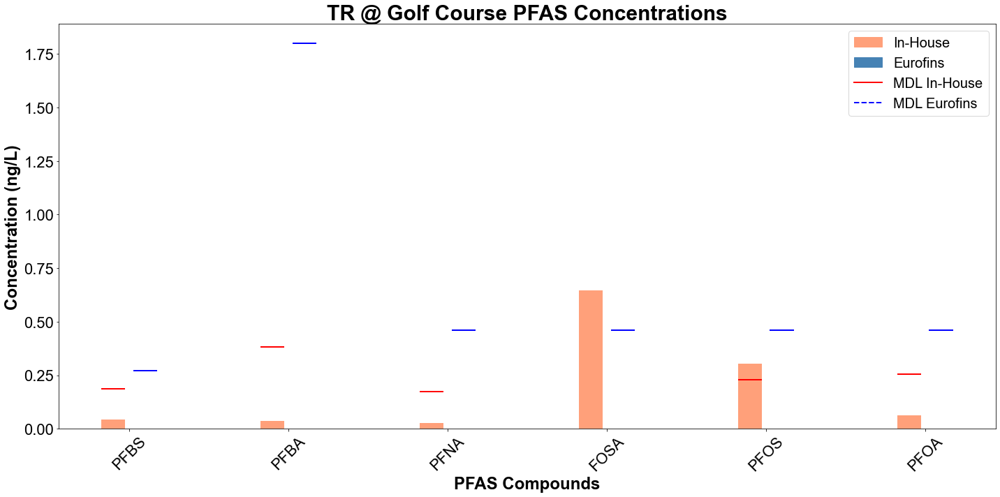

Processing location: TR @ Jurgens


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


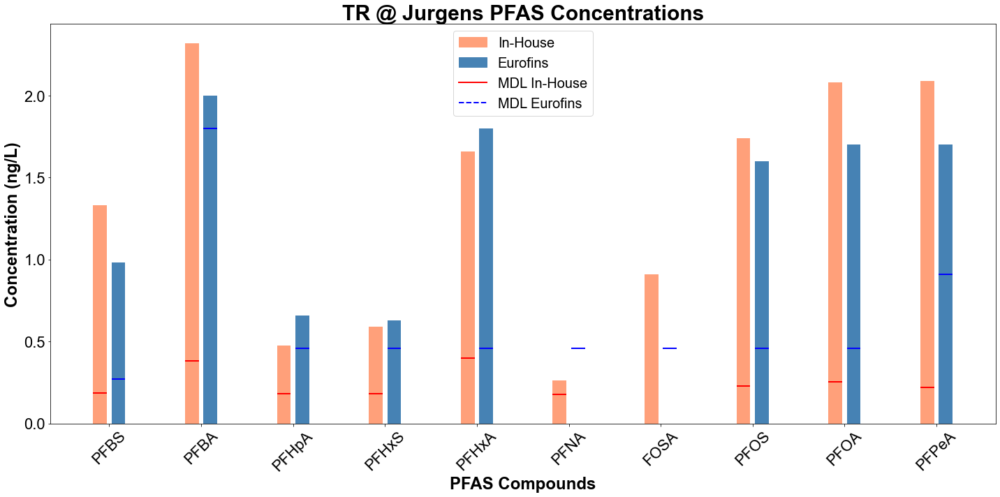

Processing location: Thomas Dairy Control Site Well


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


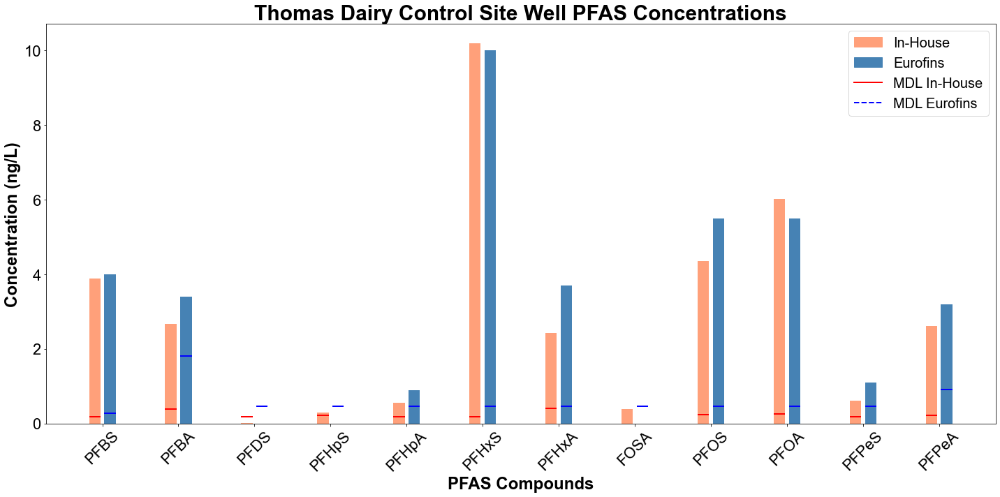

Processing location: Thomas Dairy Site 1 Well


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


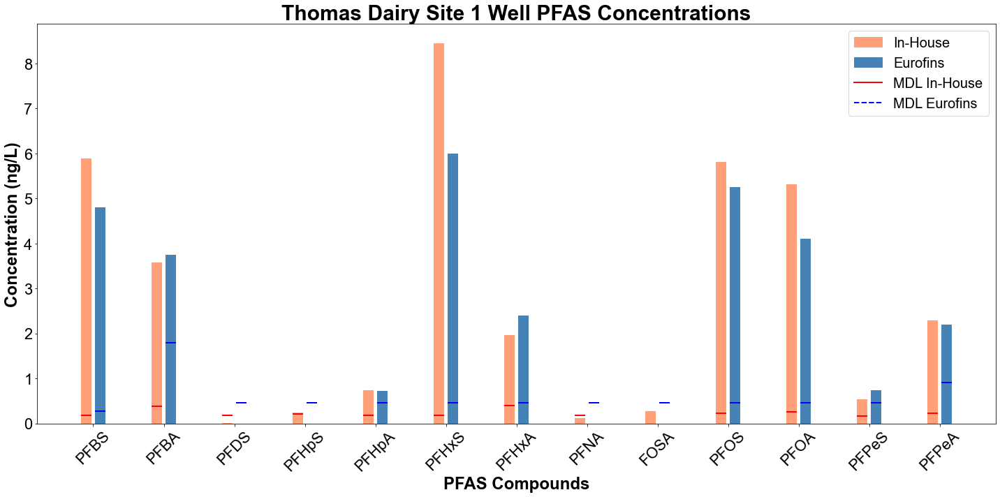

Processing location: Thomas Dairy Site 2 Well


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


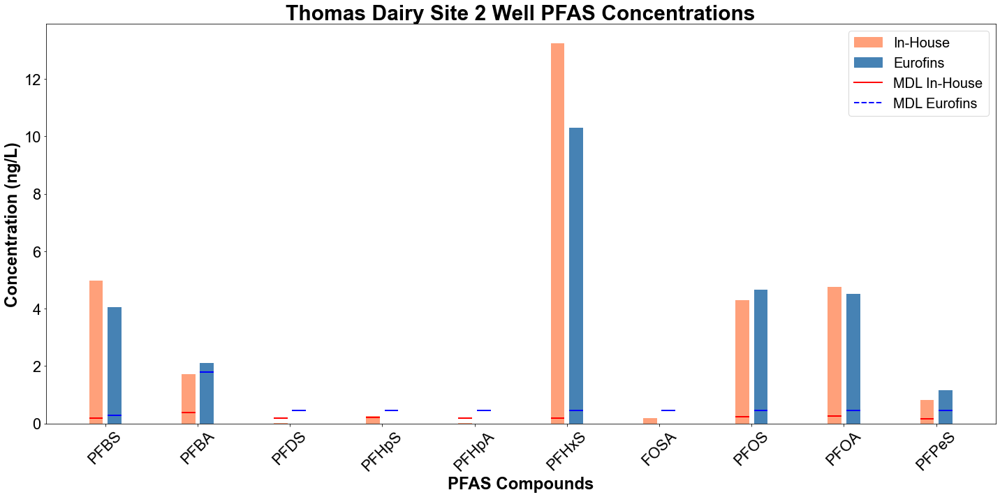

Processing location: Thomas Dairy Site 3 Well


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


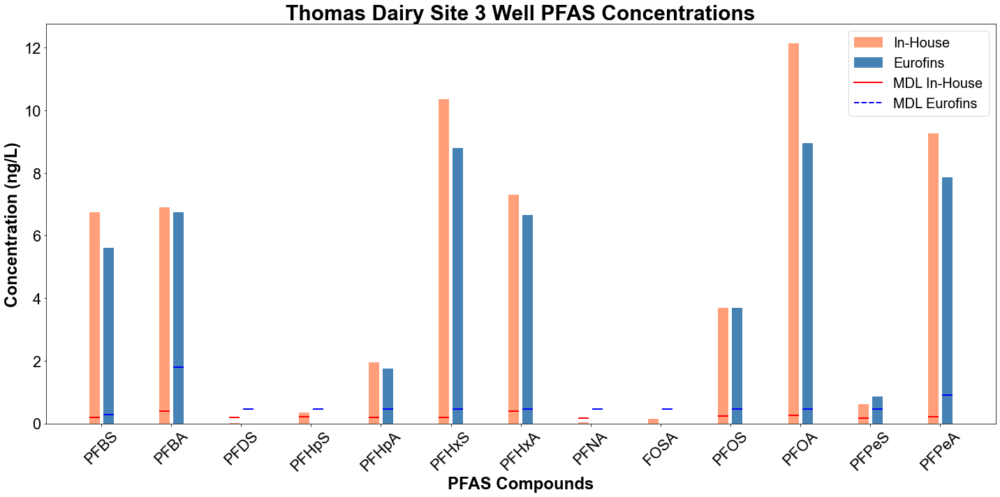

In [337]:
for location in filter_sample_location:
    process_and_plot_data_for_location(location, filtered_concat_df, filter_qual_summary, filter_pfas_compound, df_PFAS_Attributes,
                                       mdl_values_inhouse=MDLs_df_InHouse, mdl_values_eurofins=MDLs_df_abbrev)

## Individual Compounds First Batch vs Re-extracted Batch

#### Re-Load Data

In [18]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/Database as of 06-27-2024.xlsm'
#Specify sheet name
sheet_name = 'Unreportable PFAS Database'

#Call data import function
data_df_unreported = read_excel_sheet(excel_file_path, sheet_name)

data_df_unreported.head()

,Sampling point Date Component,Sample Number,Sampling Point,Sample Name,Sampled Date,Analysis,Component,Qualifiers,Result,Units,...,Pseudonym,Dominant Contributor,Sector,Depth,Edit Notes,Field,Notes,Region,Crop,Batch
0,BEAV@CNLUS-4/17/2024 9:10 AM-11Cl-PF3OUdS (Rep...,493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,11Cl-PF3OUdS (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
1,BEAV@CNLUS-4/17/2024 9:10 AM-3:3 FTCA (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,3:3 FTCA (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
2,BEAV@CNLUS-4/17/2024 9:10 AM-4:2 FTS (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,4:2 FTS (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
3,BEAV@CNLUS-4/17/2024 9:10 AM-5:3 FTCA (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,5:3 FTCA (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005
4,BEAV@CNLUS-4/17/2024 9:10 AM-6:2 FTS (Report),493581,BEAV@CNLUS,NaN,4/17/2024 9:10 AM,PFAS,6:2 FTS (Report),U,0.0,ppt_wt_v,...,NaN,Urban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PFAS00005


#### Import Other Data

In [19]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/temporary/Default MDLs.xlsx'
#Specify sheet name
sheet_name = 'Sheet1'

#Call data import function
MDLs_Eurofins_df = pd.read_excel(excel_file_path,sheet_name=sheet_name)

MDLs_Eurofins_df.head()

,MDL (ppt),PFBA,PFMPA,3:3FTCA,PFPeA,PFMBA,4:2FTS,NFDHA,PFBS,PFHxA,...,PFDS,PFTrDA,11Cl-PF3OUdS,FOSA,PFTeDA,PFDoS,NMeFOSE,NMeFOSA,NEtFOSE,NEtFOSA
0,Eurofins MDL,1.8,0.46,1.4,0.91,0.91,1.5,0.91,0.27,0.46,...,0.46,0.46,1.8,0.46,0.46,0.46,4.6,0.46,4.6,0.46
1,Eurofins RL,7.3,3.60,9.1,3.60,3.60,7.3,3.60,1.80,1.80,...,1.80,1.80,7.3,1.80,1.80,1.80,18.0,1.80,18.0,1.80


In [20]:
# Create a dictionary mapping PFAS Compounds to their corresponding Abbreviation 
pfas_mapping_Abbrev_long = dict(zip(df_PFAS_Attributes['Abbrev'], df_PFAS_Attributes['Database']))

In [21]:
MDLs_Eurofins_df.rename(columns=pfas_mapping_Abbrev_long, inplace=True)
MDLs_Eurofins_df.rename(columns={col: col.replace('TOP-', '') for col in MDLs_Eurofins_df.columns if 'TOP-' in col}, inplace=True)
MDLs_Eurofins_df

,MDL (ppt),Perfluorobutanoic acid,Perfluoromethoxypropoanoic acid,3:3 FTCA,Perfluoropentanoic acid,Perfluoromethoxybutanoic acid,4:2 Fluorotelomersulfonic acid,Nonafluorodioxaheptanoic acid,Perfluorobutanesulfonic acid,Perfluorohexanoic acid,...,Perfluorodecanesulfonic acid,Perfluorotridecanoic acid,11Cl-PF3OUdS,Perfluorooctanesulfonamide,Perfluorotetradecanoic acid,Perfluorododecanesulfonic acid,NMeFOSE,NMeFOSA,NEtFOSE,NEtFOSA
0,Eurofins MDL,1.8,0.46,1.4,0.91,0.91,1.5,0.91,0.27,0.46,...,0.46,0.46,1.8,0.46,0.46,0.46,4.6,0.46,4.6,0.46
1,Eurofins RL,7.3,3.60,9.1,3.60,3.60,7.3,3.60,1.80,1.80,...,1.80,1.80,7.3,1.80,1.80,1.80,18.0,1.80,18.0,1.80


In [22]:
# Example usage:

#Specify where the file is saved use '/' instead of '\'
excel_file_path = 'U:/Research_and_Innovation/_ModellingGroupProjects/PFAS Investigations/Data and analysis/temporary/In-House MDLs 500 mL sample.xlsx'
#Specify sheet name
sheet_name = 'MDL Connie 500 mL'

#Call data import function
MDLs_df_InHouse= pd.read_excel(excel_file_path,sheet_name=sheet_name,skiprows=8,usecols='D:AR')
MDLs_df_InHouse=MDLs_df_InHouse.iloc[0:1]
MDLs_df_InHouse

,MDL (ppt),11Cl-PF3OUdS,3:3 FTCA,4:2 FTS,5:3 FTCA,6:2 FTS,7:3 FTCA,8:2 FTS,9Cl-PF3ONS,DONA,...,PFNA,PFNS,PFOA,PFOS,PFOSA,PFPeA,PFPeS,PFTeDA,PFTrDA,PFUnDA
0,MDL (500 mL volume),0.442537,0.737491,0.500361,2.644879,0.620513,2.900641,0.910022,0.600943,0.51457,...,0.175015,0.185435,0.254285,0.229676,0.206042,0.21826,0.170847,0.357689,0.191654,0.18871


#### Functions

In [61]:
def create_pivot_table_from_dataframe(data_df, filter_qual_summary=None, filter_sample_location=None, filter_type=None, filter_pfas_compound=None, aggfunc='mean'):
    """
    Create a pivot table from a given DataFrame with specified filters and calculate the specified aggregation function
    for each PFAS Compound and Type.

    Args:
        data_df (pd.DataFrame): The DataFrame containing the data.
        filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
        filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).
        filter_type (list of str, optional): List of 'Type' values to filter the data (default is None).
        filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
        aggfunc (str, optional): The aggregation function to apply to the values in the pivot table (default is 'mean').
            Supported values: 'mean', 'count', 'std' (standard deviation), 'sum', 'min', 'max', 'median'.

    Returns:
        pd.DataFrame: The pivot table with specified aggregation function applied to the values.
    """
    try:
        # Apply filters based on specified columns
        filtered_data = data_df
        if filter_qual_summary:
            filtered_data = filtered_data[filtered_data['Qual Summary (Grade for filtering)'].isin(filter_qual_summary)]

        if filter_sample_location:
            filtered_data = filtered_data[filtered_data['Sample Location'].isin(filter_sample_location)]

        if filter_type:
            filtered_data = filtered_data[filtered_data['Type'].isin(filter_type)]
        # Convert numpy array to list if it's not already a list
        if isinstance(filter_pfas_compound, np.ndarray):
            filter_pfas_compound = filter_pfas_compound.tolist()
        if filter_pfas_compound:
            filtered_data = filtered_data[filtered_data['PFAS Compound'].isin(filter_pfas_compound)]

        # Create a pivot table with 'Type' as columns, 'PFAS Compound' as rows, and specified aggregation function as values
        pivot_table = pd.pivot_table(filtered_data, values='Quant Incl Estimates Incl Qual Flags',
                                     index='PFAS Compound', columns='Sample Location',
                                     aggfunc=aggfunc, fill_value=np.nan)

        return pivot_table

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [62]:
def calculate_error_pivot(average_pivot, std_dev_pivot, count_pivot):
    """
    Calculate error values for each column in the average pivot table using standard deviation and count.

    Args:
        average_pivot (pd.DataFrame): Pivot table with average values.
        std_dev_pivot (pd.DataFrame): Pivot table with standard deviation values.
        count_pivot (pd.DataFrame): Pivot table with count values.

    Returns:
        pd.DataFrame: A new pivot table with error values for each column in the average pivot.
    """
    try:
        # Calculate error by dividing standard deviation by the square root of count
        error_pivot = std_dev_pivot / np.sqrt(count_pivot)

        return error_pivot

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [66]:
def create_grouped_bar_chart_with_MDLs(avg_pivot_table, error_pivot_table, mdl_values_inhouse, mdl_values_eurofins, title=None, ylabel=None, figsize=None, colors=None):
    try:
        # Setup the plot
        fig, ax = plt.subplots(figsize=figsize or (10, 6))
        subgroups = avg_pivot_table.columns
        pfas_compounds = avg_pivot_table.index
        group_indices = np.arange(len(avg_pivot_table))
        bar_width = 0.15  # Width of each bar within a group
        gap = 0.05  # Gap between each group

        # Legend elements list
        legend_elements = []

        # Add custom bar handles for legend using Rectangle
        legend_elements.append(Rectangle((0, 0), 1, 1, color=colors['First Batch'], label='First Batch'))
        legend_elements.append(Rectangle((0, 0), 1, 1, color=colors['Re-Extracted'], label='Re-Extracted'))

        # Add custom MDL lines to legend elements
        legend_elements.append(Line2D([0], [0], color='black', lw=2, linestyle='-', label='MDL In-House'))

        # Plot bars and MDL lines
        for i, subgroup in enumerate(subgroups):
            x_positions = group_indices + i * (bar_width + gap)
            avg_values = avg_pivot_table[subgroup]
            error_values = error_pivot_table[subgroup]
            bar_color = colors.get(subgroup, 'grey')

            # Plot bars
            ax.bar(x_positions, avg_values, width=bar_width, color=bar_color, yerr=error_values, capsize=5)

            # Plot MDL lines for each compound
            for j, compound in enumerate(pfas_compounds):
                # In-House MDL line
                if compound in mdl_values_inhouse.columns and i == 0:
                    mdl_value_inhouse = mdl_values_inhouse[compound].iloc[0]
                    ax.hlines(mdl_value_inhouse, x_positions[j] - bar_width/2, x_positions[j] + bar_width/2, colors='black', linewidth=2)

                # Eurofins MDL line
                if compound in mdl_values_eurofins.columns and i == 1:
                    mdl_value_eurofins = mdl_values_eurofins[compound].iloc[0]
                    ax.hlines(mdl_value_eurofins, x_positions[j] - bar_width/2, x_positions[j] + bar_width/2, colors='black', linewidth=2)

        # Set plot details
        ax.set_xlabel('PFAS Compounds')
        ax.set_ylabel(ylabel or 'Average Concentration')
        ax.set_xticks(group_indices + (len(subgroups) - 1) * (bar_width + gap) / 2)
        ax.set_xticklabels(avg_pivot_table.index, rotation=45, ha='center')
        ax.set_title(title)

        # Add the legend
        ax.legend(handles=legend_elements, loc='best')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {str(e)}")


In [64]:
def concatenate_dataframes(df1, df2, label1='First Batch', label2='Re-Extracted'):
    print(f"Columns in {label1} DataFrame:", df1.columns)
    print(f"Columns in {label2} DataFrame:", df2.columns)
    try:
        if not df1.index.equals(df2.index):
            print(f"Index mismatch between {label1} and {label2}")
            # Align indices if necessary
            df1, df2 = df1.align(df2, join='outer', axis=0)  
        
        concatenated_df = pd.concat([df1, df2], axis=1)
        concatenated_df = concatenated_df.loc[~(concatenated_df == 0).all(axis=1)]
        return concatenated_df
    except Exception as e:
        print(f"Failed to concatenate {label1} and {label2}: {str(e)}")
        return None
    

def process_and_plot_data_for_location(location, concat_df, filter_qual_summary, filter_pfas_compound, df_PFAS_Attributes,mdl_values_inhouse, mdl_values_eurofins):
    # Filter based on the provided location
    filter_sample_location = [location]

    print(f"Processing location: {location}")

    # Create the average pivot tables
    Avg_Pivot_Old = create_pivot_table_from_dataframe(concat_df[concat_df['Batch']=='PFAS00001'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='mean')
    Avg_Pivot_New= create_pivot_table_from_dataframe(concat_df[concat_df['Batch']=='PFAS00007'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='mean')

    # Mapping PFAS Compounds to abbreviations
    pfas_mapping = dict(zip(df_PFAS_Attributes['Database'], df_PFAS_Attributes['Abbrev']))
    Avg_Pivot_Old.index = Avg_Pivot_Old.index.map(pfas_mapping)
    Avg_Pivot_New.index = Avg_Pivot_New.index.map(pfas_mapping)
    
    # Renaming columns
    Avg_Pivot_Old.columns = ['First Batch']
    Avg_Pivot_New.columns = ['Re-Extracted']

    # Concatenating dataframes
    Avg_Pivot = concatenate_dataframes(Avg_Pivot_Old, Avg_Pivot_New, label1='First Batch', label2='Re-Extracted')
    
    # Create the Count pivot tables
    Count_Pivot_Old = create_pivot_table_from_dataframe(concat_df[concat_df['Batch']=='PFAS00001'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='count')
    Count_Pivot_New = create_pivot_table_from_dataframe(concat_df[concat_df['Batch']=='PFAS00007'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='count')

    # Mapping PFAS Compounds to abbreviations
    Count_Pivot_Old.index = Count_Pivot_Old.index.map(pfas_mapping)
    Count_Pivot_New.index = Count_Pivot_New.index.map(pfas_mapping)
    
    # Renaming columns
    Count_Pivot_Old.columns = ['First Batch']
    Count_Pivot_New.columns = ['Re-Extracted']

    # Concatenating dataframes
    Count_Pivot_Old = Count_Pivot_Old.loc[Count_Pivot_Old.index.isin(Avg_Pivot.index)]
    Count_Pivot_New = Count_Pivot_New.loc[Count_Pivot_New.index.isin(Avg_Pivot.index)]
    Count_Pivot = concatenate_dataframes(Count_Pivot_Old, Count_Pivot_New, label1='First Batch', label2='Re-Extracted')


    # Create standard deviation pivot tables
    Std_Pivot_Old = create_pivot_table_from_dataframe(concat_df[concat_df['Batch']=='PFAS00001'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='std')
    Std_Pivot_New = create_pivot_table_from_dataframe(concat_df[concat_df['Batch']=='PFAS00007'], filter_qual_summary, filter_sample_location=[location], filter_pfas_compound=filter_pfas_compound, aggfunc='std')
    Std_Pivot_Old.index = Std_Pivot_Old.index.map(pfas_mapping)
    Std_Pivot_New.index = Std_Pivot_New.index.map(pfas_mapping)

    # Concatenating standard deviation dataframes
    #Std_Pivot = pd.concat([Std_Pivot_InHouse, Std_Pivot_Eurofins], axis=1)
    Std_Pivot = concatenate_dataframes(Std_Pivot_Old, Std_Pivot_New, label1='First-Batch', label2='Re-Extracted')


    # Error computation (placeholder function call here)
    Error_Pivot = calculate_error_pivot(Avg_Pivot, Std_Pivot,Count_Pivot)

    # Color dictionary
    colors_dict = {
        'First Batch': '#4682B4', 
        'Re-Extracted': '#FFA07A'
    }

    # Generate the bar chart
    create_grouped_bar_chart_with_MDLs(avg_pivot_table=Avg_Pivot, error_pivot_table=Error_Pivot,mdl_values_inhouse=mdl_values_inhouse,mdl_values_eurofins=mdl_values_eurofins, title=f'{location} PFAS Concentrations', colors=colors_dict, ylabel='Concentration (ng/L)', figsize=(20,10))


#### Filters & Settings

In [68]:
#filter_qual_summary (list of str, optional): List of 'Qual Summary (Grade for filtering)' values to filter the data (default is None).
filter_qual_summary = ['Good - unreportable','Good - Don\'t use - Re-extract']
#filter_sample_location (list of str, optional): List of 'Sample Location' values to filter the data (default is None).

#filter_type (list of str, optional): List of 'Type' values to filter the data (default is None).
filter_type = ['Ambient', 'Urban Creek']
#filter_pfas_compound (list of str, optional): List of 'PFAS Compound' values to filter the data (default is None).
filter_pfas_compound =data_df_unreported['PFAS Compound'].unique()

filter_sample_location= ['Rock @ Brookwood', 'Fanno at Durham Rd', 'Scoggins Below Hagg',
       'Dairy @ Hwy 8', 'TR @ Boones Ferry', 'TR @ Fernhill',
       'TR @ Cherry Grove', 'Rock @ River Rd',
       'Rock @ NE Cornelius Pass Rd', 'Rock @ NW Old Cornelius Pass Rd',
       'Fanno @ Durham Park', 'Fanno @ SW Grant Ave',
       'Fanno @ SW 56th Ave']


pfas_mapping = dict(zip(df_PFAS_Attributes['Database'], df_PFAS_Attributes['Abbrev']))

#### Create Plots

Processing location: Rock @ Brookwood
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


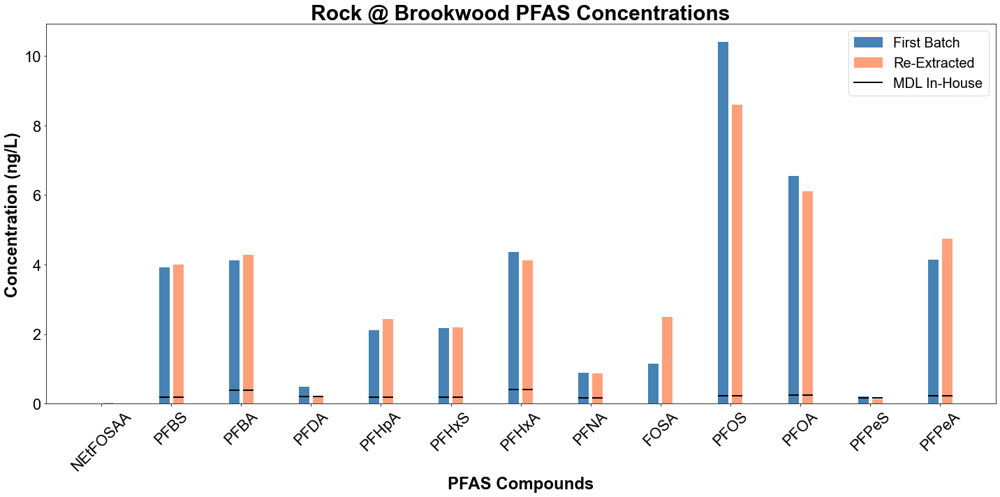

Processing location: Fanno at Durham Rd
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


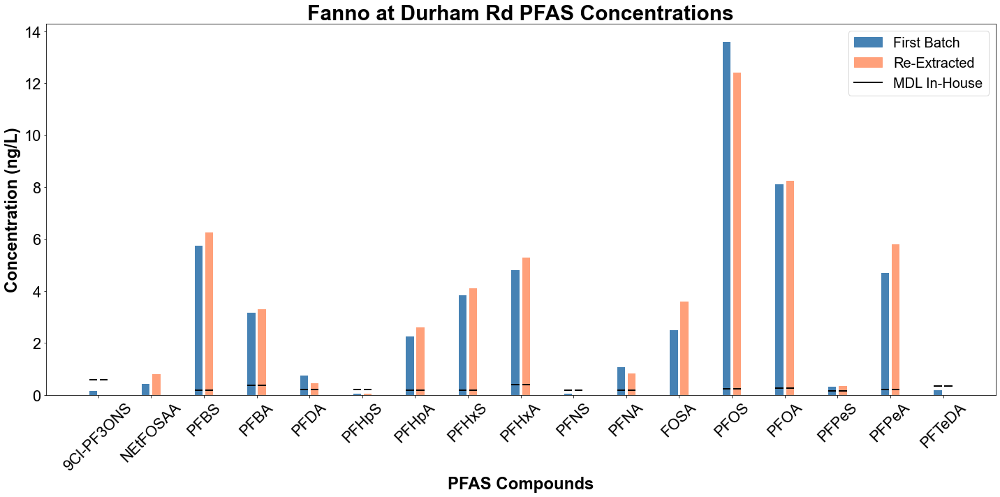

Processing location: Scoggins Below Hagg
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


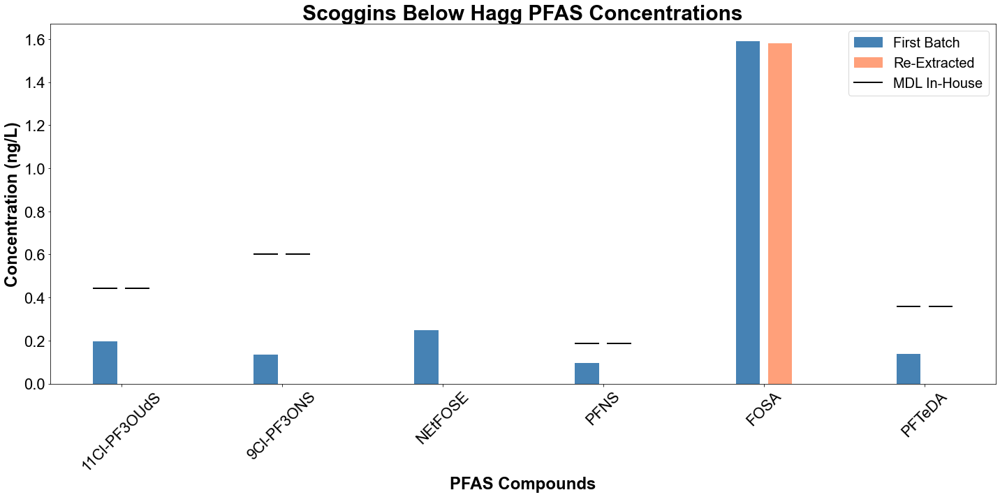

Processing location: Dairy @ Hwy 8
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


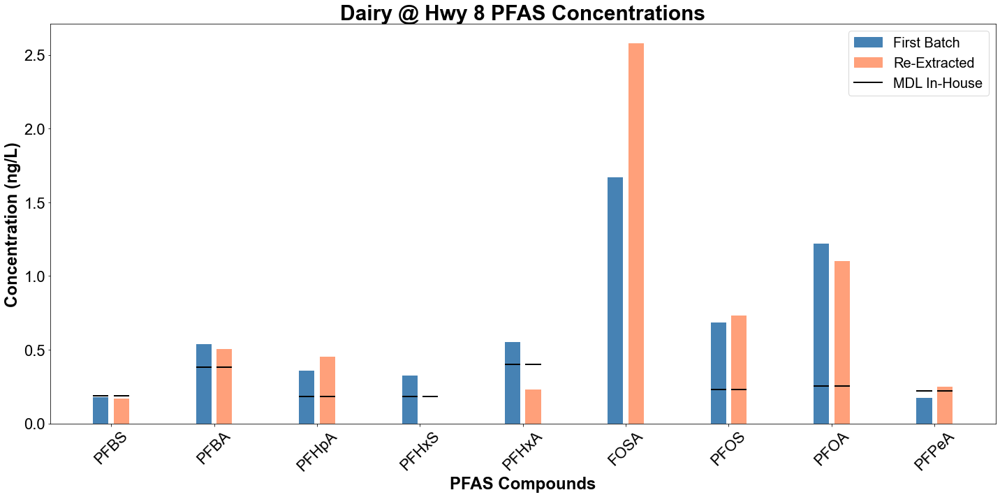

Processing location: TR @ Boones Ferry
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


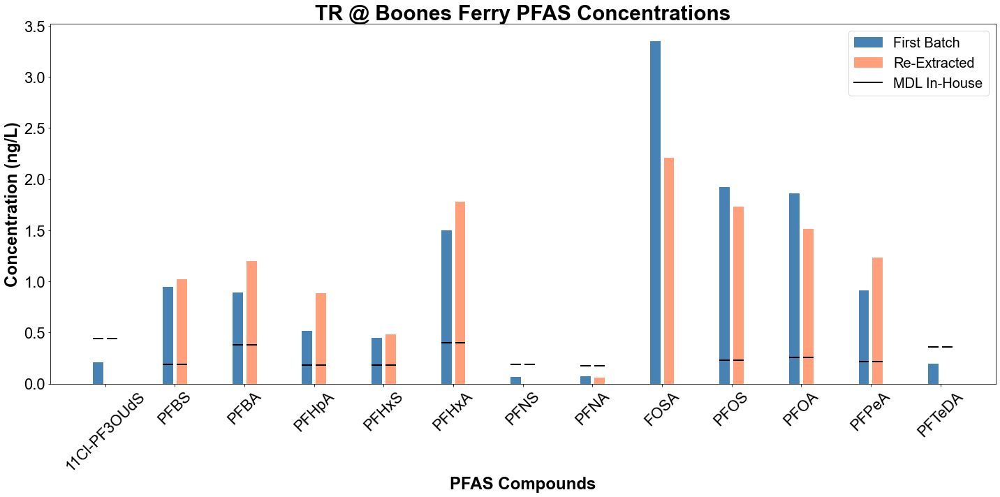

Processing location: TR @ Fernhill
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


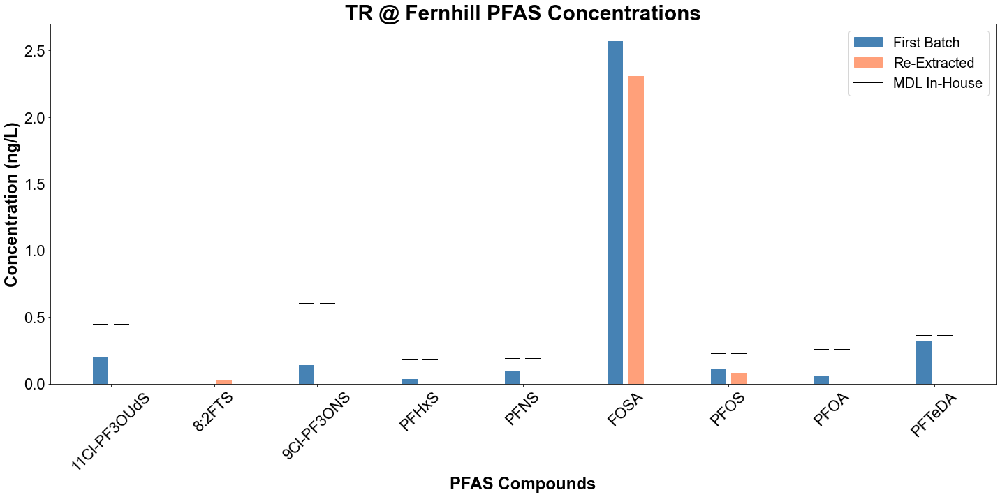

Processing location: TR @ Cherry Grove
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


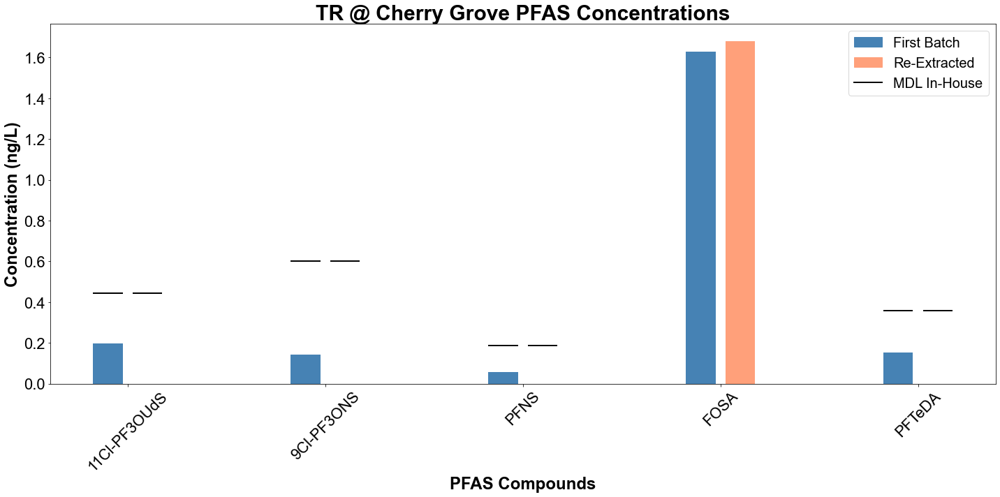

Processing location: Rock @ River Rd
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


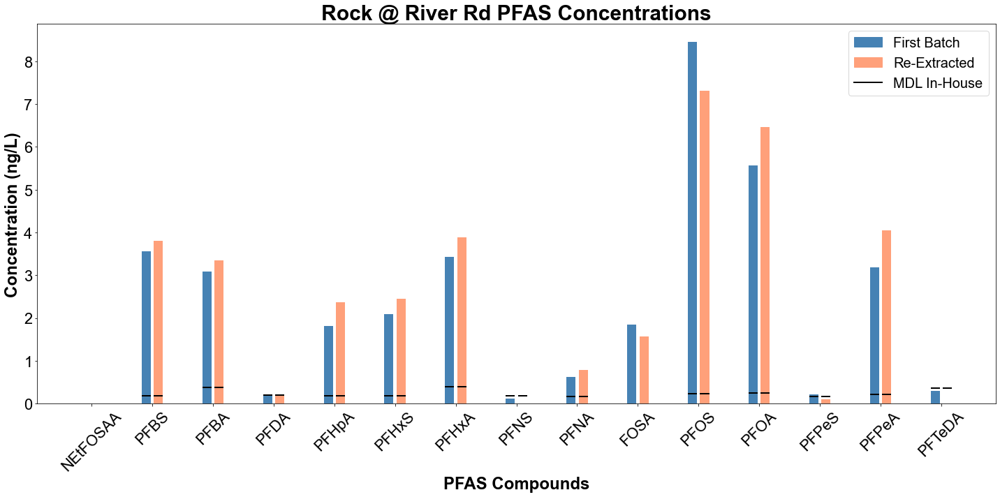

Processing location: Rock @ NE Cornelius Pass Rd
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


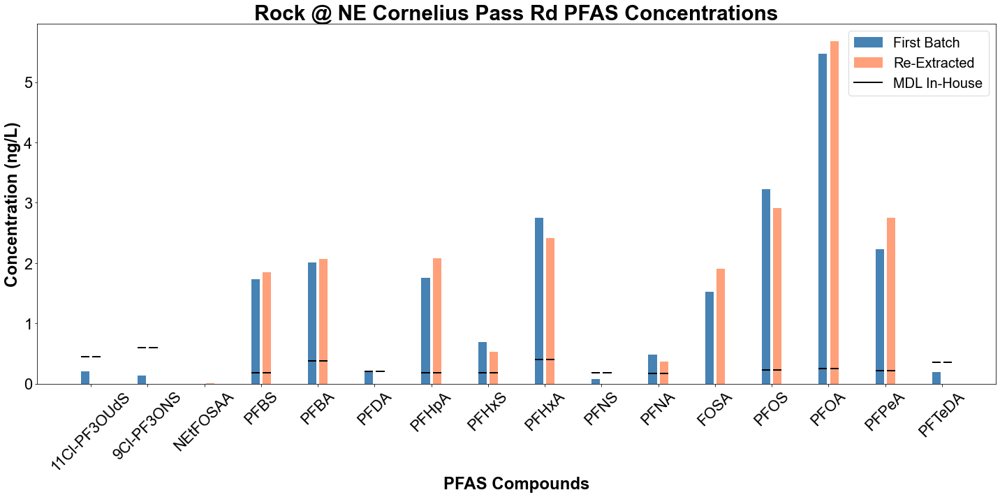

Processing location: Rock @ NW Old Cornelius Pass Rd
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


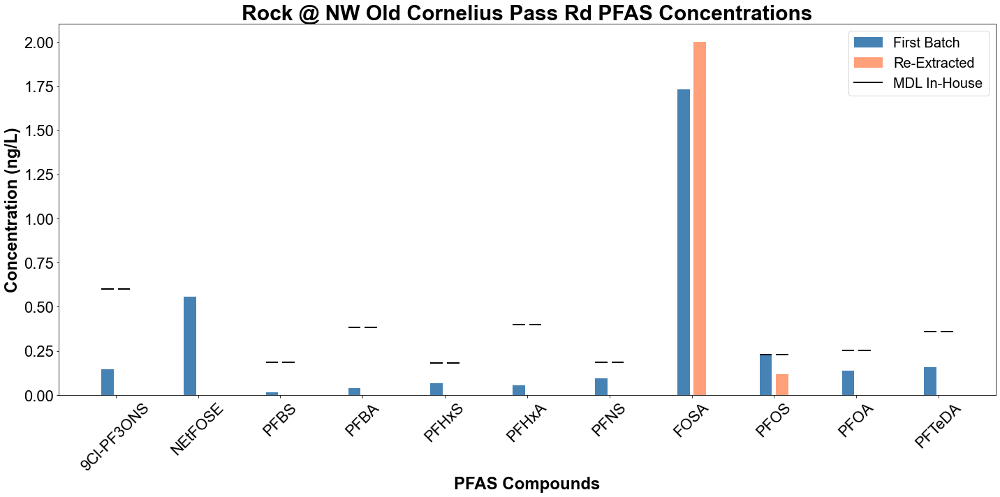

Processing location: Fanno @ Durham Park
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


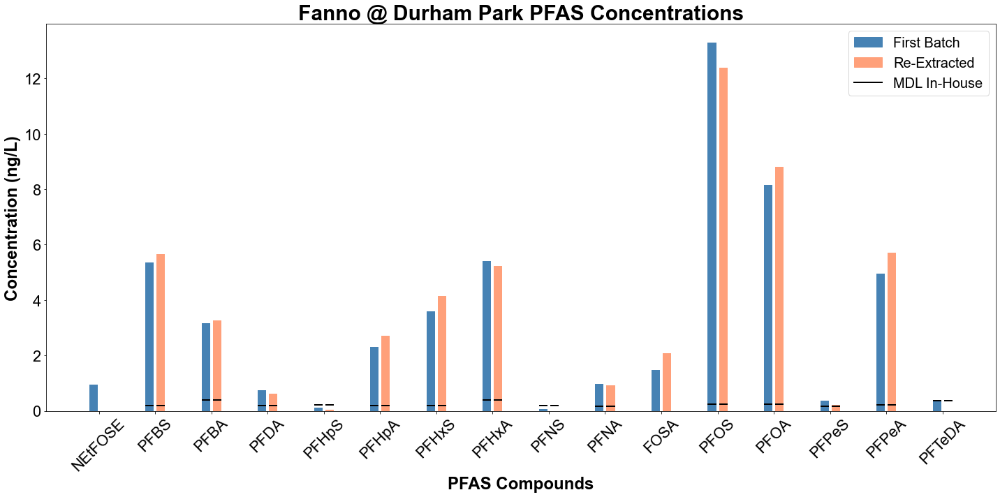

Processing location: Fanno @ SW Grant Ave
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


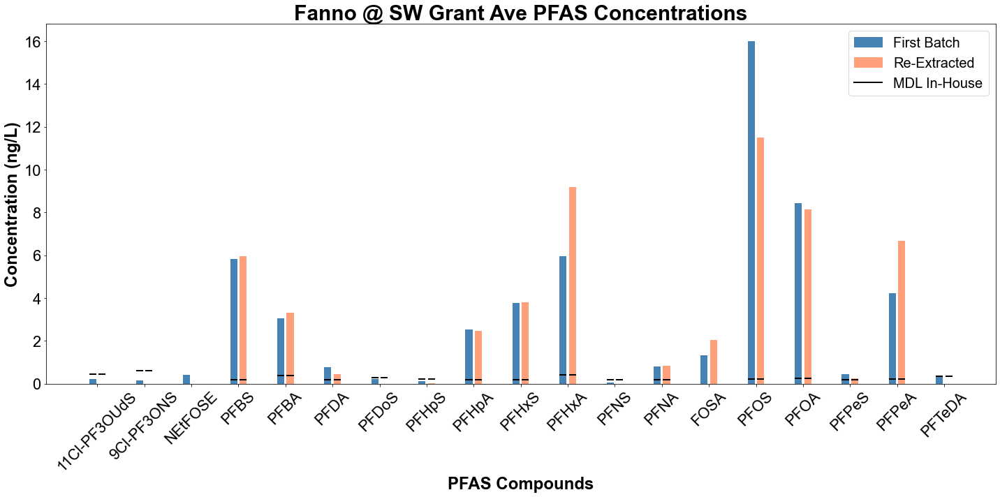

Processing location: Fanno @ SW 56th Ave
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First Batch DataFrame: Index(['First Batch'], dtype='object')
Columns in Re-Extracted DataFrame: Index(['Re-Extracted'], dtype='object')
Columns in First-Batch DataFrame: Index([], dtype='object', name='Sample Location')
Columns in Re-Extracted DataFrame: Index([], dtype='object', name='Sample Location')


c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\rodriguezc\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


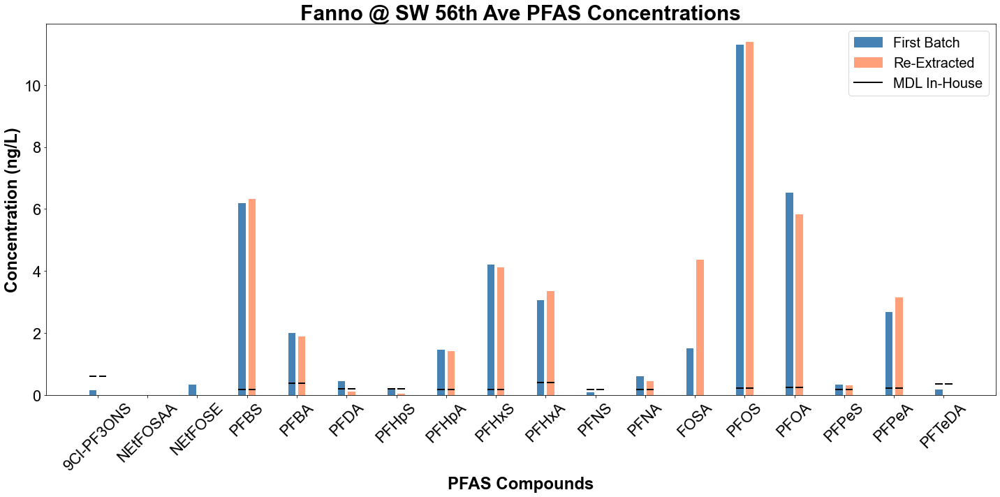

In [69]:
for location in filter_sample_location:
    process_and_plot_data_for_location(location, concat_df=data_df_unreported, filter_qual_summary=filter_qual_summary, filter_pfas_compound=data_df_unreported['PFAS Compound'].unique(), df_PFAS_Attributes=df_PFAS_Attributes,
                                       mdl_values_inhouse=MDLs_df_InHouse, mdl_values_eurofins=MDLs_df_InHouse)